EDA_experiments cont'd

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import json
import pandas_profiling
import requests
from bs4 import BeautifulSoup
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

pokemon_df = pd.read_csv('./data/pokemon_df.csv', index_col="name")
pokemon_types_df = pd.read_csv('./data/pokemon_types_df.csv', index_col="name")
pokemon_abilities_df = pd.read_csv('./data/pokemon_abilities_df.csv', index_col="name")
abilities_df = pd.read_csv('./data/abilities_df.csv', index_col="name")
moves_df = pd.read_csv('./data/moves_df.csv', index_col="name")
abilities_removed_df = pd.read_csv('./data/abilities_removed_df.csv')
abilities_removed_df = abilities_removed_df.iloc[:, 0]
abilities_removed_df.name = 'name'
pokemon_learnsets_df = pd.read_csv('./data/pokemon_learnsets_df.csv', index_col='name')

with open("smogonpokemondata2021/smogonpokemondata2021/scraped_data/PokemonData2021.csv", encoding="utf8") as infile:
    strategydex_df = pd.read_csv(infile)

strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<p>.+?<\/p>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<section>.+?<\/section>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<h1>.+?<\/h1>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('\\\\n', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace("\'", '\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('King\"s', "King\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Maki\"s', "Maki\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Land\"s', "Land\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Dragon\"s', "Dragon\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Sirfetch\"d', "Sirfetch\'d")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Farfetch\"d', "Farfetch\'d")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Nature\"s', "Nature\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Forest\"s', "Forest\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('drampa\"s', "drampa\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('False', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('True', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('None', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('\"\"\"\s', '\"', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<ul>.+?<\/ul', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Swipe', 'False Swipe') #newline
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Surrender', 'False Surrender') #newline
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].apply(json.loads)

acceptable_formats = pokemon_df['formats'].unique().tolist()
acceptable_formats.append('ZU')

strategies_dict = {}
strategydexcopy = strategydex_df.copy()

for pokemon in pokemon_df.index:
    pokemon_access = pokemon.replace("'", "").replace(" ", "-").replace(".", "").replace("-10%", "").replace(":", "")
    dex_entry = strategydexcopy.loc[strategydexcopy['pokemonName'] == pokemon_access.lower(), 'pokemonData'].item()
    format_list = []
    for competitive_format in dex_entry['strategies']:
        format_dict = {}
        current_format = competitive_format['format']
        if current_format in acceptable_formats:
            moveset_list = []
            for moveset in competitive_format['movesets']:
                moveset_dict = {}
                moveset_name = moveset['name']
                move_list = []
                for move in moveset['moveslots']:
                    for entry in move:
                        move_list.append(entry['move'])
                moveset_dict[moveset_name] = move_list
                moveset_dict["abilities"] = moveset['abilities']
                moveset_list.append(moveset_dict)
            format_dict[current_format] = moveset_list
            format_list.append(format_dict)
    strategies_dict[pokemon] = format_list

pokemon_df.loc[pokemon_df['formats'] == 'LC', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'NFE', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'Untiered', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'PUBL', 'formats'] = 'NU'
pokemon_df.loc[pokemon_df['formats'] == 'NUBL', 'formats'] = 'RU'
pokemon_df.loc[pokemon_df['formats'] == 'RUBL', 'formats'] = 'UU'
pokemon_df.loc[pokemon_df['formats'] == 'UUBL', 'formats'] = 'OU'

ranked_formats = ['Uber', 'OU', 'UU', 'RU', 'NU', 'PU', 'ZU']

tierchange_df = pd.DataFrame(index=pokemon_df.index, columns=['Tier', 'Change'])
tierchange_df['Tier'] = pokemon_df['formats']

for pokemon, formatlist in strategies_dict.items():
    possible_tiers = []
    for formatdict in formatlist:
        for key in formatdict.keys():
            possible_tiers.append(key)
    best_tier = tierchange_df.loc[pokemon, 'Tier']
    if best_tier == 'OU':
        if 'Uber' in possible_tiers:
            best_tier = 'Uber'
    elif best_tier == 'UU':
        if 'Uber' in possible_tiers:
            best_tier = 'Uber'
        elif 'OU' in possible_tiers:
            best_tier = 'OU'
    elif best_tier == 'RU':
        if 'UU' in possible_tiers:
            best_tier = 'UU'
    elif best_tier == 'NU':
        if 'UU' in possible_tiers:
            best_tier = 'UU'
        elif 'RU' in possible_tiers:
            best_tier = 'RU'
    elif best_tier == 'PU':
        if 'NU' in possible_tiers:
            best_tier = 'NU'
    elif best_tier == 'ZU':
        if 'NU' in possible_tiers:
            best_tier = 'NU'
        elif 'PU' in possible_tiers:
            best_tier = 'PU'
    tierchange_df.loc[pokemon, 'Change'] = best_tier

tierchange_df.loc['Tentacruel', 'Change'] = 'UU'
tierchange_df.loc['Zygarde-10%', 'Change'] = 'UU'
tierchange_df.loc['Tapu Bulu', 'Change'] = 'OU'
tierchange_df.loc['Slurpuff', 'Change'] = 'RU'
tierchange_df.loc['Inteleon', 'Change'] = 'NU'
tierchange_df.loc['Mudsdale', 'Change'] = 'NU'
tierchange_df.loc['Drapion', 'Change'] = 'NU'
tierchange_df.loc['Zoroark', 'Change'] = 'NU'
tierchange_df.loc['Glastrier', 'Change'] = 'NU'
tierchange_df.loc['Omastar', 'Change'] = 'NU'
tierchange_df.loc['Silvally-Ground', 'Change'] = 'NU'
tierchange_df.loc['Silvally-Fairy', 'Change'] = 'PU'
tierchange_df.loc['Hitmonlee', 'Change'] = 'PU'
tierchange_df.loc['Charizard', 'Change'] = 'PU'
tierchange_df.loc['Sneasel', 'Change'] = 'PU'
tierchange_df.loc['Rotom', 'Change'] = 'PU'
tierchange_df.loc['Stunfisk-Galar', 'Change'] = 'PU'
tierchange_df.loc['Centiskorch', 'Change'] = 'PU'

pokemon_df['formats'] = tierchange_df['Change']

r = requests.get('https://bulbapedia.bulbagarden.net/wiki/Type')
html_doc = r.text
soup = BeautifulSoup(html_doc)

type_table = soup.find_all('table')[1]
type_rows = type_table.find_all('tr')
type_list = []

for th in type_rows[1].find_all('th'):
    type_prep = th.a.get('href')
    type_list.append(type_prep.replace('/wiki/', '').replace('_(type)', ''))

type_matchups = pd.DataFrame(index=type_list, columns=type_list)

for i1, tr in enumerate(type_rows[2:20]):
    for i2, td in enumerate(tr.find_all('td')):
        type_matchups.iloc[i1, i2] = float(td.contents[0][0].replace('½', '0.5'))
        
type_matchups.index.rename('Attacking', inplace=True)
type_matchups.columns.rename('Defending', inplace=True)
pokemon_types_matchups = pd.DataFrame(1, index=pokemon_types_df.index, columns=type_matchups.columns.rename(''))

for column in pokemon_types_df.columns:
    type_matchup = type_matchups[column]
    type_filter = pokemon_types_df[column] == 1
    pokemon_types_matchups[type_filter] = pokemon_types_matchups[type_filter] * type_matchup
    
pokemon_types_summary = pd.DataFrame(index=pokemon_types_matchups.index, columns=['2', '4', '0.5', '0.25', '0'])
for column in pokemon_types_summary.columns:
    pokemon_types_summary[column] = (pokemon_types_matchups == float(column)).sum(axis=1)
    
pokemon_types_summary.columns = ['Weaknesses', 'Strong Weaknesses', 'Resists', 'Strong Resists', 'Immune']
pokemon_types_summary['STAB'] = pokemon_types_df.sum(axis=1)
pokemon_types_summary['Resistance Index'] = pokemon_types_summary['Resists'] + 2*pokemon_types_summary['Strong Resists'] + 4*pokemon_types_summary['Immune'] - pokemon_types_summary['Weaknesses'] - 2*pokemon_types_summary['Strong Weaknesses']

roles_dict = {}
for pokemon, formatlist in strategies_dict.items():
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                role_dict = {}
                role_dict['name'] = pokemon
                role_dict['format'] = formatkey
                role_dict['abilities'] = moveset['abilities']
                role = [name for name in moveset.keys() if name != 'abilities'][0]
                role_dict['moveset'] = moveset[role]
                if role not in roles_dict.keys():
                    roles_dict[role] = [role_dict]
                else:
                    roles_dict[role].append(role_dict)
                    
roles_list = sorted(list(roles_dict.keys()))

pokemon_learnsets_df['Acid Armor'] = pokemon_learnsets_df['Acid Armor'] + pokemon_learnsets_df['Iron Defense']
pokemon_learnsets_df.drop('Iron Defense', inplace=True, axis=1)
pokemon_learnsets_df['Agility'] = pokemon_learnsets_df['Agility'] + pokemon_learnsets_df['Rock Polish']
pokemon_learnsets_df.drop('Rock Polish', inplace=True, axis=1)
pokemon_learnsets_df['Charm'] = pokemon_learnsets_df['Charm'] + pokemon_learnsets_df['Feather Dance']
pokemon_learnsets_df.drop('Feather Dance', inplace=True, axis=1)
pokemon_learnsets_df['Smokescreen'] = pokemon_learnsets_df['Smokescreen'] + pokemon_learnsets_df['Sand Attack']
pokemon_learnsets_df.drop('Sand Attack', inplace=True, axis=1)
pokemon_learnsets_df['Heal Pulse'] = pokemon_learnsets_df['Heal Pulse'] + pokemon_learnsets_df['Floral Healing']
pokemon_learnsets_df.drop('Floral Healing', inplace=True, axis=1)
pokemon_learnsets_df['Leer'] = pokemon_learnsets_df['Leer'] + pokemon_learnsets_df['Tail Whip']
pokemon_learnsets_df.drop('Tail Whip', inplace=True, axis=1)
pokemon_learnsets_df['Lock-On'] = pokemon_learnsets_df['Lock-On'] + pokemon_learnsets_df['Mind Reader']
pokemon_learnsets_df.drop('Mind Reader', inplace=True, axis=1)
pokemon_learnsets_df['Block'] = pokemon_learnsets_df['Block'] + pokemon_learnsets_df['Mean Look']
pokemon_learnsets_df.drop('Mean Look', inplace=True, axis=1)
pokemon_learnsets_df['Lunar Dance'] = pokemon_learnsets_df['Lunar Dance'] + pokemon_learnsets_df['Healing Wish']
pokemon_learnsets_df.drop('Healing Wish', inplace=True, axis=1)
pokemon_learnsets_df['Moonlight'] = pokemon_learnsets_df['Moonlight'] + pokemon_learnsets_df['Morning Sun'] + pokemon_learnsets_df['Synthesis']
pokemon_learnsets_df.drop(['Morning Sun', 'Synthesis'], inplace=True, axis=1)
pokemon_learnsets_df['Recover'] = pokemon_learnsets_df['Recover'] + pokemon_learnsets_df['Soft-Boiled'] + pokemon_learnsets_df['Milk Drink'] + pokemon_learnsets_df['Slack Off']
pokemon_learnsets_df.drop(['Soft-Boiled', 'Milk Drink', 'Slack Off'], inplace=True, axis=1)
pokemon_learnsets_df['Trick'] = pokemon_learnsets_df['Trick'] + pokemon_learnsets_df['Switcheroo']
pokemon_learnsets_df.drop('Switcheroo', inplace=True, axis=1)

pokemon_learnsets_df.where(pokemon_learnsets_df <= 1, 1, inplace=True)
        
dup_moves = ['Acid Armor', 'Iron Defense', 'Rock Polish', 'Agility', 'Charm', 'Feather Dance', 'Smokescreen', 'Sand Attack', 'Heal Pulse', 'Floral Healing', 'Leer', 'Tail Whip', 'Lock-On', 'Mind Reader', 'Mean Look', 'Block', 'Healing Wish', 'Lunar Dance', 'Moonlight', 'Morning Sun', 'Synthesis', 'Recover', 'Soft-Boiled', 'Milk Drink', 'Slack Off', 'Trick', 'Switcheroo']

dup_moves_df = pd.DataFrame(index=dup_moves, columns=['collapse'])
dup_moves_df.loc[['Acid Armor', 'Iron Defense'], 'collapse'] = 'Acid Armor'
dup_moves_df.loc[['Rock Polish', 'Agility'], 'collapse'] = 'Agility'
dup_moves_df.loc[['Charm', 'Feather Dance'], 'collapse'] = 'Charm'
dup_moves_df.loc[['Smokescreen', 'Sand Attack'], 'collapse'] = 'Smokescreen'
dup_moves_df.loc[['Heal Pulse', 'Floral Healing'], 'collapse'] = 'Heal Pulse'
dup_moves_df.loc[['Leer', 'Tail Whip'], 'collapse'] = 'Leer'
dup_moves_df.loc[['Lock-On', 'Mind Reader'], 'collapse'] = 'Lock-On'
dup_moves_df.loc[['Mean Look', 'Block'], 'collapse'] = 'Block'
dup_moves_df.loc[['Healing Wish', 'Lunar Dance'], 'collapse'] = 'Lunar Dance'
dup_moves_df.loc[['Moonlight', 'Morning Sun', 'Synthesis'], 'collapse'] = 'Moonlight'
dup_moves_df.loc[['Recover', 'Soft-Boiled', 'Milk Drink', 'Slack Off'], 'collapse'] = 'Recover'
dup_moves_df.loc[['Trick', 'Switcheroo'], 'collapse'] = 'Trick'

pokemon_abilities_df['Air Lock'] = pokemon_abilities_df['Air Lock'] + pokemon_abilities_df['Cloud Nine']
pokemon_abilities_df.drop('Cloud Nine', inplace=True, axis=1)
pokemon_abilities_df['Shell Armor'] = pokemon_abilities_df['Battle Armor'] + pokemon_abilities_df['Shell Armor']
pokemon_abilities_df.drop('Battle Armor', inplace=True, axis=1)
pokemon_abilities_df['Clear Body'] = pokemon_abilities_df['Clear Body'] + pokemon_abilities_df['White Smoke'] + pokemon_abilities_df['Full Metal Body']
pokemon_abilities_df.drop(['White Smoke', 'Full Metal Body'], inplace=True, axis=1)
pokemon_abilities_df['Filter'] = pokemon_abilities_df['Filter'] + pokemon_abilities_df['Solid Rock'] + pokemon_abilities_df['Prism Armor']
pokemon_abilities_df.drop(['Solid Rock', 'Prism Armor'], inplace=True, axis=1)
pokemon_abilities_df['Gooey'] = pokemon_abilities_df['Gooey'] + pokemon_abilities_df['Tangling Hair']
pokemon_abilities_df.drop('Tangling Hair', inplace=True, axis=1)
pokemon_abilities_df['Insomnia'] = pokemon_abilities_df['Insomnia'] + pokemon_abilities_df['Vital Spirit']
pokemon_abilities_df.drop('Vital Spirit', inplace=True, axis=1)
pokemon_abilities_df['Teravolt'] = pokemon_abilities_df['Mold Breaker'] + pokemon_abilities_df['Teravolt'] + pokemon_abilities_df['Turboblaze']
pokemon_abilities_df.drop(['Mold Breaker', 'Turboblaze'], inplace=True, axis=1)
pokemon_abilities_df['Moxie'] = pokemon_abilities_df['Moxie'] + pokemon_abilities_df['Chilling Neigh']
pokemon_abilities_df.drop('Chilling Neigh', inplace=True, axis=1)
pokemon_abilities_df['Multiscale'] = pokemon_abilities_df['Multiscale'] + pokemon_abilities_df['Shadow Shield']
pokemon_abilities_df.drop('Shadow Shield', inplace=True, axis=1)
pokemon_abilities_df['Stalwart'] = pokemon_abilities_df['Propeller Tail'] + pokemon_abilities_df['Stalwart']
pokemon_abilities_df.drop('Propeller Tail', inplace=True, axis=1)
pokemon_abilities_df['Rough Skin'] = pokemon_abilities_df['Rough Skin'] + pokemon_abilities_df['Iron Barbs']
pokemon_abilities_df.drop('Iron Barbs', inplace=True, axis=1)
pokemon_abilities_df['Wimp Out'] = pokemon_abilities_df['Wimp Out'] + pokemon_abilities_df['Emergency Exit']
pokemon_abilities_df.drop('Emergency Exit', inplace=True, axis=1)

pokemon_abilities_df.where(pokemon_abilities_df <= 1, 1, inplace=True)

dup_abilities= ['Air Lock', 'Cloud Nine', 'Battle Armor', 'Shell Armor', 'Clear Body', 'White Smoke', 'Full Metal Body', 'Filter', 'Solid Rock', 'Prism Armor', 'Gooey', 'Tangling Hair', 'Insomnia', 'Vital Spirit', 'Mold Breaker', 'Teravolt', 'Turboblaze', 'Moxie', 'Chilling Neigh', 'Multiscale', 'Shadow Shield', 'Propeller Tail', 'Stalwart', 'Rough Skin', 'Iron Barbs', 'Wimp Out', 'Emergency Exit']

dup_abilities_df = pd.DataFrame(index=dup_abilities, columns=['collapse'])
dup_abilities_df.loc[['Air Lock', 'Cloud Nine'], 'collapse'] = 'Air Lock'
dup_abilities_df.loc[['Battle Armor', 'Shell Armor'], 'collapse'] = 'Shell Armor'
dup_abilities_df.loc[['Clear Body', 'White Smoke', 'Full Metal Body'], 'collapse'] = 'Clear Body'
dup_abilities_df.loc[['Filter', 'Solid Rock', 'Prism Armor'], 'collapse'] = 'Filter'
dup_abilities_df.loc[['Gooey', 'Tangling Hair'], 'collapse'] = 'Gooey'
dup_abilities_df.loc[['Insomnia', 'Vital Spirit'], 'collapse'] = 'Insomnia'
dup_abilities_df.loc[['Mold Breaker', 'Teravolt', 'Turboblaze'], 'collapse'] = 'Teravolt'
dup_abilities_df.loc[['Moxie', 'Chilling Neigh'], 'collapse'] = 'Moxie'
dup_abilities_df.loc[['Multiscale', 'Shadow Shield'], 'collapse'] = 'Multiscale'
dup_abilities_df.loc[['Propeller Tail', 'Stalwart'], 'collapse'] = 'Stalwart'
dup_abilities_df.loc[['Rough Skin', 'Iron Barbs'], 'collapse'] = 'Rough Skin'
dup_abilities_df.loc[['Wimp Out', 'Emergency Exit'], 'collapse'] = 'Wimp Out'

PCAattempt1_df = pokemon_df.merge(pokemon_types_summary, on='name')
PCAattempt1_df = PCAattempt1_df.merge(pokemon_abilities_df, on='name')
PCAattempt1_df = PCAattempt1_df.merge(pokemon_learnsets_df, on='name')
PCAattempt1_nonnumeric = PCAattempt1_df.select_dtypes(include='object', exclude='number')
PCAattempt1_numeric = PCAattempt1_df.select_dtypes(include='number')
PCAattempt1_columns = PCAattempt1_numeric.columns
PCAattempt1_scaled = scale(PCAattempt1_numeric)
PCAattempt1_df_scaled = pd.DataFrame(PCAattempt1_scaled, index=pokemon_df.index, columns=PCAattempt1_columns)
PCAattempt1_fit = PCA().fit(PCAattempt1_df_scaled)

cindex_dict = strategies_dict.copy()
pokemon_noncompetitive = []

for pokemon, formatlist in strategies_dict.items():
    if formatlist == []:
        pokemon_noncompetitive.append(pokemon)
        cindex_dict.pop(pokemon)
    else:
        current_pokemon_formats = []
        for formatdict in formatlist:
            formatkey = next(iter(formatdict))
            if formatkey in ranked_formats:
                current_pokemon_formats.append(formatkey)
        if current_pokemon_formats == []:
            pokemon_noncompetitive.append(pokemon)
            cindex_dict.pop(pokemon)
            
moves_cindex = pd.DataFrame(0, index=pokemon_learnsets_df.columns, columns=['n_learnset', 'n_competitive', 'cindex'])

for pokemon, formatlist in cindex_dict.items():
    already_checked = []
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                moveset_name = [name for name in moveset.keys() if name != 'abilities'][0]
                for move in moveset[moveset_name]:
                    if move in dup_moves:
                        move = dup_moves_df.loc[move, 'collapse']
                    if move not in already_checked:
                        moves_cindex.loc[move, 'n_competitive'] += 1
                        already_checked.append(move)
                        
for move in pokemon_learnsets_df.columns:
    moves_cindex.loc[move, 'n_learnset'] = pokemon_learnsets_df.drop(index=pokemon_noncompetitive)[move].sum()
    
for move in moves_cindex.index:
    moves_cindex.loc[move, 'power'] = moves_df.loc[move, 'power']
    moves_cindex.loc[move, 'type'] = moves_df.loc[move, 'type']
    moves_cindex.loc[move, 'category'] = moves_df.loc[move, 'category']

moves_cindex['cindex'] = 100*(moves_cindex['n_competitive'] / moves_cindex['n_learnset'])

shrinkfeatures_df = pd.DataFrame(index=pokemon_df.index)

#Utility: Entry Hazards
shrinkfeatures_df['Entry Hazards'] = pokemon_learnsets_df.loc[:, ['Spikes', 'Toxic Spikes', 'Stealth Rock', 'Sticky Web']].sum(axis=1)
moves_cindex.drop(index=['Spikes', 'Toxic Spikes', 'Stealth Rock', 'Sticky Web'], inplace=True)
shrinkfeatures_df['Taunt'] = pokemon_learnsets_df['Taunt']
moves_cindex.drop(index='Taunt', inplace=True)

#Utility: Hazard Control (pd.where is being used to one-hot encode here)
shrinkfeatures_df['Hazard Removal'] = pokemon_learnsets_df.loc[:, ['Rapid Spin', 'Defog']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Hazard Removal'].where(shrinkfeatures_df['Hazard Removal'] <= 1, 1, inplace=True)
moves_cindex.drop(index=['Rapid Spin', 'Defog'], inplace=True)
shrinkfeatures_df['Removal Deterrent'] = pokemon_abilities_df.loc[:, ['Magic Bounce', 'Defiant', 'Contrary', 'Competitive']].sum(axis=1) + pokemon_types_df['Ghost']
shrinkfeatures_df.loc[:, 'Removal Deterrent'].where(shrinkfeatures_df['Removal Deterrent'] <= 1, 1, inplace=True)

#Utility: Clerics and Wish
shrinkfeatures_df['Party Heal'] = pokemon_learnsets_df.loc[:, ['Heal Bell', 'Aromatherapy']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Party Heal'].where(shrinkfeatures_df['Party Heal'] <= 1, 1, inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Jungle Healing'] == 1, 'Party Heal'] = 2
moves_cindex.drop(index=['Heal Bell', 'Aromatherapy', 'Jungle Healing'], inplace=True)
shrinkfeatures_df['Setup Support'] = pokemon_learnsets_df['Lunar Dance']
moves_cindex.drop(index='Lunar Dance', inplace=True)
shrinkfeatures_df['Wish'] = pokemon_learnsets_df['Wish']
moves_cindex.drop(index='Wish', inplace=True)
shrinkfeatures_df['Cleric'] = shrinkfeatures_df.loc[:, ['Party Heal', 'Setup Support', 'Wish']].sum(axis=1)
shrinkfeatures_df.drop(columns=['Party Heal', 'Setup Support', 'Wish'], inplace=True)

#Utility: Sleep
shrinkfeatures_df['Sleep'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Sing'] == 1, 'Sleep'] = 1
moves_cindex.drop(index='Sing', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Hypnosis'] == 1, 'Sleep'] = 2
moves_cindex.drop(index='Hypnosis', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Sleep Powder'] == 1, 'Sleep'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Lovely Kiss'] == 1, 'Sleep'] = 3
moves_cindex.drop(index=['Sleep Powder', 'Lovely Kiss'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Spore'] == 1, 'Sleep'] = 4
moves_cindex.drop(index=['Spore'], inplace=True)

#Utility: Pivot
shrinkfeatures_df['Pivot'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Teleport'] == 1, 'Pivot'] = 1
moves_cindex.drop(index='Teleport', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Parting Shot'] == 1, 'Pivot'] = 2
moves_cindex.drop(index='Parting Shot', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['U-turn'] == 1, 'Pivot'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Volt Switch'] == 1, 'Pivot'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Flip Turn'] == 1, 'Pivot'] = 3
moves_cindex.drop(index=['U-turn', 'Volt Switch', 'Flip Turn'], inplace=True)

#Utility: Item Removal
shrinkfeatures_df['Item Removal'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Corrosive Gas'] == 1, 'Item Removal'] = 1
moves_cindex.drop(index='Corrosive Gas', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Knock Off'] == 1, 'Item Removal'] = 2
moves_cindex.drop(index='Knock Off', inplace=True)

#Utility: Paralyze
shrinkfeatures_df['Paralyze'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Stun Spore'] == 1, 'Paralyze'] = 1
moves_cindex.drop(index='Stun Spore', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Thunder Wave'] == 1, 'Paralyze'] = 2
moves_cindex.drop(index='Thunder Wave', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Glare'] == 1, 'Paralyze'] = 3
moves_cindex.drop(index='Glare', inplace=True)

#Utility: Burn
shrinkfeatures_df['Burn'] = pokemon_learnsets_df['Will-O-Wisp']
moves_cindex.drop(index='Will-O-Wisp', inplace=True)

#Utility: Toxic
shrinkfeatures_df['Toxic'] = pokemon_learnsets_df['Toxic']
moves_cindex.drop(index='Toxic', inplace=True)

#Utility: Trick
shrinkfeatures_df['Trick'] = pokemon_learnsets_df['Trick']
moves_cindex.drop(index='Trick', inplace=True)

#Utility: Phaze (dropping from cindex loses too much info about differences)
shrinkfeatures_df['Phaze'] = pokemon_learnsets_df.loc[:, ['Circle Throw', 'Dragon Tail', 'Whirlwind', 'Roar', 'Yawn', 'Perish Song', 'Haze', 'Clear Smog', 'Destiny Bond', 'Encore']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Phaze'].where(shrinkfeatures_df['Phaze'] <= 1, 1, inplace=True)

#Utility: Screens
shrinkfeatures_df['Screens'] = pokemon_learnsets_df.loc[:, ['Reflect', 'Light Screen']].sum(axis=1)
moves_cindex.drop(index=['Reflect', 'Light Screen'], inplace=True)

#Utility: Tailwind
shrinkfeatures_df['Tailwind'] = pokemon_learnsets_df['Tailwind']
moves_cindex.drop(index='Tailwind', inplace=True)

#Utility: Trapper
#was going to remove from cindex, that leaves some pokemon without abilities!
#and it severely misleads about the strength of abilities for a pokemon
#removing from moves is less important as they are far less scarce
#and we're mainly measuring them in terms of offense or general "status"
shrinkfeatures_df['Trapper'] = pokemon_abilities_df.loc[:, ['Arena Trap', 'Magnet Pull', 'Shadow Tag']].sum(axis=1)

#Utility: Status Absorber
shrinkfeatures_df['Status Absorber'] = pokemon_abilities_df.loc[:, ['Natural Cure', 'Shed Skin']].sum(axis=1)

#Utility: Unaware
shrinkfeatures_df['Unaware'] = pokemon_abilities_df['Unaware']

#Offensive: Setup
shrinkfeatures_df['Setup'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Acid Armor'] == 1, 'Setup'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Work Up'] == 1, 'Setup'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Amnesia'] == 1, 'Setup'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Hone Claws'] == 1, 'Setup'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Curse'] == 1, 'Setup'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Power-Up Punch'] == 1, 'Setup'] = 1
moves_cindex.drop(index=['Acid Armor', 'Work Up', 'Amnesia', 'Hone Claws', 'Curse', 'Power-Up Punch'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Flame Charge'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Belly Drum'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Autotomize'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Calm Mind'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Bulk Up'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Cotton Guard'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Meteor Beam'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Cosmic Power'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Growth'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Agility'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Sniper'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Weak Armor'] == 1, 'Setup'] = 2
moves_cindex.drop(index=['Flame Charge', 'Belly Drum', 'Autotomize', 'Calm Mind', 'Bulk Up', 'Cotton Guard', 'Meteor Beam', 'Cosmic Power', 'Agility'], inplace=True) #can't remove growth because I'll need it for weather
shrinkfeatures_df.loc[pokemon_learnsets_df['Swords Dance'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Coil'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Nasty Plot'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Shift Gear'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Dragon Dance'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Unburden'] == 1, 'Setup'] = 3
moves_cindex.drop(index=['Swords Dance', 'Coil', 'Nasty Plot', 'Shift Gear', 'Dragon Dance'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Shell Smash'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Quiver Dance'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['No Retreat'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Geomancy'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Clangorous Soul'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Guts'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Speed Boost'] == 1, 'Setup'] = 4
moves_cindex.drop(index=['Shell Smash', 'Quiver Dance', 'No Retreat', 'Geomancy', 'Clangorous Soul'], inplace=True)

#Offensive: Priority
shrinkfeatures_df['Priority'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Fake Out'] == 1, 'Priority'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Quick Attack'] == 1, 'Priority'] = 1
moves_cindex.drop(index=['Fake Out', 'Quick Attack'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Accelerock'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Shadow Sneak'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['First Impression'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Mach Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Aqua Jet'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Bullet Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Ice Shard'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Extreme Speed'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Sucker Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Vacuum Wave'] == 1, 'Priority'] = 2
moves_cindex.drop(index=['Accelerock', 'Shadow Sneak', 'First Impression', 'Mach Punch', 'Aqua Jet', 'Bullet Punch', 'Ice Shard', 'Extreme Speed', 'Sucker Punch', 'Vacuum Wave'], inplace=True)
shrinkfeatures_df.loc[pokemon_abilities_df['Gale Wings'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Prankster'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Triage'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Technician'] == 1, 'Priority'] = 3

#Defensive: Unique Shield
shrinkfeatures_df['Unique Shield'] = pokemon_learnsets_df.loc[:, ['King\'s Shield', 'Spiky Shield', 'Obstruct']].sum(axis=1)
moves_cindex.drop(index=['King\'s Shield', 'Spiky Shield', 'Obstruct'], inplace=True)

#Defensive: HP Drain
shrinkfeatures_df['HP Drain'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Leech Life'] == 1, 'HP Drain'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Draining Kiss'] == 1, 'HP Drain'] = 1
moves_cindex.drop(index=['Leech Life', 'Draining Kiss'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Giga Drain'] == 1, 'HP Drain'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Leech Seed'] == 1, 'HP Drain'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Drain Punch'] == 1, 'HP Drain'] = 2
moves_cindex.drop(index=['Giga Drain', 'Leech Seed', 'Drain Punch'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Horn Leech'] == 1, 'HP Drain'] = 3
moves_cindex.drop(index=['Horn Leech'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Oblivion Wing'] == 1, 'HP Drain'] = 4
moves_cindex.drop(index=['Oblivion Wing'], inplace=True)

#Defensive: HP Recovery
shrinkfeatures_df['HP Recovery'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Roost'] == 1, 'HP Recovery'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Recover'] == 1, 'HP Recovery'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Moonlight'] == 1, 'HP Recovery'] = 1
moves_cindex.drop(index=['Roost', 'Recover', 'Moonlight'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Shore Up'] == 1, 'HP Recovery'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Strength Sap'] == 1, 'HP Recovery'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Regenerator'] == 1, 'HP Recovery'] = 2
moves_cindex.drop(index=['Shore Up', 'Strength Sap'], inplace=True)

#Weather (only remove moves if you'd only use them in weather)
shrinkfeatures_df['Weather Set'] = pokemon_abilities_df.loc[:, ['Drought', 'Drizzle', 'Sand Stream', 'Snow Warning', 'Grassy Surge', 'Misty Surge', 'Psychic Surge', 'Electric Surge']].sum(axis=1)
shrinkfeatures_df['Weather Speed'] = pokemon_abilities_df.loc[:, ['Chlorophyll', 'Swift Swim', 'Sand Rush', 'Slush Rush', 'Surge Surfer']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Weather Speed'].where(shrinkfeatures_df['Weather Speed'] <= 1, 1, inplace=True)
shrinkfeatures_df['Weather Gimmick'] = 0
shrinkfeatures_df.loc[pokemon_abilities_df['Ice Body'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Sand Veil'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Rain Dish'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Hydration'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Flower Gift'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Expanding Force'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Blizzard'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Solar Beam'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Nature Power'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Terrain Pulse'] == 1, 'Weather Gimmick'] = 1
moves_cindex.drop(index=['Expanding Force', 'Solar Beam', 'Nature Power', 'Terrain Pulse'], inplace=True) #won't remove Blizzard
shrinkfeatures_df.loc[pokemon_abilities_df['Snow Cloak'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Sand Force'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Leaf Guard'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Aurora Veil'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Misty Explosion'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Grassy Glide'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Growth'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Weather Ball'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Thunder'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Rising Voltage'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Solar Blade'] == 1, 'Weather Gimmick'] = 2
moves_cindex.drop(index=['Aurora Veil', 'Misty Explosion', 'Grassy Glide', 'Growth', 'Weather Ball', 'Rising Voltage', 'Solar Blade'], inplace=True) #won't remove Thunder
shrinkfeatures_df.loc[pokemon_abilities_df['Solar Power'] == 1, 'Weather Gimmick'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Hurricane'] == 1, 'Weather Gimmick'] = 3 #won't remove Hurricane
shrinkfeatures_df.loc[pokemon_abilities_df['Mimicry'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Ice Face'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Dry Skin'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df['Trick Room'] = pokemon_learnsets_df.loc[:, 'Trick Room']
moves_cindex.drop(index=['Trick Room'], inplace=True)

n_learnset = moves_cindex['n_learnset'].value_counts()
moves_cindex_distro = moves_cindex[moves_cindex['n_learnset'] > 2].copy()
moves_cindex_distro.drop(index='Multi-Attack', inplace=True)
cindex_distro = moves_cindex_distro.loc[moves_cindex_distro['cindex'] > 0, 'cindex']
power_distro = moves_cindex_distro.loc[moves_cindex_distro['power'] > 0, 'power']
cindex_distro_log = cindex_distro.apply(np.log)

abilities_cindex = pd.DataFrame(0, index=pokemon_abilities_df.columns, columns=['n_abilityset', 'n_competitive', 'cindex'])

for pokemon, formatlist in cindex_dict.items():
    already_checked = []
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                for ability in moveset['abilities']:
                    if ability in dup_abilities:
                        ability = dup_abilities_df.loc[ability, 'collapse']
                    if ability not in already_checked:
                        abilities_cindex.loc[ability, 'n_competitive'] += 1
                        already_checked.append(ability)
                        
for ability in pokemon_abilities_df.columns:
    abilities_cindex.loc[ability, 'n_abilityset'] = pokemon_abilities_df.drop(index=pokemon_noncompetitive)[ability].sum()
    
abilities_cindex.loc['Power Construct', 'n_competitive'] = 1
abilities_cindex['cindex'] = 100*(abilities_cindex['n_competitive'] / abilities_cindex['n_abilityset'])
n_abilityset = abilities_cindex['n_abilityset'].value_counts()
abilities_cindex_distro = abilities_cindex[abilities_cindex['n_abilityset'] > 1]
cindex_distro_ability = abilities_cindex_distro.loc[abilities_cindex_distro['cindex'] > 0, 'cindex']

So before I can finally make the aggregated features for the moves, I need to separate moves_cindex_distro into three separate distros, physical, special and status

In [2]:
moves_cindex_distro_phys = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Physical', :].copy()
moves_cindex_distro_phys.drop(columns='category', inplace=True)
moves_cindex_distro_spec = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Special', :].copy()
moves_cindex_distro_spec.drop(columns='category', inplace=True)
moves_cindex_distro_stat = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Non-Damaging', :].copy()
moves_cindex_distro_stat.drop(columns='category', inplace=True)

From the physical distro, we need two features (though will have more than one version of each based on the cutoffs we choose):
- The number of physical moves above a certain cindex (physical cindex)
- The number of types of physical moves above a certain move power (physical coverage)

In [3]:
moves_cindex_distro_phys.describe(percentiles = [n/20 for n in range(1, 20)])

,n_learnset,n_competitive,cindex,power
count,183.000000,183.000000,183.000000,183.000000
mean,58.497268,3.513661,8.120778,66.409836
std,58.594891,8.106339,14.330637,39.642653
min,3.000000,0.000000,0.000000,0.000000
5%,5.100000,0.000000,0.000000,0.000000
10%,7.000000,0.000000,0.000000,15.000000
15%,10.300000,0.000000,0.000000,25.000000
20%,13.400000,0.000000,0.000000,32.000000
25%,19.000000,0.000000,0.000000,40.000000
30%,23.600000,0.000000,0.000000,50.000000


- n_learnset mean: 58
- n_learnset median: 43
- n_learnset max: 411

- n_competitive mean: 3.5
- n_competitive median: 1
- n_competitive max: 72

- cindex mean: 8
- cindex median: 0.7
- cindex max: 77

- power mean: 66
- power median: 70
- power max: 250

One interesting thing is the presence of 0 powered physical moves, we should probably examine those:

In [4]:
moves_cindex_distro_phys.loc[moves_cindex_distro_phys['power'] == 0, :]

,n_learnset,n_competitive,cindex,power,type
Counter,94,1,1.063830,0.0,Fighting
Seismic Toss,62,6,9.677419,0.0,Fighting
Super Fang,18,1,5.555556,0.0,Normal
Low Kick,75,4,5.333333,0.0,Fighting
Fissure,38,0,0.000000,0.0,Ground
Guillotine,9,0,0.000000,0.0,Normal
Horn Drill,14,0,0.000000,0.0,Normal
Beat Up,31,1,3.225806,0.0,Dark
Flail,64,0,0.000000,0.0,Normal
Reversal,87,1,1.149425,0.0,Fighting


These all make sense, so they can't be considered the standard coverage of a pokemon due to power.  But, some pokemon can use moves like Heat Crash and Heavy Slam to attain good coverage if they have high weight (like Copperajah). So I might want to create another feature of high weight offensive moves to cover pokemon like that: this is only Heat Crash and Heavy Slam.

In [5]:
#Offensive: Heavy Moves
shrinkfeatures_df['Heavy Moves'] = pokemon_learnsets_df.loc[:, ['Heat Crash', 'Heavy Slam']].sum(axis=1)
moves_cindex.drop(index=['Heat Crash', 'Heavy Slam'], inplace=True)

In [6]:
#Offensive: Gyro Ball (gives slower pokemon a powerful move)
shrinkfeatures_df['Gyro Ball'] = pokemon_learnsets_df['Gyro Ball']
moves_cindex.drop(index=['Gyro Ball'], inplace=True)

Before starting over one more time, let's make sure we don't need to make any similar adjustments for special or status moves

In [7]:
moves_cindex_distro_spec.describe(percentiles = [n/20 for n in range(1, 20)])

,n_learnset,n_competitive,cindex,power
count,119.000000,119.000000,119.000000,119.000000
mean,59.789916,5.386555,10.451007,74.159664
std,69.108717,8.939637,15.085785,37.930128
min,3.000000,0.000000,0.000000,0.000000
5%,3.900000,0.000000,0.000000,0.000000
10%,4.000000,0.000000,0.000000,28.000000
15%,8.700000,0.000000,0.000000,40.000000
20%,13.200000,0.000000,0.000000,40.000000
25%,17.000000,0.000000,0.000000,50.000000
30%,21.000000,0.000000,0.000000,57.000000


In [8]:
moves_cindex_distro_spec.loc[moves_cindex_distro_spec['power'] == 0, :]

,n_learnset,n_competitive,cindex,power,type
Night Shade,19,2,10.526316,0.0,Ghost
Mirror Coat,23,0,0.000000,0.0,Psychic
Sheer Cold,11,0,0.000000,0.0,Ice
Spit Up,17,0,0.000000,0.0,Normal
Grass Knot,132,12,9.090909,0.0,Grass
Electro Ball,36,1,2.777778,0.0,Electric
Final Gambit,10,2,20.000000,0.0,Fighting
Nature's Madness,4,0,0.000000,0.0,Fairy


In [9]:
#Offensive: Electro Ball (gives faster pokemon a powerful move)
shrinkfeatures_df['Electro Ball'] = pokemon_learnsets_df['Electro Ball']
moves_cindex.drop(index=['Electro Ball'], inplace=True)

In [10]:
moves_cindex_distro_stat.describe(percentiles = [n/20 for n in range(1, 20)])

,n_learnset,n_competitive,cindex,power
count,119.000000,119.000000,119.000000,119.0
mean,71.789916,1.983193,1.826161,0.0
std,99.928778,7.294046,4.623433,0.0
min,3.000000,0.000000,0.000000,0.0
5%,4.900000,0.000000,0.000000,0.0
10%,8.800000,0.000000,0.000000,0.0
15%,11.700000,0.000000,0.000000,0.0
20%,13.000000,0.000000,0.000000,0.0
25%,17.000000,0.000000,0.000000,0.0
30%,20.000000,0.000000,0.000000,0.0


The vast majority of status moves have a 0 cindex which isn't surprising since we made so many into features, and the max for this is only about 21.  We should look at the few that don't:

In [12]:
moves_cindex_distro_stat.loc[moves_cindex_distro_stat['cindex'] > 0, :].sort_values(by='cindex')

,n_learnset,n_competitive,cindex,power,type
Endure,414,1,0.241546,0.0,Normal
Attract,299,1,0.334448,0.0,Normal
Confide,347,2,0.576369,0.0,Normal
Safeguard,143,1,0.699301,0.0,Normal
Block,95,1,1.052632,0.0,Normal
Rain Dance,265,3,1.132075,0.0,Water
Sunny Day,253,3,1.185771,0.0,Fire
Spite,76,1,1.315789,0.0,Ghost
Focus Energy,71,1,1.408451,0.0,Normal
Skill Swap,66,1,1.515152,0.0,Psychic


I may still look at the distribution for this, but the cutoffs seem pretty obvious, with a few caveats:
- Moves above protect are the best, but most are phazing moves so probably should have just been removed honestly
- Moves like protect, substitute, etc. are usable by too many pokemon to be meaningful

So, I'm going to remove the phazing moves as I should have, remove the moves that are extremely accessible, and then one-hot encode the rest as "misc status", which probably won't be a very predictive feature anyways.  I'll probably also remove Howl and Focus Energy, those are just generally weak setup features, pain split will also be a cut above in this new feature as the only "2" since it is a pretty strong move

Phazing moves to remove (except Circle Throw and Dragon Tail since those are damaging moves): ['Whirlwind', 'Roar', 'Yawn', 'Perish Song', 'Haze', 'Clear Smog', 'Destiny Bond', 'Encore']]

Indiscriminate moves to remove: Substitute, Protect, Rest, Sleep Talk, Sunny Day, Rain Dance, Confide, Attract, Endure.  I will also include Focus Energy because the only pokemon to use it is Kingdra and that's only because of Sniper which is already included in the setup feature, otherwise the move obviously isn't good enough to use

Howl can be a 1 in the setup feature and the other will all move up by 1

Memento can stay and be a 2 with pain split, since wasn't as strong as Lunar Dance/Healing Wish and thus didn't fit in that feature, that may memento still gets its chance to be at something (it doesn't really belong in a cleric feature per se anyways)

Our final fresh start:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import json
import pandas_profiling
import requests
from bs4 import BeautifulSoup
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

pokemon_df = pd.read_csv('./data/pokemon_df.csv', index_col="name")
pokemon_types_df = pd.read_csv('./data/pokemon_types_df.csv', index_col="name")
pokemon_abilities_df = pd.read_csv('./data/pokemon_abilities_df.csv', index_col="name")
abilities_df = pd.read_csv('./data/abilities_df.csv', index_col="name")
moves_df = pd.read_csv('./data/moves_df.csv', index_col="name")
abilities_removed_df = pd.read_csv('./data/abilities_removed_df.csv')
abilities_removed_df = abilities_removed_df.iloc[:, 0]
abilities_removed_df.name = 'name'
pokemon_learnsets_df = pd.read_csv('./data/pokemon_learnsets_df.csv', index_col='name')

with open("smogonpokemondata2021/smogonpokemondata2021/scraped_data/PokemonData2021.csv", encoding="utf8") as infile:
    strategydex_df = pd.read_csv(infile)

strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<p>.+?<\/p>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<section>.+?<\/section>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<h1>.+?<\/h1>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('\\\\n', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace("\'", '\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('King\"s', "King\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Maki\"s', "Maki\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Land\"s', "Land\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Dragon\"s', "Dragon\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Sirfetch\"d', "Sirfetch\'d")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Farfetch\"d', "Farfetch\'d")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Nature\"s', "Nature\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Forest\"s', "Forest\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('drampa\"s', "drampa\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('False', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('True', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('None', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('\"\"\"\s', '\"', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<ul>.+?<\/ul', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Swipe', 'False Swipe') #newline
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Surrender', 'False Surrender') #newline
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].apply(json.loads)

acceptable_formats = pokemon_df['formats'].unique().tolist()
acceptable_formats.append('ZU')

strategies_dict = {}
strategydexcopy = strategydex_df.copy()

for pokemon in pokemon_df.index:
    pokemon_access = pokemon.replace("'", "").replace(" ", "-").replace(".", "").replace("-10%", "").replace(":", "")
    dex_entry = strategydexcopy.loc[strategydexcopy['pokemonName'] == pokemon_access.lower(), 'pokemonData'].item()
    format_list = []
    for competitive_format in dex_entry['strategies']:
        format_dict = {}
        current_format = competitive_format['format']
        if current_format in acceptable_formats:
            moveset_list = []
            for moveset in competitive_format['movesets']:
                moveset_dict = {}
                moveset_name = moveset['name']
                move_list = []
                for move in moveset['moveslots']:
                    for entry in move:
                        move_list.append(entry['move'])
                moveset_dict[moveset_name] = move_list
                moveset_dict["abilities"] = moveset['abilities']
                moveset_list.append(moveset_dict)
            format_dict[current_format] = moveset_list
            format_list.append(format_dict)
    strategies_dict[pokemon] = format_list

pokemon_df.loc[pokemon_df['formats'] == 'LC', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'NFE', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'Untiered', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'PUBL', 'formats'] = 'NU'
pokemon_df.loc[pokemon_df['formats'] == 'NUBL', 'formats'] = 'RU'
pokemon_df.loc[pokemon_df['formats'] == 'RUBL', 'formats'] = 'UU'
pokemon_df.loc[pokemon_df['formats'] == 'UUBL', 'formats'] = 'OU'

ranked_formats = ['Uber', 'OU', 'UU', 'RU', 'NU', 'PU', 'ZU']

tierchange_df = pd.DataFrame(index=pokemon_df.index, columns=['Tier', 'Change'])
tierchange_df['Tier'] = pokemon_df['formats']

for pokemon, formatlist in strategies_dict.items():
    possible_tiers = []
    for formatdict in formatlist:
        for key in formatdict.keys():
            possible_tiers.append(key)
    best_tier = tierchange_df.loc[pokemon, 'Tier']
    if best_tier == 'OU':
        if 'Uber' in possible_tiers:
            best_tier = 'Uber'
    elif best_tier == 'UU':
        if 'Uber' in possible_tiers:
            best_tier = 'Uber'
        elif 'OU' in possible_tiers:
            best_tier = 'OU'
    elif best_tier == 'RU':
        if 'UU' in possible_tiers:
            best_tier = 'UU'
    elif best_tier == 'NU':
        if 'UU' in possible_tiers:
            best_tier = 'UU'
        elif 'RU' in possible_tiers:
            best_tier = 'RU'
    elif best_tier == 'PU':
        if 'NU' in possible_tiers:
            best_tier = 'NU'
    elif best_tier == 'ZU':
        if 'NU' in possible_tiers:
            best_tier = 'NU'
        elif 'PU' in possible_tiers:
            best_tier = 'PU'
    tierchange_df.loc[pokemon, 'Change'] = best_tier

tierchange_df.loc['Tentacruel', 'Change'] = 'UU'
tierchange_df.loc['Zygarde-10%', 'Change'] = 'UU'
tierchange_df.loc['Tapu Bulu', 'Change'] = 'OU'
tierchange_df.loc['Slurpuff', 'Change'] = 'RU'
tierchange_df.loc['Inteleon', 'Change'] = 'NU'
tierchange_df.loc['Mudsdale', 'Change'] = 'NU'
tierchange_df.loc['Drapion', 'Change'] = 'NU'
tierchange_df.loc['Zoroark', 'Change'] = 'NU'
tierchange_df.loc['Glastrier', 'Change'] = 'NU'
tierchange_df.loc['Omastar', 'Change'] = 'NU'
tierchange_df.loc['Silvally-Ground', 'Change'] = 'NU'
tierchange_df.loc['Silvally-Fairy', 'Change'] = 'PU'
tierchange_df.loc['Hitmonlee', 'Change'] = 'PU'
tierchange_df.loc['Charizard', 'Change'] = 'PU'
tierchange_df.loc['Sneasel', 'Change'] = 'PU'
tierchange_df.loc['Rotom', 'Change'] = 'PU'
tierchange_df.loc['Stunfisk-Galar', 'Change'] = 'PU'
tierchange_df.loc['Centiskorch', 'Change'] = 'PU'

pokemon_df['formats'] = tierchange_df['Change']

r = requests.get('https://bulbapedia.bulbagarden.net/wiki/Type')
html_doc = r.text
soup = BeautifulSoup(html_doc)

type_table = soup.find_all('table')[1]
type_rows = type_table.find_all('tr')
type_list = []

for th in type_rows[1].find_all('th'):
    type_prep = th.a.get('href')
    type_list.append(type_prep.replace('/wiki/', '').replace('_(type)', ''))

type_matchups = pd.DataFrame(index=type_list, columns=type_list)

for i1, tr in enumerate(type_rows[2:20]):
    for i2, td in enumerate(tr.find_all('td')):
        type_matchups.iloc[i1, i2] = float(td.contents[0][0].replace('½', '0.5'))
        
type_matchups.index.rename('Attacking', inplace=True)
type_matchups.columns.rename('Defending', inplace=True)
pokemon_types_matchups = pd.DataFrame(1, index=pokemon_types_df.index, columns=type_matchups.columns.rename(''))

for column in pokemon_types_df.columns:
    type_matchup = type_matchups[column]
    type_filter = pokemon_types_df[column] == 1
    pokemon_types_matchups[type_filter] = pokemon_types_matchups[type_filter] * type_matchup
    
pokemon_types_summary = pd.DataFrame(index=pokemon_types_matchups.index, columns=['2', '4', '0.5', '0.25', '0'])
for column in pokemon_types_summary.columns:
    pokemon_types_summary[column] = (pokemon_types_matchups == float(column)).sum(axis=1)
    
pokemon_types_summary.columns = ['Weaknesses', 'Strong Weaknesses', 'Resists', 'Strong Resists', 'Immune']
pokemon_types_summary['STAB'] = pokemon_types_df.sum(axis=1)
pokemon_types_summary['Resistance Index'] = pokemon_types_summary['Resists'] + 2*pokemon_types_summary['Strong Resists'] + 4*pokemon_types_summary['Immune'] - pokemon_types_summary['Weaknesses'] - 2*pokemon_types_summary['Strong Weaknesses']

roles_dict = {}
for pokemon, formatlist in strategies_dict.items():
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                role_dict = {}
                role_dict['name'] = pokemon
                role_dict['format'] = formatkey
                role_dict['abilities'] = moveset['abilities']
                role = [name for name in moveset.keys() if name != 'abilities'][0]
                role_dict['moveset'] = moveset[role]
                if role not in roles_dict.keys():
                    roles_dict[role] = [role_dict]
                else:
                    roles_dict[role].append(role_dict)
                    
roles_list = sorted(list(roles_dict.keys()))

pokemon_learnsets_df['Acid Armor'] = pokemon_learnsets_df['Acid Armor'] + pokemon_learnsets_df['Iron Defense']
pokemon_learnsets_df.drop('Iron Defense', inplace=True, axis=1)
pokemon_learnsets_df['Agility'] = pokemon_learnsets_df['Agility'] + pokemon_learnsets_df['Rock Polish']
pokemon_learnsets_df.drop('Rock Polish', inplace=True, axis=1)
pokemon_learnsets_df['Charm'] = pokemon_learnsets_df['Charm'] + pokemon_learnsets_df['Feather Dance']
pokemon_learnsets_df.drop('Feather Dance', inplace=True, axis=1)
pokemon_learnsets_df['Smokescreen'] = pokemon_learnsets_df['Smokescreen'] + pokemon_learnsets_df['Sand Attack']
pokemon_learnsets_df.drop('Sand Attack', inplace=True, axis=1)
pokemon_learnsets_df['Heal Pulse'] = pokemon_learnsets_df['Heal Pulse'] + pokemon_learnsets_df['Floral Healing']
pokemon_learnsets_df.drop('Floral Healing', inplace=True, axis=1)
pokemon_learnsets_df['Leer'] = pokemon_learnsets_df['Leer'] + pokemon_learnsets_df['Tail Whip']
pokemon_learnsets_df.drop('Tail Whip', inplace=True, axis=1)
pokemon_learnsets_df['Lock-On'] = pokemon_learnsets_df['Lock-On'] + pokemon_learnsets_df['Mind Reader']
pokemon_learnsets_df.drop('Mind Reader', inplace=True, axis=1)
pokemon_learnsets_df['Block'] = pokemon_learnsets_df['Block'] + pokemon_learnsets_df['Mean Look']
pokemon_learnsets_df.drop('Mean Look', inplace=True, axis=1)
pokemon_learnsets_df['Lunar Dance'] = pokemon_learnsets_df['Lunar Dance'] + pokemon_learnsets_df['Healing Wish']
pokemon_learnsets_df.drop('Healing Wish', inplace=True, axis=1)
pokemon_learnsets_df['Moonlight'] = pokemon_learnsets_df['Moonlight'] + pokemon_learnsets_df['Morning Sun'] + pokemon_learnsets_df['Synthesis']
pokemon_learnsets_df.drop(['Morning Sun', 'Synthesis'], inplace=True, axis=1)
pokemon_learnsets_df['Recover'] = pokemon_learnsets_df['Recover'] + pokemon_learnsets_df['Soft-Boiled'] + pokemon_learnsets_df['Milk Drink'] + pokemon_learnsets_df['Slack Off']
pokemon_learnsets_df.drop(['Soft-Boiled', 'Milk Drink', 'Slack Off'], inplace=True, axis=1)
pokemon_learnsets_df['Trick'] = pokemon_learnsets_df['Trick'] + pokemon_learnsets_df['Switcheroo']
pokemon_learnsets_df.drop('Switcheroo', inplace=True, axis=1)

pokemon_learnsets_df.where(pokemon_learnsets_df <= 1, 1, inplace=True)
        
dup_moves = ['Acid Armor', 'Iron Defense', 'Rock Polish', 'Agility', 'Charm', 'Feather Dance', 'Smokescreen', 'Sand Attack', 'Heal Pulse', 'Floral Healing', 'Leer', 'Tail Whip', 'Lock-On', 'Mind Reader', 'Mean Look', 'Block', 'Healing Wish', 'Lunar Dance', 'Moonlight', 'Morning Sun', 'Synthesis', 'Recover', 'Soft-Boiled', 'Milk Drink', 'Slack Off', 'Trick', 'Switcheroo']

dup_moves_df = pd.DataFrame(index=dup_moves, columns=['collapse'])
dup_moves_df.loc[['Acid Armor', 'Iron Defense'], 'collapse'] = 'Acid Armor'
dup_moves_df.loc[['Rock Polish', 'Agility'], 'collapse'] = 'Agility'
dup_moves_df.loc[['Charm', 'Feather Dance'], 'collapse'] = 'Charm'
dup_moves_df.loc[['Smokescreen', 'Sand Attack'], 'collapse'] = 'Smokescreen'
dup_moves_df.loc[['Heal Pulse', 'Floral Healing'], 'collapse'] = 'Heal Pulse'
dup_moves_df.loc[['Leer', 'Tail Whip'], 'collapse'] = 'Leer'
dup_moves_df.loc[['Lock-On', 'Mind Reader'], 'collapse'] = 'Lock-On'
dup_moves_df.loc[['Mean Look', 'Block'], 'collapse'] = 'Block'
dup_moves_df.loc[['Healing Wish', 'Lunar Dance'], 'collapse'] = 'Lunar Dance'
dup_moves_df.loc[['Moonlight', 'Morning Sun', 'Synthesis'], 'collapse'] = 'Moonlight'
dup_moves_df.loc[['Recover', 'Soft-Boiled', 'Milk Drink', 'Slack Off'], 'collapse'] = 'Recover'
dup_moves_df.loc[['Trick', 'Switcheroo'], 'collapse'] = 'Trick'

pokemon_abilities_df['Air Lock'] = pokemon_abilities_df['Air Lock'] + pokemon_abilities_df['Cloud Nine']
pokemon_abilities_df.drop('Cloud Nine', inplace=True, axis=1)
pokemon_abilities_df['Shell Armor'] = pokemon_abilities_df['Battle Armor'] + pokemon_abilities_df['Shell Armor']
pokemon_abilities_df.drop('Battle Armor', inplace=True, axis=1)
pokemon_abilities_df['Clear Body'] = pokemon_abilities_df['Clear Body'] + pokemon_abilities_df['White Smoke'] + pokemon_abilities_df['Full Metal Body']
pokemon_abilities_df.drop(['White Smoke', 'Full Metal Body'], inplace=True, axis=1)
pokemon_abilities_df['Filter'] = pokemon_abilities_df['Filter'] + pokemon_abilities_df['Solid Rock'] + pokemon_abilities_df['Prism Armor']
pokemon_abilities_df.drop(['Solid Rock', 'Prism Armor'], inplace=True, axis=1)
pokemon_abilities_df['Gooey'] = pokemon_abilities_df['Gooey'] + pokemon_abilities_df['Tangling Hair']
pokemon_abilities_df.drop('Tangling Hair', inplace=True, axis=1)
pokemon_abilities_df['Insomnia'] = pokemon_abilities_df['Insomnia'] + pokemon_abilities_df['Vital Spirit']
pokemon_abilities_df.drop('Vital Spirit', inplace=True, axis=1)
pokemon_abilities_df['Teravolt'] = pokemon_abilities_df['Mold Breaker'] + pokemon_abilities_df['Teravolt'] + pokemon_abilities_df['Turboblaze']
pokemon_abilities_df.drop(['Mold Breaker', 'Turboblaze'], inplace=True, axis=1)
pokemon_abilities_df['Moxie'] = pokemon_abilities_df['Moxie'] + pokemon_abilities_df['Chilling Neigh']
pokemon_abilities_df.drop('Chilling Neigh', inplace=True, axis=1)
pokemon_abilities_df['Multiscale'] = pokemon_abilities_df['Multiscale'] + pokemon_abilities_df['Shadow Shield']
pokemon_abilities_df.drop('Shadow Shield', inplace=True, axis=1)
pokemon_abilities_df['Stalwart'] = pokemon_abilities_df['Propeller Tail'] + pokemon_abilities_df['Stalwart']
pokemon_abilities_df.drop('Propeller Tail', inplace=True, axis=1)
pokemon_abilities_df['Rough Skin'] = pokemon_abilities_df['Rough Skin'] + pokemon_abilities_df['Iron Barbs']
pokemon_abilities_df.drop('Iron Barbs', inplace=True, axis=1)
pokemon_abilities_df['Wimp Out'] = pokemon_abilities_df['Wimp Out'] + pokemon_abilities_df['Emergency Exit']
pokemon_abilities_df.drop('Emergency Exit', inplace=True, axis=1)

pokemon_abilities_df.where(pokemon_abilities_df <= 1, 1, inplace=True)

dup_abilities= ['Air Lock', 'Cloud Nine', 'Battle Armor', 'Shell Armor', 'Clear Body', 'White Smoke', 'Full Metal Body', 'Filter', 'Solid Rock', 'Prism Armor', 'Gooey', 'Tangling Hair', 'Insomnia', 'Vital Spirit', 'Mold Breaker', 'Teravolt', 'Turboblaze', 'Moxie', 'Chilling Neigh', 'Multiscale', 'Shadow Shield', 'Propeller Tail', 'Stalwart', 'Rough Skin', 'Iron Barbs', 'Wimp Out', 'Emergency Exit']

dup_abilities_df = pd.DataFrame(index=dup_abilities, columns=['collapse'])
dup_abilities_df.loc[['Air Lock', 'Cloud Nine'], 'collapse'] = 'Air Lock'
dup_abilities_df.loc[['Battle Armor', 'Shell Armor'], 'collapse'] = 'Shell Armor'
dup_abilities_df.loc[['Clear Body', 'White Smoke', 'Full Metal Body'], 'collapse'] = 'Clear Body'
dup_abilities_df.loc[['Filter', 'Solid Rock', 'Prism Armor'], 'collapse'] = 'Filter'
dup_abilities_df.loc[['Gooey', 'Tangling Hair'], 'collapse'] = 'Gooey'
dup_abilities_df.loc[['Insomnia', 'Vital Spirit'], 'collapse'] = 'Insomnia'
dup_abilities_df.loc[['Mold Breaker', 'Teravolt', 'Turboblaze'], 'collapse'] = 'Teravolt'
dup_abilities_df.loc[['Moxie', 'Chilling Neigh'], 'collapse'] = 'Moxie'
dup_abilities_df.loc[['Multiscale', 'Shadow Shield'], 'collapse'] = 'Multiscale'
dup_abilities_df.loc[['Propeller Tail', 'Stalwart'], 'collapse'] = 'Stalwart'
dup_abilities_df.loc[['Rough Skin', 'Iron Barbs'], 'collapse'] = 'Rough Skin'
dup_abilities_df.loc[['Wimp Out', 'Emergency Exit'], 'collapse'] = 'Wimp Out'

PCAattempt1_df = pokemon_df.merge(pokemon_types_summary, on='name')
PCAattempt1_df = PCAattempt1_df.merge(pokemon_abilities_df, on='name')
PCAattempt1_df = PCAattempt1_df.merge(pokemon_learnsets_df, on='name')
PCAattempt1_nonnumeric = PCAattempt1_df.select_dtypes(include='object', exclude='number')
PCAattempt1_numeric = PCAattempt1_df.select_dtypes(include='number')
PCAattempt1_columns = PCAattempt1_numeric.columns
PCAattempt1_scaled = scale(PCAattempt1_numeric)
PCAattempt1_df_scaled = pd.DataFrame(PCAattempt1_scaled, index=pokemon_df.index, columns=PCAattempt1_columns)
PCAattempt1_fit = PCA().fit(PCAattempt1_df_scaled)

cindex_dict = strategies_dict.copy()
pokemon_noncompetitive = []

for pokemon, formatlist in strategies_dict.items():
    if formatlist == []:
        pokemon_noncompetitive.append(pokemon)
        cindex_dict.pop(pokemon)
    else:
        current_pokemon_formats = []
        for formatdict in formatlist:
            formatkey = next(iter(formatdict))
            if formatkey in ranked_formats:
                current_pokemon_formats.append(formatkey)
        if current_pokemon_formats == []:
            pokemon_noncompetitive.append(pokemon)
            cindex_dict.pop(pokemon)
            
moves_cindex = pd.DataFrame(0, index=pokemon_learnsets_df.columns, columns=['n_learnset', 'n_competitive', 'cindex'])

for pokemon, formatlist in cindex_dict.items():
    already_checked = []
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                moveset_name = [name for name in moveset.keys() if name != 'abilities'][0]
                for move in moveset[moveset_name]:
                    if move in dup_moves:
                        move = dup_moves_df.loc[move, 'collapse']
                    if move not in already_checked:
                        moves_cindex.loc[move, 'n_competitive'] += 1
                        already_checked.append(move)
                        
for move in pokemon_learnsets_df.columns:
    moves_cindex.loc[move, 'n_learnset'] = pokemon_learnsets_df.drop(index=pokemon_noncompetitive)[move].sum()
    
for move in moves_cindex.index:
    moves_cindex.loc[move, 'power'] = moves_df.loc[move, 'power']
    moves_cindex.loc[move, 'type'] = moves_df.loc[move, 'type']
    moves_cindex.loc[move, 'category'] = moves_df.loc[move, 'category']

moves_cindex['cindex'] = 100*(moves_cindex['n_competitive'] / moves_cindex['n_learnset'])

shrinkfeatures_df = pd.DataFrame(index=pokemon_df.index)

#Utility: Entry Hazards
shrinkfeatures_df['Entry Hazards'] = pokemon_learnsets_df.loc[:, ['Spikes', 'Toxic Spikes', 'Stealth Rock', 'Sticky Web']].sum(axis=1)
moves_cindex.drop(index=['Spikes', 'Toxic Spikes', 'Stealth Rock', 'Sticky Web'], inplace=True)
shrinkfeatures_df['Taunt'] = pokemon_learnsets_df['Taunt']
moves_cindex.drop(index='Taunt', inplace=True)

#Utility: Hazard Control (pd.where is being used to one-hot encode here)
shrinkfeatures_df['Hazard Removal'] = pokemon_learnsets_df.loc[:, ['Rapid Spin', 'Defog']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Hazard Removal'].where(shrinkfeatures_df['Hazard Removal'] <= 1, 1, inplace=True)
moves_cindex.drop(index=['Rapid Spin', 'Defog'], inplace=True)
shrinkfeatures_df['Removal Deterrent'] = pokemon_abilities_df.loc[:, ['Magic Bounce', 'Defiant', 'Contrary', 'Competitive']].sum(axis=1) + pokemon_types_df['Ghost']
shrinkfeatures_df.loc[:, 'Removal Deterrent'].where(shrinkfeatures_df['Removal Deterrent'] <= 1, 1, inplace=True)

#Utility: Clerics and Wish
shrinkfeatures_df['Party Heal'] = pokemon_learnsets_df.loc[:, ['Heal Bell', 'Aromatherapy']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Party Heal'].where(shrinkfeatures_df['Party Heal'] <= 1, 1, inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Jungle Healing'] == 1, 'Party Heal'] = 2
moves_cindex.drop(index=['Heal Bell', 'Aromatherapy', 'Jungle Healing'], inplace=True)
shrinkfeatures_df['Setup Support'] = pokemon_learnsets_df['Lunar Dance']
moves_cindex.drop(index='Lunar Dance', inplace=True)
shrinkfeatures_df['Wish'] = pokemon_learnsets_df['Wish']
moves_cindex.drop(index='Wish', inplace=True)
shrinkfeatures_df['Cleric'] = shrinkfeatures_df.loc[:, ['Party Heal', 'Setup Support', 'Wish']].sum(axis=1)
shrinkfeatures_df.drop(columns=['Party Heal', 'Setup Support', 'Wish'], inplace=True)

#Utility: Sleep
shrinkfeatures_df['Sleep'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Sing'] == 1, 'Sleep'] = 1
moves_cindex.drop(index='Sing', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Hypnosis'] == 1, 'Sleep'] = 2
moves_cindex.drop(index='Hypnosis', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Sleep Powder'] == 1, 'Sleep'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Lovely Kiss'] == 1, 'Sleep'] = 3
moves_cindex.drop(index=['Sleep Powder', 'Lovely Kiss'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Spore'] == 1, 'Sleep'] = 4
moves_cindex.drop(index=['Spore'], inplace=True)

#Utility: Pivot
shrinkfeatures_df['Pivot'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Teleport'] == 1, 'Pivot'] = 1
moves_cindex.drop(index='Teleport', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Parting Shot'] == 1, 'Pivot'] = 2
moves_cindex.drop(index='Parting Shot', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['U-turn'] == 1, 'Pivot'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Volt Switch'] == 1, 'Pivot'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Flip Turn'] == 1, 'Pivot'] = 3
moves_cindex.drop(index=['U-turn', 'Volt Switch', 'Flip Turn'], inplace=True)

#Utility: Item Removal
shrinkfeatures_df['Item Removal'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Corrosive Gas'] == 1, 'Item Removal'] = 1
moves_cindex.drop(index='Corrosive Gas', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Knock Off'] == 1, 'Item Removal'] = 2
moves_cindex.drop(index='Knock Off', inplace=True)

#Utility: Paralyze
shrinkfeatures_df['Paralyze'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Stun Spore'] == 1, 'Paralyze'] = 1
moves_cindex.drop(index='Stun Spore', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Thunder Wave'] == 1, 'Paralyze'] = 2
moves_cindex.drop(index='Thunder Wave', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Glare'] == 1, 'Paralyze'] = 3
moves_cindex.drop(index='Glare', inplace=True)

#Utility: Burn
shrinkfeatures_df['Burn'] = pokemon_learnsets_df['Will-O-Wisp']
moves_cindex.drop(index='Will-O-Wisp', inplace=True)

#Utility: Toxic
shrinkfeatures_df['Toxic'] = pokemon_learnsets_df['Toxic']
moves_cindex.drop(index='Toxic', inplace=True)

#Utility: Trick
shrinkfeatures_df['Trick'] = pokemon_learnsets_df['Trick']
moves_cindex.drop(index='Trick', inplace=True)

#Utility: Phaze (circle throw and dragon tail stay because of damage)
shrinkfeatures_df['Phaze'] = pokemon_learnsets_df.loc[:, ['Circle Throw', 'Dragon Tail', 'Whirlwind', 'Roar', 'Yawn', 'Perish Song', 'Haze', 'Clear Smog', 'Destiny Bond', 'Encore']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Phaze'].where(shrinkfeatures_df['Phaze'] <= 1, 1, inplace=True)
moves_cindex.drop(index=['Whirlwind', 'Roar', 'Yawn', 'Perish Song', 'Haze', 'Clear Smog', 'Destiny Bond', 'Encore'], inplace=True)

#Utility: Screens
shrinkfeatures_df['Screens'] = pokemon_learnsets_df.loc[:, ['Reflect', 'Light Screen']].sum(axis=1)
moves_cindex.drop(index=['Reflect', 'Light Screen'], inplace=True)

#Utility: Tailwind
shrinkfeatures_df['Tailwind'] = pokemon_learnsets_df['Tailwind']
moves_cindex.drop(index='Tailwind', inplace=True)

#Utility: Trapper
#was going to remove from cindex, that leaves some pokemon without abilities!
#and it severely misleads about the strength of abilities for a pokemon
#removing from moves is less important as they are far less scarce
#and we're mainly measuring them in terms of offense or general "status"
shrinkfeatures_df['Trapper'] = pokemon_abilities_df.loc[:, ['Arena Trap', 'Magnet Pull', 'Shadow Tag']].sum(axis=1)

#Utility: Status Absorber
shrinkfeatures_df['Status Absorber'] = pokemon_abilities_df.loc[:, ['Natural Cure', 'Shed Skin']].sum(axis=1)

#Utility: Unaware
shrinkfeatures_df['Unaware'] = pokemon_abilities_df['Unaware']

#Offensive: Setup
shrinkfeatures_df['Setup'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Howl'] == 1, 'Setup'] = 1
moves_cindex.drop(index=['Howl'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Acid Armor'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Work Up'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Amnesia'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Hone Claws'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Curse'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Power-Up Punch'] == 1, 'Setup'] = 2
moves_cindex.drop(index=['Acid Armor', 'Work Up', 'Amnesia', 'Hone Claws', 'Curse', 'Power-Up Punch'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Flame Charge'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Belly Drum'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Autotomize'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Calm Mind'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Bulk Up'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Cotton Guard'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Meteor Beam'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Cosmic Power'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Growth'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Agility'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Sniper'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Weak Armor'] == 1, 'Setup'] = 3
moves_cindex.drop(index=['Flame Charge', 'Belly Drum', 'Autotomize', 'Calm Mind', 'Bulk Up', 'Cotton Guard', 'Meteor Beam', 'Cosmic Power', 'Agility'], inplace=True) #can't remove growth because I'll need it for weather
shrinkfeatures_df.loc[pokemon_learnsets_df['Swords Dance'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Coil'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Nasty Plot'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Shift Gear'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Dragon Dance'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Unburden'] == 1, 'Setup'] = 4
moves_cindex.drop(index=['Swords Dance', 'Coil', 'Nasty Plot', 'Shift Gear', 'Dragon Dance'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Shell Smash'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['Quiver Dance'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['No Retreat'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['Geomancy'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['Clangorous Soul'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_abilities_df['Guts'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_abilities_df['Speed Boost'] == 1, 'Setup'] = 5
moves_cindex.drop(index=['Shell Smash', 'Quiver Dance', 'No Retreat', 'Geomancy', 'Clangorous Soul'], inplace=True)

#Offensive: Priority
shrinkfeatures_df['Priority'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Fake Out'] == 1, 'Priority'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Quick Attack'] == 1, 'Priority'] = 1
moves_cindex.drop(index=['Fake Out', 'Quick Attack'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Accelerock'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Shadow Sneak'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['First Impression'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Mach Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Aqua Jet'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Bullet Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Ice Shard'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Extreme Speed'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Sucker Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Vacuum Wave'] == 1, 'Priority'] = 2
moves_cindex.drop(index=['Accelerock', 'Shadow Sneak', 'First Impression', 'Mach Punch', 'Aqua Jet', 'Bullet Punch', 'Ice Shard', 'Extreme Speed', 'Sucker Punch', 'Vacuum Wave'], inplace=True)
shrinkfeatures_df.loc[pokemon_abilities_df['Gale Wings'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Prankster'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Triage'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Technician'] == 1, 'Priority'] = 3

#Offensive: Heavy Moves (give pokemon like Copperajah coverage)
shrinkfeatures_df['Heavy Moves'] = pokemon_learnsets_df.loc[:, ['Heat Crash', 'Heavy Slam']].sum(axis=1)
moves_cindex.drop(index=['Heat Crash', 'Heavy Slam'], inplace=True)

#Offensive: Gyro Ball (gives slower pokemon a powerful move)
shrinkfeatures_df['Gyro Ball'] = pokemon_learnsets_df['Gyro Ball']
moves_cindex.drop(index=['Gyro Ball'], inplace=True)

#Offensive: Electro Ball (gives faster pokemon a powerful move)
shrinkfeatures_df['Electro Ball'] = pokemon_learnsets_df['Electro Ball']
moves_cindex.drop(index=['Electro Ball'], inplace=True)

#Defensive: Unique Shield
shrinkfeatures_df['Unique Shield'] = pokemon_learnsets_df.loc[:, ['King\'s Shield', 'Spiky Shield', 'Obstruct']].sum(axis=1)
moves_cindex.drop(index=['King\'s Shield', 'Spiky Shield', 'Obstruct'], inplace=True)

#Defensive: HP Drain
shrinkfeatures_df['HP Drain'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Leech Life'] == 1, 'HP Drain'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Draining Kiss'] == 1, 'HP Drain'] = 1
moves_cindex.drop(index=['Leech Life', 'Draining Kiss'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Giga Drain'] == 1, 'HP Drain'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Leech Seed'] == 1, 'HP Drain'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Drain Punch'] == 1, 'HP Drain'] = 2
moves_cindex.drop(index=['Giga Drain', 'Leech Seed', 'Drain Punch'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Horn Leech'] == 1, 'HP Drain'] = 3
moves_cindex.drop(index=['Horn Leech'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Oblivion Wing'] == 1, 'HP Drain'] = 4
moves_cindex.drop(index=['Oblivion Wing'], inplace=True)

#Defensive: HP Recovery
shrinkfeatures_df['HP Recovery'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Roost'] == 1, 'HP Recovery'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Recover'] == 1, 'HP Recovery'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Moonlight'] == 1, 'HP Recovery'] = 1
moves_cindex.drop(index=['Roost', 'Recover', 'Moonlight'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Shore Up'] == 1, 'HP Recovery'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Strength Sap'] == 1, 'HP Recovery'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Regenerator'] == 1, 'HP Recovery'] = 2
moves_cindex.drop(index=['Shore Up', 'Strength Sap'], inplace=True)

#Weather (only remove moves if you'd only use them in weather)
shrinkfeatures_df['Weather Set'] = pokemon_abilities_df.loc[:, ['Drought', 'Drizzle', 'Sand Stream', 'Snow Warning', 'Grassy Surge', 'Misty Surge', 'Psychic Surge', 'Electric Surge']].sum(axis=1)
shrinkfeatures_df['Weather Speed'] = pokemon_abilities_df.loc[:, ['Chlorophyll', 'Swift Swim', 'Sand Rush', 'Slush Rush', 'Surge Surfer']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Weather Speed'].where(shrinkfeatures_df['Weather Speed'] <= 1, 1, inplace=True)
shrinkfeatures_df['Weather Gimmick'] = 0
shrinkfeatures_df.loc[pokemon_abilities_df['Ice Body'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Sand Veil'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Rain Dish'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Hydration'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Flower Gift'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Expanding Force'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Blizzard'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Solar Beam'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Nature Power'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Terrain Pulse'] == 1, 'Weather Gimmick'] = 1
moves_cindex.drop(index=['Expanding Force', 'Solar Beam', 'Nature Power', 'Terrain Pulse'], inplace=True) #won't remove Blizzard
shrinkfeatures_df.loc[pokemon_abilities_df['Snow Cloak'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Sand Force'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Leaf Guard'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Aurora Veil'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Misty Explosion'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Grassy Glide'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Growth'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Weather Ball'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Thunder'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Rising Voltage'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Solar Blade'] == 1, 'Weather Gimmick'] = 2
moves_cindex.drop(index=['Aurora Veil', 'Misty Explosion', 'Grassy Glide', 'Growth', 'Weather Ball', 'Rising Voltage', 'Solar Blade'], inplace=True) #won't remove Thunder
shrinkfeatures_df.loc[pokemon_abilities_df['Solar Power'] == 1, 'Weather Gimmick'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Hurricane'] == 1, 'Weather Gimmick'] = 3 #won't remove Hurricane
shrinkfeatures_df.loc[pokemon_abilities_df['Mimicry'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Ice Face'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Dry Skin'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df['Trick Room'] = pokemon_learnsets_df.loc[:, 'Trick Room']
moves_cindex.drop(index=['Trick Room'], inplace=True)

#Indiscriminate moves (give no information due to overly common access)
moves_cindex.drop(index=['Substitute', 'Protect', 'Rest', 'Sleep Talk', 'Sunny Day', 'Rain Dance', 'Confide', 'Attract', 'Endure', 'Focus Energy'], inplace=True)

n_learnset = moves_cindex['n_learnset'].value_counts()
moves_cindex_distro = moves_cindex[moves_cindex['n_learnset'] > 2].copy()
moves_cindex_distro.drop(index='Multi-Attack', inplace=True)
cindex_distro = moves_cindex_distro.loc[moves_cindex_distro['cindex'] > 0, 'cindex']
power_distro = moves_cindex_distro.loc[moves_cindex_distro['power'] > 0, 'power']
cindex_distro_log = cindex_distro.apply(np.log)

moves_cindex_distro_phys = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Physical', :].copy()
moves_cindex_distro_phys.drop(columns='category', inplace=True)
moves_cindex_distro_spec = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Special', :].copy()
moves_cindex_distro_spec.drop(columns='category', inplace=True)
moves_cindex_distro_stat = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Non-Damaging', :].copy()
moves_cindex_distro_stat.drop(columns='category', inplace=True)

abilities_cindex = pd.DataFrame(0, index=pokemon_abilities_df.columns, columns=['n_abilityset', 'n_competitive', 'cindex'])

for pokemon, formatlist in cindex_dict.items():
    already_checked = []
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                for ability in moveset['abilities']:
                    if ability in dup_abilities:
                        ability = dup_abilities_df.loc[ability, 'collapse']
                    if ability not in already_checked:
                        abilities_cindex.loc[ability, 'n_competitive'] += 1
                        already_checked.append(ability)
                        
for ability in pokemon_abilities_df.columns:
    abilities_cindex.loc[ability, 'n_abilityset'] = pokemon_abilities_df.drop(index=pokemon_noncompetitive)[ability].sum()
    
abilities_cindex.loc['Power Construct', 'n_competitive'] = 1
abilities_cindex['cindex'] = 100*(abilities_cindex['n_competitive'] / abilities_cindex['n_abilityset'])
n_abilityset = abilities_cindex['n_abilityset'].value_counts()
abilities_cindex_distro = abilities_cindex[abilities_cindex['n_abilityset'] > 1]
cindex_distro_ability = abilities_cindex_distro.loc[abilities_cindex_distro['cindex'] > 0, 'cindex']

In [2]:
physical_distro = moves_cindex_distro_phys.loc[moves_cindex_distro_phys['cindex'] > 0, 'cindex']
physical_distro

Counter            1.063830
Double-Edge        2.061856
Explosion         18.032787
High Jump Kick    18.181818
Rock Slide        10.215054
                    ...    
Body Press        28.000000
Dual Wingbeat     12.903226
Poltergeist       45.454545
Scale Shot        13.953488
Triple Axel       35.000000
Name: cindex, Length: 93, dtype: float64

In [3]:
physical_distro.describe(percentiles = [n/20 for n in range(1, 20)])

count    93.000000
mean     15.425437
std      16.878049
min       0.609756
5%        0.800590
10%       1.182698
15%       1.756440
20%       2.119565
25%       3.125000
30%       3.921569
35%       5.052632
40%       5.682540
45%       8.086164
50%       9.677419
55%      11.236897
60%      12.580645
65%      14.446265
70%      17.030785
75%      20.000000
80%      27.466667
85%      33.333333
90%      42.179487
95%      48.059259
max      77.272727
Name: cindex, dtype: float64

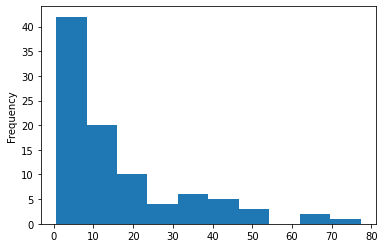

In [4]:
physical_distro.plot.hist(by='cindex')
plt.show()

It still vaguely resembles exponential decay, but the sparsity starts around 25.  So we can still try a log:

In [5]:
physical_distro_log = physical_distro.apply(np.log)
physical_distro_log.describe(percentiles = [n/20 for n in range(1, 20)])

count    93.000000
mean      2.066514
std       1.286264
min      -0.494696
5%       -0.225924
10%       0.166297
15%       0.562714
20%       0.750993
25%       1.139434
30%       1.366492
35%       1.619697
40%       1.737335
45%       2.089483
50%       2.269795
55%       2.419161
60%       2.532078
65%       2.670435
70%       2.835016
75%       2.995732
80%       3.312688
85%       3.506558
90%       3.741915
95%       3.872434
max       4.347341
Name: cindex, dtype: float64

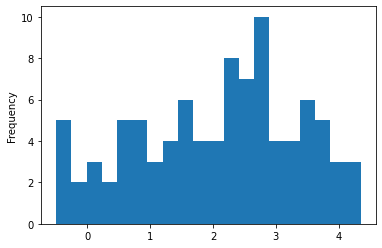

In [6]:
physical_distro_log.plot.hist(bins=20)
plt.show()

In [7]:
pd.cut(physical_distro_log, 20).value_counts().sort_index()

(-0.5, -0.253]        5
(-0.253, -0.0105]     2
(-0.0105, 0.232]      3
(0.232, 0.474]        2
(0.474, 0.716]        5
(0.716, 0.958]        5
(0.958, 1.2]          3
(1.2, 1.442]          4
(1.442, 1.684]        6
(1.684, 1.926]        4
(1.926, 2.168]        4
(2.168, 2.411]        8
(2.411, 2.653]        7
(2.653, 2.895]       10
(2.895, 3.137]        4
(3.137, 3.379]        4
(3.379, 3.621]        6
(3.621, 3.863]        5
(3.863, 4.105]        3
(4.105, 4.347]        3
Name: cindex, dtype: int64

Cutoff options:
- all of them (how many physical moves a pokemon has)
- 0.474
- 1.442
- 2.168
- 2.653
- 3.379

In [8]:
physical_cutoff1 = list(physical_distro_log.index)
shrinkfeatures_df['Physical Cutoff 1'] = pokemon_learnsets_df.loc[:, physical_cutoff1].sum(axis=1)
shrinkfeatures_df['Physical Cutoff 1'].sort_values(ascending=False).head(10)

name
Mew           77
Rhyperior     43
Rhydon        42
Tyranitar     40
Aggron        39
Pangoro       38
Nidoking      37
Krookodile    36
Nidoqueen     35
Scrafty       32
Name: Physical Cutoff 1, dtype: int64

In [9]:
physical_cutoff2 = list(physical_distro_log[physical_distro_log >= 0.474].index)
shrinkfeatures_df['Physical Cutoff 2'] = pokemon_learnsets_df.loc[:, physical_cutoff2].sum(axis=1)
shrinkfeatures_df['Physical Cutoff 2'].sort_values(ascending=False).head(10)

name
Mew           65
Rhyperior     31
Tyranitar     31
Pangoro       30
Rhydon        30
Nidoking      29
Aggron        28
Krookodile    27
Nidoqueen     27
Tyrantrum     25
Name: Physical Cutoff 2, dtype: int64

In [10]:
physical_cutoff3 = list(physical_distro_log[physical_distro_log >= 1.442].index)
shrinkfeatures_df['Physical Cutoff 3'] = pokemon_learnsets_df.loc[:, physical_cutoff3].sum(axis=1)
shrinkfeatures_df['Physical Cutoff 3'].sort_values(ascending=False).head(10)

name
Mew          49
Pangoro      25
Rhyperior    20
Tyranitar    20
Aggron       19
Tyrantrum    19
Nidoking     19
Snorlax      19
Rhydon       19
Scrafty      19
Name: Physical Cutoff 3, dtype: int64

In [11]:
physical_cutoff4 = list(physical_distro_log[physical_distro_log >= 2.168].index)
shrinkfeatures_df['Physical Cutoff 4'] = pokemon_learnsets_df.loc[:, physical_cutoff4].sum(axis=1)
shrinkfeatures_df['Physical Cutoff 4'].sort_values(ascending=False).head(10)

name
Mew          37
Pangoro      19
Drednaw      15
Tyrantrum    15
Rhyperior    14
Scrafty      14
Tyrunt       14
Tyranitar    14
Nidoking     14
Aggron       14
Name: Physical Cutoff 4, dtype: int64

In [12]:
physical_cutoff5 = list(physical_distro_log[physical_distro_log >= 2.653].index)
shrinkfeatures_df['Physical Cutoff 5'] = pokemon_learnsets_df.loc[:, physical_cutoff5].sum(axis=1)
shrinkfeatures_df['Physical Cutoff 5'].sort_values(ascending=False).head(10)

name
Mew          23
Pangoro      10
Drednaw      10
Arctovish     9
Tyrantrum     9
Steelix       9
Lucario       8
Dracovish     8
Scrafty       8
Rhyperior     8
Name: Physical Cutoff 5, dtype: int64

In [13]:
physical_cutoff6 = list(physical_distro_log[physical_distro_log >= 3.379].index)
shrinkfeatures_df['Physical Cutoff 6'] = pokemon_learnsets_df.loc[:, physical_cutoff6].sum(axis=1)
shrinkfeatures_df['Physical Cutoff 6'].sort_values(ascending=False).head(10)

name
Mew                 10
Gallade              5
Blaziken             5
Solgaleo             5
Lucario              4
Tyrantrum            4
Pinsir               4
Darmanitan-Galar     4
Pangoro              4
Marowak-Alola        4
Name: Physical Cutoff 6, dtype: int64

**Now for the physical power type coverage feature** (we'll probably have to use for loops to iterate through the types)

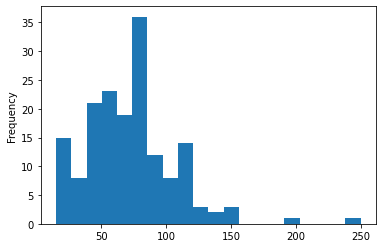

In [14]:
physical_powerdistro = moves_cindex_distro_phys.loc[moves_cindex_distro_phys['power'] > 0, ['power', 'type']]
physical_powerdistro['power'].plot.hist(bins=20)
plt.show()

In [15]:
pd.cut(physical_powerdistro['power'], 20).value_counts().sort_index()

(14.765, 26.75]    15
(26.75, 38.5]       8
(38.5, 50.25]      21
(50.25, 62.0]      23
(62.0, 73.75]      19
(73.75, 85.5]      36
(85.5, 97.25]      12
(97.25, 109.0]      8
(109.0, 120.75]    14
(120.75, 132.5]     3
(132.5, 144.25]     2
(144.25, 156.0]     3
(156.0, 167.75]     0
(167.75, 179.5]     0
(179.5, 191.25]     0
(191.25, 203.0]     1
(203.0, 214.75]     0
(214.75, 226.5]     0
(226.5, 238.25]     0
(238.25, 250.0]     1
Name: power, dtype: int64

Cutoff options:
- all of them
- 38.5
- 73.75
- 109

In [16]:
def physical_coveragesum(cutoff):
    powerdistro = physical_powerdistro.loc[physical_powerdistro['power'] >= cutoff, :]
    coveragesum = pd.DataFrame(index=shrinkfeatures_df.index)
    for ptype in type_list:
        physical_coverage = list(powerdistro.loc[powerdistro['type'] == ptype, :].index)
        coveragesum[ptype] = pokemon_learnsets_df.loc[:, physical_coverage].sum(axis=1)
        coveragesum.loc[:, ptype].where(coveragesum[ptype] <= 1, 1, inplace=True)
    return coveragesum.sum(axis=1)

In [17]:
shrinkfeatures_df['Physical Coverage 1'] = physical_coveragesum(0)
shrinkfeatures_df['Physical Coverage 1'].sort_values(ascending=False).head(10)

name
Mew           18
Pangoro       15
Nidoqueen     15
Kommo-o       15
Nidoking      15
Riolu         14
Dunsparce     14
Pancham       14
Rhyperior     14
Lickilicky    14
Name: Physical Coverage 1, dtype: int64

In [18]:
shrinkfeatures_df['Physical Coverage 2'] = physical_coveragesum(38.5)
shrinkfeatures_df['Physical Coverage 2'].sort_values(ascending=False).head(10)

name
Mew           18
Kommo-o       15
Nidoqueen     15
Pangoro       15
Rhyperior     14
Marshadow     14
Rhydon        14
Kangaskhan    14
Nidoking      14
Tyrunt        14
Name: Physical Coverage 2, dtype: int64

In [19]:
shrinkfeatures_df['Physical Coverage 3'] = physical_coveragesum(73.75)
shrinkfeatures_df['Physical Coverage 3'].sort_values(ascending=False).head(10)

name
Mew          18
Snorlax      13
Rhyperior    13
Rhydon       13
Nidoking     13
Pangoro      13
Marshadow    13
Scraggy      12
Scrafty      12
Mewtwo       12
Name: Physical Coverage 3, dtype: int64

In [20]:
shrinkfeatures_df['Physical Coverage 4'] = physical_coveragesum(109)
shrinkfeatures_df['Physical Coverage 4'].sort_values(ascending=False).head(10)

name
Mew              10.0
Snorlax           5.0
Copperajah        5.0
Solgaleo          5.0
Aggron            5.0
Nidoking          5.0
Marowak-Alola     5.0
Lickitung         4.0
Growlithe         4.0
Arcanine          4.0
Name: Physical Coverage 4, dtype: float64

**Now for the special cindex feature:**

In [21]:
special_distro = moves_cindex_distro_spec.loc[moves_cindex_distro_spec['cindex'] > 0, 'cindex']
special_distro.describe(percentiles = [n/20 for n in range(1, 20)])

count    61.000000
mean     20.108300
std      15.798409
min       1.219512
5%        2.000000
10%       3.539823
15%       5.714286
20%       6.250000
25%       8.860759
30%      10.000000
35%      10.526316
40%      11.458333
45%      14.705882
50%      16.216216
55%      17.964072
60%      21.276596
65%      24.324324
70%      26.190476
75%      28.205128
80%      33.333333
85%      33.333333
90%      41.176471
95%      48.000000
max      72.222222
Name: cindex, dtype: float64

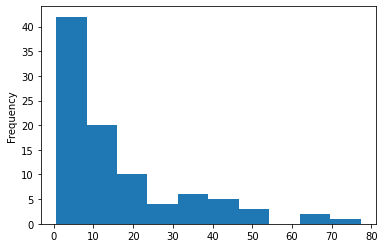

In [22]:
#should have done special_distro, need to fix in final notebook!
physical_distro.plot.hist(by='cindex')
plt.show()

In [23]:
special_distro_log = special_distro.apply(np.log)
special_distro_log.describe(percentiles = [n/20 for n in range(1, 20)])

count    61.000000
mean      2.626684
std       0.984308
min       0.198451
5%        0.693147
10%       1.264077
15%       1.742969
20%       1.832581
25%       2.181632
30%       2.302585
35%       2.353878
40%       2.438717
45%       2.688248
50%       2.786012
55%       2.888374
60%       3.057608
65%       3.191477
70%       3.265396
75%       3.339504
80%       3.506558
85%       3.506558
90%       3.717867
95%       3.871201
max       4.279748
Name: cindex, dtype: float64

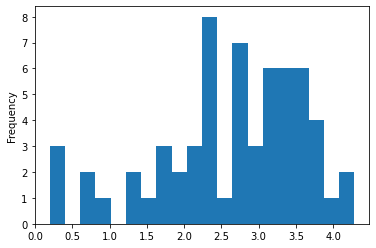

In [24]:
special_distro_log.plot.hist(bins=20)
plt.show()

In [25]:
pd.cut(special_distro_log, 20).value_counts().sort_index()

(0.194, 0.403]    3
(0.403, 0.607]    0
(0.607, 0.811]    2
(0.811, 1.015]    1
(1.015, 1.219]    0
(1.219, 1.423]    2
(1.423, 1.627]    1
(1.627, 1.831]    3
(1.831, 2.035]    2
(2.035, 2.239]    3
(2.239, 2.443]    8
(2.443, 2.647]    1
(2.647, 2.851]    7
(2.851, 3.055]    3
(3.055, 3.259]    6
(3.259, 3.463]    6
(3.463, 3.668]    6
(3.668, 3.872]    4
(3.872, 4.076]    1
(4.076, 4.28]     2
Name: cindex, dtype: int64

Cutoff options:
- all of them
- 0.607
- 1.219
- 1.627
- 2.239
- 2.647
- 3.055

In [26]:
special_cutoff1 = list(special_distro_log.index)
shrinkfeatures_df['Special Cutoff 1'] = pokemon_learnsets_df.loc[:, special_cutoff1].sum(axis=1)
shrinkfeatures_df['Special Cutoff 1'].sort_values(ascending=False).head(10)

name
Mew               47
Slowking-Galar    22
Mewtwo            21
Victini           21
Drampa            20
Rayquaza          20
Slowbro-Galar     20
Latios            19
Latias            19
Slowking          19
Name: Special Cutoff 1, dtype: int64

In [27]:
special_cutoff2 = list(special_distro_log[special_distro_log >= 0.607].index)
shrinkfeatures_df['Special Cutoff 2'] = pokemon_learnsets_df.loc[:, special_cutoff2].sum(axis=1)
shrinkfeatures_df['Special Cutoff 2'].sort_values(ascending=False).head(10)

name
Mew               44
Victini           21
Slowking-Galar    20
Drampa            19
Mewtwo            19
Latias            18
Clefable          18
Rayquaza          18
Slowbro-Galar     18
Latios            18
Name: Special Cutoff 2, dtype: int64

In [28]:
special_cutoff3 = list(special_distro_log[special_distro_log >= 1.219].index)
shrinkfeatures_df['Special Cutoff 3'] = pokemon_learnsets_df.loc[:, special_cutoff3].sum(axis=1)
shrinkfeatures_df['Special Cutoff 3'].sort_values(ascending=False).head(10)

name
Mew               42
Victini           21
Slowking-Galar    19
Drampa            18
Mewtwo            17
Clefable          17
Rayquaza          17
Slowbro-Galar     17
Latios            17
Latias            17
Name: Special Cutoff 3, dtype: int64

In [29]:
special_cutoff4 = list(special_distro_log[special_distro_log >= 1.627].index)
shrinkfeatures_df['Special Cutoff 4'] = pokemon_learnsets_df.loc[:, special_cutoff4].sum(axis=1)
shrinkfeatures_df['Special Cutoff 4'].sort_values(ascending=False).head(10)

name
Mew               40
Victini           21
Slowking-Galar    18
Latios            17
Latias            17
Slowbro-Galar     16
Rayquaza          16
Mewtwo            16
Clefable          16
Drampa            16
Name: Special Cutoff 4, dtype: int64

In [30]:
special_cutoff5 = list(special_distro_log[special_distro_log >= 2.239].index)
shrinkfeatures_df['Special Cutoff 5'] = pokemon_learnsets_df.loc[:, special_cutoff5].sum(axis=1)
shrinkfeatures_df['Special Cutoff 5'].sort_values(ascending=False).head(10)

name
Mew               33
Victini           19
Slowking-Galar    16
Lunala            14
Rayquaza          14
Latios            14
Latias            14
Mewtwo            14
Slowbro-Galar     14
Frillish          14
Name: Special Cutoff 5, dtype: int64

In [31]:
special_cutoff6 = list(special_distro_log[special_distro_log >= 2.647].index)
shrinkfeatures_df['Special Cutoff 6'] = pokemon_learnsets_df.loc[:, special_cutoff6].sum(axis=1)
shrinkfeatures_df['Special Cutoff 6'].sort_values(ascending=False).head(10)

name
Mew               24
Victini           14
Slowking-Galar    13
Slowbro-Galar     12
Mewtwo            11
Lunala            11
Rayquaza          11
Clefable          11
Slowking          10
Clefairy          10
Name: Special Cutoff 6, dtype: int64

In [32]:
special_cutoff7 = list(special_distro_log[special_distro_log >= 3.055].index)
shrinkfeatures_df['Special Cutoff 7'] = pokemon_learnsets_df.loc[:, special_cutoff7].sum(axis=1)
shrinkfeatures_df['Special Cutoff 7'].sort_values(ascending=False).head(10)

name
Mew               16
Victini           10
Octillery          9
Clefairy           9
Clefable           9
Slowking-Galar     9
Slowbro-Galar      9
Frillish           8
Jellicent          8
Goodra             8
Name: Special Cutoff 7, dtype: int64

**Now for the special coverage feature:**

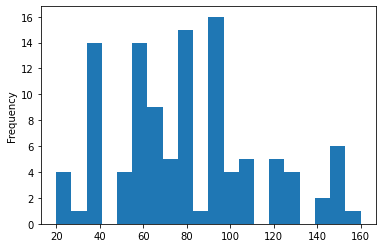

In [33]:
special_powerdistro = moves_cindex_distro_spec.loc[moves_cindex_distro_spec['power'] > 0, ['power', 'type']]
special_powerdistro['power'].plot.hist(bins=20)
plt.show()

In [34]:
pd.cut(special_powerdistro['power'], 20).value_counts().sort_index()

(19.86, 27.0]      4
(27.0, 34.0]       1
(34.0, 41.0]      14
(41.0, 48.0]       0
(48.0, 55.0]       8
(55.0, 62.0]      10
(62.0, 69.0]       9
(69.0, 76.0]       5
(76.0, 83.0]      15
(83.0, 90.0]      14
(90.0, 97.0]       3
(97.0, 104.0]      4
(104.0, 111.0]     5
(111.0, 118.0]     0
(118.0, 125.0]     5
(125.0, 132.0]     4
(132.0, 139.0]     0
(139.0, 146.0]     2
(146.0, 153.0]     6
(153.0, 160.0]     1
Name: power, dtype: int64

Cutoff options:
- all of them
- 34.0
- 48.0
- 55.0
- 76.0
- 97.0
- 104.0
- 118.0
- 139.0
- 146.0

In [35]:
def special_coveragesum(cutoff):
    powerdistro = special_powerdistro.loc[special_powerdistro['power'] >= cutoff, :]
    coveragesum = pd.DataFrame(index=shrinkfeatures_df.index)
    for ptype in type_list:
        special_coverage = list(powerdistro.loc[powerdistro['type'] == ptype, :].index)
        coveragesum[ptype] = pokemon_learnsets_df.loc[:, special_coverage].sum(axis=1)
        coveragesum.loc[:, ptype].where(coveragesum[ptype] <= 1, 1, inplace=True)
    return coveragesum.sum(axis=1)

In [36]:
shrinkfeatures_df['Special Coverage 1'] = special_coveragesum(0)
shrinkfeatures_df['Special Coverage 1'].sort_values(ascending=False).head(10)

name
Mew                18
Togekiss           13
Jirachi            13
Mewtwo             12
Latias             12
Sigilyph           12
Drampa             12
Giratina-Origin    12
Latios             12
Giratina           12
Name: Special Coverage 1, dtype: int64

In [37]:
shrinkfeatures_df['Special Coverage 2'] = special_coveragesum(34)
shrinkfeatures_df['Special Coverage 2'].sort_values(ascending=False).head(10)

name
Mew                18
Sigilyph           12
Togekiss           12
Giratina           12
Drampa             12
Giratina-Origin    12
Jirachi            12
Silvally-Ice       11
Silvally-Fairy     11
Silvally-Dragon    11
Name: Special Coverage 2, dtype: int64

In [38]:
shrinkfeatures_df['Special Coverage 3'] = special_coveragesum(48)
shrinkfeatures_df['Special Coverage 3'].sort_values(ascending=False).head(10)

name
Mew                  18
Giratina             12
Drampa               12
Jirachi              12
Sigilyph             12
Giratina-Origin      12
Silvally-Electric    11
Silvally-Fairy       11
Silvally-Fighting    11
Silvally-Ghost       11
Name: Special Coverage 3, dtype: int64

In [39]:
shrinkfeatures_df['Special Coverage 4'] = special_coveragesum(55)
shrinkfeatures_df['Special Coverage 4'].sort_values(ascending=False).head(10)

name
Mew                18
Jirachi            12
Giratina           12
Giratina-Origin    12
Drampa             12
Sigilyph           12
Slowking           11
Silvally-Dragon    11
Silvally-Dark      11
Silvally-Bug       11
Name: Special Coverage 4, dtype: int64

In [40]:
shrinkfeatures_df['Special Coverage 5'] = special_coveragesum(76)
shrinkfeatures_df['Special Coverage 5'].sort_values(ascending=False).head(10)

name
Mew          18
Drampa       11
Rayquaza     10
Aggron       10
Nidoking     10
Slowking     10
Nidoqueen    10
Latias        9
Genesect      9
Sigilyph      9
Name: Special Coverage 5, dtype: int64

In [41]:
shrinkfeatures_df['Special Coverage 6'] = special_coveragesum(97)
shrinkfeatures_df['Special Coverage 6'].sort_values(ascending=False).head(10)

name
Mew           9.0
Slowking      8.0
Drampa        8.0
Lickilicky    8.0
Slowbro       8.0
Rayquaza      8.0
Dragonite     8.0
Aggron        7.0
Snorlax       7.0
Palkia        7.0
Name: Special Coverage 6, dtype: float64

In [42]:
shrinkfeatures_df['Special Coverage 7'] = special_coveragesum(104)
shrinkfeatures_df['Special Coverage 7'].sort_values(ascending=False).head(10)

name
Mew               9.0
Dragonite         8.0
Slowking          8.0
Slowbro           8.0
Drampa            8.0
Rayquaza          8.0
Snorlax           7.0
Palkia            7.0
Slowbro-Galar     7.0
Slowking-Galar    7.0
Name: Special Coverage 7, dtype: float64

In [43]:
shrinkfeatures_df['Special Coverage 8'] = special_coveragesum(118)
shrinkfeatures_df['Special Coverage 8'].sort_values(ascending=False).head(10)

name
Mew             6.0
Slowbro         5.0
Slowking        5.0
Magmar          4.0
Raichu-Alola    4.0
Alakazam        4.0
Jirachi         4.0
Rayquaza        4.0
Registeel       4.0
Solgaleo        4.0
Name: Special Coverage 8, dtype: float64

In [44]:
shrinkfeatures_df['Special Coverage 9'] = special_coveragesum(139)
shrinkfeatures_df['Special Coverage 9'].sort_values(ascending=False).head(10)

name
Heatran                3.0
Bronzong               2.0
Excadrill              2.0
Wailord                2.0
Celesteela             2.0
Necrozma               2.0
Necrozma-Dusk Mane     2.0
Necrozma-Dawn Wings    2.0
Magearna               2.0
Primarina              2.0
Name: Special Coverage 9, dtype: float64

In [45]:
shrinkfeatures_df['Special Coverage 10'] = special_coveragesum(146)
shrinkfeatures_df['Special Coverage 10'].sort_values(ascending=False).head(10)

name
Heatran                2.0
Swampert               2.0
Inteleon               2.0
Cinderace              2.0
Rillaboom              2.0
Necrozma-Dawn Wings    2.0
Necrozma               2.0
Torkoal                2.0
Jellicent              2.0
Blaziken               2.0
Name: Special Coverage 10, dtype: float64

In [46]:
shrinkfeatures_df

,Entry Hazards,Taunt,Hazard Removal,Removal Deterrent,Cleric,Sleep,Pivot,Item Removal,Paralyze,Burn,...,Special Coverage 1,Special Coverage 2,Special Coverage 3,Special Coverage 4,Special Coverage 5,Special Coverage 6,Special Coverage 7,Special Coverage 8,Special Coverage 9,Special Coverage 10
name,,,,,,,,,,,,,,,,,,,,,
Bulbasaur,0,0,0,0,0,3,0,2,0,0,...,4,3,3,3,2,1.0,1.0,1.0,1.0,1.0
Ivysaur,0,0,0,0,0,3,0,2,0,0,...,4,3,3,3,2,1.0,1.0,1.0,1.0,1.0
Venusaur,0,0,0,0,0,3,0,2,0,0,...,4,4,4,4,4,2.0,2.0,2.0,2.0,2.0
Charmander,0,0,0,0,0,0,0,0,0,1,...,6,5,5,5,2,1.0,1.0,1.0,1.0,1.0
Charmeleon,0,0,0,0,0,0,0,0,0,1,...,6,5,5,5,2,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Glastrier,0,1,0,0,0,0,0,0,0,0,...,4,4,4,4,2,2.0,2.0,1.0,1.0,1.0
Spectrier,0,1,0,1,0,0,0,0,0,1,...,4,4,4,4,3,1.0,1.0,1.0,1.0,1.0
Calyrex,0,0,0,0,1,0,0,0,0,0,...,4,4,4,4,4,3.0,3.0,3.0,1.0,1.0


**Now for the misc status feature:**

In [47]:
moves_cindex_distro_stat.loc[moves_cindex_distro_stat['cindex'] > 0, :].sort_values(by='cindex')

,n_learnset,n_competitive,cindex,power,type
Safeguard,143,1,0.699301,0.0,Normal
Block,95,1,1.052632,0.0,Normal
Spite,76,1,1.315789,0.0,Ghost
Skill Swap,66,1,1.515152,0.0,Psychic
Magnet Rise,49,1,2.040816,0.0,Electric
Hail,97,2,2.061856,0.0,Ice
Magic Coat,91,2,2.197802,0.0,Psychic
Copycat,26,1,3.846154,0.0,Normal
Misty Terrain,24,1,4.166667,0.0,Fairy
Disable,42,2,4.761905,0.0,Normal


In [48]:
#Misc Status
shrinkfeatures_df['Misc Status'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Safeguard'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Block'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Spite'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Skill Swap'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Magnet Rise'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Hail'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Magic Coat'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Copycat'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Misty Terrain'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Disable'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Soak'] == 1, 'Misc Status'] = 1
moves_cindex.drop(index=moves_cindex_distro_stat.loc[moves_cindex_distro_stat['cindex'] < 10, :].index, inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Memento'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Pain Split'] == 1, 'Misc Status'] = 2
moves_cindex.drop(index=['Memento', 'Pain Split'], inplace=True)

#we probably don't need to drop these moves from the cindex since we aren't even using it anymore

In [49]:
shrinkfeatures_df['Misc Status'].value_counts()

1    437
0    179
2    122
Name: Misc Status, dtype: int64

**Finally, the unique powerful move feature:**

In [50]:
moves_cindex.loc[moves_cindex['cindex'] == 100, :]

,n_learnset,n_competitive,cindex,power,type,category
Crabhammer,1,1,100.0,100.0,Water,Physical
Bonemerang,2,2,100.0,50.0,Ground,Physical
Sacred Fire,2,2,100.0,100.0,Fire,Physical
Magma Storm,1,1,100.0,100.0,Fire,Special
Spacial Rend,1,1,100.0,100.0,Dragon,Special
Bolt Strike,2,2,100.0,130.0,Electric,Physical
Gear Grind,1,1,100.0,50.0,Steel,Physical
Psystrike,1,1,100.0,100.0,Psychic,Special
Secret Sword,1,1,100.0,85.0,Fighting,Special
V-create,2,2,100.0,180.0,Fire,Physical


In [51]:
#Unique Powerful Moves
shrinkfeatures_df['Unique Powerful Move'] = pokemon_learnsets_df.loc[:, list(moves_cindex.loc[moves_cindex['cindex'] == 100, :].index)].sum(axis=1)
shrinkfeatures_df.loc[:, 'Unique Powerful Move'].where(shrinkfeatures_df['Unique Powerful Move'] <= 1, 1, inplace=True)

**Last but not least, the ability cindex feature and the unique powerful ability features:**

We already decided on the cutoffs for these, and it hasn't changed likes moves_cindex has, so we can just use what we had before.  We can probably use the max function to find the best ability for each pokemon, and a function might also help to get the different cutoffs, using where to replace one hot encoded variables in pokemon_abilities_df with the cindex value of the ability, so I can properly find the max

The cutoffs for cindex_distro_ability were:
- 0 (basically, is it competitive at all?)
- 47.5 (pretty big cutoff, leading to a whole new "island")
- 65.0 (the final island before the big top)
- 73.75
- 82.5 (newly added)
- 95.625 (elite abilities)

In [52]:
def best_ability(cutoff):
    abilitylist = list(cindex_distro_ability[cindex_distro_ability >= cutoff].index)
    cindex_encoder = pokemon_abilities_df.loc[:, abilitylist].copy()
    for ability in abilitylist:
        cindex_encoder.loc[cindex_encoder[ability] == 1, ability] = cindex_distro_ability[ability]
    return cindex_encoder.max(axis=1)

In [53]:
shrinkfeatures_df['Ability Cutoff 1'] = best_ability(0)
shrinkfeatures_df['Ability Cutoff 1'].sort_values(ascending=False).head(10)

name
Binacle             100.0
Silvally-Psychic    100.0
Porygon2            100.0
Silvally-Grass      100.0
Silvally-Ground     100.0
Silvally-Ice        100.0
Miltank             100.0
Blissey             100.0
Larvitar            100.0
Pupitar             100.0
Name: Ability Cutoff 1, dtype: float64

In [54]:
shrinkfeatures_df['Ability Cutoff 1'].value_counts()

100.000000    230
50.000000      56
66.666667      51
0.000000       50
75.000000      36
95.454545      27
40.000000      22
65.217391      20
83.333333      18
85.714286      18
57.142857      17
63.636364      15
77.777778      14
64.285714      14
33.333333      12
87.500000      11
71.428571      11
76.923077      11
70.000000      11
54.545455      10
37.500000       9
88.888889       9
55.555556       8
53.846154       7
26.315789       7
80.000000       7
61.538462       7
60.000000       6
25.000000       5
27.272727       4
14.285714       4
16.666667       3
18.181818       3
20.000000       3
42.857143       1
12.500000       1
Name: Ability Cutoff 1, dtype: int64

I just realized though that the way I'm doing abilities, I'm not sure doing cutoffs even makes sense.  I'm just giving pokemon a rating for their best ability.  So what may make more sense is a one-hot encoded feature (which would use cutoffs) as to whether a pokemon any ability above that cutoff (so there is less discrimination)

So we don't really need a function, we can just a get list of best abilities for each pokemon with their cindexs, and then make various one-hot encoded features from that

In [55]:
abilitylist = list(cindex_distro_ability.index)
cindex_encoder = pokemon_abilities_df.loc[:, abilitylist].copy()
for ability in abilitylist:
    cindex_encoder.loc[cindex_encoder[ability] == 1, ability] = cindex_distro_ability[ability]
bestability =  cindex_encoder.max(axis=1)

In [56]:
shrinkfeatures_df['Ability Cutoff 1'] = bestability.where(bestability == 0, 1)
shrinkfeatures_df['Ability Cutoff 1'].value_counts()

1.0    688
0.0     50
Name: Ability Cutoff 1, dtype: int64

I did realize one more problem though, the unique abilities feature makes sense, but it will make some pokemon have a very low value for their ability cutoff.  Maybe I should manually increase their values to 1 since I don't want to n_abilityset=1 abilities affecting the distro, but I also don't want it to disadvantage pokemon with powerful unique abilities

In [57]:
abilitylist = list(cindex_distro_ability.index)
cindex_encoder = pokemon_abilities_df.loc[:, abilitylist + list(abilities_cindex.loc[(abilities_cindex['cindex'] == 100) & (abilities_cindex['n_abilityset'] == 1), :].index)].copy()
for ability in abilitylist:
    cindex_encoder.loc[cindex_encoder[ability] == 1, ability] = abilities_cindex.loc[ability, 'cindex']
bestability =  cindex_encoder.max(axis=1)

In [58]:
shrinkfeatures_df['Ability Cutoff 1'] = bestability.where(bestability == 0, 1)
shrinkfeatures_df['Ability Cutoff 1'].value_counts()

1.0    725
0.0     13
Name: Ability Cutoff 1, dtype: int64

In [59]:
shrinkfeatures_df['Ability Cutoff 2'] = bestability.where(bestability < 47.5, 1).where(bestability >= 47.5, 0)
shrinkfeatures_df['Ability Cutoff 2'].value_counts()

1.0    614
0.0    124
Name: Ability Cutoff 2, dtype: int64

In [60]:
shrinkfeatures_df['Ability Cutoff 3'] = bestability.where(bestability < 65, 1).where(bestability >= 65, 0)
shrinkfeatures_df['Ability Cutoff 3'].value_counts()

1.0    474
0.0    264
Name: Ability Cutoff 3, dtype: int64

In [61]:
shrinkfeatures_df['Ability Cutoff 4'] = bestability.where(bestability < 73.75, 1).where(bestability >= 73.75, 0)
shrinkfeatures_df['Ability Cutoff 4'].value_counts()

1.0    381
0.0    357
Name: Ability Cutoff 4, dtype: int64

In [62]:
shrinkfeatures_df['Ability Cutoff 5'] = bestability.where(bestability < 82.5, 1).where(bestability >= 82.5, 0)
shrinkfeatures_df['Ability Cutoff 5'].value_counts()

0.0    425
1.0    313
Name: Ability Cutoff 5, dtype: int64

In [63]:
#should have been 6, not 7
shrinkfeatures_df['Ability Cutoff 7'] = bestability.where(bestability < 95.625, 1).where(bestability >= 95.625, 0)
shrinkfeatures_df['Ability Cutoff 7'].value_counts()

0.0    508
1.0    230
Name: Ability Cutoff 7, dtype: int64

I have another idea for a good feature: what we originally tried to do for abilities, where the feature is just the cindex of the best ability a pokemon has access to:

In [64]:
shrinkfeatures_df['Best Ability'] = bestability
shrinkfeatures_df['Best Ability'].describe(percentiles = [n/20 for n in range(1, 20)])

count    738.000000
mean      70.421608
std       29.295179
min        0.000000
5%         1.000000
10%       26.315789
15%       40.000000
20%       50.000000
25%       53.846154
30%       57.428571
35%       64.285714
40%       66.666667
45%       66.666667
50%       75.000000
55%       77.777778
60%       83.809524
65%       88.888889
70%      100.000000
75%      100.000000
80%      100.000000
85%      100.000000
90%      100.000000
95%      100.000000
max      100.000000
Name: Best Ability, dtype: float64

I might want to do one more feature which doesn't include any abilities with 100 cindex, since this gives the model more information about:
- who has 100 cindex abilities that aren't unique
- who has 100 cindex abilities which are unique
- how good abilities are that aren't 100 cindex, making a more interesting and diverse distro

In [65]:
abilitylist_non100 = list(cindex_distro_ability[cindex_distro_ability < 100].index)
cindex_encoder_non100 = pokemon_abilities_df.loc[:, abilitylist_non100].copy()
for ability in abilitylist_non100:
    cindex_encoder_non100.loc[cindex_encoder_non100[ability] == 1, ability] = cindex_distro_ability[ability]
shrinkfeatures_df['Best Ability <100'] = cindex_encoder_non100.max(axis=1)
shrinkfeatures_df['Best Ability <100'].describe(percentiles = [n/20 for n in range(1, 20)])

count    738.000000
mean      48.679556
std       29.866663
min        0.000000
5%         0.000000
10%        0.000000
15%        0.000000
20%       14.285714
25%       25.000000
30%       33.333333
35%       40.000000
40%       50.000000
45%       50.000000
50%       55.555556
55%       61.538462
60%       64.285714
65%       66.666667
70%       66.666667
75%       71.428571
80%       75.000000
85%       77.777778
90%       85.714286
95%       88.888889
max       95.454545
Name: Best Ability <100, dtype: float64

And lastly, the "unique powerful ability" feature:

In [66]:
shrinkfeatures_df['Unique Powerful Ability'] = pokemon_abilities_df.loc[:, list(abilities_cindex.loc[(abilities_cindex['cindex'] == 100) & (abilities_cindex['n_abilityset'] == 1), :].index)].sum(axis=1)
shrinkfeatures_df['Unique Powerful Ability'].value_counts()

0    664
1     74
Name: Unique Powerful Ability, dtype: int64

There is still technically one more feature, but it's not really a new feature, it's just our target feature, format, as a number from 0 to 6 instead of a category

In [71]:
pokemon_df['format codes'] = pd.Categorical(pokemon_df['formats'], categories=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber']).codes
pokemon_df

,hp,atk,def,spa,spd,spe,weight,height,formats,generation,format codes
name,,,,,,,,,,,
Bulbasaur,45,49,49,65,65,45,6.9,0.7,ZU,RB,0
Ivysaur,60,62,63,80,80,60,13.0,1.0,ZU,RB,0
Venusaur,80,82,83,100,100,80,100.0,2.0,OU,RB,5
Charmander,39,52,43,60,50,65,8.5,0.6,ZU,RB,0
Charmeleon,58,64,58,80,65,80,19.0,1.1,ZU,RB,0
...,...,...,...,...,...,...,...,...,...,...,...
Glastrier,100,145,130,65,110,30,800.0,2.2,NU,SS,2
Spectrier,100,65,60,145,80,130,44.5,2.0,Uber,SS,6
Calyrex,100,80,80,80,80,80,7.7,1.1,PU,SS,1


**We've finally finished ALL of our features!!! Now we can really do EDA!!!**

Let's put all of our best quality data together:

In [73]:
pokemon_data = pokemon_df.merge(pokemon_types_summary, on='name')
pokemon_data = pokemon_data.merge(shrinkfeatures_df, on='name')
pokemon_data

,hp,atk,def,spa,spd,spe,weight,height,formats,generation,...,Unique Powerful Move,Ability Cutoff 1,Ability Cutoff 2,Ability Cutoff 3,Ability Cutoff 4,Ability Cutoff 5,Ability Cutoff 7,Best Ability,Best Ability <100,Unique Powerful Ability
name,,,,,,,,,,,,,,,,,,,,,
Bulbasaur,45,49,49,65,65,45,6.9,0.7,ZU,RB,...,0,1.0,1.0,0.0,0.0,0.0,0.0,63.636364,63.636364,0
Ivysaur,60,62,63,80,80,60,13.0,1.0,ZU,RB,...,0,1.0,1.0,0.0,0.0,0.0,0.0,63.636364,63.636364,0
Venusaur,80,82,83,100,100,80,100.0,2.0,OU,RB,...,0,1.0,1.0,0.0,0.0,0.0,0.0,63.636364,63.636364,0
Charmander,39,52,43,60,50,65,8.5,0.6,ZU,RB,...,0,1.0,1.0,0.0,0.0,0.0,0.0,50.000000,50.000000,0
Charmeleon,58,64,58,80,65,80,19.0,1.1,ZU,RB,...,0,1.0,1.0,0.0,0.0,0.0,0.0,50.000000,50.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Glastrier,100,145,130,65,110,30,800.0,2.2,NU,SS,...,0,1.0,1.0,1.0,1.0,0.0,0.0,75.000000,75.000000,0
Spectrier,100,65,60,145,80,130,44.5,2.0,Uber,SS,...,0,1.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,1
Calyrex,100,80,80,80,80,80,7.7,1.1,PU,SS,...,0,1.0,0.0,0.0,0.0,0.0,0.0,18.181818,18.181818,0


In [74]:
len(pokemon_df.columns) + len(pokemon_types_summary.columns) + len(shrinkfeatures_df.columns)

86

Let's check this data with a profile report to make sure there's nothing very conspicuous that we're missing:

profile_report = pokemon_data.profile_report(html={'style': {'full_width': True}})
profile_report.to_file("pokemon_data_report.html")

profile_report.to_file("pokemon_data_report.json")

Unfortunately these files are so massive that they can't even be viewed.  We'll have to look at correlations one by one.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import json
import pandas_profiling
import requests
from bs4 import BeautifulSoup
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

pokemon_df = pd.read_csv('./data/pokemon_df.csv', index_col="name")
pokemon_types_df = pd.read_csv('./data/pokemon_types_df.csv', index_col="name")
pokemon_abilities_df = pd.read_csv('./data/pokemon_abilities_df.csv', index_col="name")
abilities_df = pd.read_csv('./data/abilities_df.csv', index_col="name")
moves_df = pd.read_csv('./data/moves_df.csv', index_col="name")
abilities_removed_df = pd.read_csv('./data/abilities_removed_df.csv')
abilities_removed_df = abilities_removed_df.iloc[:, 0]
abilities_removed_df.name = 'name'
pokemon_learnsets_df = pd.read_csv('./data/pokemon_learnsets_df.csv', index_col='name')

with open("smogonpokemondata2021/smogonpokemondata2021/scraped_data/PokemonData2021.csv", encoding="utf8") as infile:
    strategydex_df = pd.read_csv(infile)

strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<p>.+?<\/p>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<section>.+?<\/section>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<h1>.+?<\/h1>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('\\\\n', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace("\'", '\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('King\"s', "King\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Maki\"s', "Maki\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Land\"s', "Land\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Dragon\"s', "Dragon\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Sirfetch\"d', "Sirfetch\'d")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Farfetch\"d', "Farfetch\'d")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Nature\"s', "Nature\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Forest\"s', "Forest\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('drampa\"s', "drampa\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('False', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('True', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('None', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('\"\"\"\s', '\"', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<ul>.+?<\/ul', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Swipe', 'False Swipe') #newline
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Surrender', 'False Surrender') #newline
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].apply(json.loads)

acceptable_formats = pokemon_df['formats'].unique().tolist()
acceptable_formats.append('ZU')

strategies_dict = {}
strategydexcopy = strategydex_df.copy()

for pokemon in pokemon_df.index:
    pokemon_access = pokemon.replace("'", "").replace(" ", "-").replace(".", "").replace("-10%", "").replace(":", "")
    dex_entry = strategydexcopy.loc[strategydexcopy['pokemonName'] == pokemon_access.lower(), 'pokemonData'].item()
    format_list = []
    for competitive_format in dex_entry['strategies']:
        format_dict = {}
        current_format = competitive_format['format']
        if current_format in acceptable_formats:
            moveset_list = []
            for moveset in competitive_format['movesets']:
                moveset_dict = {}
                moveset_name = moveset['name']
                move_list = []
                for move in moveset['moveslots']:
                    for entry in move:
                        move_list.append(entry['move'])
                moveset_dict[moveset_name] = move_list
                moveset_dict["abilities"] = moveset['abilities']
                moveset_list.append(moveset_dict)
            format_dict[current_format] = moveset_list
            format_list.append(format_dict)
    strategies_dict[pokemon] = format_list

pokemon_df.loc[pokemon_df['formats'] == 'LC', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'NFE', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'Untiered', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'PUBL', 'formats'] = 'NU'
pokemon_df.loc[pokemon_df['formats'] == 'NUBL', 'formats'] = 'RU'
pokemon_df.loc[pokemon_df['formats'] == 'RUBL', 'formats'] = 'UU'
pokemon_df.loc[pokemon_df['formats'] == 'UUBL', 'formats'] = 'OU'

ranked_formats = ['Uber', 'OU', 'UU', 'RU', 'NU', 'PU', 'ZU']

tierchange_df = pd.DataFrame(index=pokemon_df.index, columns=['Tier', 'Change'])
tierchange_df['Tier'] = pokemon_df['formats']

for pokemon, formatlist in strategies_dict.items():
    possible_tiers = []
    for formatdict in formatlist:
        for key in formatdict.keys():
            possible_tiers.append(key)
    best_tier = tierchange_df.loc[pokemon, 'Tier']
    if best_tier == 'OU':
        if 'Uber' in possible_tiers:
            best_tier = 'Uber'
    elif best_tier == 'UU':
        if 'Uber' in possible_tiers:
            best_tier = 'Uber'
        elif 'OU' in possible_tiers:
            best_tier = 'OU'
    elif best_tier == 'RU':
        if 'UU' in possible_tiers:
            best_tier = 'UU'
    elif best_tier == 'NU':
        if 'UU' in possible_tiers:
            best_tier = 'UU'
        elif 'RU' in possible_tiers:
            best_tier = 'RU'
    elif best_tier == 'PU':
        if 'NU' in possible_tiers:
            best_tier = 'NU'
    elif best_tier == 'ZU':
        if 'NU' in possible_tiers:
            best_tier = 'NU'
        elif 'PU' in possible_tiers:
            best_tier = 'PU'
    tierchange_df.loc[pokemon, 'Change'] = best_tier

tierchange_df.loc['Tentacruel', 'Change'] = 'UU'
tierchange_df.loc['Zygarde-10%', 'Change'] = 'UU'
tierchange_df.loc['Tapu Bulu', 'Change'] = 'OU'
tierchange_df.loc['Slurpuff', 'Change'] = 'RU'
tierchange_df.loc['Inteleon', 'Change'] = 'NU'
tierchange_df.loc['Mudsdale', 'Change'] = 'NU'
tierchange_df.loc['Drapion', 'Change'] = 'NU'
tierchange_df.loc['Zoroark', 'Change'] = 'NU'
tierchange_df.loc['Glastrier', 'Change'] = 'NU'
tierchange_df.loc['Omastar', 'Change'] = 'NU'
tierchange_df.loc['Silvally-Ground', 'Change'] = 'NU'
tierchange_df.loc['Silvally-Fairy', 'Change'] = 'PU'
tierchange_df.loc['Hitmonlee', 'Change'] = 'PU'
tierchange_df.loc['Charizard', 'Change'] = 'PU'
tierchange_df.loc['Sneasel', 'Change'] = 'PU'
tierchange_df.loc['Rotom', 'Change'] = 'PU'
tierchange_df.loc['Stunfisk-Galar', 'Change'] = 'PU'
tierchange_df.loc['Centiskorch', 'Change'] = 'PU'

pokemon_df['formats'] = tierchange_df['Change']

r = requests.get('https://bulbapedia.bulbagarden.net/wiki/Type')
html_doc = r.text
soup = BeautifulSoup(html_doc)

type_table = soup.find_all('table')[1]
type_rows = type_table.find_all('tr')
type_list = []

for th in type_rows[1].find_all('th'):
    type_prep = th.a.get('href')
    type_list.append(type_prep.replace('/wiki/', '').replace('_(type)', ''))

type_matchups = pd.DataFrame(index=type_list, columns=type_list)

for i1, tr in enumerate(type_rows[2:20]):
    for i2, td in enumerate(tr.find_all('td')):
        type_matchups.iloc[i1, i2] = float(td.contents[0][0].replace('½', '0.5'))
        
type_matchups.index.rename('Attacking', inplace=True)
type_matchups.columns.rename('Defending', inplace=True)
pokemon_types_matchups = pd.DataFrame(1, index=pokemon_types_df.index, columns=type_matchups.columns.rename(''))

for column in pokemon_types_df.columns:
    type_matchup = type_matchups[column]
    type_filter = pokemon_types_df[column] == 1
    pokemon_types_matchups[type_filter] = pokemon_types_matchups[type_filter] * type_matchup
    
pokemon_types_summary = pd.DataFrame(index=pokemon_types_matchups.index, columns=['2', '4', '0.5', '0.25', '0'])
for column in pokemon_types_summary.columns:
    pokemon_types_summary[column] = (pokemon_types_matchups == float(column)).sum(axis=1)
    
pokemon_types_summary.columns = ['Weaknesses', 'Strong Weaknesses', 'Resists', 'Strong Resists', 'Immune']
pokemon_types_summary['STAB'] = pokemon_types_df.sum(axis=1)
pokemon_types_summary['Resistance Index'] = pokemon_types_summary['Resists'] + 2*pokemon_types_summary['Strong Resists'] + 4*pokemon_types_summary['Immune'] - pokemon_types_summary['Weaknesses'] - 2*pokemon_types_summary['Strong Weaknesses']

roles_dict = {}
for pokemon, formatlist in strategies_dict.items():
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                role_dict = {}
                role_dict['name'] = pokemon
                role_dict['format'] = formatkey
                role_dict['abilities'] = moveset['abilities']
                role = [name for name in moveset.keys() if name != 'abilities'][0]
                role_dict['moveset'] = moveset[role]
                if role not in roles_dict.keys():
                    roles_dict[role] = [role_dict]
                else:
                    roles_dict[role].append(role_dict)
                    
roles_list = sorted(list(roles_dict.keys()))

pokemon_learnsets_df['Acid Armor'] = pokemon_learnsets_df['Acid Armor'] + pokemon_learnsets_df['Iron Defense']
pokemon_learnsets_df.drop('Iron Defense', inplace=True, axis=1)
pokemon_learnsets_df['Agility'] = pokemon_learnsets_df['Agility'] + pokemon_learnsets_df['Rock Polish']
pokemon_learnsets_df.drop('Rock Polish', inplace=True, axis=1)
pokemon_learnsets_df['Charm'] = pokemon_learnsets_df['Charm'] + pokemon_learnsets_df['Feather Dance']
pokemon_learnsets_df.drop('Feather Dance', inplace=True, axis=1)
pokemon_learnsets_df['Smokescreen'] = pokemon_learnsets_df['Smokescreen'] + pokemon_learnsets_df['Sand Attack']
pokemon_learnsets_df.drop('Sand Attack', inplace=True, axis=1)
pokemon_learnsets_df['Heal Pulse'] = pokemon_learnsets_df['Heal Pulse'] + pokemon_learnsets_df['Floral Healing']
pokemon_learnsets_df.drop('Floral Healing', inplace=True, axis=1)
pokemon_learnsets_df['Leer'] = pokemon_learnsets_df['Leer'] + pokemon_learnsets_df['Tail Whip']
pokemon_learnsets_df.drop('Tail Whip', inplace=True, axis=1)
pokemon_learnsets_df['Lock-On'] = pokemon_learnsets_df['Lock-On'] + pokemon_learnsets_df['Mind Reader']
pokemon_learnsets_df.drop('Mind Reader', inplace=True, axis=1)
pokemon_learnsets_df['Block'] = pokemon_learnsets_df['Block'] + pokemon_learnsets_df['Mean Look']
pokemon_learnsets_df.drop('Mean Look', inplace=True, axis=1)
pokemon_learnsets_df['Lunar Dance'] = pokemon_learnsets_df['Lunar Dance'] + pokemon_learnsets_df['Healing Wish']
pokemon_learnsets_df.drop('Healing Wish', inplace=True, axis=1)
pokemon_learnsets_df['Moonlight'] = pokemon_learnsets_df['Moonlight'] + pokemon_learnsets_df['Morning Sun'] + pokemon_learnsets_df['Synthesis']
pokemon_learnsets_df.drop(['Morning Sun', 'Synthesis'], inplace=True, axis=1)
pokemon_learnsets_df['Recover'] = pokemon_learnsets_df['Recover'] + pokemon_learnsets_df['Soft-Boiled'] + pokemon_learnsets_df['Milk Drink'] + pokemon_learnsets_df['Slack Off']
pokemon_learnsets_df.drop(['Soft-Boiled', 'Milk Drink', 'Slack Off'], inplace=True, axis=1)
pokemon_learnsets_df['Trick'] = pokemon_learnsets_df['Trick'] + pokemon_learnsets_df['Switcheroo']
pokemon_learnsets_df.drop('Switcheroo', inplace=True, axis=1)

pokemon_learnsets_df.where(pokemon_learnsets_df <= 1, 1, inplace=True)
        
dup_moves = ['Acid Armor', 'Iron Defense', 'Rock Polish', 'Agility', 'Charm', 'Feather Dance', 'Smokescreen', 'Sand Attack', 'Heal Pulse', 'Floral Healing', 'Leer', 'Tail Whip', 'Lock-On', 'Mind Reader', 'Mean Look', 'Block', 'Healing Wish', 'Lunar Dance', 'Moonlight', 'Morning Sun', 'Synthesis', 'Recover', 'Soft-Boiled', 'Milk Drink', 'Slack Off', 'Trick', 'Switcheroo']

dup_moves_df = pd.DataFrame(index=dup_moves, columns=['collapse'])
dup_moves_df.loc[['Acid Armor', 'Iron Defense'], 'collapse'] = 'Acid Armor'
dup_moves_df.loc[['Rock Polish', 'Agility'], 'collapse'] = 'Agility'
dup_moves_df.loc[['Charm', 'Feather Dance'], 'collapse'] = 'Charm'
dup_moves_df.loc[['Smokescreen', 'Sand Attack'], 'collapse'] = 'Smokescreen'
dup_moves_df.loc[['Heal Pulse', 'Floral Healing'], 'collapse'] = 'Heal Pulse'
dup_moves_df.loc[['Leer', 'Tail Whip'], 'collapse'] = 'Leer'
dup_moves_df.loc[['Lock-On', 'Mind Reader'], 'collapse'] = 'Lock-On'
dup_moves_df.loc[['Mean Look', 'Block'], 'collapse'] = 'Block'
dup_moves_df.loc[['Healing Wish', 'Lunar Dance'], 'collapse'] = 'Lunar Dance'
dup_moves_df.loc[['Moonlight', 'Morning Sun', 'Synthesis'], 'collapse'] = 'Moonlight'
dup_moves_df.loc[['Recover', 'Soft-Boiled', 'Milk Drink', 'Slack Off'], 'collapse'] = 'Recover'
dup_moves_df.loc[['Trick', 'Switcheroo'], 'collapse'] = 'Trick'

pokemon_abilities_df['Air Lock'] = pokemon_abilities_df['Air Lock'] + pokemon_abilities_df['Cloud Nine']
pokemon_abilities_df.drop('Cloud Nine', inplace=True, axis=1)
pokemon_abilities_df['Shell Armor'] = pokemon_abilities_df['Battle Armor'] + pokemon_abilities_df['Shell Armor']
pokemon_abilities_df.drop('Battle Armor', inplace=True, axis=1)
pokemon_abilities_df['Clear Body'] = pokemon_abilities_df['Clear Body'] + pokemon_abilities_df['White Smoke'] + pokemon_abilities_df['Full Metal Body']
pokemon_abilities_df.drop(['White Smoke', 'Full Metal Body'], inplace=True, axis=1)
pokemon_abilities_df['Filter'] = pokemon_abilities_df['Filter'] + pokemon_abilities_df['Solid Rock'] + pokemon_abilities_df['Prism Armor']
pokemon_abilities_df.drop(['Solid Rock', 'Prism Armor'], inplace=True, axis=1)
pokemon_abilities_df['Gooey'] = pokemon_abilities_df['Gooey'] + pokemon_abilities_df['Tangling Hair']
pokemon_abilities_df.drop('Tangling Hair', inplace=True, axis=1)
pokemon_abilities_df['Insomnia'] = pokemon_abilities_df['Insomnia'] + pokemon_abilities_df['Vital Spirit']
pokemon_abilities_df.drop('Vital Spirit', inplace=True, axis=1)
pokemon_abilities_df['Teravolt'] = pokemon_abilities_df['Mold Breaker'] + pokemon_abilities_df['Teravolt'] + pokemon_abilities_df['Turboblaze']
pokemon_abilities_df.drop(['Mold Breaker', 'Turboblaze'], inplace=True, axis=1)
pokemon_abilities_df['Moxie'] = pokemon_abilities_df['Moxie'] + pokemon_abilities_df['Chilling Neigh']
pokemon_abilities_df.drop('Chilling Neigh', inplace=True, axis=1)
pokemon_abilities_df['Multiscale'] = pokemon_abilities_df['Multiscale'] + pokemon_abilities_df['Shadow Shield']
pokemon_abilities_df.drop('Shadow Shield', inplace=True, axis=1)
pokemon_abilities_df['Stalwart'] = pokemon_abilities_df['Propeller Tail'] + pokemon_abilities_df['Stalwart']
pokemon_abilities_df.drop('Propeller Tail', inplace=True, axis=1)
pokemon_abilities_df['Rough Skin'] = pokemon_abilities_df['Rough Skin'] + pokemon_abilities_df['Iron Barbs']
pokemon_abilities_df.drop('Iron Barbs', inplace=True, axis=1)
pokemon_abilities_df['Wimp Out'] = pokemon_abilities_df['Wimp Out'] + pokemon_abilities_df['Emergency Exit']
pokemon_abilities_df.drop('Emergency Exit', inplace=True, axis=1)

pokemon_abilities_df.where(pokemon_abilities_df <= 1, 1, inplace=True)

dup_abilities= ['Air Lock', 'Cloud Nine', 'Battle Armor', 'Shell Armor', 'Clear Body', 'White Smoke', 'Full Metal Body', 'Filter', 'Solid Rock', 'Prism Armor', 'Gooey', 'Tangling Hair', 'Insomnia', 'Vital Spirit', 'Mold Breaker', 'Teravolt', 'Turboblaze', 'Moxie', 'Chilling Neigh', 'Multiscale', 'Shadow Shield', 'Propeller Tail', 'Stalwart', 'Rough Skin', 'Iron Barbs', 'Wimp Out', 'Emergency Exit']

dup_abilities_df = pd.DataFrame(index=dup_abilities, columns=['collapse'])
dup_abilities_df.loc[['Air Lock', 'Cloud Nine'], 'collapse'] = 'Air Lock'
dup_abilities_df.loc[['Battle Armor', 'Shell Armor'], 'collapse'] = 'Shell Armor'
dup_abilities_df.loc[['Clear Body', 'White Smoke', 'Full Metal Body'], 'collapse'] = 'Clear Body'
dup_abilities_df.loc[['Filter', 'Solid Rock', 'Prism Armor'], 'collapse'] = 'Filter'
dup_abilities_df.loc[['Gooey', 'Tangling Hair'], 'collapse'] = 'Gooey'
dup_abilities_df.loc[['Insomnia', 'Vital Spirit'], 'collapse'] = 'Insomnia'
dup_abilities_df.loc[['Mold Breaker', 'Teravolt', 'Turboblaze'], 'collapse'] = 'Teravolt'
dup_abilities_df.loc[['Moxie', 'Chilling Neigh'], 'collapse'] = 'Moxie'
dup_abilities_df.loc[['Multiscale', 'Shadow Shield'], 'collapse'] = 'Multiscale'
dup_abilities_df.loc[['Propeller Tail', 'Stalwart'], 'collapse'] = 'Stalwart'
dup_abilities_df.loc[['Rough Skin', 'Iron Barbs'], 'collapse'] = 'Rough Skin'
dup_abilities_df.loc[['Wimp Out', 'Emergency Exit'], 'collapse'] = 'Wimp Out'

PCAattempt1_df = pokemon_df.merge(pokemon_types_summary, on='name')
PCAattempt1_df = PCAattempt1_df.merge(pokemon_abilities_df, on='name')
PCAattempt1_df = PCAattempt1_df.merge(pokemon_learnsets_df, on='name')
PCAattempt1_nonnumeric = PCAattempt1_df.select_dtypes(include='object', exclude='number')
PCAattempt1_numeric = PCAattempt1_df.select_dtypes(include='number')
PCAattempt1_columns = PCAattempt1_numeric.columns
PCAattempt1_scaled = scale(PCAattempt1_numeric)
PCAattempt1_df_scaled = pd.DataFrame(PCAattempt1_scaled, index=pokemon_df.index, columns=PCAattempt1_columns)
PCAattempt1_fit = PCA().fit(PCAattempt1_df_scaled)

cindex_dict = strategies_dict.copy()
pokemon_noncompetitive = []

for pokemon, formatlist in strategies_dict.items():
    if formatlist == []:
        pokemon_noncompetitive.append(pokemon)
        cindex_dict.pop(pokemon)
    else:
        current_pokemon_formats = []
        for formatdict in formatlist:
            formatkey = next(iter(formatdict))
            if formatkey in ranked_formats:
                current_pokemon_formats.append(formatkey)
        if current_pokemon_formats == []:
            pokemon_noncompetitive.append(pokemon)
            cindex_dict.pop(pokemon)
            
moves_cindex = pd.DataFrame(0, index=pokemon_learnsets_df.columns, columns=['n_learnset', 'n_competitive', 'cindex'])

for pokemon, formatlist in cindex_dict.items():
    already_checked = []
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                moveset_name = [name for name in moveset.keys() if name != 'abilities'][0]
                for move in moveset[moveset_name]:
                    if move in dup_moves:
                        move = dup_moves_df.loc[move, 'collapse']
                    if move not in already_checked:
                        moves_cindex.loc[move, 'n_competitive'] += 1
                        already_checked.append(move)
                        
for move in pokemon_learnsets_df.columns:
    moves_cindex.loc[move, 'n_learnset'] = pokemon_learnsets_df.drop(index=pokemon_noncompetitive)[move].sum()
    
for move in moves_cindex.index:
    moves_cindex.loc[move, 'power'] = moves_df.loc[move, 'power']
    moves_cindex.loc[move, 'type'] = moves_df.loc[move, 'type']
    moves_cindex.loc[move, 'category'] = moves_df.loc[move, 'category']

moves_cindex['cindex'] = 100*(moves_cindex['n_competitive'] / moves_cindex['n_learnset'])

shrinkfeatures_df = pd.DataFrame(index=pokemon_df.index)

#Utility: Entry Hazards
shrinkfeatures_df['Entry Hazards'] = pokemon_learnsets_df.loc[:, ['Spikes', 'Toxic Spikes', 'Stealth Rock', 'Sticky Web']].sum(axis=1)
moves_cindex.drop(index=['Spikes', 'Toxic Spikes', 'Stealth Rock', 'Sticky Web'], inplace=True)
shrinkfeatures_df['Taunt'] = pokemon_learnsets_df['Taunt']
moves_cindex.drop(index='Taunt', inplace=True)

#Utility: Hazard Control (pd.where is being used to one-hot encode here)
shrinkfeatures_df['Hazard Removal'] = pokemon_learnsets_df.loc[:, ['Rapid Spin', 'Defog']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Hazard Removal'].where(shrinkfeatures_df['Hazard Removal'] <= 1, 1, inplace=True)
moves_cindex.drop(index=['Rapid Spin', 'Defog'], inplace=True)
shrinkfeatures_df['Removal Deterrent'] = pokemon_abilities_df.loc[:, ['Magic Bounce', 'Defiant', 'Contrary', 'Competitive']].sum(axis=1) + pokemon_types_df['Ghost']
shrinkfeatures_df.loc[:, 'Removal Deterrent'].where(shrinkfeatures_df['Removal Deterrent'] <= 1, 1, inplace=True)

#Utility: Clerics and Wish
shrinkfeatures_df['Party Heal'] = pokemon_learnsets_df.loc[:, ['Heal Bell', 'Aromatherapy']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Party Heal'].where(shrinkfeatures_df['Party Heal'] <= 1, 1, inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Jungle Healing'] == 1, 'Party Heal'] = 2
moves_cindex.drop(index=['Heal Bell', 'Aromatherapy', 'Jungle Healing'], inplace=True)
shrinkfeatures_df['Setup Support'] = pokemon_learnsets_df['Lunar Dance']
moves_cindex.drop(index='Lunar Dance', inplace=True)
shrinkfeatures_df['Wish'] = pokemon_learnsets_df['Wish']
moves_cindex.drop(index='Wish', inplace=True)
shrinkfeatures_df['Cleric'] = shrinkfeatures_df.loc[:, ['Party Heal', 'Setup Support', 'Wish']].sum(axis=1)
shrinkfeatures_df.drop(columns=['Party Heal', 'Setup Support', 'Wish'], inplace=True)

#Utility: Sleep
shrinkfeatures_df['Sleep'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Sing'] == 1, 'Sleep'] = 1
moves_cindex.drop(index='Sing', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Hypnosis'] == 1, 'Sleep'] = 2
moves_cindex.drop(index='Hypnosis', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Sleep Powder'] == 1, 'Sleep'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Lovely Kiss'] == 1, 'Sleep'] = 3
moves_cindex.drop(index=['Sleep Powder', 'Lovely Kiss'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Spore'] == 1, 'Sleep'] = 4
moves_cindex.drop(index=['Spore'], inplace=True)

#Utility: Pivot
shrinkfeatures_df['Pivot'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Teleport'] == 1, 'Pivot'] = 1
moves_cindex.drop(index='Teleport', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Parting Shot'] == 1, 'Pivot'] = 2
moves_cindex.drop(index='Parting Shot', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['U-turn'] == 1, 'Pivot'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Volt Switch'] == 1, 'Pivot'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Flip Turn'] == 1, 'Pivot'] = 3
moves_cindex.drop(index=['U-turn', 'Volt Switch', 'Flip Turn'], inplace=True)

#Utility: Item Removal
shrinkfeatures_df['Item Removal'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Corrosive Gas'] == 1, 'Item Removal'] = 1
moves_cindex.drop(index='Corrosive Gas', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Knock Off'] == 1, 'Item Removal'] = 2
moves_cindex.drop(index='Knock Off', inplace=True)

#Utility: Paralyze
shrinkfeatures_df['Paralyze'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Stun Spore'] == 1, 'Paralyze'] = 1
moves_cindex.drop(index='Stun Spore', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Thunder Wave'] == 1, 'Paralyze'] = 2
moves_cindex.drop(index='Thunder Wave', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Glare'] == 1, 'Paralyze'] = 3
moves_cindex.drop(index='Glare', inplace=True)

#Utility: Burn
shrinkfeatures_df['Burn'] = pokemon_learnsets_df['Will-O-Wisp']
moves_cindex.drop(index='Will-O-Wisp', inplace=True)

#Utility: Toxic
shrinkfeatures_df['Toxic'] = pokemon_learnsets_df['Toxic']
moves_cindex.drop(index='Toxic', inplace=True)

#Utility: Trick
shrinkfeatures_df['Trick'] = pokemon_learnsets_df['Trick']
moves_cindex.drop(index='Trick', inplace=True)

#Utility: Phaze (circle throw and dragon tail stay because of damage)
shrinkfeatures_df['Phaze'] = pokemon_learnsets_df.loc[:, ['Circle Throw', 'Dragon Tail', 'Whirlwind', 'Roar', 'Yawn', 'Perish Song', 'Haze', 'Clear Smog', 'Destiny Bond', 'Encore']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Phaze'].where(shrinkfeatures_df['Phaze'] <= 1, 1, inplace=True)
moves_cindex.drop(index=['Whirlwind', 'Roar', 'Yawn', 'Perish Song', 'Haze', 'Clear Smog', 'Destiny Bond', 'Encore'], inplace=True)

#Utility: Screens
shrinkfeatures_df['Screens'] = pokemon_learnsets_df.loc[:, ['Reflect', 'Light Screen']].sum(axis=1)
moves_cindex.drop(index=['Reflect', 'Light Screen'], inplace=True)

#Utility: Tailwind
shrinkfeatures_df['Tailwind'] = pokemon_learnsets_df['Tailwind']
moves_cindex.drop(index='Tailwind', inplace=True)

#Utility: Trapper
#was going to remove from cindex, that leaves some pokemon without abilities!
#and it severely misleads about the strength of abilities for a pokemon
#removing from moves is less important as they are far less scarce
#and we're mainly measuring them in terms of offense or general "status"
shrinkfeatures_df['Trapper'] = pokemon_abilities_df.loc[:, ['Arena Trap', 'Magnet Pull', 'Shadow Tag']].sum(axis=1)

#Utility: Status Absorber
shrinkfeatures_df['Status Absorber'] = pokemon_abilities_df.loc[:, ['Natural Cure', 'Shed Skin']].sum(axis=1)

#Utility: Unaware
shrinkfeatures_df['Unaware'] = pokemon_abilities_df['Unaware']

#Offensive: Setup
shrinkfeatures_df['Setup'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Howl'] == 1, 'Setup'] = 1
moves_cindex.drop(index=['Howl'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Acid Armor'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Work Up'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Amnesia'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Hone Claws'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Curse'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Power-Up Punch'] == 1, 'Setup'] = 2
moves_cindex.drop(index=['Acid Armor', 'Work Up', 'Amnesia', 'Hone Claws', 'Curse', 'Power-Up Punch'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Flame Charge'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Belly Drum'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Autotomize'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Calm Mind'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Bulk Up'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Cotton Guard'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Meteor Beam'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Cosmic Power'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Growth'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Agility'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Sniper'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Weak Armor'] == 1, 'Setup'] = 3
moves_cindex.drop(index=['Flame Charge', 'Belly Drum', 'Autotomize', 'Calm Mind', 'Bulk Up', 'Cotton Guard', 'Meteor Beam', 'Cosmic Power', 'Agility'], inplace=True) #can't remove growth because I'll need it for weather
shrinkfeatures_df.loc[pokemon_learnsets_df['Swords Dance'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Coil'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Nasty Plot'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Shift Gear'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Dragon Dance'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Unburden'] == 1, 'Setup'] = 4
moves_cindex.drop(index=['Swords Dance', 'Coil', 'Nasty Plot', 'Shift Gear', 'Dragon Dance'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Shell Smash'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['Quiver Dance'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['No Retreat'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['Geomancy'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['Clangorous Soul'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_abilities_df['Guts'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_abilities_df['Speed Boost'] == 1, 'Setup'] = 5
moves_cindex.drop(index=['Shell Smash', 'Quiver Dance', 'No Retreat', 'Geomancy', 'Clangorous Soul'], inplace=True)

#Offensive: Priority
shrinkfeatures_df['Priority'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Fake Out'] == 1, 'Priority'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Quick Attack'] == 1, 'Priority'] = 1
moves_cindex.drop(index=['Fake Out', 'Quick Attack'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Accelerock'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Shadow Sneak'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['First Impression'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Mach Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Aqua Jet'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Bullet Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Ice Shard'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Extreme Speed'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Sucker Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Vacuum Wave'] == 1, 'Priority'] = 2
moves_cindex.drop(index=['Accelerock', 'Shadow Sneak', 'First Impression', 'Mach Punch', 'Aqua Jet', 'Bullet Punch', 'Ice Shard', 'Extreme Speed', 'Sucker Punch', 'Vacuum Wave'], inplace=True)
shrinkfeatures_df.loc[pokemon_abilities_df['Gale Wings'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Prankster'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Triage'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Technician'] == 1, 'Priority'] = 3

#Offensive: Heavy Moves (give pokemon like Copperajah coverage)
shrinkfeatures_df['Heavy Moves'] = pokemon_learnsets_df.loc[:, ['Heat Crash', 'Heavy Slam']].sum(axis=1)
moves_cindex.drop(index=['Heat Crash', 'Heavy Slam'], inplace=True)

#Offensive: Gyro Ball (gives slower pokemon a powerful move)
shrinkfeatures_df['Gyro Ball'] = pokemon_learnsets_df['Gyro Ball']
moves_cindex.drop(index=['Gyro Ball'], inplace=True)

#Offensive: Electro Ball (gives faster pokemon a powerful move)
shrinkfeatures_df['Electro Ball'] = pokemon_learnsets_df['Electro Ball']
moves_cindex.drop(index=['Electro Ball'], inplace=True)

#Defensive: Unique Shield
shrinkfeatures_df['Unique Shield'] = pokemon_learnsets_df.loc[:, ['King\'s Shield', 'Spiky Shield', 'Obstruct']].sum(axis=1)
moves_cindex.drop(index=['King\'s Shield', 'Spiky Shield', 'Obstruct'], inplace=True)

#Defensive: HP Drain
shrinkfeatures_df['HP Drain'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Leech Life'] == 1, 'HP Drain'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Draining Kiss'] == 1, 'HP Drain'] = 1
moves_cindex.drop(index=['Leech Life', 'Draining Kiss'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Giga Drain'] == 1, 'HP Drain'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Leech Seed'] == 1, 'HP Drain'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Drain Punch'] == 1, 'HP Drain'] = 2
moves_cindex.drop(index=['Giga Drain', 'Leech Seed', 'Drain Punch'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Horn Leech'] == 1, 'HP Drain'] = 3
moves_cindex.drop(index=['Horn Leech'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Oblivion Wing'] == 1, 'HP Drain'] = 4
moves_cindex.drop(index=['Oblivion Wing'], inplace=True)

#Defensive: HP Recovery
shrinkfeatures_df['HP Recovery'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Roost'] == 1, 'HP Recovery'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Recover'] == 1, 'HP Recovery'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Moonlight'] == 1, 'HP Recovery'] = 1
moves_cindex.drop(index=['Roost', 'Recover', 'Moonlight'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Shore Up'] == 1, 'HP Recovery'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Strength Sap'] == 1, 'HP Recovery'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Regenerator'] == 1, 'HP Recovery'] = 2
moves_cindex.drop(index=['Shore Up', 'Strength Sap'], inplace=True)

#Weather (only remove moves if you'd only use them in weather)
shrinkfeatures_df['Weather Set'] = pokemon_abilities_df.loc[:, ['Drought', 'Drizzle', 'Sand Stream', 'Snow Warning', 'Grassy Surge', 'Misty Surge', 'Psychic Surge', 'Electric Surge']].sum(axis=1)
shrinkfeatures_df['Weather Speed'] = pokemon_abilities_df.loc[:, ['Chlorophyll', 'Swift Swim', 'Sand Rush', 'Slush Rush', 'Surge Surfer']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Weather Speed'].where(shrinkfeatures_df['Weather Speed'] <= 1, 1, inplace=True)
shrinkfeatures_df['Weather Gimmick'] = 0
shrinkfeatures_df.loc[pokemon_abilities_df['Ice Body'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Sand Veil'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Rain Dish'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Hydration'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Flower Gift'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Expanding Force'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Blizzard'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Solar Beam'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Nature Power'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Terrain Pulse'] == 1, 'Weather Gimmick'] = 1
moves_cindex.drop(index=['Expanding Force', 'Solar Beam', 'Nature Power', 'Terrain Pulse'], inplace=True) #won't remove Blizzard
shrinkfeatures_df.loc[pokemon_abilities_df['Snow Cloak'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Sand Force'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Leaf Guard'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Aurora Veil'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Misty Explosion'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Grassy Glide'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Growth'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Weather Ball'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Thunder'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Rising Voltage'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Solar Blade'] == 1, 'Weather Gimmick'] = 2
moves_cindex.drop(index=['Aurora Veil', 'Misty Explosion', 'Grassy Glide', 'Growth', 'Weather Ball', 'Rising Voltage', 'Solar Blade'], inplace=True) #won't remove Thunder
shrinkfeatures_df.loc[pokemon_abilities_df['Solar Power'] == 1, 'Weather Gimmick'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Hurricane'] == 1, 'Weather Gimmick'] = 3 #won't remove Hurricane
shrinkfeatures_df.loc[pokemon_abilities_df['Mimicry'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Ice Face'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Dry Skin'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df['Trick Room'] = pokemon_learnsets_df.loc[:, 'Trick Room']
moves_cindex.drop(index=['Trick Room'], inplace=True)

#Indiscriminate moves (give no information due to overly common access)
moves_cindex.drop(index=['Substitute', 'Protect', 'Rest', 'Sleep Talk', 'Sunny Day', 'Rain Dance', 'Confide', 'Attract', 'Endure', 'Focus Energy'], inplace=True)

n_learnset = moves_cindex['n_learnset'].value_counts()
moves_cindex_distro = moves_cindex[moves_cindex['n_learnset'] > 2].copy()
moves_cindex_distro.drop(index='Multi-Attack', inplace=True)
cindex_distro = moves_cindex_distro.loc[moves_cindex_distro['cindex'] > 0, 'cindex']
power_distro = moves_cindex_distro.loc[moves_cindex_distro['power'] > 0, 'power']
cindex_distro_log = cindex_distro.apply(np.log)

moves_cindex_distro_phys = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Physical', :].copy()
moves_cindex_distro_phys.drop(columns='category', inplace=True)
moves_cindex_distro_spec = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Special', :].copy()
moves_cindex_distro_spec.drop(columns='category', inplace=True)
moves_cindex_distro_stat = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Non-Damaging', :].copy()
moves_cindex_distro_stat.drop(columns='category', inplace=True)

physical_distro = moves_cindex_distro_phys.loc[moves_cindex_distro_phys['cindex'] > 0, 'cindex']
physical_distro_log = physical_distro.apply(np.log)

physical_cutoff1 = list(physical_distro_log.index)
shrinkfeatures_df['Physical Cutoff 1'] = pokemon_learnsets_df.loc[:, physical_cutoff1].sum(axis=1)
physical_cutoff2 = list(physical_distro_log[physical_distro_log >= 0.474].index)
shrinkfeatures_df['Physical Cutoff 2'] = pokemon_learnsets_df.loc[:, physical_cutoff2].sum(axis=1)
physical_cutoff3 = list(physical_distro_log[physical_distro_log >= 1.442].index)
shrinkfeatures_df['Physical Cutoff 3'] = pokemon_learnsets_df.loc[:, physical_cutoff3].sum(axis=1)
physical_cutoff4 = list(physical_distro_log[physical_distro_log >= 2.168].index)
shrinkfeatures_df['Physical Cutoff 4'] = pokemon_learnsets_df.loc[:, physical_cutoff4].sum(axis=1)
physical_cutoff5 = list(physical_distro_log[physical_distro_log >= 2.653].index)
shrinkfeatures_df['Physical Cutoff 5'] = pokemon_learnsets_df.loc[:, physical_cutoff5].sum(axis=1)
physical_cutoff6 = list(physical_distro_log[physical_distro_log >= 3.379].index)
shrinkfeatures_df['Physical Cutoff 6'] = pokemon_learnsets_df.loc[:, physical_cutoff6].sum(axis=1)

physical_powerdistro = moves_cindex_distro_phys.loc[moves_cindex_distro_phys['power'] > 0, ['power', 'type']]

def physical_coveragesum(cutoff):
    powerdistro = physical_powerdistro.loc[physical_powerdistro['power'] >= cutoff, :]
    coveragesum = pd.DataFrame(index=shrinkfeatures_df.index)
    for ptype in type_list:
        physical_coverage = list(powerdistro.loc[powerdistro['type'] == ptype, :].index)
        coveragesum[ptype] = pokemon_learnsets_df.loc[:, physical_coverage].sum(axis=1)
        coveragesum.loc[:, ptype].where(coveragesum[ptype] <= 1, 1, inplace=True)
    return coveragesum.sum(axis=1)

shrinkfeatures_df['Physical Coverage 1'] = physical_coveragesum(0)
shrinkfeatures_df['Physical Coverage 2'] = physical_coveragesum(38.5)
shrinkfeatures_df['Physical Coverage 3'] = physical_coveragesum(73.75)
shrinkfeatures_df['Physical Coverage 4'] = physical_coveragesum(109)

special_distro = moves_cindex_distro_spec.loc[moves_cindex_distro_spec['cindex'] > 0, 'cindex']
special_distro_log = special_distro.apply(np.log)

special_cutoff1 = list(special_distro_log.index)
shrinkfeatures_df['Special Cutoff 1'] = pokemon_learnsets_df.loc[:, special_cutoff1].sum(axis=1)
special_cutoff2 = list(special_distro_log[special_distro_log >= 0.607].index)
shrinkfeatures_df['Special Cutoff 2'] = pokemon_learnsets_df.loc[:, special_cutoff2].sum(axis=1)
special_cutoff3 = list(special_distro_log[special_distro_log >= 1.219].index)
shrinkfeatures_df['Special Cutoff 3'] = pokemon_learnsets_df.loc[:, special_cutoff3].sum(axis=1)
special_cutoff4 = list(special_distro_log[special_distro_log >= 1.627].index)
shrinkfeatures_df['Special Cutoff 4'] = pokemon_learnsets_df.loc[:, special_cutoff4].sum(axis=1)
special_cutoff5 = list(special_distro_log[special_distro_log >= 2.239].index)
shrinkfeatures_df['Special Cutoff 5'] = pokemon_learnsets_df.loc[:, special_cutoff5].sum(axis=1)
special_cutoff6 = list(special_distro_log[special_distro_log >= 2.647].index)
shrinkfeatures_df['Special Cutoff 6'] = pokemon_learnsets_df.loc[:, special_cutoff6].sum(axis=1)
special_cutoff7 = list(special_distro_log[special_distro_log >= 3.055].index)
shrinkfeatures_df['Special Cutoff 7'] = pokemon_learnsets_df.loc[:, special_cutoff7].sum(axis=1)

special_powerdistro = moves_cindex_distro_spec.loc[moves_cindex_distro_spec['power'] > 0, ['power', 'type']]

def special_coveragesum(cutoff):
    powerdistro = special_powerdistro.loc[special_powerdistro['power'] >= cutoff, :]
    coveragesum = pd.DataFrame(index=shrinkfeatures_df.index)
    for ptype in type_list:
        special_coverage = list(powerdistro.loc[powerdistro['type'] == ptype, :].index)
        coveragesum[ptype] = pokemon_learnsets_df.loc[:, special_coverage].sum(axis=1)
        coveragesum.loc[:, ptype].where(coveragesum[ptype] <= 1, 1, inplace=True)
    return coveragesum.sum(axis=1)
    
shrinkfeatures_df['Special Coverage 1'] = special_coveragesum(0)
shrinkfeatures_df['Special Coverage 2'] = special_coveragesum(34)
shrinkfeatures_df['Special Coverage 3'] = special_coveragesum(48)
shrinkfeatures_df['Special Coverage 4'] = special_coveragesum(55)
shrinkfeatures_df['Special Coverage 5'] = special_coveragesum(76)
shrinkfeatures_df['Special Coverage 6'] = special_coveragesum(97)
shrinkfeatures_df['Special Coverage 7'] = special_coveragesum(104)
shrinkfeatures_df['Special Coverage 8'] = special_coveragesum(118)
shrinkfeatures_df['Special Coverage 9'] = special_coveragesum(139)
shrinkfeatures_df['Special Coverage 10'] = special_coveragesum(146)

#Misc Status
shrinkfeatures_df['Misc Status'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Safeguard'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Block'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Spite'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Skill Swap'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Magnet Rise'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Hail'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Magic Coat'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Copycat'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Misty Terrain'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Disable'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Soak'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Memento'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Pain Split'] == 1, 'Misc Status'] = 2

#Unique Powerful Moves
shrinkfeatures_df['Unique Powerful Move'] = pokemon_learnsets_df.loc[:, list(moves_cindex.loc[moves_cindex['cindex'] == 100, :].index)].sum(axis=1)
shrinkfeatures_df.loc[:, 'Unique Powerful Move'].where(shrinkfeatures_df['Unique Powerful Move'] <= 1, 1, inplace=True)

abilities_cindex = pd.DataFrame(0, index=pokemon_abilities_df.columns, columns=['n_abilityset', 'n_competitive', 'cindex'])

for pokemon, formatlist in cindex_dict.items():
    already_checked = []
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                for ability in moveset['abilities']:
                    if ability in dup_abilities:
                        ability = dup_abilities_df.loc[ability, 'collapse']
                    if ability not in already_checked:
                        abilities_cindex.loc[ability, 'n_competitive'] += 1
                        already_checked.append(ability)
                        
for ability in pokemon_abilities_df.columns:
    abilities_cindex.loc[ability, 'n_abilityset'] = pokemon_abilities_df.drop(index=pokemon_noncompetitive)[ability].sum()
    
abilities_cindex.loc['Power Construct', 'n_competitive'] = 1
abilities_cindex['cindex'] = 100*(abilities_cindex['n_competitive'] / abilities_cindex['n_abilityset'])
n_abilityset = abilities_cindex['n_abilityset'].value_counts()
abilities_cindex_distro = abilities_cindex[abilities_cindex['n_abilityset'] > 1]
cindex_distro_ability = abilities_cindex_distro.loc[abilities_cindex_distro['cindex'] > 0, 'cindex']

abilitylist = list(cindex_distro_ability.index)
cindex_encoder = pokemon_abilities_df.loc[:, abilitylist + list(abilities_cindex.loc[(abilities_cindex['cindex'] == 100) & (abilities_cindex['n_abilityset'] == 1), :].index)].copy()
for ability in abilitylist:
    cindex_encoder.loc[cindex_encoder[ability] == 1, ability] = abilities_cindex.loc[ability, 'cindex']
bestability =  cindex_encoder.max(axis=1)

shrinkfeatures_df['Ability Cutoff 1'] = bestability.where(bestability == 0, 1)
shrinkfeatures_df['Ability Cutoff 2'] = bestability.where(bestability < 47.5, 1).where(bestability >= 47.5, 0)
shrinkfeatures_df['Ability Cutoff 3'] = bestability.where(bestability < 65, 1).where(bestability >= 65, 0)
shrinkfeatures_df['Ability Cutoff 4'] = bestability.where(bestability < 73.75, 1).where(bestability >= 73.75, 0)
shrinkfeatures_df['Ability Cutoff 5'] = bestability.where(bestability < 82.5, 1).where(bestability >= 82.5, 0)
shrinkfeatures_df['Ability Cutoff 6'] = bestability.where(bestability < 95.625, 1).where(bestability >= 95.625, 0)

shrinkfeatures_df['Best Ability'] = bestability

abilitylist_non100 = list(cindex_distro_ability[cindex_distro_ability < 100].index)
cindex_encoder_non100 = pokemon_abilities_df.loc[:, abilitylist_non100].copy()
for ability in abilitylist_non100:
    cindex_encoder_non100.loc[cindex_encoder_non100[ability] == 1, ability] = cindex_distro_ability[ability]
shrinkfeatures_df['Best Ability <100'] = cindex_encoder_non100.max(axis=1)

shrinkfeatures_df['Unique Powerful Ability'] = pokemon_abilities_df.loc[:, list(abilities_cindex.loc[(abilities_cindex['cindex'] == 100) & (abilities_cindex['n_abilityset'] == 1), :].index)].sum(axis=1)

pokemon_df['format codes'] = pd.Categorical(pokemon_df['formats'], categories=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber']).codes

pokemon_data = pokemon_df.merge(pokemon_types_summary, on='name')
pokemon_data = pokemon_data.merge(shrinkfeatures_df, on='name')

In [2]:
pokemon_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 738 entries, Bulbasaur to Calyrex-Shadow
Data columns (total 86 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   hp                       738 non-null    int64  
 1   atk                      738 non-null    int64  
 2   def                      738 non-null    int64  
 3   spa                      738 non-null    int64  
 4   spd                      738 non-null    int64  
 5   spe                      738 non-null    int64  
 6   weight                   738 non-null    float64
 7   height                   738 non-null    float64
 8   formats                  738 non-null    object 
 9   generation               738 non-null    object 
 10  format codes             738 non-null    int8   
 11  Weaknesses               738 non-null    int64  
 12  Strong Weaknesses        738 non-null    int64  
 13  Resists                  738 non-null    int64  
 14  Strong Resis

Correlate features with target variable, need to drop the object columns:

(admittedly, this has limited meaning because probably the features individually don't mean anywhere near as much as combinations of features, but it might be able to tell us something )

In [3]:
target_corr = pokemon_data.drop(columns=['formats', 'generation', 'format codes']).corrwith(pokemon_data['format codes'])
target_corr.describe(percentiles = [n/20 for n in range(1, 20)])

count    83.000000
mean      0.192069
std       0.165761
min      -0.090021
5%       -0.028354
10%       0.004108
15%       0.026846
20%       0.041522
25%       0.058588
30%       0.073483
35%       0.081884
40%       0.103913
45%       0.126861
50%       0.148745
55%       0.222625
60%       0.251469
65%       0.271592
70%       0.292110
75%       0.319597
80%       0.330188
85%       0.363468
90%       0.434059
95%       0.493774
max       0.535532
dtype: float64

In [4]:
target_corr[target_corr >= 0.330188].sort_values()

Special Coverage 5     0.332534
Special Cutoff 6       0.335137
Special Cutoff 4       0.345616
Special Cutoff 3       0.350750
weight                 0.368918
height                 0.391188
def                    0.398472
spe                    0.429698
Special Coverage 6     0.435150
Special Coverage 7     0.450963
spd                    0.466671
hp                     0.485253
Special Coverage 8     0.494721
Special Coverage 9     0.499534
atk                    0.525263
spa                    0.529128
Special Coverage 10    0.535532
dtype: float64

In [5]:
target_corr[(target_corr >= 0.251469) & (target_corr < 0.330188)].sort_values()

STAB                    0.268956
Physical Cutoff 1       0.269048
Unique Powerful Move    0.269480
Special Coverage 2      0.269601
Physical Cutoff 6       0.276238
Special Coverage 3      0.276366
Physical Cutoff 2       0.284345
Special Coverage 4      0.285747
Physical Coverage 3     0.301653
Physical Cutoff 5       0.302301
Physical Coverage 4     0.302690
Special Cutoff 1        0.314074
Physical Cutoff 4       0.325121
Physical Cutoff 3       0.326414
Special Cutoff 2        0.326422
Special Cutoff 5        0.326669
dtype: float64

In [6]:
target_corr[(target_corr >= 0.103913) & (target_corr < 0.251469)].sort_values()

Ability Cutoff 4       0.104643
Taunt                  0.107231
Tailwind               0.109847
Paralyze               0.122925
Immune                 0.127299
Heavy Moves            0.128614
Ability Cutoff 3       0.129429
Setup                  0.136552
Weather Gimmick        0.148745
Resists                0.163371
Strong Resists         0.172353
Screens                0.185796
Resistance Index       0.220541
Physical Coverage 1    0.241386
Special Cutoff 7       0.245275
Special Coverage 1     0.246043
Physical Coverage 2    0.247097
dtype: float64

In [7]:
target_corr[(target_corr >= 0.041522) & (target_corr < 0.103913)].sort_values()

Burn                 0.044525
Trick Room           0.049971
Item Removal         0.052265
Ability Cutoff 2     0.057336
Ability Cutoff 6     0.059841
Electro Ball         0.059891
Phaze                0.060852
HP Drain             0.071104
Ability Cutoff 1     0.075069
Ability Cutoff 5     0.076986
Best Ability         0.078156
Pivot                0.080971
Strong Weaknesses    0.082275
Hazard Removal       0.086229
Weather Set          0.097239
HP Recovery          0.100990
dtype: float64

In [8]:
target_corr[(target_corr >= -0.090021) & (target_corr < 0.041522)].sort_values()

Sleep                     -0.081552
Trapper                   -0.058935
Status Absorber           -0.038370
Priority                  -0.029021
Best Ability <100         -0.022350
Toxic                     -0.005097
Weaknesses                -0.000327
Gyro Ball                  0.003420
Misc Status                0.006861
Cleric                     0.011519
Unaware                    0.013185
Trick                      0.025799
Removal Deterrent          0.029286
Unique Shield              0.033591
Entry Hazards              0.033703
Unique Powerful Ability    0.039520
dtype: float64

We can look at this a little more closely, but in general this sort of investigation of looking a pearson correlations seems close to meaningless.  I'm surprised it's not a little more meaningful, but not that surprised since competitive pokemon roles don't consist of single isolated features but rather combinations of features

As isolated features, the best seem to be the stats (not surprising since higher base stats seem to correlate with competitive viability without much getting in the way, maybe I should consider adding a feature for base stats but individual stats still seem important), as well as special coverage and cutoffs.  I don't see an obvious reason special is considered better than physical, but apparently it is as an isolated feature.

Physical cutoffs and coverage are not long after that though, in addition to some offensive features like STAB and unique powerful move, and defensive like resistance index, resistance and immunities.

After that, it gets weird: screens is more predictive than most features, in spite of it being rarely used in competitive play.  Minor weather gimmicks are considered better than setting weather and even weather speed.  Ability cutoffs apparently aren't very important, and neither is something as important as entry hazards or hazard removal

Strong weakness have a positive, albeit low, correlation with tier, which makes no sense (they are a clear detriment), though regular weaknesses are somehow negative (which does make sense).  Sleep moves have the most negative correlation with pokemon viability, which seems silly.  Even something like Priority has a negative correlation, which is absurd since priority is very useful on some competitive pokemon.  Status Absorber and Trapper are also bizarrely negative.

Overall, this was interesting but I don't think I can make any decisions based on this; we need to see how the features interact which I think tells nearly the whole story.

We can create and check out a total base stats feature though:

In [2]:
pokemon_data['Stat Total'] = pokemon_data['hp'] + pokemon_data['atk'] + pokemon_data['def'] + pokemon_data['spa'] + pokemon_data['spd'] + pokemon_data['spe']
total_corr = pokemon_data['Stat Total'].corr(pokemon_data['format codes'])
total_corr

0.7199626907062366

Predictably, that is by the far the best linear correlation with format codes.  And while it absolutely is meaningful, I doubt it will be very predictive for our model on its own.

I was going to try chi-square tests, but probably that won't make sense for many of my more numerical variables.  I'll have to think about which are categorical, and which other statistical tests to do: ANOVA, two sample T-test, etc.

In the meantime, I still have PCA, histograms of features, distributions of features within specific tiers, out of the box ML methods (regression, trees/random forest, knn, lasso, stepwise selection (forward/backward/exhaustive/recursive), though I made some decisions on how useful that stuff would be in previous notebooks so I might want to look into that, stepwise and regression probably aren't too useful here because of being too isolated (and I have good justification from the above for skipping that) plus lasso is generally considered better (but may also not be useful, though at least more worth trying)

Let's start with PCA, to see if it improved and by how much if it did:

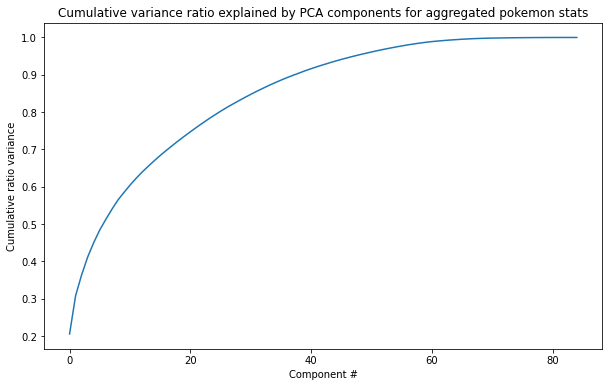

In [10]:
pokemon_data_nonnumeric = pokemon_data.select_dtypes(include='object', exclude='number')
pokemon_data_numeric = pokemon_data.select_dtypes(include='number')
data_scaled = scale(pokemon_data_numeric)
pokemon_data_scaled = pd.DataFrame(data_scaled, index=pokemon_data.index, columns=pokemon_data_numeric.columns)
pokemon_data_fit = PCA().fit(pokemon_data_scaled)

plt.subplots(figsize=(10, 6))
plt.plot(pokemon_data_fit.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for aggregated pokemon stats');

This is a strong improvement from last time.  Now 10 components explain about 60% of the variance, 20 explain about 75%, 30 explain about 85%, and 40 explain about 90%.  We can probably better interpret this

In [11]:
pokemon_data_comp = pokemon_data_fit.transform(pokemon_data_scaled)
pokemon_data_comp.shape

(738, 85)

Now let's look into the details of the principal components more, particularly which features they involve:

In [12]:
pokemon_data_compdf = pd.DataFrame(pokemon_data_fit.components_, columns=pokemon_data_numeric.columns)
pokemon_data_compdf.head()

,hp,atk,def,spa,spd,spe,weight,height,format codes,Weaknesses,...,Ability Cutoff 1,Ability Cutoff 2,Ability Cutoff 3,Ability Cutoff 4,Ability Cutoff 5,Ability Cutoff 6,Best Ability,Best Ability <100,Unique Powerful Ability,Stat Total
0,0.125223,0.108344,0.089956,0.136990,0.124144,0.076254,0.078732,0.100603,0.131538,0.013327,...,0.028350,0.035454,0.041320,0.034163,0.027967,0.019851,0.040459,0.009674,-0.022793,0.167500
1,0.070310,0.202966,0.104472,-0.072231,-0.027216,0.026620,0.118308,0.080250,0.057329,-0.005083,...,0.002792,-0.010247,-0.026938,-0.023087,-0.048892,-0.033070,-0.029754,0.002381,-0.002231,0.078666
2,-0.012819,0.010607,0.042431,-0.008007,0.012446,0.008285,0.029724,0.011553,0.004990,0.010610,...,-0.101061,-0.309495,-0.368777,-0.384685,-0.376970,-0.338632,-0.429416,-0.064311,0.217157,0.013849
3,-0.164562,-0.154259,-0.166516,-0.244254,-0.202990,-0.178261,-0.178114,-0.180348,-0.235648,0.029003,...,0.026171,0.013182,-0.014028,-0.012382,-0.025797,-0.036961,0.001466,0.067841,-0.057377,-0.282331
4,-0.063412,0.020832,0.167558,-0.021144,0.037172,-0.095920,0.066444,0.034511,0.076055,0.154368,...,0.137158,0.147543,0.089313,0.087218,0.041614,-0.024818,0.104505,0.152200,-0.006394,0.013520


In [13]:
pokemon_data_compdf.loc[0, :].sort_values(ascending=False).head(19)

Special Cutoff 3       0.210798
Special Coverage 5     0.208296
Special Cutoff 2       0.206644
Special Cutoff 4       0.205843
Special Cutoff 1       0.205362
Special Coverage 4     0.201656
Special Coverage 3     0.200673
Special Coverage 6     0.198249
Special Coverage 2     0.197935
Special Cutoff 5       0.196854
Special Coverage 7     0.195483
Special Cutoff 6       0.195246
Special Coverage 1     0.193164
Special Coverage 8     0.183195
Special Cutoff 7       0.168388
Stat Total             0.167500
Special Coverage 10    0.151683
Special Coverage 9     0.145550
spa                    0.136990
Name: 0, dtype: float64

This component is very interesting and mainly captures how good the special moves of a pokemon are

In [14]:
pokemon_data_compdf.loc[1, :].sort_values(ascending=False).head(11)

Physical Cutoff 2      0.247312
Physical Cutoff 4      0.245284
Physical Cutoff 3      0.241934
Physical Cutoff 1      0.241393
Physical Cutoff 5      0.230653
Physical Coverage 2    0.211521
Physical Coverage 3    0.210671
Physical Coverage 1    0.207852
Physical Cutoff 6      0.204082
atk                    0.202966
Physical Coverage 4    0.174880
Name: 1, dtype: float64

In [15]:
pokemon_data_compdf.loc[1, :].sort_values().head(11)

Trick                -0.166249
Trick Room           -0.153642
Special Cutoff 5     -0.151713
Screens              -0.150338
Special Cutoff 7     -0.143669
Special Cutoff 6     -0.141152
Special Cutoff 4     -0.136518
Special Cutoff 2     -0.134258
Misc Status          -0.125277
Special Coverage 1   -0.124485
Cleric               -0.123497
Name: 1, dtype: float64

And the second component captures mainly how good physical moves are, combined with a bit about the physical strength.  It's correlated against special cutoffs and trick room and screens, meaning it really values physical over special pokemon who are offensive and fast and aren't focused on status abilities

In [16]:
pokemon_data_compdf.loc[2, :].sort_values(ascending=False).head(10)

Unique Powerful Ability    0.217157
Immune                     0.123579
Resistance Index           0.116771
Burn                       0.090303
Removal Deterrent          0.076913
STAB                       0.060666
Trick                      0.057888
def                        0.042431
Strong Resists             0.040870
Special Cutoff 6           0.039440
Name: 2, dtype: float64

In [17]:
pokemon_data_compdf.loc[2, :].sort_values().head(10)

Best Ability       -0.429416
Ability Cutoff 4   -0.384685
Ability Cutoff 5   -0.376970
Ability Cutoff 3   -0.368777
Ability Cutoff 6   -0.338632
Ability Cutoff 2   -0.309495
Weather Set        -0.117872
Status Absorber    -0.108464
Ability Cutoff 1   -0.101061
Setup              -0.068070
Name: 2, dtype: float64

The third feature is a little more strange, but seems to capture the unique powerful abilities combined with immunities and resistance index (and even burn which lowers the atk of opposing pokemon), so it mainly captures something defensive.  Removal deterrant probably just correlates with ghost type since it has high resistance index and immunities.

Mostly it's a negative correlation, strongly emphasizing powerful unique abilities rather than any other ability (weather set is also an ability as is status absorber!).  Setup is usually more offensive, though not always

In [18]:
pokemon_data_compdf.loc[3, :].sort_values(ascending=False).head(20)

Physical Cutoff 1      0.158303
Physical Coverage 1    0.153519
Physical Coverage 3    0.151229
Physical Coverage 2    0.146356
Physical Cutoff 2      0.132619
Physical Cutoff 3      0.118426
Phaze                  0.114292
Special Coverage 1     0.114004
Toxic                  0.113665
Physical Cutoff 4      0.112093
Special Coverage 3     0.104912
Special Coverage 2     0.103863
Special Coverage 4     0.099427
Trick                  0.093750
Special Cutoff 1       0.091881
Physical Cutoff 5      0.089021
Entry Hazards          0.086654
Special Cutoff 5       0.080859
Misc Status            0.080754
Special Cutoff 2       0.079700
Name: 3, dtype: float64

In [19]:
pokemon_data_compdf.loc[3, :].sort_values().head(20)

Stat Total             -0.282331
Special Coverage 9     -0.252078
spa                    -0.244254
Special Coverage 10    -0.238311
format codes           -0.235648
spd                    -0.202990
height                 -0.180348
spe                    -0.178261
weight                 -0.178114
def                    -0.166516
hp                     -0.164562
atk                    -0.154259
Special Coverage 8     -0.138008
Pivot                  -0.127578
Unique Powerful Move   -0.127014
Electro Ball           -0.107641
Weather Gimmick        -0.097102
Screens                -0.095828
Resists                -0.089964
Hazard Removal         -0.083146
Name: 3, dtype: float64

Another mostly negative feature, penalizing stats, special orientation and even format codes, but with some positive correlation to physical movesets, as well as phazing and toxic moves

In [20]:
pokemon_data_compdf.loc[4, :].sort_values(ascending=False).head(20)

STAB                 0.320903
Resistance Index     0.317930
Immune               0.314361
Removal Deterrent    0.270175
Strong Resists       0.251487
Gyro Ball            0.199150
Burn                 0.198039
def                  0.167558
Weaknesses           0.154368
Best Ability <100    0.152200
Resists              0.152177
Misc Status          0.151906
Ability Cutoff 2     0.147543
Entry Hazards        0.137824
Ability Cutoff 1     0.137158
Trick                0.132744
Trick Room           0.129494
Strong Weaknesses    0.127563
Physical Cutoff 6    0.124607
Best Ability         0.104505
Name: 4, dtype: float64

In [21]:
pokemon_data_compdf.loc[4, :].sort_values().head(20)

Pivot                  -0.143002
Paralyze               -0.122800
Electro Ball           -0.112202
Special Coverage 7     -0.104152
spe                    -0.095920
Cleric                 -0.084519
Special Coverage 6     -0.079351
Physical Coverage 1    -0.078881
Physical Coverage 2    -0.076197
Physical Coverage 3    -0.074434
Special Cutoff 7       -0.073430
Unique Powerful Move   -0.070218
hp                     -0.063412
Special Cutoff 1       -0.057277
Physical Cutoff 1      -0.053103
Special Cutoff 2       -0.051203
Weather Gimmick        -0.046791
Special Coverage 8     -0.043965
Physical Cutoff 2      -0.043734
Special Cutoff 3       -0.042738
Name: 4, dtype: float64

This is a mostly positive feature about type strength, having stab and resistances (removal deterrant which is often ghost type).  There's some negativity about pivots and paralysis but it doesn't seem that significant

In [22]:
pokemon_data_compdf.loc[5, :].sort_values(ascending=False).head(20)

Heavy Moves           0.229540
weight                0.202379
Entry Hazards         0.188893
def                   0.149871
Gyro Ball             0.137269
hp                    0.107644
Special Cutoff 7      0.106956
height                0.099450
Weather Speed         0.097301
Screens               0.091479
Trick Room            0.087913
Cleric                0.084470
spd                   0.082566
Physical Cutoff 5     0.079777
Weaknesses            0.078106
Sleep                 0.076034
Weather Set           0.073826
Special Coverage 7    0.064696
Physical Cutoff 6     0.060329
HP Recovery           0.055689
Name: 5, dtype: float64

In [23]:
pokemon_data_compdf.loc[5, :].sort_values().head(20)

Pivot                     -0.343484
spe                       -0.296438
Tailwind                  -0.279487
Priority                  -0.263252
Hazard Removal            -0.251568
Taunt                     -0.222916
Immune                    -0.209749
Resistance Index          -0.196822
Electro Ball              -0.149417
Setup                     -0.144535
Item Removal              -0.130869
Physical Coverage 2       -0.125481
Physical Coverage 1       -0.120909
Removal Deterrent         -0.104542
Paralyze                  -0.089780
Burn                      -0.073821
Unique Powerful Move      -0.073228
STAB                      -0.065853
Trick                     -0.064703
Unique Powerful Ability   -0.057367
Name: 5, dtype: float64

This is another interesting feature which prioritizes heavy, slow pokemon (gyro ball, often steel type as well) that often have heavy moves, are bulky and can set entry hazard, as compared to those who are fast pivots that remove hazards

In [24]:
pokemon_data_compdf.loc[6, :].sort_values(ascending=False).head(20)

HP Drain               0.298131
Weaknesses             0.268944
Screens                0.220605
Sleep                  0.211101
Trick Room             0.210802
Trick                  0.200951
Priority               0.187677
Cleric                 0.171076
HP Recovery            0.166679
Taunt                  0.163017
Item Removal           0.161109
Setup                  0.156409
spe                    0.151705
Physical Cutoff 6      0.133681
spa                    0.119652
Stat Total             0.115997
spd                    0.102612
Special Coverage 10    0.092529
Removal Deterrent      0.091708
atk                    0.090073
Name: 6, dtype: float64

In [25]:
pokemon_data_compdf.loc[6, :].sort_values().head(20)

Resistance Index       -0.284016
Resists                -0.197800
Strong Weaknesses      -0.160581
Unique Powerful Move   -0.133997
Entry Hazards          -0.125630
Tailwind               -0.116260
Heavy Moves            -0.114874
Immune                 -0.113956
Strong Resists         -0.111308
Special Coverage 2     -0.101116
Special Coverage 4     -0.099109
Special Coverage 3     -0.097170
Gyro Ball              -0.094353
Special Coverage 1     -0.083503
Paralyze               -0.075456
Ability Cutoff 6       -0.070171
weight                 -0.069284
Special Cutoff 7       -0.061519
Special Cutoff 1       -0.057874
Hazard Removal         -0.057647
Name: 6, dtype: float64

This seems like a mostly positive feature favoring status oriented grass types (which is why it's favoring seemingly nonsensical things like "weakness", these cleric types often having hp drain and recovery, cleric, are slow and can use trick room, have screens and sleep, etc.

In [26]:
pokemon_data_compdf.loc[7, :].sort_values(ascending=False).head(20)

Weather Speed         0.330284
Best Ability <100     0.262658
Hazard Removal        0.232852
HP Recovery           0.211132
Tailwind              0.209857
STAB                  0.193734
Ability Cutoff 2      0.182140
Sleep                 0.181338
Strong Weaknesses     0.178285
Toxic                 0.175947
Strong Resists        0.174628
Weather Gimmick       0.152212
Resists               0.128907
Ability Cutoff 1      0.098803
Weaknesses            0.090855
Setup                 0.080915
HP Drain              0.080138
Special Coverage 7    0.071214
Special Cutoff 7      0.071056
Special Coverage 6    0.061740
Name: 7, dtype: float64

In [27]:
pokemon_data_compdf.loc[7, :].sort_values().head(20)

Removal Deterrent         -0.224548
Trick                     -0.197646
Ability Cutoff 5          -0.185276
Ability Cutoff 6          -0.184278
Trick Room                -0.173747
Immune                    -0.163592
Unique Powerful Ability   -0.151165
Ability Cutoff 4          -0.145953
Misc Status               -0.119367
Trapper                   -0.111159
Taunt                     -0.109353
Paralyze                  -0.107906
Burn                      -0.103709
weight                    -0.101695
Weather Set               -0.097411
Unique Powerful Move      -0.092475
Resistance Index          -0.073268
Gyro Ball                 -0.067203
Heavy Moves               -0.062242
hp                        -0.053140
Name: 7, dtype: float64

This one is a little harder to interpret, it favors weather speed which is good to see being noticed, but it also favors other good abilities which aren't unique (thus favoring things not super high in ability cutoff)

In [28]:
pokemon_data_compdf.loc[8, :].sort_values(ascending=False).head(20)

Best Ability <100     0.412235
Electro Ball          0.276777
Ability Cutoff 2      0.184387
Priority              0.166903
Resists               0.157215
Burn                  0.152326
Ability Cutoff 3      0.108200
Special Coverage 7    0.106455
Special Coverage 6    0.106345
Paralyze              0.097699
Resistance Index      0.095513
Trapper               0.093720
Screens               0.091283
Weather Speed         0.084823
spe                   0.072613
Special Coverage 8    0.071268
Removal Deterrent     0.064730
Ability Cutoff 1      0.064327
Gyro Ball             0.063693
Unique Shield         0.060670
Name: 8, dtype: float64

In [29]:
pokemon_data_compdf.loc[8, :].sort_values().head(20)

Tailwind                  -0.311573
HP Recovery               -0.264126
Hazard Removal            -0.260092
Ability Cutoff 6          -0.233301
Weaknesses                -0.187554
HP Drain                  -0.181141
Status Absorber           -0.150059
Unique Powerful Ability   -0.134139
Ability Cutoff 5          -0.118731
STAB                      -0.103598
Weather Set               -0.091238
Special Coverage 4        -0.088668
Strong Weaknesses         -0.088366
Special Coverage 3        -0.083594
Special Coverage 2        -0.082861
hp                        -0.075367
Immune                    -0.074913
Unique Powerful Move      -0.072686
Special Coverage 1        -0.065904
height                    -0.060834
Name: 8, dtype: float64

This looks like it's favoring pretty fast (often with priority) non-flying types (often electric) with good abilities that aren't unique, often with good typings as well and burn/paralysis crippling

In [30]:
pokemon_data_compdf.loc[9, :].sort_values(ascending=False).head(20)

Electro Ball               0.358181
Strong Weaknesses          0.265302
Paralyze                   0.234453
Screens                    0.226546
STAB                       0.222755
Entry Hazards              0.190266
Strong Resists             0.161982
Gyro Ball                  0.156066
Trapper                    0.155949
HP Drain                   0.155600
Weather Gimmick            0.148793
Pivot                      0.133845
Resists                    0.132097
Unique Powerful Ability    0.123349
Status Absorber            0.118991
Ability Cutoff 6           0.114727
Physical Cutoff 3          0.107688
Unique Shield              0.100971
Item Removal               0.097339
Ability Cutoff 5           0.093832
Name: 9, dtype: float64

In [31]:
pokemon_data_compdf.loc[9, :].sort_values().head(20)

Phaze                  -0.251683
height                 -0.184076
Removal Deterrent      -0.176443
Best Ability <100      -0.164532
weight                 -0.150475
Ability Cutoff 2       -0.135706
Burn                   -0.133819
Tailwind               -0.132113
Ability Cutoff 1       -0.130878
hp                     -0.110519
Immune                 -0.092615
Special Coverage 10    -0.083216
Unique Powerful Move   -0.076129
Ability Cutoff 3       -0.074157
atk                    -0.058455
Stat Total             -0.057981
spd                    -0.048164
Weaknesses             -0.044716
Best Ability           -0.044544
Special Coverage 3     -0.044426
Name: 9, dtype: float64

This one looks strangely specific, like it's favoring "Magnezone" like pokemon, electric steel type who are slow and can paralyze and screen and trap, it's also anti phazer which is interesting

This has been interesting, but it's obvious there are some useless features and especially some redundant one's.  We may want to try this one more time while removing those:

In [32]:
pokemon_data.columns

Index(['hp', 'atk', 'def', 'spa', 'spd', 'spe', 'weight', 'height', 'formats',
       'generation', 'format codes', 'Weaknesses', 'Strong Weaknesses',
       'Resists', 'Strong Resists', 'Immune', 'STAB', 'Resistance Index',
       'Entry Hazards', 'Taunt', 'Hazard Removal', 'Removal Deterrent',
       'Cleric', 'Sleep', 'Pivot', 'Item Removal', 'Paralyze', 'Burn', 'Toxic',
       'Trick', 'Phaze', 'Screens', 'Tailwind', 'Trapper', 'Status Absorber',
       'Unaware', 'Setup', 'Priority', 'Heavy Moves', 'Gyro Ball',
       'Electro Ball', 'Unique Shield', 'HP Drain', 'HP Recovery',
       'Weather Set', 'Weather Speed', 'Weather Gimmick', 'Trick Room',
       'Physical Cutoff 1', 'Physical Cutoff 2', 'Physical Cutoff 3',
       'Physical Cutoff 4', 'Physical Cutoff 5', 'Physical Cutoff 6',
       'Physical Coverage 1', 'Physical Coverage 2', 'Physical Coverage 3',
       'Physical Coverage 4', 'Special Cutoff 1', 'Special Cutoff 2',
       'Special Cutoff 3', 'Special Cutoff 4', 'Speci

Features we can definitely remove are:
- height
- weaknesses
- strong weaknesses
- resists
- strong resists
- immune (those last 5 are captured in resistance index)
- some physical cutoffs, physical coverages, special cutoffs, special coverages and ability cutoffs

For physical cutoff we'll just keep 1 and 5, physical coverage just 3 and 4, special cutoff just 1 and 7, special coverage just 5 and 7, and 5 for ability

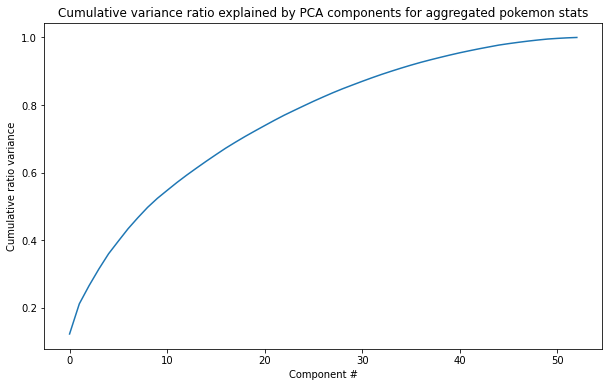

In [2]:
pokemon_data_pca = pokemon_data.drop(columns=['height', 'Weaknesses', 'Strong Weaknesses', 'Resists', 'Strong Resists',
                                              'Immune', 'Physical Cutoff 2', 'Physical Cutoff 3',
                                              'Physical Cutoff 4', 'Physical Cutoff 6', 'Physical Coverage 1',
                                              'Physical Coverage 2', 'Special Cutoff 2', 'Special Cutoff 3',
                                              'Special Cutoff 4', 'Special Cutoff 5', 'Special Cutoff 6', 'Special Coverage 1',
                                              'Special Coverage 2', 'Special Coverage 3', 'Special Coverage 4',
                                              'Special Coverage 6', 'Special Coverage 8', 'Special Coverage 9',
                                              'Special Coverage 10', 'Ability Cutoff 1', 'Ability Cutoff 2',
                                              'Ability Cutoff 3', 'Ability Cutoff 4', 'Ability Cutoff 6', 'format codes'])

pokemon_data_nonnumeric = pokemon_data_pca.select_dtypes(include='object', exclude='number')
pokemon_data_numeric = pokemon_data_pca.select_dtypes(include='number')
data_scaled = scale(pokemon_data_numeric)
pokemon_data_scaled = pd.DataFrame(data_scaled, index=pokemon_data.index, columns=pokemon_data_numeric.columns)
pokemon_data_fit = PCA().fit(pokemon_data_scaled)

plt.subplots(figsize=(10, 6))
plt.plot(pokemon_data_fit.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for aggregated pokemon stats');

In [3]:
pokemon_data_comp = pokemon_data_fit.transform(pokemon_data_scaled)
pokemon_data_comp.shape

(738, 53)

Maybe consider plotting some of these as scree plots too! So I can visually see elbows better

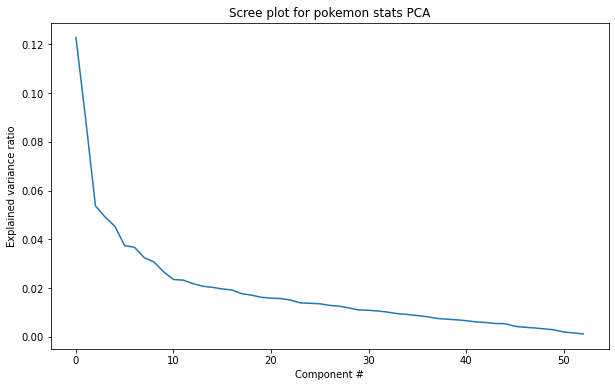

In [4]:
plt.subplots(figsize=(10, 6))
plt.plot(pokemon_data_fit.explained_variance_ratio_)
plt.xlabel('Component #')
plt.ylabel('Explained variance ratio')
plt.title('Scree plot for pokemon stats PCA');

So there is indeed an "elbow" around **10 components**, the components after that starting to explain very little of the variance in the data.

In [5]:
pokemon_data_compdf = pd.DataFrame(pokemon_data_fit.components_, columns=pokemon_data_numeric.columns)
pokemon_data_compdf.head()

,hp,atk,def,spa,spd,spe,weight,STAB,Resistance Index,Entry Hazards,...,Special Cutoff 1,Special Cutoff 7,Special Coverage 5,Special Coverage 7,Misc Status,Unique Powerful Move,Ability Cutoff 5,Best Ability,Best Ability <100,Unique Powerful Ability
0,0.226482,0.206740,0.178648,0.236040,0.222526,0.130283,0.159678,0.093405,0.050835,0.022260,...,0.307858,0.252342,0.313955,0.315081,0.096832,0.125420,0.048005,0.066960,0.020941,-0.042155
1,0.072298,0.249414,0.132713,-0.133230,-0.066178,0.001258,0.163703,-0.037262,-0.005188,0.117931,...,-0.159465,-0.178496,-0.140902,-0.018079,-0.194267,0.051805,-0.089017,-0.058925,-0.008146,0.007926
2,0.052486,0.096219,-0.113295,0.162238,0.014637,0.338917,-0.064279,-0.077251,-0.077198,-0.229542,...,-0.048797,-0.064236,-0.016186,0.037148,-0.203640,0.168093,0.076539,0.039618,-0.101952,0.010687
3,-0.151791,0.053994,-0.019554,-0.004400,-0.056183,0.165299,-0.108585,0.174871,0.294487,-0.074921,...,-0.023458,-0.059879,0.004062,-0.085186,0.104338,0.002869,-0.236976,-0.281397,0.019516,0.248141
4,0.127588,0.037962,0.194384,0.110206,0.155066,-0.042862,0.257425,-0.008142,0.102589,0.016783,...,-0.005989,0.020287,-0.010021,0.030442,-0.031581,0.171358,-0.257897,-0.346825,-0.218030,0.262219


In [6]:
pokemon_data_compdf.loc[0, :].sort_values(ascending=False).head(10)

Special Coverage 7     0.315081
Special Coverage 5     0.313955
Special Cutoff 1       0.307858
Special Cutoff 7       0.252342
spa                    0.236040
Physical Coverage 3    0.228729
hp                     0.226482
spd                    0.222526
Physical Coverage 4    0.221308
Physical Cutoff 1      0.212095
Name: 0, dtype: float64

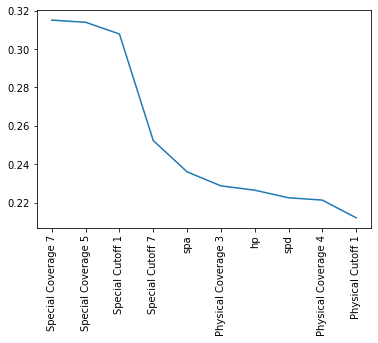

In [7]:
plt.plot(pokemon_data_compdf.loc[0, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

In [8]:
pokemon_data_compdf.loc[0, :].sort_values().head(10)

Trapper                   -0.055125
Weather Speed             -0.049055
Unique Powerful Ability   -0.042155
Priority                  -0.023572
Unaware                   -0.021071
Sleep                     -0.009221
Status Absorber           -0.003013
Unique Shield             -0.001674
Electro Ball               0.002085
Item Removal               0.018740
Name: 0, dtype: float64

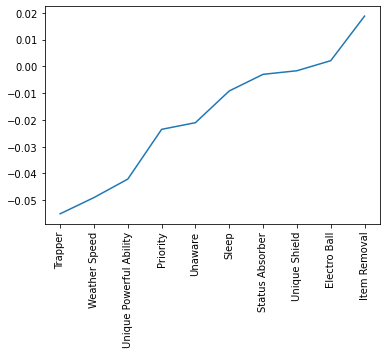

In [9]:
plt.plot(pokemon_data_compdf.loc[0, :].sort_values().head(10))
plt.xticks(rotation = 90)
plt.show()

Our **first component** is predominantly positive, the most explanatory features beign stat total, special coverage, special cutoff, and special attack

In [10]:
pokemon_data_compdf.loc[1, :].sort_values(ascending=False).head(20)

Physical Cutoff 1          0.293868
Physical Cutoff 5          0.281921
atk                        0.249414
Physical Coverage 3        0.247495
Physical Coverage 4        0.214292
Heavy Moves                0.174985
weight                     0.163703
def                        0.132713
Entry Hazards              0.117931
Taunt                      0.077400
hp                         0.072298
Unique Powerful Move       0.051805
Item Removal               0.051169
Setup                      0.037458
Weather Speed              0.024828
Gyro Ball                  0.011325
Unique Shield              0.009264
Priority                   0.008635
Unique Powerful Ability    0.007926
spe                        0.001258
Name: 1, dtype: float64

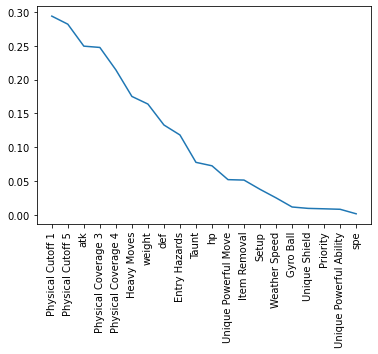

In [11]:
plt.plot(pokemon_data_compdf.loc[1, :].sort_values(ascending=False).head(20))
plt.xticks(rotation = 90)
plt.show()

In [12]:
pokemon_data_compdf.loc[1, :].sort_values().head(10)

Screens            -0.261177
Trick              -0.250421
Trick Room         -0.242955
Cleric             -0.197242
Misc Status        -0.194267
HP Recovery        -0.187323
Special Cutoff 7   -0.178496
Paralyze           -0.178241
Sleep              -0.175950
Weather Gimmick    -0.171606
Name: 1, dtype: float64

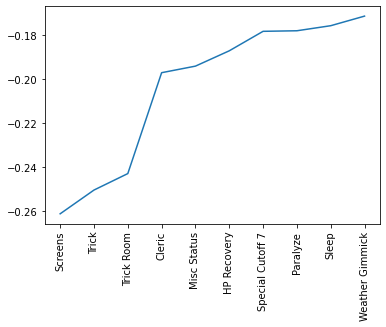

In [13]:
plt.plot(pokemon_data_compdf.loc[1, :].sort_values().head(10))
plt.xticks(rotation = 90)
plt.show()

**2nd component**

Positive features: physical cutoff, physical coverage, attack, heavy moves, weight, defense, entry hazard, taunt

Negative features: screens, trick, trick room, misc status

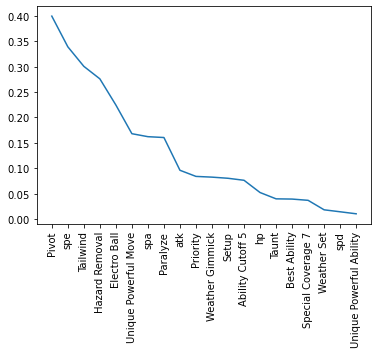

In [14]:
plt.plot(pokemon_data_compdf.loc[2, :].sort_values(ascending=False).head(20))
plt.xticks(rotation = 90)
plt.show()

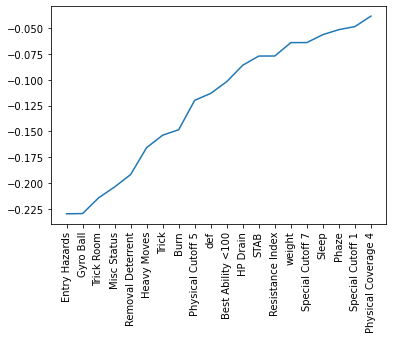

In [15]:
plt.plot(pokemon_data_compdf.loc[2, :].sort_values().head(20))
plt.xticks(rotation = 90)
plt.show()

**Third component**

Positive features: Pivot, spe, Tailwind, Hazard Removal, Electro Ball, spa

Negative features: Entry Hazards, Gyro Ball, Misc Status, Trick Room, Removal Deterrent, Heavy Moves, Trick, Burn

I'm concerned that some features might be problematic, like Electro Ball and Gyro Ball, due to high correlations with specific types, which would thus tell us the type of the pokemon rather than whether the move is going to be used, which is problematic

In [31]:
pokemon_data.columns

Index(['hp', 'atk', 'def', 'spa', 'spd', 'spe', 'weight', 'height', 'formats',
       'generation', 'format codes', 'Weaknesses', 'Strong Weaknesses',
       'Resists', 'Strong Resists', 'Immune', 'STAB', 'Resistance Index',
       'Entry Hazards', 'Taunt', 'Hazard Removal', 'Removal Deterrent',
       'Cleric', 'Sleep', 'Pivot', 'Item Removal', 'Paralyze', 'Burn', 'Toxic',
       'Trick', 'Phaze', 'Screens', 'Tailwind', 'Trapper', 'Status Absorber',
       'Unaware', 'Setup', 'Priority', 'Heavy Moves', 'Gyro Ball',
       'Electro Ball', 'Unique Shield', 'HP Drain', 'HP Recovery',
       'Weather Set', 'Weather Speed', 'Weather Gimmick', 'Trick Room',
       'Physical Cutoff 1', 'Physical Cutoff 2', 'Physical Cutoff 3',
       'Physical Cutoff 4', 'Physical Cutoff 5', 'Physical Cutoff 6',
       'Physical Coverage 1', 'Physical Coverage 2', 'Physical Coverage 3',
       'Physical Coverage 4', 'Special Cutoff 1', 'Special Cutoff 2',
       'Special Cutoff 3', 'Special Cutoff 4', 'Speci

In [16]:
pokemon_data['Electro Ball'].corr(pokemon_types_df['Electric'])

0.8462474892607924

In [17]:
pokemon_data['Gyro Ball'].corr(pokemon_types_df['Steel'])

0.2646252572513137

In [18]:
for col in pokemon_data.select_dtypes(include='number').columns:
    for typ in pokemon_types_df.columns:
        corr = pokemon_data[col].corr(pokemon_types_df[typ])
        if corr >= .3:
            print(col, 'correlates', round(corr, 2), 'with', typ)

Weaknesses correlates 0.37 with Grass
Strong Weaknesses correlates 0.32 with Rock
Resists correlates 0.58 with Steel
Strong Resists correlates 0.32 with Steel
Immune correlates 0.61 with Ghost
Resistance Index correlates 0.43 with Ghost
Resistance Index correlates 0.62 with Steel
Entry Hazards correlates 0.44 with Rock
Taunt correlates 0.38 with Dark
Hazard Removal correlates 0.51 with Flying
Removal Deterrent correlates 0.79 with Ghost
Cleric correlates 0.35 with Fairy
Pivot correlates 0.37 with Electric
Paralyze correlates 0.39 with Electric
Burn correlates 0.59 with Fire
Burn correlates 0.55 with Ghost
Trick correlates 0.36 with Ghost
Trick correlates 0.49 with Psychic
Screens correlates 0.49 with Psychic
Tailwind correlates 0.65 with Flying
Electro Ball correlates 0.85 with Electric
HP Drain correlates 0.5 with Grass
HP Recovery correlates 0.37 with Grass
Trick Room correlates 0.67 with Psychic
Physical Cutoff 1 correlates 0.31 with Fighting
Physical Cutoff 3 correlates 0.31 with F

Type attributes like weaknesses and resistance index are allowed to correlate with type, since they are supposed to capture that sort of information

Entry Hazard correlating with Rock is slightly problematic, but it is an important feature since entry hazards are such an important part of the game, so not sure I should do anything about it

Taunt correlating with Dark is bad if Taunt isn't particular good

Hazard Removal correlating is Flying is also slightly problematic, but makes sense with defog

Removal deterrent correlating with ghost makes sense due to spin block

When it comes to features like that, I could "tier" them so that defog and removal deterrent are still important, but not so weighted in favor of those types

Cleric correlating with fairy kind of makes sense and it isn't too high

Pivot correlating with electric makes sense due to volt switch

Paralyze and burn aren't necessarily problematic, seems like they should correlate with certain types

Trick correlating with ghost and psychic might be bad if it isn't used a lot

Screens correlating with psychic might explain why it comes up as a feature so much given how little it is used

Tailwind correlating with flying, same thing, not a very good move but still gives a boost to all flyers

Electro Ball correlating so much with electric definitely feels problematic

Drain and recovery correlating with grass makes sense

trick room correlating with psychic so much might be slight problem

misc status correlating with ghost is a little strange, but we'll see

cutoffs and coverage aren't really a problem, given correlations aren't very high

In [19]:
moves_cindex = pd.DataFrame(0, index=pokemon_learnsets_df.columns, columns=['n_learnset', 'n_competitive', 'cindex'])

for pokemon, formatlist in cindex_dict.items():
    already_checked = []
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                moveset_name = [name for name in moveset.keys() if name != 'abilities'][0]
                for move in moveset[moveset_name]:
                    if move in dup_moves:
                        move = dup_moves_df.loc[move, 'collapse']
                    if move not in already_checked:
                        moves_cindex.loc[move, 'n_competitive'] += 1
                        already_checked.append(move)
                        
for move in pokemon_learnsets_df.columns:
    moves_cindex.loc[move, 'n_learnset'] = pokemon_learnsets_df.drop(index=pokemon_noncompetitive)[move].sum()
    
for move in moves_cindex.index:
    moves_cindex.loc[move, 'power'] = moves_df.loc[move, 'power']
    moves_cindex.loc[move, 'type'] = moves_df.loc[move, 'type']
    moves_cindex.loc[move, 'category'] = moves_df.loc[move, 'category']

moves_cindex['cindex'] = 100*(moves_cindex['n_competitive'] / moves_cindex['n_learnset'])

In [20]:
moves_cindex.loc[['Taunt', 'Defog', 'Volt Switch', 'Thunder Wave', 'Glare', 'Will-O-Wisp', 'Trick', 'Reflect', 'Light Screen', 'Tailwind', 'Electro Ball', 'Trick Room', 'Gyro Ball', 'Toxic'], :].sort_values(by='cindex')

,n_learnset,n_competitive,cindex,power,type,category
Electro Ball,36,1,2.777778,0.0,Electric,Special
Tailwind,68,2,2.941176,0.0,Flying,Non-Damaging
Reflect,164,6,3.658537,0.0,Psychic,Non-Damaging
Light Screen,153,6,3.921569,0.0,Psychic,Non-Damaging
Gyro Ball,60,3,5.000000,0.0,Steel,Physical
Trick Room,75,5,6.666667,0.0,Psychic,Non-Damaging
Taunt,134,29,21.641791,0.0,Dark,Non-Damaging
Thunder Wave,144,36,25.000000,0.0,Electric,Non-Damaging
Toxic,350,124,35.428571,0.0,Poison,Non-Damaging
Trick,98,37,37.755102,0.0,Psychic,Non-Damaging


In [50]:
moves_cindex.loc[['Stealth Rock', 'Spikes', 'Toxic Spikes','Sticky Web'], :]

,n_learnset,n_competitive,cindex,power,type,category
Stealth Rock,91,71,78.021978,0.0,Rock,Non-Damaging
Spikes,22,20,90.909091,0.0,Ground,Non-Damaging
Toxic Spikes,24,12,50.000000,0.0,Poison,Non-Damaging
Sticky Web,6,6,100.000000,0.0,Bug,Non-Damaging


We have a pretty obvious difference in how good some of these features are

Electro Ball, Tailwind, Reflect, Light Screen and Trick Room just aren't very good, so noting that a pokemon has such a move doesn't really say much as a feature

The other moves are actually quite good, so even if they have some correlations with type, doesn't mean they shouldn't be features (though we could consider "tiering" them).

Electro Ball and Gyro Ball I feel should just be considered regular moves for the purposes of some models, but in the case of random forest I can't help but wonder whether they could still be useful, so I'm not sure, but I'm leaning towards deleting them since they just aren't exceptional moves, and putting them back into the standard moves where they have a chance to make cutoffs.

Tailwind, Screens and Trick Room should fall under misc status, will have to look back to see where they rank.  Taunt and Trick could arguably be mixed status, just higher up.  Toxic may be too common to be meaningful so might just be put back into misc status, it's near a level with Trick, Taunt is probably even less good but those three seem like they could be very good mixed status moves.

Toxic should be just considered indiscrimate, so I won't include it, it will just removed since it doesn't contain enough information, it is used even more than other indiscriminate moves like Sunny Day and Confide, Taunt is close but still around the level of safeguard which was still included in misc status so I will include

Trick will be a new level 3 misc status, taunt will be level 2, and the others will be level 1 (Tailwind, Screens, Trick Room)

Entry hazard moves should arguably be tiered so as not to favor certain types too much: sticky web being best, followed by spikes, followed by stealth rock, followed by toxic spikes

Removal deterrent should be a hierarchy with ghost being less significant, this will lower its correlation with ghost type and thus make it slightly more informative as a feature while not removing the influence of the ghost type

Trapper, Status Absorber, Unaware, Heavy Moves, Unique Shield and Weather Gimmick are all suspiciously niche and need to be checked out.  I think weather speed arguably deserves to be included as the highest level of weather gimmick, thus collapsing those features.  Unique Shield will just end up being misc status once aggregated into a move, but maybe even higher level than trick.

May also want to consider features like phazer and status conditions under misc status moves, which may make that feature more interesting and informative while removing not as informative features (status features show up a lot in our highly correlated one's and phazer may not make enough differentiation between the different moves in its domain)

This may decrease the weirdness of things, we'll have to see

In [21]:
abilities_cindex.loc[['Arena Trap', 'Magnet Pull', 'Shadow Tag'], :]

,n_abilityset,n_competitive,cindex
Arena Trap,1,1,100.0
Magnet Pull,2,2,100.0
Shadow Tag,1,0,0.0


A new idea for this feature, so that this isn't a unique powerful ability on the one hand, or a not very informative feature on the other hand (due to sheer rarity, it seems absurd to consider it equally informative to the model as basic stats or things like pivot, priority, etc.):

We can aggregate it into a new collective ability called "Trapper", just like we did with some moves.  We can do the same thing with "Status Absorber" abilities.  This will replace these abilities in the cindex with a collective quite strong ability that will be well represented as a high ranking ability in the ability cutoff attribute

In [24]:
abilities_cindex.loc[['Natural Cure', 'Shed Skin'], :]

,n_abilityset,n_competitive,cindex
Natural Cure,9,9,100.0
Shed Skin,2,2,100.0


In [25]:
abilities_cindex.loc[['Unaware'], :]

,n_abilityset,n_competitive,cindex
Unaware,4,2,50.0


That straight does not deserve to be a feature, it's barely a middling ability in terms of usage, even if constitutes a role it won't be predictive since there are just so many better abilities (e.g. the status absorber abilities), AND it's probabilistically only informative about 50% of the pokemon that have it

In [26]:
moves_cindex.loc[['Heat Crash', 'Heavy Slam'], :]

,n_learnset,n_competitive,cindex,power,type,category
Heat Crash,21,5,23.809524,0.0,Fire,Physical
Heavy Slam,44,10,22.727273,0.0,Steel,Physical


Given the low cindeces, these moves probably aren't very informative as features and will just be dumped back into the rest of the moves as well

In [30]:
moves_cindex.loc[['Whirlwind', 'Roar', 'Yawn', 'Perish Song', 'Haze', 'Clear Smog', 'Destiny Bond', 'Encore', 'Circle Throw', 'Dragon Tail'], :].sort_values(by='cindex')

,n_learnset,n_competitive,cindex,power,type,category
Roar,106,7,6.603774,0.0,Normal,Non-Damaging
Perish Song,14,1,7.142857,0.0,Normal,Non-Damaging
Dragon Tail,53,6,11.320755,60.0,Dragon,Physical
Destiny Bond,29,4,13.793103,0.0,Ghost,Non-Damaging
Clear Smog,14,2,14.285714,50.0,Poison,Special
Encore,65,10,15.384615,0.0,Normal,Non-Damaging
Whirlwind,22,4,18.181818,0.0,Normal,Non-Damaging
Haze,42,8,19.047619,0.0,Ice,Non-Damaging
Yawn,42,9,21.428571,0.0,Normal,Non-Damaging
Circle Throw,7,2,28.571429,60.0,Fighting,Physical


These really do seem very appropriate in misc status, especially given how rarely they are used (not representative in most cases), how debated the precise definition of "phazing" is in competitive play, and how similar to indices are to the kind of indeces in misc status

Dragon Tail through Circle Throw are all misc status = 2 moves (we'll assume Dragon Tail and Circle Throw average out at a sensible index for an =2 move)

Roar and Perish Song are misc status = 1

In [31]:
moves_cindex.loc[['Sing', 'Hypnosis', 'Sleep Powder', 'Lovely Kiss', 'Spore'], :]

,n_learnset,n_competitive,cindex,power,type,category
Sing,28,0,0.000000,0.0,Normal,Non-Damaging
Hypnosis,34,3,8.823529,0.0,Psychic,Non-Damaging
Sleep Powder,13,8,61.538462,0.0,Grass,Non-Damaging
Lovely Kiss,1,1,100.000000,0.0,Normal,Non-Damaging
Spore,2,2,100.000000,0.0,Grass,Non-Damaging


In [32]:
moves_cindex.loc[['Stun Spore', 'Thunder Wave', 'Glare'], :]

,n_learnset,n_competitive,cindex,power,type,category
Stun Spore,15,4,26.666667,0.0,Grass,Non-Damaging
Thunder Wave,144,36,25.000000,0.0,Electric,Non-Damaging
Glare,5,3,60.000000,0.0,Normal,Non-Damaging


In [33]:
moves_cindex.loc['Will-O-Wisp', :]

n_learnset                 68
n_competitive              26
cindex              38.235294
power                     0.0
type                     Fire
category         Non-Damaging
Name: Will-O-Wisp, dtype: object

I honestly like the idea of folding these into misc status.  Specific status conditions are rarely that essential, they are utilities, there aren't that many good status condition causing moves, and they have cindexes that would fit in:

Sing will just be removed; it isn't good enough for competitive use

- Hypnosis is at level 1
- Stun Spore is at level 2
- Thunder Wave and Will-O-Wisp is at level 3
- Sleep Powder, Lovely Kiss and Glare are at level 4
- Spore is at level 5

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import json
import pandas_profiling
import requests
from bs4 import BeautifulSoup
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

pokemon_df = pd.read_csv('./data/pokemon_df.csv', index_col="name")
pokemon_types_df = pd.read_csv('./data/pokemon_types_df.csv', index_col="name")
pokemon_abilities_df = pd.read_csv('./data/pokemon_abilities_df.csv', index_col="name")
abilities_df = pd.read_csv('./data/abilities_df.csv', index_col="name")
moves_df = pd.read_csv('./data/moves_df.csv', index_col="name")
abilities_removed_df = pd.read_csv('./data/abilities_removed_df.csv')
abilities_removed_df = abilities_removed_df.iloc[:, 0]
abilities_removed_df.name = 'name'
pokemon_learnsets_df = pd.read_csv('./data/pokemon_learnsets_df.csv', index_col='name')

with open("smogonpokemondata2021/smogonpokemondata2021/scraped_data/PokemonData2021.csv", encoding="utf8") as infile:
    strategydex_df = pd.read_csv(infile)

strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<p>.+?<\/p>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<section>.+?<\/section>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<h1>.+?<\/h1>', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('\\\\n', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace("\'", '\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('King\"s', "King\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Maki\"s', "Maki\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Land\"s', "Land\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Dragon\"s', "Dragon\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Sirfetch\"d', "Sirfetch\'d")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Farfetch\"d', "Farfetch\'d")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Nature\"s', "Nature\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Forest\"s', "Forest\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('drampa\"s', "drampa\'s")
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('False', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('True', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('None', '\"\"')
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('\"\"\"\s', '\"', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('<ul>.+?<\/ul', '', regex=True)
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Swipe', 'False Swipe') #newline
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].str.replace('Surrender', 'False Surrender') #newline
strategydex_df['pokemonData'] = strategydex_df['pokemonData'].apply(json.loads)

acceptable_formats = pokemon_df['formats'].unique().tolist()
acceptable_formats.append('ZU')

strategies_dict = {}
strategydexcopy = strategydex_df.copy()

for pokemon in pokemon_df.index:
    pokemon_access = pokemon.replace("'", "").replace(" ", "-").replace(".", "").replace("-10%", "").replace(":", "")
    dex_entry = strategydexcopy.loc[strategydexcopy['pokemonName'] == pokemon_access.lower(), 'pokemonData'].item()
    format_list = []
    for competitive_format in dex_entry['strategies']:
        format_dict = {}
        current_format = competitive_format['format']
        if current_format in acceptable_formats:
            moveset_list = []
            for moveset in competitive_format['movesets']:
                moveset_dict = {}
                moveset_name = moveset['name']
                move_list = []
                for move in moveset['moveslots']:
                    for entry in move:
                        move_list.append(entry['move'])
                moveset_dict[moveset_name] = move_list
                moveset_dict["abilities"] = moveset['abilities']
                moveset_list.append(moveset_dict)
            format_dict[current_format] = moveset_list
            format_list.append(format_dict)
    strategies_dict[pokemon] = format_list

pokemon_df.loc[pokemon_df['formats'] == 'LC', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'NFE', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'Untiered', 'formats'] = 'ZU'
pokemon_df.loc[pokemon_df['formats'] == 'PUBL', 'formats'] = 'NU'
pokemon_df.loc[pokemon_df['formats'] == 'NUBL', 'formats'] = 'RU'
pokemon_df.loc[pokemon_df['formats'] == 'RUBL', 'formats'] = 'UU'
pokemon_df.loc[pokemon_df['formats'] == 'UUBL', 'formats'] = 'OU'

ranked_formats = ['Uber', 'OU', 'UU', 'RU', 'NU', 'PU', 'ZU']

tierchange_df = pd.DataFrame(index=pokemon_df.index, columns=['Tier', 'Change'])
tierchange_df['Tier'] = pokemon_df['formats']

for pokemon, formatlist in strategies_dict.items():
    possible_tiers = []
    for formatdict in formatlist:
        for key in formatdict.keys():
            possible_tiers.append(key)
    best_tier = tierchange_df.loc[pokemon, 'Tier']
    if best_tier == 'OU':
        if 'Uber' in possible_tiers:
            best_tier = 'Uber'
    elif best_tier == 'UU':
        if 'Uber' in possible_tiers:
            best_tier = 'Uber'
        elif 'OU' in possible_tiers:
            best_tier = 'OU'
    elif best_tier == 'RU':
        if 'UU' in possible_tiers:
            best_tier = 'UU'
    elif best_tier == 'NU':
        if 'UU' in possible_tiers:
            best_tier = 'UU'
        elif 'RU' in possible_tiers:
            best_tier = 'RU'
    elif best_tier == 'PU':
        if 'NU' in possible_tiers:
            best_tier = 'NU'
    elif best_tier == 'ZU':
        if 'NU' in possible_tiers:
            best_tier = 'NU'
        elif 'PU' in possible_tiers:
            best_tier = 'PU'
    tierchange_df.loc[pokemon, 'Change'] = best_tier

tierchange_df.loc['Tentacruel', 'Change'] = 'UU'
tierchange_df.loc['Zygarde-10%', 'Change'] = 'UU'
tierchange_df.loc['Tapu Bulu', 'Change'] = 'OU'
tierchange_df.loc['Slurpuff', 'Change'] = 'RU'
tierchange_df.loc['Inteleon', 'Change'] = 'NU'
tierchange_df.loc['Mudsdale', 'Change'] = 'NU'
tierchange_df.loc['Drapion', 'Change'] = 'NU'
tierchange_df.loc['Zoroark', 'Change'] = 'NU'
tierchange_df.loc['Glastrier', 'Change'] = 'NU'
tierchange_df.loc['Omastar', 'Change'] = 'NU'
tierchange_df.loc['Silvally-Ground', 'Change'] = 'NU'
tierchange_df.loc['Silvally-Fairy', 'Change'] = 'PU'
tierchange_df.loc['Hitmonlee', 'Change'] = 'PU'
tierchange_df.loc['Charizard', 'Change'] = 'PU'
tierchange_df.loc['Sneasel', 'Change'] = 'PU'
tierchange_df.loc['Rotom', 'Change'] = 'PU'
tierchange_df.loc['Stunfisk-Galar', 'Change'] = 'PU'
tierchange_df.loc['Centiskorch', 'Change'] = 'PU'

pokemon_df['formats'] = tierchange_df['Change']

r = requests.get('https://bulbapedia.bulbagarden.net/wiki/Type')
html_doc = r.text
soup = BeautifulSoup(html_doc)

type_table = soup.find_all('table')[1]
type_rows = type_table.find_all('tr')
type_list = []

for th in type_rows[1].find_all('th'):
    type_prep = th.a.get('href')
    type_list.append(type_prep.replace('/wiki/', '').replace('_(type)', ''))

type_matchups = pd.DataFrame(index=type_list, columns=type_list)

for i1, tr in enumerate(type_rows[2:20]):
    for i2, td in enumerate(tr.find_all('td')):
        type_matchups.iloc[i1, i2] = float(td.contents[0][0].replace('½', '0.5'))
        
type_matchups.index.rename('Attacking', inplace=True)
type_matchups.columns.rename('Defending', inplace=True)
pokemon_types_matchups = pd.DataFrame(1, index=pokemon_types_df.index, columns=type_matchups.columns.rename(''))

for column in pokemon_types_df.columns:
    type_matchup = type_matchups[column]
    type_filter = pokemon_types_df[column] == 1
    pokemon_types_matchups[type_filter] = pokemon_types_matchups[type_filter] * type_matchup
    
pokemon_types_summary = pd.DataFrame(index=pokemon_types_matchups.index, columns=['2', '4', '0.5', '0.25', '0'])
for column in pokemon_types_summary.columns:
    pokemon_types_summary[column] = (pokemon_types_matchups == float(column)).sum(axis=1)
    
pokemon_types_summary.columns = ['Weaknesses', 'Strong Weaknesses', 'Resists', 'Strong Resists', 'Immune']
pokemon_types_summary['STAB'] = pokemon_types_df.sum(axis=1)
pokemon_types_summary['Resistance Index'] = pokemon_types_summary['Resists'] + 2*pokemon_types_summary['Strong Resists'] + 4*pokemon_types_summary['Immune'] - pokemon_types_summary['Weaknesses'] - 2*pokemon_types_summary['Strong Weaknesses']

roles_dict = {}
for pokemon, formatlist in strategies_dict.items():
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                role_dict = {}
                role_dict['name'] = pokemon
                role_dict['format'] = formatkey
                role_dict['abilities'] = moveset['abilities']
                role = [name for name in moveset.keys() if name != 'abilities'][0]
                role_dict['moveset'] = moveset[role]
                if role not in roles_dict.keys():
                    roles_dict[role] = [role_dict]
                else:
                    roles_dict[role].append(role_dict)
                    
roles_list = sorted(list(roles_dict.keys()))

pokemon_learnsets_df['Acid Armor'] = pokemon_learnsets_df['Acid Armor'] + pokemon_learnsets_df['Iron Defense']
pokemon_learnsets_df.drop('Iron Defense', inplace=True, axis=1)
pokemon_learnsets_df['Agility'] = pokemon_learnsets_df['Agility'] + pokemon_learnsets_df['Rock Polish']
pokemon_learnsets_df.drop('Rock Polish', inplace=True, axis=1)
pokemon_learnsets_df['Charm'] = pokemon_learnsets_df['Charm'] + pokemon_learnsets_df['Feather Dance']
pokemon_learnsets_df.drop('Feather Dance', inplace=True, axis=1)
pokemon_learnsets_df['Smokescreen'] = pokemon_learnsets_df['Smokescreen'] + pokemon_learnsets_df['Sand Attack']
pokemon_learnsets_df.drop('Sand Attack', inplace=True, axis=1)
pokemon_learnsets_df['Heal Pulse'] = pokemon_learnsets_df['Heal Pulse'] + pokemon_learnsets_df['Floral Healing']
pokemon_learnsets_df.drop('Floral Healing', inplace=True, axis=1)
pokemon_learnsets_df['Leer'] = pokemon_learnsets_df['Leer'] + pokemon_learnsets_df['Tail Whip']
pokemon_learnsets_df.drop('Tail Whip', inplace=True, axis=1)
pokemon_learnsets_df['Lock-On'] = pokemon_learnsets_df['Lock-On'] + pokemon_learnsets_df['Mind Reader']
pokemon_learnsets_df.drop('Mind Reader', inplace=True, axis=1)
pokemon_learnsets_df['Block'] = pokemon_learnsets_df['Block'] + pokemon_learnsets_df['Mean Look']
pokemon_learnsets_df.drop('Mean Look', inplace=True, axis=1)
pokemon_learnsets_df['Lunar Dance'] = pokemon_learnsets_df['Lunar Dance'] + pokemon_learnsets_df['Healing Wish']
pokemon_learnsets_df.drop('Healing Wish', inplace=True, axis=1)
pokemon_learnsets_df['Moonlight'] = pokemon_learnsets_df['Moonlight'] + pokemon_learnsets_df['Morning Sun'] + pokemon_learnsets_df['Synthesis']
pokemon_learnsets_df.drop(['Morning Sun', 'Synthesis'], inplace=True, axis=1)
pokemon_learnsets_df['Recover'] = pokemon_learnsets_df['Recover'] + pokemon_learnsets_df['Soft-Boiled'] + pokemon_learnsets_df['Milk Drink'] + pokemon_learnsets_df['Slack Off']
pokemon_learnsets_df.drop(['Soft-Boiled', 'Milk Drink', 'Slack Off'], inplace=True, axis=1)
pokemon_learnsets_df['Trick'] = pokemon_learnsets_df['Trick'] + pokemon_learnsets_df['Switcheroo']
pokemon_learnsets_df.drop('Switcheroo', inplace=True, axis=1)

pokemon_learnsets_df.where(pokemon_learnsets_df <= 1, 1, inplace=True)
        
dup_moves = ['Acid Armor', 'Iron Defense', 'Rock Polish', 'Agility', 'Charm', 'Feather Dance', 'Smokescreen', 'Sand Attack', 'Heal Pulse', 'Floral Healing', 'Leer', 'Tail Whip', 'Lock-On', 'Mind Reader', 'Mean Look', 'Block', 'Healing Wish', 'Lunar Dance', 'Moonlight', 'Morning Sun', 'Synthesis', 'Recover', 'Soft-Boiled', 'Milk Drink', 'Slack Off', 'Trick', 'Switcheroo']

dup_moves_df = pd.DataFrame(index=dup_moves, columns=['collapse'])
dup_moves_df.loc[['Acid Armor', 'Iron Defense'], 'collapse'] = 'Acid Armor'
dup_moves_df.loc[['Rock Polish', 'Agility'], 'collapse'] = 'Agility'
dup_moves_df.loc[['Charm', 'Feather Dance'], 'collapse'] = 'Charm'
dup_moves_df.loc[['Smokescreen', 'Sand Attack'], 'collapse'] = 'Smokescreen'
dup_moves_df.loc[['Heal Pulse', 'Floral Healing'], 'collapse'] = 'Heal Pulse'
dup_moves_df.loc[['Leer', 'Tail Whip'], 'collapse'] = 'Leer'
dup_moves_df.loc[['Lock-On', 'Mind Reader'], 'collapse'] = 'Lock-On'
dup_moves_df.loc[['Mean Look', 'Block'], 'collapse'] = 'Block'
dup_moves_df.loc[['Healing Wish', 'Lunar Dance'], 'collapse'] = 'Lunar Dance'
dup_moves_df.loc[['Moonlight', 'Morning Sun', 'Synthesis'], 'collapse'] = 'Moonlight'
dup_moves_df.loc[['Recover', 'Soft-Boiled', 'Milk Drink', 'Slack Off'], 'collapse'] = 'Recover'
dup_moves_df.loc[['Trick', 'Switcheroo'], 'collapse'] = 'Trick'

pokemon_abilities_df['Air Lock'] = pokemon_abilities_df['Air Lock'] + pokemon_abilities_df['Cloud Nine']
pokemon_abilities_df.drop('Cloud Nine', inplace=True, axis=1)
pokemon_abilities_df['Shell Armor'] = pokemon_abilities_df['Battle Armor'] + pokemon_abilities_df['Shell Armor']
pokemon_abilities_df.drop('Battle Armor', inplace=True, axis=1)
pokemon_abilities_df['Clear Body'] = pokemon_abilities_df['Clear Body'] + pokemon_abilities_df['White Smoke'] + pokemon_abilities_df['Full Metal Body']
pokemon_abilities_df.drop(['White Smoke', 'Full Metal Body'], inplace=True, axis=1)
pokemon_abilities_df['Filter'] = pokemon_abilities_df['Filter'] + pokemon_abilities_df['Solid Rock'] + pokemon_abilities_df['Prism Armor']
pokemon_abilities_df.drop(['Solid Rock', 'Prism Armor'], inplace=True, axis=1)
pokemon_abilities_df['Gooey'] = pokemon_abilities_df['Gooey'] + pokemon_abilities_df['Tangling Hair']
pokemon_abilities_df.drop('Tangling Hair', inplace=True, axis=1)
pokemon_abilities_df['Insomnia'] = pokemon_abilities_df['Insomnia'] + pokemon_abilities_df['Vital Spirit']
pokemon_abilities_df.drop('Vital Spirit', inplace=True, axis=1)
pokemon_abilities_df['Teravolt'] = pokemon_abilities_df['Mold Breaker'] + pokemon_abilities_df['Teravolt'] + pokemon_abilities_df['Turboblaze']
pokemon_abilities_df.drop(['Mold Breaker', 'Turboblaze'], inplace=True, axis=1)
pokemon_abilities_df['Moxie'] = pokemon_abilities_df['Moxie'] + pokemon_abilities_df['Chilling Neigh']
pokemon_abilities_df.drop('Chilling Neigh', inplace=True, axis=1)
pokemon_abilities_df['Multiscale'] = pokemon_abilities_df['Multiscale'] + pokemon_abilities_df['Shadow Shield']
pokemon_abilities_df.drop('Shadow Shield', inplace=True, axis=1)
pokemon_abilities_df['Stalwart'] = pokemon_abilities_df['Propeller Tail'] + pokemon_abilities_df['Stalwart']
pokemon_abilities_df.drop('Propeller Tail', inplace=True, axis=1)
pokemon_abilities_df['Rough Skin'] = pokemon_abilities_df['Rough Skin'] + pokemon_abilities_df['Iron Barbs']
pokemon_abilities_df.drop('Iron Barbs', inplace=True, axis=1)
pokemon_abilities_df['Wimp Out'] = pokemon_abilities_df['Wimp Out'] + pokemon_abilities_df['Emergency Exit']
pokemon_abilities_df.drop('Emergency Exit', inplace=True, axis=1)
#Trapper abilities: Arena Trap, Magnet Pull, Shadow Tag
pokemon_abilities_df['Trapper'] = pokemon_abilities_df['Arena Trap'] + pokemon_abilities_df['Magnet Pull'] + pokemon_abilities_df['Shadow Tag']
pokemon_abilities_df.drop(['Arena Trap', 'Magnet Pull', 'Shadow Tag'], inplace=True, axis=1)
#Status Absorber abilities: Natural Cure, Shed Skin
pokemon_abilities_df['Status Absorber'] = pokemon_abilities_df['Natural Cure'] + pokemon_abilities_df['Shed Skin']
pokemon_abilities_df.drop(['Natural Cure', 'Shed Skin'], inplace=True, axis=1)

pokemon_abilities_df.where(pokemon_abilities_df <= 1, 1, inplace=True)

dup_abilities= ['Air Lock', 'Cloud Nine', 'Battle Armor', 'Shell Armor', 'Clear Body', 'White Smoke', 'Full Metal Body', 'Filter', 'Solid Rock', 'Prism Armor', 'Gooey', 'Tangling Hair', 'Insomnia', 'Vital Spirit', 'Mold Breaker', 'Teravolt', 'Turboblaze', 'Moxie', 'Chilling Neigh', 'Multiscale', 'Shadow Shield', 'Propeller Tail', 'Stalwart', 'Rough Skin', 'Iron Barbs', 'Wimp Out', 'Emergency Exit', 'Arena Trap', 'Magnet Pull', 'Shadow Tag', 'Natural Cure', 'Shed Skin']

dup_abilities_df = pd.DataFrame(index=dup_abilities, columns=['collapse'])
dup_abilities_df.loc[['Air Lock', 'Cloud Nine'], 'collapse'] = 'Air Lock'
dup_abilities_df.loc[['Battle Armor', 'Shell Armor'], 'collapse'] = 'Shell Armor'
dup_abilities_df.loc[['Clear Body', 'White Smoke', 'Full Metal Body'], 'collapse'] = 'Clear Body'
dup_abilities_df.loc[['Filter', 'Solid Rock', 'Prism Armor'], 'collapse'] = 'Filter'
dup_abilities_df.loc[['Gooey', 'Tangling Hair'], 'collapse'] = 'Gooey'
dup_abilities_df.loc[['Insomnia', 'Vital Spirit'], 'collapse'] = 'Insomnia'
dup_abilities_df.loc[['Mold Breaker', 'Teravolt', 'Turboblaze'], 'collapse'] = 'Teravolt'
dup_abilities_df.loc[['Moxie', 'Chilling Neigh'], 'collapse'] = 'Moxie'
dup_abilities_df.loc[['Multiscale', 'Shadow Shield'], 'collapse'] = 'Multiscale'
dup_abilities_df.loc[['Propeller Tail', 'Stalwart'], 'collapse'] = 'Stalwart'
dup_abilities_df.loc[['Rough Skin', 'Iron Barbs'], 'collapse'] = 'Rough Skin'
dup_abilities_df.loc[['Wimp Out', 'Emergency Exit'], 'collapse'] = 'Wimp Out'
#Trapper abilities: Arena Trap, Magnet Pull, Shadow Tag
dup_abilities_df.loc[['Arena Trap', 'Magnet Pull', 'Shadow Tag'], 'collapse'] = 'Trapper'
#Status Absorber abilities: Natural Cure, Shed Skin
dup_abilities_df.loc[['Natural Cure', 'Shed Skin'], 'collapse'] = 'Status Absorber'

PCAattempt1_df = pokemon_df.merge(pokemon_types_summary, on='name')
PCAattempt1_df = PCAattempt1_df.merge(pokemon_abilities_df, on='name')
PCAattempt1_df = PCAattempt1_df.merge(pokemon_learnsets_df, on='name')
PCAattempt1_nonnumeric = PCAattempt1_df.select_dtypes(include='object', exclude='number')
PCAattempt1_numeric = PCAattempt1_df.select_dtypes(include='number')
PCAattempt1_columns = PCAattempt1_numeric.columns
PCAattempt1_scaled = scale(PCAattempt1_numeric)
PCAattempt1_df_scaled = pd.DataFrame(PCAattempt1_scaled, index=pokemon_df.index, columns=PCAattempt1_columns)
PCAattempt1_fit = PCA().fit(PCAattempt1_df_scaled)

cindex_dict = strategies_dict.copy()
pokemon_noncompetitive = []

for pokemon, formatlist in strategies_dict.items():
    if formatlist == []:
        pokemon_noncompetitive.append(pokemon)
        cindex_dict.pop(pokemon)
    else:
        current_pokemon_formats = []
        for formatdict in formatlist:
            formatkey = next(iter(formatdict))
            if formatkey in ranked_formats:
                current_pokemon_formats.append(formatkey)
        if current_pokemon_formats == []:
            pokemon_noncompetitive.append(pokemon)
            cindex_dict.pop(pokemon)
            
moves_cindex = pd.DataFrame(0, index=pokemon_learnsets_df.columns, columns=['n_learnset', 'n_competitive', 'cindex'])

for pokemon, formatlist in cindex_dict.items():
    already_checked = []
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                moveset_name = [name for name in moveset.keys() if name != 'abilities'][0]
                for move in moveset[moveset_name]:
                    if move in dup_moves:
                        move = dup_moves_df.loc[move, 'collapse']
                    if move not in already_checked:
                        moves_cindex.loc[move, 'n_competitive'] += 1
                        already_checked.append(move)
                        
for move in pokemon_learnsets_df.columns:
    moves_cindex.loc[move, 'n_learnset'] = pokemon_learnsets_df.drop(index=pokemon_noncompetitive)[move].sum()
    
for move in moves_cindex.index:
    moves_cindex.loc[move, 'power'] = moves_df.loc[move, 'power']
    moves_cindex.loc[move, 'type'] = moves_df.loc[move, 'type']
    moves_cindex.loc[move, 'category'] = moves_df.loc[move, 'category']

#Unique Shield moves: King's Shield, Spiky Shield, Obstruct, Baneful Bunker
moves_cindex.loc['Unique Shield', ['n_learnset', 'n_competitive']] = moves_cindex.loc[['King\'s Shield', 'Spiky Shield', 'Obstruct', 'Baneful Bunker'], ['n_learnset', 'n_competitive']].sum()
moves_cindex.loc['Unique Shield', 'power'] = 0.0
moves_cindex.loc['Unique Shield', 'type'] = 'Normal' #similar to protect
moves_cindex.loc['Unique Shield', 'category'] = 'Non-Damaging'
moves_cindex.drop(index=['King\'s Shield', 'Spiky Shield', 'Obstruct', 'Baneful Bunker'], inplace=True)
    
moves_cindex['cindex'] = 100*(moves_cindex['n_competitive'] / moves_cindex['n_learnset'])

shrinkfeatures_df = pd.DataFrame(index=pokemon_df.index)

#Utility: Entry Hazards
shrinkfeatures_df['Entry Hazards'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Toxic Spikes'] == 1, 'Entry Hazards'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Stealth Rock'] == 1, 'Entry Hazards'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Spikes'] == 1, 'Entry Hazards'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Sticky Web'] == 1, 'Entry Hazards'] = 4
moves_cindex.drop(index=['Spikes', 'Toxic Spikes', 'Stealth Rock', 'Sticky Web'], inplace=True)

#Utility: Hazard Control (pd.where is being used to one-hot encode here)
shrinkfeatures_df['Hazard Removal'] = pokemon_learnsets_df.loc[:, ['Rapid Spin', 'Defog']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Hazard Removal'].where(shrinkfeatures_df['Hazard Removal'] <= 1, 1, inplace=True)
moves_cindex.drop(index=['Rapid Spin', 'Defog'], inplace=True)
shrinkfeatures_df.loc[pokemon_abilities_df['Magic Bounce'] == 1, 'Hazard Removal'] = 2
shrinkfeatures_df['Removal Deterrent'] = 0
shrinkfeatures_df.loc[pokemon_types_df['Ghost'] == 1, 'Removal Deterrent'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Defiant'] == 1, 'Removal Deterrent'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Contrary'] == 1, 'Removal Deterrent'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Competitive'] == 1, 'Removal Deterrent'] = 2

#Utility: Clerics and Wish
shrinkfeatures_df['Party Heal'] = pokemon_learnsets_df.loc[:, ['Heal Bell', 'Aromatherapy']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Party Heal'].where(shrinkfeatures_df['Party Heal'] <= 1, 1, inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Jungle Healing'] == 1, 'Party Heal'] = 2
moves_cindex.drop(index=['Heal Bell', 'Aromatherapy', 'Jungle Healing'], inplace=True)
shrinkfeatures_df['Setup Support'] = pokemon_learnsets_df['Lunar Dance']
moves_cindex.drop(index='Lunar Dance', inplace=True)
shrinkfeatures_df['Wish'] = pokemon_learnsets_df['Wish']
moves_cindex.drop(index='Wish', inplace=True)
shrinkfeatures_df['Cleric'] = shrinkfeatures_df.loc[:, ['Party Heal', 'Setup Support', 'Wish']].sum(axis=1)
shrinkfeatures_df.drop(columns=['Party Heal', 'Setup Support', 'Wish'], inplace=True)

#Utility: Pivot
shrinkfeatures_df['Pivot'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Teleport'] == 1, 'Pivot'] = 1
moves_cindex.drop(index='Teleport', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Parting Shot'] == 1, 'Pivot'] = 2
moves_cindex.drop(index='Parting Shot', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['U-turn'] == 1, 'Pivot'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Volt Switch'] == 1, 'Pivot'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Flip Turn'] == 1, 'Pivot'] = 3
moves_cindex.drop(index=['U-turn', 'Volt Switch', 'Flip Turn'], inplace=True)

#Utility: Item Removal
shrinkfeatures_df['Item Removal'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Corrosive Gas'] == 1, 'Item Removal'] = 1
moves_cindex.drop(index='Corrosive Gas', inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Knock Off'] == 1, 'Item Removal'] = 2
moves_cindex.drop(index='Knock Off', inplace=True)

#Offensive: Setup
shrinkfeatures_df['Setup'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Howl'] == 1, 'Setup'] = 1
moves_cindex.drop(index=['Howl'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Acid Armor'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Work Up'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Amnesia'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Hone Claws'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Curse'] == 1, 'Setup'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Power-Up Punch'] == 1, 'Setup'] = 2
moves_cindex.drop(index=['Acid Armor', 'Work Up', 'Amnesia', 'Hone Claws', 'Curse', 'Power-Up Punch'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Flame Charge'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Belly Drum'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Autotomize'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Calm Mind'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Bulk Up'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Cotton Guard'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Meteor Beam'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Cosmic Power'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Growth'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Agility'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Sniper'] == 1, 'Setup'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Weak Armor'] == 1, 'Setup'] = 3
moves_cindex.drop(index=['Flame Charge', 'Belly Drum', 'Autotomize', 'Calm Mind', 'Bulk Up', 'Cotton Guard', 'Meteor Beam', 'Cosmic Power', 'Agility'], inplace=True) #can't remove growth because I'll need it for weather
shrinkfeatures_df.loc[pokemon_learnsets_df['Swords Dance'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Coil'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Nasty Plot'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Shift Gear'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Dragon Dance'] == 1, 'Setup'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Unburden'] == 1, 'Setup'] = 4
moves_cindex.drop(index=['Swords Dance', 'Coil', 'Nasty Plot', 'Shift Gear', 'Dragon Dance'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Shell Smash'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['Quiver Dance'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['No Retreat'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['Geomancy'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_learnsets_df['Clangorous Soul'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_abilities_df['Guts'] == 1, 'Setup'] = 5
shrinkfeatures_df.loc[pokemon_abilities_df['Speed Boost'] == 1, 'Setup'] = 5
moves_cindex.drop(index=['Shell Smash', 'Quiver Dance', 'No Retreat', 'Geomancy', 'Clangorous Soul'], inplace=True)

#Offensive: Priority
shrinkfeatures_df['Priority'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Fake Out'] == 1, 'Priority'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Quick Attack'] == 1, 'Priority'] = 1
moves_cindex.drop(index=['Fake Out', 'Quick Attack'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Accelerock'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Shadow Sneak'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['First Impression'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Mach Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Aqua Jet'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Bullet Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Ice Shard'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Extreme Speed'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Sucker Punch'] == 1, 'Priority'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Vacuum Wave'] == 1, 'Priority'] = 2
moves_cindex.drop(index=['Accelerock', 'Shadow Sneak', 'First Impression', 'Mach Punch', 'Aqua Jet', 'Bullet Punch', 'Ice Shard', 'Extreme Speed', 'Sucker Punch', 'Vacuum Wave'], inplace=True)
shrinkfeatures_df.loc[pokemon_abilities_df['Gale Wings'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Prankster'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Triage'] == 1, 'Priority'] = 3
shrinkfeatures_df.loc[pokemon_abilities_df['Technician'] == 1, 'Priority'] = 3

#Defensive: HP Drain
shrinkfeatures_df['HP Drain'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Leech Life'] == 1, 'HP Drain'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Draining Kiss'] == 1, 'HP Drain'] = 1
moves_cindex.drop(index=['Leech Life', 'Draining Kiss'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Giga Drain'] == 1, 'HP Drain'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Leech Seed'] == 1, 'HP Drain'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Drain Punch'] == 1, 'HP Drain'] = 2
moves_cindex.drop(index=['Giga Drain', 'Leech Seed', 'Drain Punch'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Horn Leech'] == 1, 'HP Drain'] = 3
moves_cindex.drop(index=['Horn Leech'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Oblivion Wing'] == 1, 'HP Drain'] = 4
moves_cindex.drop(index=['Oblivion Wing'], inplace=True)

#Defensive: HP Recovery
shrinkfeatures_df['HP Recovery'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Roost'] == 1, 'HP Recovery'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Recover'] == 1, 'HP Recovery'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Moonlight'] == 1, 'HP Recovery'] = 1
moves_cindex.drop(index=['Roost', 'Recover', 'Moonlight'], inplace=True)
shrinkfeatures_df.loc[pokemon_learnsets_df['Shore Up'] == 1, 'HP Recovery'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Strength Sap'] == 1, 'HP Recovery'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Regenerator'] == 1, 'HP Recovery'] = 2
moves_cindex.drop(index=['Shore Up', 'Strength Sap'], inplace=True)

#Weather (only remove moves if you'd only use them in weather)
shrinkfeatures_df['Weather Set'] = pokemon_abilities_df.loc[:, ['Drought', 'Drizzle', 'Sand Stream', 'Snow Warning', 'Grassy Surge', 'Misty Surge', 'Psychic Surge', 'Electric Surge']].sum(axis=1)
shrinkfeatures_df['Weather Speed'] = pokemon_abilities_df.loc[:, ['Chlorophyll', 'Swift Swim', 'Sand Rush', 'Slush Rush', 'Surge Surfer']].sum(axis=1)
shrinkfeatures_df.loc[:, 'Weather Speed'].where(shrinkfeatures_df['Weather Speed'] <= 1, 1, inplace=True)
shrinkfeatures_df['Weather Gimmick'] = 0
shrinkfeatures_df.loc[pokemon_abilities_df['Ice Body'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Sand Veil'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Rain Dish'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Hydration'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_abilities_df['Flower Gift'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Expanding Force'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Blizzard'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Solar Beam'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Nature Power'] == 1, 'Weather Gimmick'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Terrain Pulse'] == 1, 'Weather Gimmick'] = 1
moves_cindex.drop(index=['Expanding Force', 'Solar Beam', 'Nature Power', 'Terrain Pulse'], inplace=True) #won't remove Blizzard
shrinkfeatures_df.loc[pokemon_abilities_df['Snow Cloak'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Sand Force'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_abilities_df['Leaf Guard'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Aurora Veil'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Misty Explosion'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Grassy Glide'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Growth'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Weather Ball'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Thunder'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Rising Voltage'] == 1, 'Weather Gimmick'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Solar Blade'] == 1, 'Weather Gimmick'] = 2
moves_cindex.drop(index=['Aurora Veil', 'Misty Explosion', 'Grassy Glide', 'Growth', 'Weather Ball', 'Rising Voltage', 'Solar Blade'], inplace=True) #won't remove Thunder
shrinkfeatures_df.loc[pokemon_abilities_df['Solar Power'] == 1, 'Weather Gimmick'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Hurricane'] == 1, 'Weather Gimmick'] = 3 #won't remove Hurricane
shrinkfeatures_df.loc[pokemon_abilities_df['Mimicry'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Ice Face'] == 1, 'Weather Gimmick'] = 4
shrinkfeatures_df.loc[pokemon_abilities_df['Dry Skin'] == 1, 'Weather Gimmick'] = 4
#add weather speed to weather gimmick and drop weather speed
shrinkfeatures_df.loc[shrinkfeatures_df['Weather Speed'] == 1, 'Weather Gimmick'] = 5
shrinkfeatures_df.drop(columns='Weather Speed', inplace=True)

#Indiscriminate moves (give no information due to overly common access)
moves_cindex.drop(index=['Substitute', 'Protect', 'Rest', 'Sleep Talk', 'Sunny Day', 'Rain Dance', 'Confide', 'Attract', 'Endure', 'Focus Energy', 'Toxic'], inplace=True)

#was going to remove abilities from cindex, like I did moves
#that leaves some pokemon without abilities!
#and it severely misleads about the strength of abilities for a pokemon
#removing from moves is less important as they are far less scarce
#and we're mainly measuring them in terms of offense or general "status"

n_learnset = moves_cindex['n_learnset'].value_counts()
moves_cindex_distro = moves_cindex[moves_cindex['n_learnset'] > 2].copy()
moves_cindex_distro.drop(index='Multi-Attack', inplace=True)
cindex_distro = moves_cindex_distro.loc[moves_cindex_distro['cindex'] > 0, 'cindex']
power_distro = moves_cindex_distro.loc[moves_cindex_distro['power'] > 0, 'power']
cindex_distro_log = cindex_distro.apply(np.log)

moves_cindex_distro_phys = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Physical', :].copy()
moves_cindex_distro_phys.drop(columns='category', inplace=True)
moves_cindex_distro_spec = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Special', :].copy()
moves_cindex_distro_spec.drop(columns='category', inplace=True)
moves_cindex_distro_stat = moves_cindex_distro.loc[moves_cindex_distro['category'] == 'Non-Damaging', :].copy()
moves_cindex_distro_stat.drop(columns='category', inplace=True)

physical_distro = moves_cindex_distro_phys.loc[moves_cindex_distro_phys['cindex'] > 0, 'cindex']
physical_distro_log = physical_distro.apply(np.log)

physical_cutoff1 = list(physical_distro_log.index)
shrinkfeatures_df['Physical Cutoff 1'] = pokemon_learnsets_df.loc[:, physical_cutoff1].sum(axis=1)
physical_cutoff2 = list(physical_distro_log[physical_distro_log >= 0.474].index)
shrinkfeatures_df['Physical Cutoff 2'] = pokemon_learnsets_df.loc[:, physical_cutoff2].sum(axis=1)
physical_cutoff3 = list(physical_distro_log[physical_distro_log >= 1.442].index)
shrinkfeatures_df['Physical Cutoff 3'] = pokemon_learnsets_df.loc[:, physical_cutoff3].sum(axis=1)
physical_cutoff4 = list(physical_distro_log[physical_distro_log >= 2.168].index)
shrinkfeatures_df['Physical Cutoff 4'] = pokemon_learnsets_df.loc[:, physical_cutoff4].sum(axis=1)
physical_cutoff5 = list(physical_distro_log[physical_distro_log >= 2.653].index)
shrinkfeatures_df['Physical Cutoff 5'] = pokemon_learnsets_df.loc[:, physical_cutoff5].sum(axis=1)
physical_cutoff6 = list(physical_distro_log[physical_distro_log >= 3.379].index)
shrinkfeatures_df['Physical Cutoff 6'] = pokemon_learnsets_df.loc[:, physical_cutoff6].sum(axis=1)

physical_powerdistro = moves_cindex_distro_phys.loc[moves_cindex_distro_phys['power'] > 0, ['power', 'type']]

def physical_coveragesum(cutoff):
    powerdistro = physical_powerdistro.loc[physical_powerdistro['power'] >= cutoff, :]
    coveragesum = pd.DataFrame(index=shrinkfeatures_df.index)
    for ptype in type_list:
        physical_coverage = list(powerdistro.loc[powerdistro['type'] == ptype, :].index)
        coveragesum[ptype] = pokemon_learnsets_df.loc[:, physical_coverage].sum(axis=1)
        coveragesum.loc[:, ptype].where(coveragesum[ptype] <= 1, 1, inplace=True)
    return coveragesum.sum(axis=1)

shrinkfeatures_df['Physical Coverage 1'] = physical_coveragesum(0)
shrinkfeatures_df['Physical Coverage 2'] = physical_coveragesum(38.5)
shrinkfeatures_df['Physical Coverage 3'] = physical_coveragesum(73.75)
shrinkfeatures_df['Physical Coverage 4'] = physical_coveragesum(109)

special_distro = moves_cindex_distro_spec.loc[moves_cindex_distro_spec['cindex'] > 0, 'cindex']
special_distro_log = special_distro.apply(np.log)

special_cutoff1 = list(special_distro_log.index)
shrinkfeatures_df['Special Cutoff 1'] = pokemon_learnsets_df.loc[:, special_cutoff1].sum(axis=1)
special_cutoff2 = list(special_distro_log[special_distro_log >= 0.607].index)
shrinkfeatures_df['Special Cutoff 2'] = pokemon_learnsets_df.loc[:, special_cutoff2].sum(axis=1)
special_cutoff3 = list(special_distro_log[special_distro_log >= 1.219].index)
shrinkfeatures_df['Special Cutoff 3'] = pokemon_learnsets_df.loc[:, special_cutoff3].sum(axis=1)
special_cutoff4 = list(special_distro_log[special_distro_log >= 1.627].index)
shrinkfeatures_df['Special Cutoff 4'] = pokemon_learnsets_df.loc[:, special_cutoff4].sum(axis=1)
special_cutoff5 = list(special_distro_log[special_distro_log >= 2.239].index)
shrinkfeatures_df['Special Cutoff 5'] = pokemon_learnsets_df.loc[:, special_cutoff5].sum(axis=1)
special_cutoff6 = list(special_distro_log[special_distro_log >= 2.647].index)
shrinkfeatures_df['Special Cutoff 6'] = pokemon_learnsets_df.loc[:, special_cutoff6].sum(axis=1)
special_cutoff7 = list(special_distro_log[special_distro_log >= 3.055].index)
shrinkfeatures_df['Special Cutoff 7'] = pokemon_learnsets_df.loc[:, special_cutoff7].sum(axis=1)

special_powerdistro = moves_cindex_distro_spec.loc[moves_cindex_distro_spec['power'] > 0, ['power', 'type']]

def special_coveragesum(cutoff):
    powerdistro = special_powerdistro.loc[special_powerdistro['power'] >= cutoff, :]
    coveragesum = pd.DataFrame(index=shrinkfeatures_df.index)
    for ptype in type_list:
        special_coverage = list(powerdistro.loc[powerdistro['type'] == ptype, :].index)
        coveragesum[ptype] = pokemon_learnsets_df.loc[:, special_coverage].sum(axis=1)
        coveragesum.loc[:, ptype].where(coveragesum[ptype] <= 1, 1, inplace=True)
    return coveragesum.sum(axis=1)
    
shrinkfeatures_df['Special Coverage 1'] = special_coveragesum(0)
shrinkfeatures_df['Special Coverage 2'] = special_coveragesum(34)
shrinkfeatures_df['Special Coverage 3'] = special_coveragesum(48)
shrinkfeatures_df['Special Coverage 4'] = special_coveragesum(55)
shrinkfeatures_df['Special Coverage 5'] = special_coveragesum(76)
shrinkfeatures_df['Special Coverage 6'] = special_coveragesum(97)
shrinkfeatures_df['Special Coverage 7'] = special_coveragesum(104)
shrinkfeatures_df['Special Coverage 8'] = special_coveragesum(118)
shrinkfeatures_df['Special Coverage 9'] = special_coveragesum(139)
shrinkfeatures_df['Special Coverage 10'] = special_coveragesum(146)

#Misc Status
shrinkfeatures_df['Misc Status'] = 0
shrinkfeatures_df.loc[pokemon_learnsets_df['Safeguard'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Block'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Spite'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Skill Swap'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Magnet Rise'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Hail'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Magic Coat'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Copycat'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Misty Terrain'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Disable'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Soak'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Tailwind'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Reflect'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Light Screen'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Trick Room'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Roar'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Perish Song'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Hypnosis'] == 1, 'Misc Status'] = 1
shrinkfeatures_df.loc[pokemon_learnsets_df['Memento'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Pain Split'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Taunt'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Whirlwind'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Yawn'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Haze'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Clear Smog'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Destiny Bond'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Encore'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Dragon Tail'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Circle Throw'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Stun Spore'] == 1, 'Misc Status'] = 2
shrinkfeatures_df.loc[pokemon_learnsets_df['Trick'] == 1, 'Misc Status'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Thunder Wave'] == 1, 'Misc Status'] = 3
shrinkfeatures_df.loc[pokemon_learnsets_df['Will-O-Wisp'] == 1, 'Misc Status'] = 3
#don't forget Unique Shield moves, which have to be added separately
#since they are not really duplicate moves, just have similar function
#collectively their cindex would be 75
shrinkfeatures_df.loc[pokemon_learnsets_df['King\'s Shield'] == 1, 'Misc Status'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Spiky Shield'] == 1, 'Misc Status'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Obstruct'] == 1, 'Misc Status'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Baneful Bunker'] == 1, 'Misc Status'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Sleep Powder'] == 1, 'Misc Status'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Lovely Kiss'] == 1, 'Misc Status'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Glare'] == 1, 'Misc Status'] = 4
shrinkfeatures_df.loc[pokemon_learnsets_df['Spore'] == 1, 'Misc Status'] = 5

#Unique Powerful Moves
shrinkfeatures_df['Unique Powerful Move'] = pokemon_learnsets_df.loc[:, list(moves_cindex.loc[moves_cindex['cindex'] == 100, :].index)].sum(axis=1)
shrinkfeatures_df.loc[:, 'Unique Powerful Move'].where(shrinkfeatures_df['Unique Powerful Move'] <= 1, 1, inplace=True)

abilities_cindex = pd.DataFrame(0, index=pokemon_abilities_df.columns, columns=['n_abilityset', 'n_competitive', 'cindex'])

for pokemon, formatlist in cindex_dict.items():
    already_checked = []
    for formatdict in formatlist:
        formatkey = next(iter(formatdict))
        if formatkey not in ranked_formats:
            continue
        for movesetlist in formatdict.values():
            for moveset in movesetlist:
                for ability in moveset['abilities']:
                    if ability in dup_abilities:
                        ability = dup_abilities_df.loc[ability, 'collapse']
                    if ability not in already_checked:
                        abilities_cindex.loc[ability, 'n_competitive'] += 1
                        already_checked.append(ability)
                        
for ability in pokemon_abilities_df.columns:
    abilities_cindex.loc[ability, 'n_abilityset'] = pokemon_abilities_df.drop(index=pokemon_noncompetitive)[ability].sum()
    
abilities_cindex.loc['Power Construct', 'n_competitive'] = 1
abilities_cindex['cindex'] = 100*(abilities_cindex['n_competitive'] / abilities_cindex['n_abilityset'])
n_abilityset = abilities_cindex['n_abilityset'].value_counts()
abilities_cindex_distro = abilities_cindex[abilities_cindex['n_abilityset'] > 1]
cindex_distro_ability = abilities_cindex_distro.loc[abilities_cindex_distro['cindex'] > 0, 'cindex']

abilitylist = list(cindex_distro_ability.index)
cindex_encoder = pokemon_abilities_df.loc[:, abilitylist + list(abilities_cindex.loc[(abilities_cindex['cindex'] == 100) & (abilities_cindex['n_abilityset'] == 1), :].index)].copy()
for ability in abilitylist:
    cindex_encoder.loc[cindex_encoder[ability] == 1, ability] = abilities_cindex.loc[ability, 'cindex']
bestability =  cindex_encoder.max(axis=1)

shrinkfeatures_df['Ability Cutoff 1'] = bestability.where(bestability == 0, 1)
shrinkfeatures_df['Ability Cutoff 2'] = bestability.where(bestability < 47.5, 1).where(bestability >= 47.5, 0)
shrinkfeatures_df['Ability Cutoff 3'] = bestability.where(bestability < 65, 1).where(bestability >= 65, 0)
shrinkfeatures_df['Ability Cutoff 4'] = bestability.where(bestability < 73.75, 1).where(bestability >= 73.75, 0)
shrinkfeatures_df['Ability Cutoff 5'] = bestability.where(bestability < 82.5, 1).where(bestability >= 82.5, 0)
shrinkfeatures_df['Ability Cutoff 6'] = bestability.where(bestability < 95.625, 1).where(bestability >= 95.625, 0)

shrinkfeatures_df['Best Ability'] = bestability

abilitylist_non100 = list(cindex_distro_ability[cindex_distro_ability < 100].index)
cindex_encoder_non100 = pokemon_abilities_df.loc[:, abilitylist_non100].copy()
for ability in abilitylist_non100:
    cindex_encoder_non100.loc[cindex_encoder_non100[ability] == 1, ability] = cindex_distro_ability[ability]
shrinkfeatures_df['Best Ability <100'] = cindex_encoder_non100.max(axis=1)

shrinkfeatures_df['Unique Powerful Ability'] = pokemon_abilities_df.loc[:, list(abilities_cindex.loc[(abilities_cindex['cindex'] == 100) & (abilities_cindex['n_abilityset'] == 1), :].index)].sum(axis=1)

pokemon_df['format codes'] = pd.Categorical(pokemon_df['formats'], categories=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber']).codes

pokemon_data = pokemon_df.merge(pokemon_types_summary, on='name')
pokemon_data = pokemon_data.merge(shrinkfeatures_df, on='name')

In [3]:
pokemon_data.columns

Index(['hp', 'atk', 'def', 'spa', 'spd', 'spe', 'weight', 'height', 'formats',
       'generation', 'format codes', 'Weaknesses', 'Strong Weaknesses',
       'Resists', 'Strong Resists', 'Immune', 'STAB', 'Resistance Index',
       'Entry Hazards', 'Hazard Removal', 'Removal Deterrent', 'Cleric',
       'Pivot', 'Item Removal', 'Setup', 'Priority', 'HP Drain', 'HP Recovery',
       'Weather Set', 'Weather Gimmick', 'Physical Cutoff 1',
       'Physical Cutoff 2', 'Physical Cutoff 3', 'Physical Cutoff 4',
       'Physical Cutoff 5', 'Physical Cutoff 6', 'Physical Coverage 1',
       'Physical Coverage 2', 'Physical Coverage 3', 'Physical Coverage 4',
       'Special Cutoff 1', 'Special Cutoff 2', 'Special Cutoff 3',
       'Special Cutoff 4', 'Special Cutoff 5', 'Special Cutoff 6',
       'Special Cutoff 7', 'Special Coverage 1', 'Special Coverage 2',
       'Special Coverage 3', 'Special Coverage 4', 'Special Coverage 5',
       'Special Coverage 6', 'Special Coverage 7', 'Special Cove

In [4]:
pokemon_data.columns.shape

(68,)

In [11]:
pokemon_data['Entry Hazards'].value_counts()

0    537
2    128
3     38
1     21
4     14
Name: Entry Hazards, dtype: int64

In [12]:
pokemon_data['Hazard Removal'].value_counts()

0    558
1    174
2      6
Name: Hazard Removal, dtype: int64

In [13]:
pokemon_data['Removal Deterrent'].value_counts()

0    654
1     59
2     25
Name: Removal Deterrent, dtype: int64

In [15]:
pokemon_data['Weather Gimmick'].value_counts()

2    289
1    171
0    161
5     70
3     40
4      7
Name: Weather Gimmick, dtype: int64

In [16]:
pokemon_data['Misc Status'].value_counts()

3    335
2    234
1     89
0     41
4     35
5      4
Name: Misc Status, dtype: int64

I think all these distributions look reasonable.  The only moves I enacted any more changes to are status moves and I handled those individually with no specific cutoffs, so no need to recalculate our move distros (thankfully, lol).  But having changed a few abilities, I do need to recalculate the ability distros again, and then we can FINALLY get into a more or less final PCA check, pairplots, and clustering and other ML algorithms

Here are the ability cutoffs:

In [18]:
cindex_distro_ability

Cute Charm           16.666667
Effect Spore         66.666667
Flame Body           66.666667
Flash Fire           77.777778
Intimidate           61.538462
                       ...    
Neutralizing Gas    100.000000
Screen Cleaner       50.000000
Unseen Fist         100.000000
Trapper              75.000000
Status Absorber     100.000000
Name: cindex, Length: 108, dtype: float64

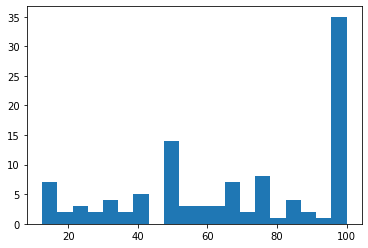

In [22]:
plt.hist(cindex_distro_ability, bins=20)
plt.show()

In [19]:
pd.cut(cindex_distro_ability, 20).value_counts().sort_index()

(12.412, 16.875]     7
(16.875, 21.25]      2
(21.25, 25.625]      3
(25.625, 30.0]       2
(30.0, 34.375]       4
(34.375, 38.75]      2
(38.75, 43.125]      5
(43.125, 47.5]       0
(47.5, 51.875]      14
(51.875, 56.25]      3
(56.25, 60.625]      3
(60.625, 65.0]       3
(65.0, 69.375]       7
(69.375, 73.75]      2
(73.75, 78.125]      8
(78.125, 82.5]       1
(82.5, 86.875]       4
(86.875, 91.25]      2
(91.25, 95.625]      1
(95.625, 100.0]     35
Name: cindex, dtype: int64

Current cutoffs:
- 0 (basically, is it competitive at all?)
- 47.5 (pretty big cutoff, leading to a whole new "island")
- 65.0 (the final island before the big top)
- 73.75
- 82.5 (newly added)
- 95.625 (elite abilities)

It didn't change at all from the previous, which means we actually don't have to change the cutoff values at all.

We might want to remember to capture aggregate abilities in the final cutoff that we choose for our model:

In [23]:
cindex_distro_ability['Trapper']

75.0

In [24]:
cindex_distro_ability['Status Absorber']

100.0

So that may just mean not choosing the top two (or at least not only), so that the information in Trapper is still represented somewhere in the model

In [25]:
pokemon_data.columns

Index(['hp', 'atk', 'def', 'spa', 'spd', 'spe', 'weight', 'height', 'formats',
       'generation', 'format codes', 'Weaknesses', 'Strong Weaknesses',
       'Resists', 'Strong Resists', 'Immune', 'STAB', 'Resistance Index',
       'Entry Hazards', 'Hazard Removal', 'Removal Deterrent', 'Cleric',
       'Pivot', 'Item Removal', 'Setup', 'Priority', 'HP Drain', 'HP Recovery',
       'Weather Set', 'Weather Gimmick', 'Physical Cutoff 1',
       'Physical Cutoff 2', 'Physical Cutoff 3', 'Physical Cutoff 4',
       'Physical Cutoff 5', 'Physical Cutoff 6', 'Physical Coverage 1',
       'Physical Coverage 2', 'Physical Coverage 3', 'Physical Coverage 4',
       'Special Cutoff 1', 'Special Cutoff 2', 'Special Cutoff 3',
       'Special Cutoff 4', 'Special Cutoff 5', 'Special Cutoff 6',
       'Special Cutoff 7', 'Special Coverage 1', 'Special Coverage 2',
       'Special Coverage 3', 'Special Coverage 4', 'Special Coverage 5',
       'Special Coverage 6', 'Special Coverage 7', 'Special Cove

Let's compute correlations of cutoff and coverage columns to see which one's might be the best to use:

In [27]:
pokemon_data.loc[:, ['Physical Cutoff 1', 'Physical Cutoff 2', 'Physical Cutoff 3', 'Physical Cutoff 4', 'Physical Cutoff 5', 'Physical Cutoff 6']].corrwith(pokemon_data['format codes'])

Physical Cutoff 1    0.270197
Physical Cutoff 2    0.284223
Physical Cutoff 3    0.324136
Physical Cutoff 4    0.325190
Physical Cutoff 5    0.300717
Physical Cutoff 6    0.276238
dtype: float64

In [29]:
pokemon_data.loc[:, ['Physical Coverage 1', 'Physical Coverage 2', 'Physical Coverage 3', 'Physical Coverage 4']].corrwith(pokemon_data['format codes'])

Physical Coverage 1    0.241386
Physical Coverage 2    0.247097
Physical Coverage 3    0.301653
Physical Coverage 4    0.302690
dtype: float64

In [30]:
pokemon_data.loc[:, ['Special Cutoff 1', 'Special Cutoff 2', 'Special Cutoff 3', 'Special Cutoff 4', 'Special Cutoff 5', 'Special Cutoff 6', 'Special Cutoff 7']].corrwith(pokemon_data['format codes'])

Special Cutoff 1    0.314893
Special Cutoff 2    0.326647
Special Cutoff 3    0.347783
Special Cutoff 4    0.342295
Special Cutoff 5    0.322373
Special Cutoff 6    0.329574
Special Cutoff 7    0.245275
dtype: float64

In [31]:
pokemon_data.loc[:, ['Special Coverage 1', 'Special Coverage 2', 'Special Coverage 3', 'Special Coverage 4', 'Special Coverage 5', 'Special Coverage 6', 'Special Coverage 7', 'Special Coverage 8', 'Special Coverage 9', 'Special Coverage 10']].corrwith(pokemon_data['format codes'])

Special Coverage 1     0.243955
Special Coverage 2     0.267509
Special Coverage 3     0.273630
Special Coverage 4     0.285747
Special Coverage 5     0.332534
Special Coverage 6     0.435150
Special Coverage 7     0.450963
Special Coverage 8     0.494721
Special Coverage 9     0.499534
Special Coverage 10    0.535532
dtype: float64

In [32]:
pokemon_data.loc[:, ['Ability Cutoff 1', 'Ability Cutoff 2', 'Ability Cutoff 3', 'Ability Cutoff 4', 'Ability Cutoff 5', 'Ability Cutoff 6', 'Best Ability', 'Best Ability <100', 'Unique Powerful Ability']].corrwith(pokemon_data['format codes'])

Ability Cutoff 1           0.063815
Ability Cutoff 2           0.048313
Ability Cutoff 3           0.120181
Ability Cutoff 4           0.095327
Ability Cutoff 5           0.077595
Ability Cutoff 6           0.060640
Best Ability               0.070026
Best Ability <100         -0.034189
Unique Powerful Ability    0.048865
dtype: float64

First of all, it's just generally interesting that abilities (at least discretely) have less correlation with competitive viability than movesets.  One reason could be that since abilities are far fewer, they may contain a lot more uninformative "0's" whereas movesets almost never have 0's in lower cutoffs

The good news is that we have justification to include Trapper in our ability cutoff at least, and then also have best ability to give more of a sense of the actual quantitative rank of the best ability rather than just having one above a certain value

For most of these, the choice is pretty obvious, but the special moves get strangely correlated to competitive viability the higher they get, which is strange because I know that's not really how moves are used in competitive play (maybe it just has to do with a handful of legendaries having powerful moves in that direction).  So we should look at which moves are being ranked so highly:

(and we should calculate the mean cindex for each cutoff group, or even median)

In [41]:
moves_cindex.loc[(moves_cindex['power']>=146) & (moves_cindex['category']=='Special'), :]

,n_learnset,n_competitive,cindex,power,type,category
Hyper Beam,353.0,0.0,0.000000,150.0,Normal,Special
Blast Burn,3.0,0.0,0.000000,150.0,Fire,Special
Eruption,4.0,0.0,0.000000,150.0,Fire,Special
Frenzy Plant,4.0,0.0,0.000000,150.0,Grass,Special
Hydro Cannon,4.0,0.0,0.000000,150.0,Water,Special
Water Spout,3.0,1.0,33.333333,150.0,Water,Special
Roar of Time,1.0,0.0,0.000000,150.0,Dragon,Special
Mind Blown,1.0,0.0,0.000000,150.0,Fire,Special
Prismatic Laser,3.0,0.0,0.000000,160.0,Psychic,Special
Shell Trap,1.0,0.0,0.000000,150.0,Fire,Special


In [55]:
moves_cindex.loc[(moves_cindex['power']>=146) & (moves_cindex['category']=='Special'), :].median(axis=0)['cindex']

0.0

This is indeed very informative, because althought more powerful pokemon have happen to have moves this powerful more frequently, the reality is that almost all of them have very low cindex, so choosing a cutoff this high is very uninformative for competitive viability, especially with unseen data

In [42]:
moves_cindex.loc[(moves_cindex['power']>=139) & (moves_cindex['power']<146) & (moves_cindex['category']=='Special'), :]

,n_learnset,n_competitive,cindex,power,type,category
Doom Desire,1.0,0.0,0.000000,140.0,Steel,Special
Ice Burn,1.0,0.0,0.000000,140.0,Ice,Special
Boomburst,6.0,3.0,50.000000,140.0,Normal,Special
Steel Beam,51.0,2.0,3.921569,140.0,Steel,Special


In [56]:
moves_cindex.loc[(moves_cindex['power']>=139) & (moves_cindex['power']<146) & (moves_cindex['category']=='Special'), :].median(axis=0)['cindex']

1.9607843137254901

Boomburst is a great move, but it's not a coverage move because it's normal type, so that's not what it makes it good.  The others are mostly garbage

In [43]:
moves_cindex.loc[(moves_cindex['power']>=118) & (moves_cindex['power']<139) & (moves_cindex['category']=='Special'), :]

,n_learnset,n_competitive,cindex,power,type,category
Petal Dance,9.0,0.0,0.000000,120.0,Grass,Special
Zap Cannon,54.0,0.0,0.000000,120.0,Electric,Special
Future Sight,59.0,9.0,15.254237,120.0,Psychic,Special
Overheat,37.0,9.0,24.324324,130.0,Fire,Special
Draco Meteor,51.0,21.0,41.176471,130.0,Dragon,Special
Leaf Storm,25.0,12.0,48.000000,130.0,Grass,Special
Focus Blast,142.0,30.0,21.126761,120.0,Fighting,Special
Techno Blast,1.0,0.0,0.000000,120.0,Normal,Special
Blue Flare,2.0,1.0,50.000000,130.0,Fire,Special
Belch,22.0,0.0,0.000000,120.0,Poison,Special


In [57]:
moves_cindex.loc[(moves_cindex['power']>=118) & (moves_cindex['power']<139) & (moves_cindex['category']=='Special'), :].median(axis=0)['cindex']

21.12676056338028

This is starting to look like possibly a good feature, but there are a lot of unique powerful moves here which are less informative due to sampple size of n_learnset=1

In [50]:
moves_cindex.loc[(moves_cindex['power']>=104) & (moves_cindex['power']<118) & (moves_cindex['category']=='Special'), :]

,n_learnset,n_competitive,cindex,power,type,category
Blizzard,113.0,4.0,3.539823,110.0,Ice,Special
Fire Blast,84.0,22.0,26.190476,110.0,Fire,Special
Thunder,114.0,11.0,9.649123,110.0,Electric,Special
Hydro Pump,78.0,22.0,28.205128,110.0,Water,Special
Hurricane,37.0,16.0,43.243243,110.0,Flying,Special
Origin Pulse,1.0,1.0,100.000000,110.0,Water,Special
Steam Eruption,1.0,1.0,100.000000,110.0,Water,Special
Clanging Scales,1.0,1.0,100.000000,110.0,Dragon,Special


In [58]:
moves_cindex.loc[(moves_cindex['power']>=104) & (moves_cindex['power']<118) & (moves_cindex['category']=='Special'), :].median(axis=0)['cindex']

35.72418572418572

This one is a whole different level of good, these moves are informative

In [52]:
moves_cindex.loc[(moves_cindex['power']>=97) & (moves_cindex['power']<104) & (moves_cindex['category']=='Special'), :]

,n_learnset,n_competitive,cindex,power,type,category
Dream Eater,96.0,0.0,0.000000,100.0,Psychic,Special
Aeroblast,1.0,0.0,0.000000,100.0,Flying,Special
Magma Storm,1.0,1.0,100.000000,100.0,Fire,Special
Spacial Rend,1.0,1.0,100.000000,100.0,Dragon,Special
Fusion Flare,3.0,1.0,33.333333,100.0,Fire,Special
Inferno,8.0,0.0,0.000000,100.0,Fire,Special
Psystrike,1.0,1.0,100.000000,100.0,Psychic,Special
Searing Shot,1.0,0.0,0.000000,100.0,Fire,Special
Core Enforcer,2.0,0.0,0.000000,100.0,Dragon,Special
Moongeist Beam,2.0,2.0,100.000000,100.0,Ghost,Special


This is a huge concentration of low sample size moves, so I think it's not very informative

In [53]:
moves_cindex.loc[(moves_cindex['power']>=76) & (moves_cindex['power']<97) & (moves_cindex['category']=='Special'), :]

,n_learnset,n_competitive,cindex,power,type,category
Psychic,132.0,37.0,28.030303,90.0,Psychic,Special
Tri Attack,49.0,3.0,6.122449,80.0,Normal,Special
Surf,112.0,14.0,12.500000,90.0,Water,Special
Flamethrower,103.0,37.0,35.922330,90.0,Fire,Special
Ice Beam,133.0,36.0,27.067669,90.0,Ice,Special
Thunderbolt,136.0,30.0,22.058824,90.0,Electric,Special
Shadow Ball,167.0,30.0,17.964072,80.0,Ghost,Special
Sludge Bomb,74.0,22.0,29.729730,90.0,Poison,Special
Extrasensory,34.0,0.0,0.000000,80.0,Psychic,Special
Uproar,122.0,0.0,0.000000,90.0,Normal,Special


In [59]:
moves_cindex.loc[(moves_cindex['power']>=76) & (moves_cindex['power']<97) & (moves_cindex['category']=='Special'), :].median(axis=0)['cindex']

12.5

Unforunately I'm inclined to think this one **TRULY IS** informative, knowing a lot of competitive moves are in this category, but it's median cindex isn't huge (though it's not small either), there might just be a lot of garbage here too

In [60]:
moves_cindex.loc[(moves_cindex['power']>=55) & (moves_cindex['power']<76) & (moves_cindex['category']=='Special'), :]

,n_learnset,n_competitive,cindex,power,type,category
Aurora Beam,17.0,0.0,0.000000,65.0,Ice,Special
Bubble Beam,50.0,0.0,0.000000,65.0,Water,Special
Sludge,7.0,0.0,0.000000,65.0,Poison,Special
Psybeam,40.0,1.0,2.500000,65.0,Psychic,Special
Swift,203.0,0.0,0.000000,60.0,Normal,Special
Ancient Power,82.0,1.0,1.219512,60.0,Rock,Special
Dragon Breath,38.0,0.0,0.000000,60.0,Dragon,Special
Icy Wind,144.0,2.0,1.388889,55.0,Ice,Special
Octazooka,3.0,0.0,0.000000,65.0,Water,Special
Air Cutter,34.0,0.0,0.000000,60.0,Flying,Special


In [61]:
moves_cindex.loc[(moves_cindex['power']>=55) & (moves_cindex['power']<76) & (moves_cindex['category']=='Special'), :].median(axis=0)['cindex']

0.0

This one is garbage and I suspect all below it will be as well

In [62]:
moves_cindex.loc[(moves_cindex['power']>=48) & (moves_cindex['power']<55) & (moves_cindex['category']=='Special'), :]

,n_learnset,n_competitive,cindex,power,type,category
Confusion,55.0,0.0,0.000000,50.0,Psychic,Special
Snore,413.0,0.0,0.000000,50.0,Normal,Special
Charge Beam,90.0,0.0,0.000000,50.0,Electric,Special
Struggle Bug,25.0,0.0,0.000000,50.0,Bug,Special
Clear Smog,14.0,2.0,14.285714,50.0,Poison,Special


garbage

In [63]:
moves_cindex.loc[(moves_cindex['power']>=34) & (moves_cindex['power']<48) & (moves_cindex['category']=='Special'), :]

,n_learnset,n_competitive,cindex,power,type,category
Acid,15.0,0.0,0.000000,40.0,Poison,Special
Fire Spin,35.0,2.0,5.714286,35.0,Fire,Special
Gust,25.0,0.0,0.000000,40.0,Flying,Special
Mega Drain,33.0,0.0,0.000000,40.0,Grass,Special
Ember,21.0,0.0,0.000000,40.0,Fire,Special
Thunder Shock,32.0,0.0,0.000000,40.0,Electric,Special
Water Gun,71.0,0.0,0.000000,40.0,Water,Special
Whirlpool,76.0,0.0,0.000000,35.0,Water,Special
Powder Snow,15.0,0.0,0.000000,40.0,Ice,Special
Twister,38.0,0.0,0.000000,40.0,Dragon,Special


So the rest is trash, thus my two choices for special coverage seem pretty obvious.  I may even choose just one of them (the lower one) for the sake of conciseness and because often having the more powerful moves doesn't matter much for coverage and they are more rarely used than middling power moves

Let's try the same thing more briefly for physical moves (which we can do because there are fewer coverage levels for physical)

In [66]:
moves_cindex.loc[(moves_cindex['power']>=109) & (moves_cindex['category']=='Physical'), :].sort_values(by='power')

,n_learnset,n_competitive,cindex,power,type,category
Poltergeist,33.0,15.0,45.454545,110.0,Ghost,Physical
Aura Wheel,1.0,1.0,100.000000,110.0,Electric,Physical
Double-Edge,194.0,4.0,2.061856,120.0,Normal,Physical
Multi-Attack,11.0,11.0,100.000000,120.0,Normal,Physical
Dragon Ascent,1.0,1.0,100.000000,120.0,Flying,Physical
Precipice Blades,1.0,1.0,100.000000,120.0,Ground,Physical
Head Charge,1.0,0.0,0.000000,120.0,Normal,Physical
Shadow Force,2.0,0.0,0.000000,120.0,Ghost,Physical
Power Whip,26.0,11.0,42.307692,120.0,Grass,Physical
Pyro Ball,0.0,0.0,NaN,120.0,Fire,Physical


In [65]:
moves_cindex.loc[(moves_cindex['power']>=109) & (moves_cindex['category']=='Physical'), :].median(axis=0)['cindex']

15.26639344262295

That's not terrible and many of those moves are good and really are used a lot competitively

In [68]:
moves_cindex.loc[(moves_cindex['power']>=73.75) & (moves_cindex['power']<109) & (moves_cindex['category']=='Physical'), :]

,n_learnset,n_competitive,cindex,power,type,category
Crabhammer,1.0,1.0,100.000000,100.0,Water,Physical
Dig,141.0,0.0,0.000000,80.0,Ground,Physical
Fly,65.0,0.0,0.000000,90.0,Flying,Physical
Rock Slide,186.0,19.0,10.215054,75.0,Rock,Physical
Waterfall,50.0,8.0,16.000000,80.0,Water,Physical
...,...,...,...,...,...,...
Jaw Lock,1.0,0.0,0.000000,80.0,Dark,Physical
Lash Out,56.0,0.0,0.000000,75.0,Dark,Physical
Spirit Break,1.0,1.0,100.000000,75.0,Fairy,Physical
Thunderous Kick,1.0,1.0,100.000000,90.0,Fighting,Physical


In [69]:
moves_cindex.loc[(moves_cindex['power']>=73.75) & (moves_cindex['power']<109) & (moves_cindex['category']=='Physical'), :].median(axis=0)['cindex']

9.595029912563277

Not very high, but what if we get rid of uniques

In [71]:
moves_cindex.loc[(moves_cindex['power']>=73.75) & (moves_cindex['power']<109) & (moves_cindex['category']=='Physical') & (moves_cindex['n_learnset']>2), :]

,n_learnset,n_competitive,cindex,power,type,category
Dig,141.0,0.0,0.000000,80.0,Ground,Physical
Fly,65.0,0.0,0.000000,90.0,Flying,Physical
Rock Slide,186.0,19.0,10.215054,75.0,Rock,Physical
Waterfall,50.0,8.0,16.000000,80.0,Water,Physical
Submission,42.0,0.0,0.000000,80.0,Fighting,Physical
Body Slam,204.0,7.0,3.431373,85.0,Normal,Physical
Drill Peck,6.0,0.0,0.000000,80.0,Flying,Physical
Earthquake,150.0,72.0,48.000000,100.0,Ground,Physical
Fire Punch,71.0,6.0,8.450704,75.0,Fire,Physical
Ice Punch,82.0,8.0,9.756098,75.0,Ice,Physical


In [74]:
moves_cindex.loc[(moves_cindex['power']>=73.75) & (moves_cindex['power']<109) & (moves_cindex['category']=='Physical') & (moves_cindex['n_learnset']>2), :].median(axis=0)['cindex']

7.3998294970161975

Doesn't help, but let's see how the others do

In [75]:
moves_cindex.loc[(moves_cindex['power']>=38.5) & (moves_cindex['power']<73.25) & (moves_cindex['category']=='Physical'), :]

,n_learnset,n_competitive,cindex,power,type,category
Bite,96.0,0.0,0.000000,60.0,Dark,Physical
Razor Leaf,19.0,0.0,0.000000,55.0,Grass,Physical
Rock Throw,26.0,0.0,0.000000,50.0,Rock,Physical
Slash,65.0,0.0,0.000000,70.0,Normal,Physical
Wing Attack,16.0,0.0,0.000000,60.0,Flying,Physical
...,...,...,...,...,...,...
Branch Poke,3.0,0.0,0.000000,40.0,Grass,Physical
Breaking Swipe,44.0,0.0,0.000000,60.0,Dragon,Physical
Dragon Darts,1.0,0.0,0.000000,50.0,Dragon,Physical
Dual Wingbeat,62.0,8.0,12.903226,40.0,Flying,Physical


In [76]:
moves_cindex.loc[(moves_cindex['power']>=38.5) & (moves_cindex['power']<73.25) & (moves_cindex['category']=='Physical'), :].median(axis=0)['cindex']

0.0

Predictably, garbage

**So, my decision for the cutoff/coverage features is #3 for nearly all of them, but #5 for special coverage alone**

Let's get back into PCA

In [77]:
pokemon_data.columns

Index(['hp', 'atk', 'def', 'spa', 'spd', 'spe', 'weight', 'height', 'formats',
       'generation', 'format codes', 'Weaknesses', 'Strong Weaknesses',
       'Resists', 'Strong Resists', 'Immune', 'STAB', 'Resistance Index',
       'Entry Hazards', 'Hazard Removal', 'Removal Deterrent', 'Cleric',
       'Pivot', 'Item Removal', 'Setup', 'Priority', 'HP Drain', 'HP Recovery',
       'Weather Set', 'Weather Gimmick', 'Physical Cutoff 1',
       'Physical Cutoff 2', 'Physical Cutoff 3', 'Physical Cutoff 4',
       'Physical Cutoff 5', 'Physical Cutoff 6', 'Physical Coverage 1',
       'Physical Coverage 2', 'Physical Coverage 3', 'Physical Coverage 4',
       'Special Cutoff 1', 'Special Cutoff 2', 'Special Cutoff 3',
       'Special Cutoff 4', 'Special Cutoff 5', 'Special Cutoff 6',
       'Special Cutoff 7', 'Special Coverage 1', 'Special Coverage 2',
       'Special Coverage 3', 'Special Coverage 4', 'Special Coverage 5',
       'Special Coverage 6', 'Special Coverage 7', 'Special Cove

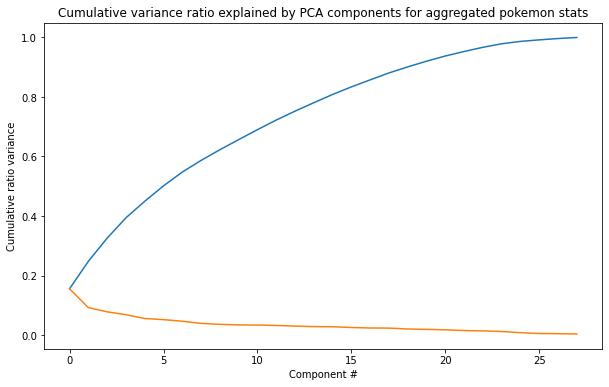

In [2]:
pokemon_data_pca = pokemon_data.drop(columns=['weight', 'height', 'format codes', 'Weaknesses', 'Strong Weaknesses', 'Resists',
                                              'Strong Resists', 'Immune', 'STAB', 'Physical Cutoff 1', 'Physical Cutoff 2',
                                              'Physical Cutoff 4', 'Physical Cutoff 5', 'Physical Cutoff 6',
                                              'Physical Coverage 1', 'Physical Coverage 2', 'Physical Coverage 4',
                                              'Special Cutoff 1', 'Special Cutoff 2', 'Special Cutoff 4',
                                              'Special Cutoff 5', 'Special Cutoff 6', 'Special Cutoff 7',
                                              'Special Coverage 1', 'Special Coverage 2', 'Special Coverage 3',
                                              'Special Coverage 4', 'Special Coverage 6', 'Special Coverage 7',
                                              'Special Coverage 8', 'Special Coverage 9', 'Special Coverage 10',
                                              'Ability Cutoff 1', 'Ability Cutoff 2', 'Ability Cutoff 4', 'Ability Cutoff 5',
                                              'Ability Cutoff 6', 'Best Ability <100'])

pokemon_data_nonnumeric = pokemon_data_pca.select_dtypes(include='object', exclude='number')
pokemon_data_numeric = pokemon_data_pca.select_dtypes(include='number')
data_scaled = scale(pokemon_data_numeric)
pokemon_data_scaled = pd.DataFrame(data_scaled, index=pokemon_data.index, columns=pokemon_data_numeric.columns)
pokemon_data_fit = PCA().fit(pokemon_data_scaled)

plt.subplots(figsize=(10, 6))
plt.plot(pokemon_data_fit.explained_variance_ratio_.cumsum())
plt.plot(pokemon_data_fit.explained_variance_ratio_)
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for aggregated pokemon stats');

In [3]:
pokemon_data_fit.components_.shape

(28, 28)

Only 28 components components is much less than I expected, that's really good, and though we have a few more features that might be valuable to put back in, I am pleased by this result

In [4]:
pokemon_data_compdf = pd.DataFrame(pokemon_data_fit.components_, columns=pokemon_data_numeric.columns)
pokemon_data_compdf.head()

,hp,atk,def,spa,spd,spe,Resistance Index,Entry Hazards,Hazard Removal,Removal Deterrent,...,Weather Gimmick,Physical Cutoff 3,Physical Coverage 3,Special Cutoff 3,Special Coverage 5,Misc Status,Unique Powerful Move,Ability Cutoff 3,Best Ability,Unique Powerful Ability
0,0.292724,0.286149,0.225668,0.323633,0.296470,0.210342,0.045922,-0.016888,0.081891,0.026516,...,0.057364,0.274774,0.267324,0.351897,0.357630,0.179151,0.190502,0.104961,0.098898,-0.050602
1,0.070911,0.332323,0.218062,-0.204957,-0.078570,-0.012005,0.011805,0.196250,-0.131849,-0.058280,...,-0.157446,0.384730,0.345112,-0.199980,-0.155685,-0.291762,0.025488,-0.165513,-0.174197,0.078830
2,-0.013150,0.005160,0.023891,0.109904,0.077493,0.131561,0.180335,-0.112146,0.082741,0.101178,...,-0.075472,-0.100761,-0.120257,0.061840,0.068467,0.112883,0.084408,-0.504526,-0.562319,0.444848
3,0.141193,-0.108066,0.219968,-0.056493,0.179131,-0.414430,-0.007775,0.265677,-0.260278,0.010877,...,0.036552,0.040643,-0.013564,0.112274,0.130709,0.035347,-0.042473,-0.166620,-0.125202,-0.000280
4,-0.052132,-0.022001,-0.136379,-0.142013,-0.128652,-0.092661,-0.016601,0.033373,-0.025444,0.171853,...,0.070189,0.189895,0.252321,0.019719,0.036604,0.060825,-0.285237,-0.075239,-0.041684,0.045696


We can also zoom in on the scree plot a little more to get an idea where the elbow is.

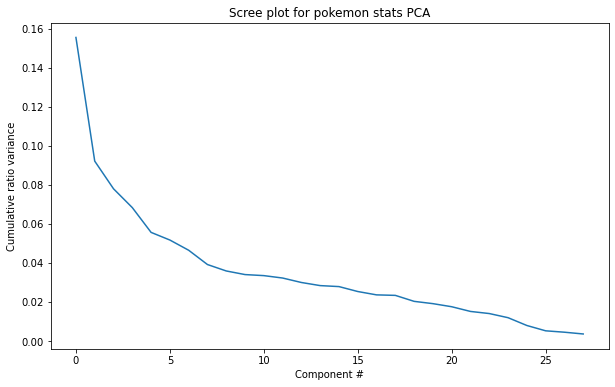

In [5]:
plt.subplots(figsize=(10, 6))
plt.plot(pokemon_data_fit.explained_variance_ratio_)
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Scree plot for pokemon stats PCA');

Interesting, it seems to be around 6 or 7 components, so that's probably all we have to really look at deeply for our analysis

**First component:**

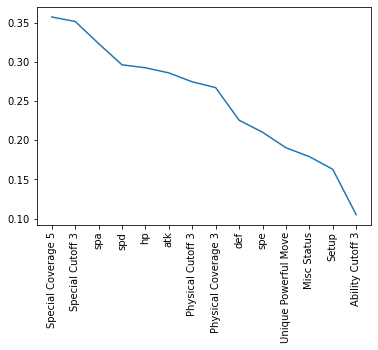

In [6]:
plt.plot(pokemon_data_compdf.loc[0, :].sort_values(ascending=False).head(14))
plt.xticks(rotation = 90)
plt.show()

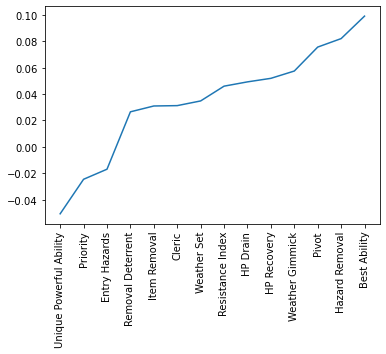

In [7]:
plt.plot(pokemon_data_compdf.loc[0, :].sort_values().head(14))
plt.xticks(rotation = 90)
plt.show()

So this feature mainly captures the stats and move access of pokemon, what overall threat they represent, which makes sense as the strong component.  The few negative features are cheesy things that don't depend on stats so much, such as unique powerful ability, priority moves and entry hazards, so it makes sense why they'd be negatively correlated here

**Second component:**

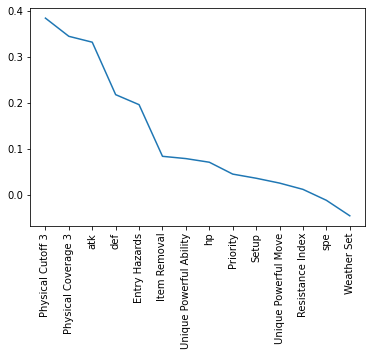

In [8]:
plt.plot(pokemon_data_compdf.loc[1, :].sort_values(ascending=False).head(14))
plt.xticks(rotation = 90)
plt.show()

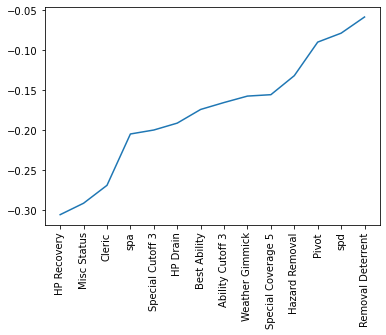

In [9]:
plt.plot(pokemon_data_compdf.loc[1, :].sort_values().head(14))
plt.xticks(rotation = 90)
plt.show()

This feature is mainly capture the physical power of a pokemon (physical movesets, attack and defense), combined with entry hazard setting ability on the positive side, and on the negative side are mainly status oriented moves and special attack and abilities (which may indeed be opposite to a more direct physically oriented pokemon)

**Third component:**

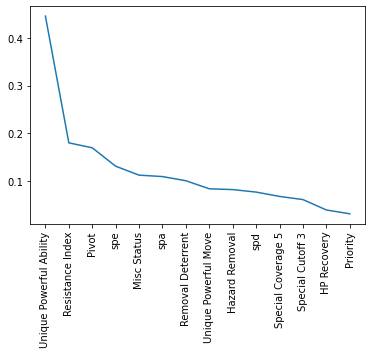

In [10]:
plt.plot(pokemon_data_compdf.loc[2, :].sort_values(ascending=False).head(14))
plt.xticks(rotation = 90)
plt.show()

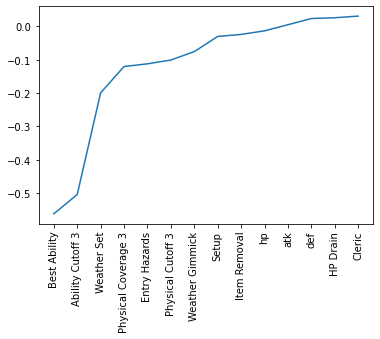

In [11]:
plt.plot(pokemon_data_compdf.loc[2, :].sort_values().head(14))
plt.xticks(rotation = 90)
plt.show()

This is a very interesting feature which heavily prioritizes having a unique powerful ability, rather than a good overall best ability or high ability cutoff point (including weather set or gimmick).  It also looks favorably upon resistance index, pivot, speed and misc status, so it might be a feature that's measuring a certain kind of pivot that has a unique ability

**Fourth component:**

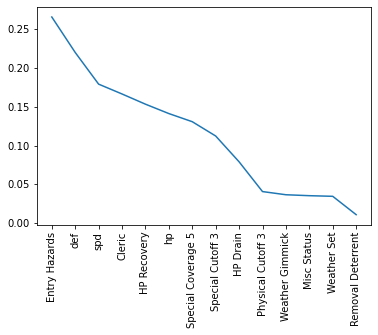

In [12]:
plt.plot(pokemon_data_compdf.loc[3, :].sort_values(ascending=False).head(14))
plt.xticks(rotation = 90)
plt.show()

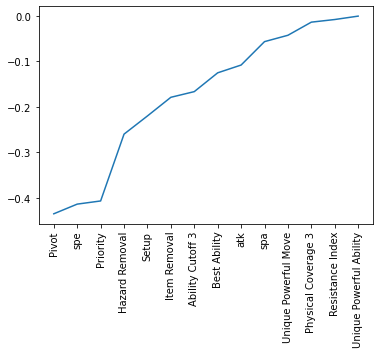

In [13]:
plt.plot(pokemon_data_compdf.loc[3, :].sort_values().head(14))
plt.xticks(rotation = 90)
plt.show()

This is a defensive feature, prioritizing entry hazard setting, def, spd, cleric and hp recovery, and hp itself.  It is opposed to fast pivots with priority moves and hazard removal, as well as setup sweepers, who are perhaps the opposite

**Fifth component:**

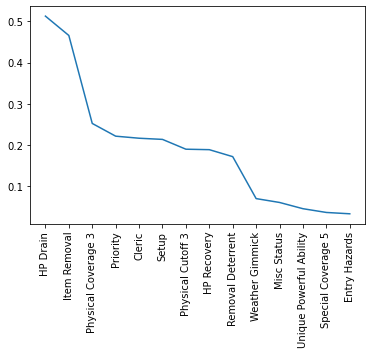

In [14]:
plt.plot(pokemon_data_compdf.loc[4, :].sort_values(ascending=False).head(14))
plt.xticks(rotation = 90)
plt.show()

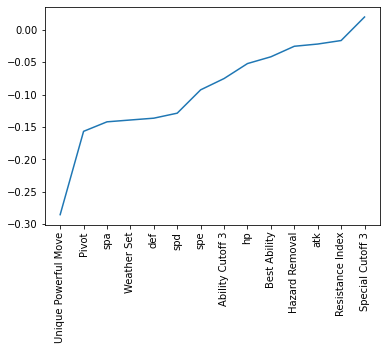

In [15]:
plt.plot(pokemon_data_compdf.loc[4, :].sort_values().head(14))
plt.xticks(rotation = 90)
plt.show()

Here is a feature that is a bit stranger and harder to interpret, it really prioritzes HP Drain and Item removal, which is an odd combination, and to a lesser extent, physical moveset, priority, setup, hp recovery and cleric and removal deterrent are prioritized.  It's heavily against unique powerful moves, and to a lesser extent, pivoting, weather setting and general stats (so it's more about the useful moves and abilities a pokemon has to stay alive perhaps, regardless of stats)

**Sixth component:**

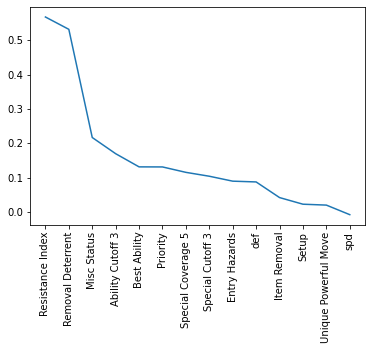

In [16]:
plt.plot(pokemon_data_compdf.loc[5, :].sort_values(ascending=False).head(14))
plt.xticks(rotation = 90)
plt.show()

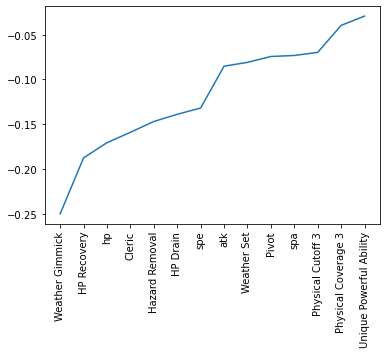

In [17]:
plt.plot(pokemon_data_compdf.loc[5, :].sort_values().head(14))
plt.xticks(rotation = 90)
plt.show()

This is another feature measuring intangibles, like resistance index, removal deterrent especially, as well as misc status moves and ability rating, positively, and negatively correlated to weather gimmick and setting (perhaps because those are special abilities) and even more often hp, and any sort of hp recovery, drain, cleric, etc. (so perhaps it's intangles that keep people alive other than hp and hp recovery)

**Seventh component:**

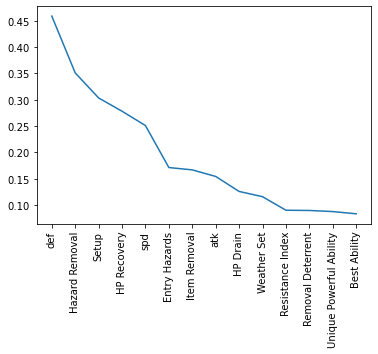

In [18]:
plt.plot(pokemon_data_compdf.loc[6, :].sort_values(ascending=False).head(14))
plt.xticks(rotation = 90)
plt.show()

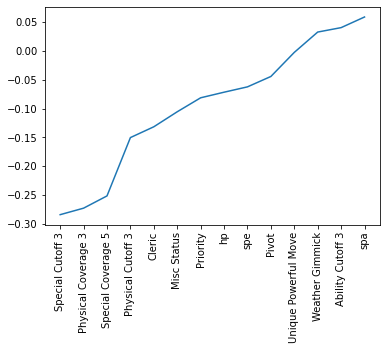

In [19]:
plt.plot(pokemon_data_compdf.loc[6, :].sort_values().head(14))
plt.xticks(rotation = 90)
plt.show()

This feature seems to be about staying alive and setting up, due to high defense, special defense, entry hazards and removal, setup and hp recovery, and it is negatively correlated with other moves the pokemon has (physical and special)

Overall, this was by far my most satisfying PCA yet, where most if not all of the features seemed deeply meaningful and there were far fewer components that were actually significant.  Now, I'd look to do pairplot of these components, so there are not too many, to get an idea of the actual shape of the data

In [20]:
pokemon_data_comp = pokemon_data_fit.transform(pokemon_data_scaled)
pokemon_data_pcadf = pd.DataFrame(pokemon_data_comp, index=pokemon_data.index)
pokemon_data_pcadf['formats'] = pokemon_data['formats']
pokemon_data_pcadf.head()

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,formats
name,,,,,,,,,,,,,,,,,,,,,
Bulbasaur,-1.647428,-1.802959,0.405341,0.672114,2.130793,-0.941111,0.767530,-0.380129,0.389119,-1.864558,...,0.303243,-0.780527,0.608939,0.559103,0.081921,-0.302959,-0.608706,0.307459,0.244873,ZU
Ivysaur,-0.834277,-1.670569,0.574821,0.660693,1.843315,-1.137282,1.138755,0.014787,0.292686,-2.029226,...,0.352160,-0.820262,0.707785,0.579669,-0.041302,-0.232014,-0.613619,0.272710,0.291251,ZU
Venusaur,0.894003,-1.345456,0.788892,0.798135,1.661929,-1.322237,1.219368,0.347408,0.365266,-2.136313,...,0.295115,-0.828030,0.756620,0.489161,-0.281118,-0.136591,-0.654748,0.172928,-0.072168,OU
Charmander,-1.373949,0.858250,0.320061,-0.200858,0.531723,-0.278172,-1.519214,-0.317976,0.378113,-0.598864,...,0.250621,-0.939056,-0.046542,0.901774,0.846805,0.222342,-0.342585,-0.119121,0.472228,ZU
Charmeleon,-0.467709,0.963818,0.506116,-0.190181,0.209833,-0.505307,-1.138932,0.110501,0.248333,-0.787167,...,0.311207,-0.916772,0.141719,0.930619,0.790887,0.388059,-0.347503,-0.176942,0.524843,ZU


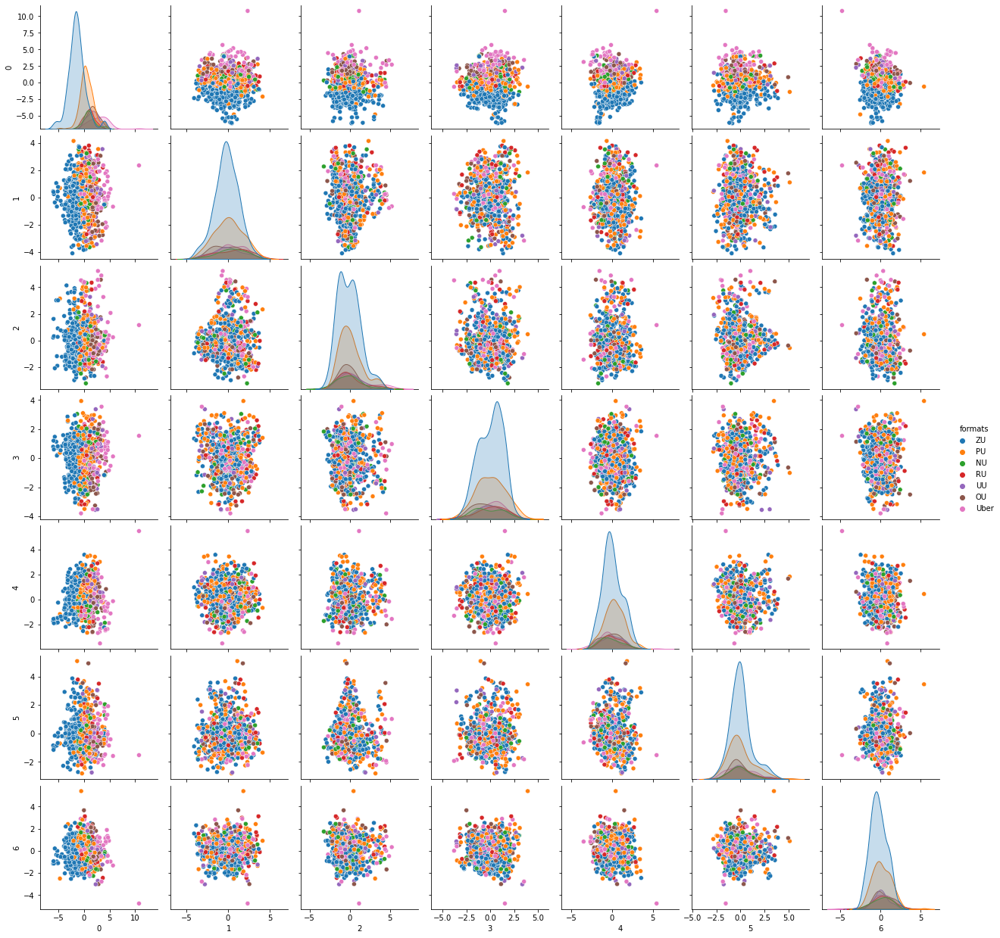

In [21]:
pairplot_pcadf_list = [n for n in range(7)]
pairplot_pcadf_list.append('formats')
sns.pairplot(pokemon_data_pcadf.loc[:, pairplot_pcadf_list], hue='formats', hue_order=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber'])
plt.show()

This is nice, but we should look at it in more detail

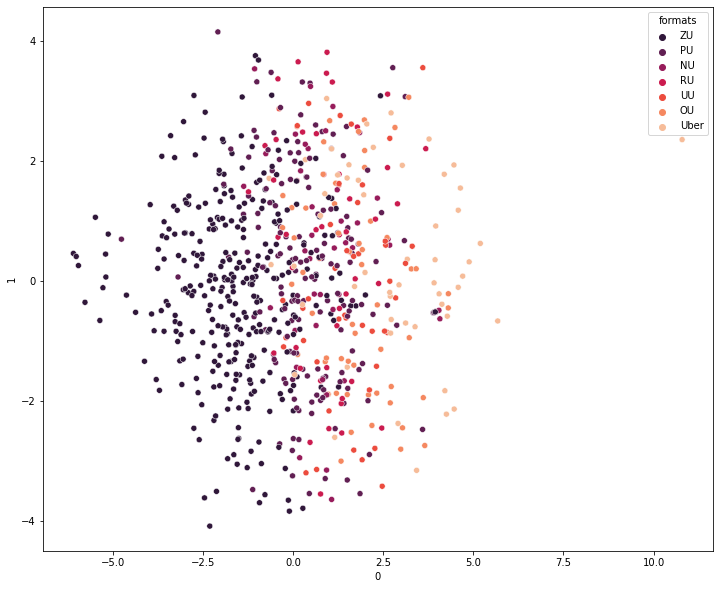

In [22]:
x = pokemon_data_pcadf[0]
y = pokemon_data_pcadf[1]
pkmn = pokemon_data.index
plt.subplots(figsize=(12, 10))
sns.scatterplot(x=0, y=1, hue='formats', hue_order=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber'], data=pokemon_data_pcadf, palette="rocket")
plt.show()

It definitely seems to be scattering approximately by tier.

We might want to wrap this up into a function and do a bunch of plots like this:

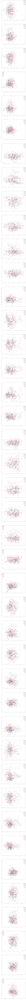

In [25]:
pkmn = pokemon_data.index

def pcascatterplot(comp1, comp2, axis):
    x = pokemon_data_pcadf[comp1]
    y = pokemon_data_pcadf[comp2]
    sns.scatterplot(ax=axis, x=comp1, y=comp2, hue='formats', hue_order=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber'], data=pokemon_data_pcadf, palette="rocket")
    
fig, axes = plt.subplots(7*6, figsize=(12, 500))
n_ax = 0
for i in range(7):
    for j in range(7):
        if i != j:
            pcascatterplot(i, j, axes[n_ax])
            n_ax+=1
            
plt.show()

Can I just say, the rocket color theme here is particularly sensible, lol

So we wanted to look for two things in this plot.

The 1st thing is whether or not there is a strong correlation with formats in the chart.  I'd say this is very much true for all the charts involved the first principal component (listed as 0 in the axes), but scattered all over the place for the other components, so in general this doesn't hold very well (there may be mild correlations but they don't stand our very well).

The 2nd thing is whether there are any clusters in the data that we might expect to find when running clustering algorithms later.  And in each plot, I don't see any notable clusters; it's mostly a fairly indistinct blob in all cases.

So that's probably about all the insight we'll be able to get through PCA pair plots.

Now we're gonna try a Lasso model to see what the coefficients are and especially what coefficients turn out to be zero (though I'm not sure using a regression will be that helpful due to the discrete contribution of each variable, but it is at least worth a try), so need X and y and other things like that

For our y variable, we will need to use several versions to have an idea of what target variable is best to use.  We could try up to 6:
- competitive or not competitive
- 4 classes: (ZU, PU, NU+RU+UU, OU+Uber)
- all 7 classes
And each of those have one variation with the tierchange work we did, and one variation without it

And I can also do a linreg variation on each one of those (classic lasso), with the exception of the 2 classes version, since what is the point of doing linreg in such a case

It might be interesting to see if it comes up with notably different results, but I also don't want to spend too much time on this since we aren't modeling or pre-processing yet

In [2]:
oldformats = pd.read_csv('./data/pokemon_df.csv', index_col="name")['formats']
oldformats[oldformats == 'LC'] = 'ZU'
oldformats[oldformats == 'NFE'] = 'ZU'
oldformats[oldformats == 'Untiered'] = 'ZU'
oldformats[oldformats == 'PUBL'] = 'NU'
oldformats[oldformats == 'NUBL'] = 'RU'
oldformats[oldformats == 'RUBL'] = 'UU'
oldformats[oldformats == 'UUBL'] = 'OU'
oldformats.unique()

array(['ZU', 'UU', 'PU', 'NU', 'OU', 'RU', 'Uber'], dtype=object)

In [3]:
pokemon_data['oldformats'] = oldformats
pokemon_data['oldformat codes'] = pd.Categorical(pokemon_data['oldformats'], categories=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber']).codes
pokemon_data.columns

Index(['hp', 'atk', 'def', 'spa', 'spd', 'spe', 'weight', 'height', 'formats',
       'generation', 'format codes', 'Weaknesses', 'Strong Weaknesses',
       'Resists', 'Strong Resists', 'Immune', 'STAB', 'Resistance Index',
       'Entry Hazards', 'Hazard Removal', 'Removal Deterrent', 'Cleric',
       'Pivot', 'Item Removal', 'Setup', 'Priority', 'HP Drain', 'HP Recovery',
       'Weather Set', 'Weather Gimmick', 'Physical Cutoff 1',
       'Physical Cutoff 2', 'Physical Cutoff 3', 'Physical Cutoff 4',
       'Physical Cutoff 5', 'Physical Cutoff 6', 'Physical Coverage 1',
       'Physical Coverage 2', 'Physical Coverage 3', 'Physical Coverage 4',
       'Special Cutoff 1', 'Special Cutoff 2', 'Special Cutoff 3',
       'Special Cutoff 4', 'Special Cutoff 5', 'Special Cutoff 6',
       'Special Cutoff 7', 'Special Coverage 1', 'Special Coverage 2',
       'Special Coverage 3', 'Special Coverage 4', 'Special Coverage 5',
       'Special Coverage 6', 'Special Coverage 7', 'Special Cove

In [4]:
X = pokemon_data.drop(columns=['weight', 'height', 'Weaknesses', 'Strong Weaknesses', 'Resists',
                                'Strong Resists', 'Immune', 'STAB', 'Physical Cutoff 1', 'Physical Cutoff 2',
                                'Physical Cutoff 4', 'Physical Cutoff 5', 'Physical Cutoff 6',
                                'Physical Coverage 1', 'Physical Coverage 2', 'Physical Coverage 4',
                                'Special Cutoff 1', 'Special Cutoff 2', 'Special Cutoff 4',
                                'Special Cutoff 5', 'Special Cutoff 6', 'Special Cutoff 7',
                                'Special Coverage 1', 'Special Coverage 2', 'Special Coverage 3',
                                'Special Coverage 4', 'Special Coverage 6', 'Special Coverage 7',
                                'Special Coverage 8', 'Special Coverage 9', 'Special Coverage 10',
                                'Ability Cutoff 1', 'Ability Cutoff 2', 'Ability Cutoff 4', 'Ability Cutoff 5',
                                'Ability Cutoff 6', 'Best Ability <100', 'formats', 'generation',
                                'format codes', 'oldformats', 'oldformat codes'])

y_df = pd.DataFrame(pokemon_data[['formats', 'format codes', 'oldformats', 'oldformat codes']], index=pokemon_data.index, columns=['formats', 'format codes', 'oldformats', 'oldformat codes'])
y_df['formats4'] = y_df['formats'].replace({'ZU':'Not c', 'PU': 'Low c', 'NU': 'Mid c', 'RU': 'Mid c', 'UU': 'Mid c', 'OU': 'High c', 'Uber': 'High c'})
y_df['format codes4'] = y_df['format codes'].replace({3:2, 4: 2, 5:3, 6:3})
y_df['oldformats4'] = y_df['oldformats'].replace({'ZU':'Not c', 'PU': 'Low c', 'NU': 'Mid c', 'RU': 'Mid c', 'UU': 'Mid c', 'OU': 'High c', 'Uber': 'High c'})
y_df['oldformat codes4'] = y_df['oldformat codes'].replace({3:2, 4: 2, 5:3, 6:3})
y_df['formats2'] = y_df['formats'].replace({'ZU':'No', 'PU': 'Yes', 'NU': 'Yes', 'RU': 'Yes', 'UU': 'Yes', 'OU': 'Yes', 'Uber': 'Yes'})
y_df['oldformats2'] = y_df['oldformats'].replace({'ZU':'No', 'PU': 'Yes', 'NU': 'Yes', 'RU': 'Yes', 'UU': 'Yes', 'OU': 'Yes', 'Uber': 'Yes'})
y_df

,formats,format codes,oldformats,oldformat codes,formats4,format codes4,oldformats4,oldformat codes4,formats2,oldformats2
name,,,,,,,,,,
Bulbasaur,ZU,0,ZU,0,Not c,0,Not c,0,No,No
Ivysaur,ZU,0,ZU,0,Not c,0,Not c,0,No,No
Venusaur,OU,5,UU,4,High c,3,Mid c,2,Yes,Yes
Charmander,ZU,0,ZU,0,Not c,0,Not c,0,No,No
Charmeleon,ZU,0,ZU,0,Not c,0,Not c,0,No,No
...,...,...,...,...,...,...,...,...,...,...
Glastrier,NU,2,NU,2,Mid c,2,Mid c,2,Yes,Yes
Spectrier,Uber,6,Uber,6,High c,3,High c,3,Yes,Yes
Calyrex,PU,1,ZU,0,Low c,1,Not c,0,Yes,No


In [5]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Lasso
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import log_loss
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

More specifically, we're going to do an L1 norm with logistic regression and treat this as a classification, or we could also do it with the regular lasso and treat it as linear regression (bounded if necessary, though we can decide how we want to interpret out of range values)

Let's just try doing a model to see how it works, then we can wrap it into a function later

In [14]:
pipe = make_pipeline(
    StandardScaler(),
    LogisticRegression(penalty='l1', solver = 'liblinear', random_state=42))

In [15]:
pipe.fit(X, y_df['formats'])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(penalty='l1', random_state=42,
                                    solver='liblinear'))])

In [22]:
y_pred_proba = pipe.predict_proba(X)

In [23]:
log_loss(y_df['formats'], y_pred_proba)

0.987371209015538

In [26]:
10**(-0.987371209015538)

0.10295057841360422

That doesn't seem like a very good model!

https://stats.stackexchange.com/questions/276067/whats-considered-a-good-log-loss

In [27]:
y_pred = pipe.predict(X)

In [29]:
precision_recall_fscore_support(y_df['formats'], y_pred, labels=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber'])

(array([0.80779221, 0.45      , 0.28571429, 0.63636364, 0.45454545,
        0.55555556, 0.57627119]),
 array([0.92835821, 0.62264151, 0.04878049, 0.15217391, 0.10869565,
        0.43103448, 0.64150943]),
 array([0.86388889, 0.52242744, 0.08333333, 0.24561404, 0.1754386 ,
        0.48543689, 0.60714286]),
 array([335, 159,  41,  46,  46,  58,  53], dtype=int64))

This is interesting, so it's doing very well on ZU and Ubers (the extremes, which make sense as they are the easiest), and especially poorly on NU in general and the recall for NU, RU and UU (which makes sense, they have the fewest examples plus they are more middling so they require some nuance to understand).

Not only does this support the idea of a two-stage model, where the model might have a chance for more differentiations, it also STRONGLY supports a 4 class approach, since all three of our weakest classes would be included in a single larger class that I think would be far easier for the model to recognize than any of the individual classes

Let's look at the coefficients though, which is the main reason we created this model:

In [39]:
model1_coef = pd.DataFrame(pipe._final_estimator.coef_, index=pipe._final_estimator.classes_, columns=X.columns)
model1_coef.head()

,hp,atk,def,spa,spd,spe,Resistance Index,Entry Hazards,Hazard Removal,Removal Deterrent,...,Weather Gimmick,Physical Cutoff 3,Physical Coverage 3,Special Cutoff 3,Special Coverage 5,Misc Status,Unique Powerful Move,Ability Cutoff 3,Best Ability,Unique Powerful Ability
NU,0.080742,0.340034,0.124362,0.589609,0.328405,-0.131447,-0.124617,0.000000,0.003864,0.042477,...,-0.090281,0.000111,0.129687,-0.400983,0.230082,-0.287804,-0.157765,-0.081491,0.356213,0.106975
OU,0.116890,0.260769,0.516729,0.452260,0.172571,0.218887,0.386315,-0.452117,-0.058324,-0.130510,...,-0.061112,0.000000,0.185053,0.187037,-0.147150,-0.027317,-0.156932,0.240455,0.071374,-0.206433
PU,-0.016742,0.063221,0.432962,-0.195295,0.343277,0.199031,-0.298627,0.035672,-0.038071,0.129527,...,0.124805,0.000000,0.066100,-0.347882,0.228085,0.358542,-0.179104,0.115783,-0.071718,0.036333
RU,0.129905,0.427787,0.324757,0.000000,0.000000,0.409230,0.373841,0.094701,-0.229289,-0.127900,...,0.015181,0.315755,-0.336844,-0.235873,0.265121,0.000000,-0.294794,-0.030504,0.441163,0.432676
UU,0.271010,0.000000,0.000000,0.373482,0.556886,0.492381,0.357825,0.103852,-0.192483,0.030749,...,-0.012919,0.045699,0.142050,0.060175,-0.098777,-0.216704,-0.258091,0.172500,0.022354,0.000000


That's interesting, so it has different features for each class:

In [41]:
model1_coef['class mean'] = model1_coef.mean(axis=1)
model1_coef['class mean']

NU      0.033890
OU      0.098259
PU      0.045929
RU      0.070209
UU      0.077140
Uber    0.266440
ZU     -0.286280
Name: class mean, dtype: float64

This is interesting because you can see why Uber and ZU were so distinct compared to the others

In [48]:
feature_means = model1_coef.mean(axis=0)
feature_means.sort_values(ascending=False)

spa                        0.148044
atk                        0.146466
hp                         0.144149
spe                        0.143021
spd                        0.138047
Best Ability               0.129582
Resistance Index           0.109847
def                        0.087664
Special Coverage 5         0.085817
Pivot                      0.076303
Unique Powerful Ability    0.073942
Physical Cutoff 3          0.068218
class mean                 0.043655
HP Recovery                0.042607
Setup                      0.036477
Entry Hazards              0.026398
Weather Gimmick            0.020760
Physical Coverage 3        0.020726
Priority                   0.010406
Ability Cutoff 3           0.007431
Weather Set                0.004090
Item Removal              -0.000189
HP Drain                  -0.001041
Misc Status               -0.012088
Hazard Removal            -0.030260
Cleric                    -0.038284
Removal Deterrent         -0.040364
Unique Powerful Move      -0

Since the 0 values for features seem pretty all over the place, it's hard to get much meaning for this, and the results of the model don't seem very meaningful.  Looking at how many 0's there were might be interesting:

In [51]:
feature_zeroes = (model1_coef==0).sum(axis=0)
feature_zeroes.sort_values(ascending=False)

Physical Cutoff 3          3
Special Cutoff 3           2
HP Recovery                2
Priority                   1
HP Drain                   1
def                        1
spa                        1
spd                        1
Unique Powerful Ability    1
Entry Hazards              1
Ability Cutoff 3           1
Misc Status                1
Item Removal               1
Setup                      1
atk                        1
Unique Powerful Move       0
Special Coverage 5         0
Best Ability               0
Physical Coverage 3        0
hp                         0
Weather Gimmick            0
Weather Set                0
Pivot                      0
Cleric                     0
Removal Deterrent          0
Hazard Removal             0
Resistance Index           0
spe                        0
class mean                 0
dtype: int64

So L1 Logistic Regression most of all thought that **Cutoff features** and **HP Recovery** were **not very important**

Let's also try it for 4 classes and 2 classes, and look at the results of the model and what seems unimportant to it

In [52]:
pipe4 = make_pipeline(
    StandardScaler(),
    LogisticRegression(penalty='l1', solver = 'liblinear', random_state=42))

In [53]:
pipe4.fit(X, y_df['formats4'])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(penalty='l1', random_state=42,
                                    solver='liblinear'))])

In [58]:
y_pred_proba4 = pipe4.predict_proba(X)
(log_loss(y_df['formats4'], y_pred_proba4), 10**-log_loss(y_df['formats4'], y_pred_proba4))

(0.7486971237993104, 0.17836222287797698)

I don't think log loss is useful, because the next result shows a significant improvement, and in general I'm not sure I'm interpreting it correctly for multiclass classification

In [60]:
y_pred4 = pipe4.predict(X)
precision_recall_fscore_support(y_df['formats4'], y_pred4, labels=['Not c', 'Low c', 'Mid c', 'High c'])

(array([0.82493369, 0.56462585, 0.63333333, 0.58870968]),
 array([0.92835821, 0.52201258, 0.42857143, 0.65765766]),
 array([0.87359551, 0.54248366, 0.51121076, 0.6212766 ]),
 array([335, 159, 133, 111], dtype=int64))

In [62]:
model_formats4_coef = pd.DataFrame(pipe4._final_estimator.coef_, index=pipe4._final_estimator.classes_, columns=X.columns)
model_formats4_coef

,hp,atk,def,spa,spd,spe,Resistance Index,Entry Hazards,Hazard Removal,Removal Deterrent,...,Weather Gimmick,Physical Cutoff 3,Physical Coverage 3,Special Cutoff 3,Special Coverage 5,Misc Status,Unique Powerful Move,Ability Cutoff 3,Best Ability,Unique Powerful Ability
High c,0.746077,0.698574,0.659368,0.671929,0.497723,0.796378,0.776668,-0.017415,-0.134281,-0.279666,...,0.009738,0.000000,0.281567,0.420860,-0.482192,0.000000,0.185310,0.246946,0.063156,0.144311
Low c,-0.016752,0.063221,0.432957,-0.195292,0.343279,0.199025,-0.298628,0.035672,-0.038072,0.129527,...,0.124803,0.000000,0.066099,-0.347859,0.228087,0.358526,-0.179100,0.115780,-0.071719,0.036335
Mid c,0.256249,0.292005,0.251280,0.400470,0.340705,0.331713,0.289776,0.107316,-0.187416,0.001841,...,-0.017074,0.163132,-0.015835,-0.184818,0.108318,-0.239349,-0.333175,-0.082318,0.488223,0.299167
Not c,-0.551018,-0.922184,-1.282788,-0.711106,-0.932796,-1.248803,-0.647032,-0.090736,0.420866,0.030561,...,0.022788,0.000000,-0.287195,0.000000,0.235404,-0.043045,0.171196,-0.364703,-0.171704,-0.421181


In [63]:
feature_zeroes = (model_formats4_coef==0).sum(axis=0)
feature_zeroes.sort_values(ascending=False)

Physical Cutoff 3          3
Misc Status                1
Special Cutoff 3           1
Item Removal               1
Setup                      1
hp                         0
HP Drain                   0
Best Ability               0
Ability Cutoff 3           0
Unique Powerful Move       0
Special Coverage 5         0
Physical Coverage 3        0
Weather Gimmick            0
Weather Set                0
HP Recovery                0
Priority                   0
atk                        0
Pivot                      0
Cleric                     0
Removal Deterrent          0
Hazard Removal             0
Entry Hazards              0
Resistance Index           0
spe                        0
spd                        0
spa                        0
def                        0
Unique Powerful Ability    0
dtype: int64

We are repeatedly hearing that **Physical Cutoff** is **especially not useful**, which is interesting.  **Special cutoff isn't much better**, and **misc status, setup and item removal might be mildly risky** (but 1 isn't too bad a value which is all they got)

In [64]:
pipe2 = make_pipeline(
    StandardScaler(),
    LogisticRegression(penalty='l1', solver = 'liblinear', random_state=42))

In [65]:
pipe2.fit(X, y_df['formats2'])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(penalty='l1', random_state=42,
                                    solver='liblinear'))])

In [66]:
y_pred_proba2 = pipe2.predict_proba(X)
(log_loss(y_df['formats2'], y_pred_proba2), 10**-log_loss(y_df['formats2'], y_pred_proba2))

(0.24931419258450846, 0.5632300367195291)

In [67]:
y_pred2 = pipe2.predict(X)
precision_recall_fscore_support(y_df['formats2'], y_pred2, labels=['No', 'Yes'])

(array([0.91823899, 0.89761905]),
 array([0.87164179, 0.93548387]),
 array([0.89433384, 0.91616039]),
 array([335, 403], dtype=int64))

This is performing very well indeed, and I think **gives the strongest support by far of splitting this task up into a two-stage model**, where we do binary classification first (this will likely be very high accuracy, given that we got around 90% in both classes with an out of the box model with no tuning), and then trying to figure out which of the competitive classes the remaining pokemon belong in (either split into the original 3, or perhaps low/mid/high as previously proposed, or something else suggested to us by clustering)

We also want to remember, when actually modeling, that **we may want to use weighted precision and recall matrices, given unbalanced class sizes** (this is especially important with more than two classes, I think), for now it's not that big of a deal since we aren't focusing on score very much, just trying to gain insight (and perhaos f score offers something like that, not sure though)

In [69]:
model_formats2_coef = pd.DataFrame(pipe2._final_estimator.coef_, columns=X.columns)
model_formats2_coef

,hp,atk,def,spa,spd,spe,Resistance Index,Entry Hazards,Hazard Removal,Removal Deterrent,...,Weather Gimmick,Physical Cutoff 3,Physical Coverage 3,Special Cutoff 3,Special Coverage 5,Misc Status,Unique Powerful Move,Ability Cutoff 3,Best Ability,Unique Powerful Ability
0,0.551042,0.92211,1.282794,0.711214,0.932908,1.248713,0.647085,0.090793,-0.420882,-0.030496,...,-0.022705,0.0,0.287186,0.0,-0.23542,0.043051,-0.171199,0.364372,0.172019,0.42123


In [73]:
model_formats2_coef.T.sort_values(by=0, ascending=False)

,0
def,1.282794
spe,1.248713
spd,0.932908
atk,0.922110
spa,0.711214
Resistance Index,0.647085
Cleric,0.625222
hp,0.551042
Item Removal,0.423633
Unique Powerful Ability,0.421230


This is interesting, so in the first model (with 7 classes) the attack stats were more important, in this model the defense stats are more important (so maybe a certain amount of bulk is necessary to be competitive at all)

And again, we have the **move cutoff features** made 0 by L1 regularization, so this does seem to be tellingme that those are for sure **the least useful features discretely**, given how consistent that has been.  That doesn't convince me they aren't useful in a less discrete model like decision tree

Resistance Index (good typing), cleric, item removal, ability features, hp recovery/drain, and even physical coverage are quite useful here (physical coverage has consistently been more important than special coverage, which is surprising because PCA has tended to favor special coverage).  Not much is very negative except special coverage (as mentioned, which makes little sense, perhaps a lot of pokemon with good special coverage are bad so the model notices this correlation without noticing that this has little to do with why they are bad, or perhaps it's just more common than good physical coverage), hazard removal is the most negative of all (also sort of nonsensical, but perhaps a lot of pokemon have moves like defog and rapid spin but aren't competitive, but of course again that isn't why and the model can't tease that apart), weather setting is apparently bad (nonsense, considering it is quite useful competitively), setup (which is very important competitively and can win entire games or make up a whole team strategy, but maybe it's too high access to mean much on its own), unique powerful move (which is hard to say much about since it's a smorgasbord), and pivot (which consists of extremely important competitive moves like Volt Switch and U-Turn).  So as good as this model turned out, I'm skeptical of its account of the features

That said, **we may want to pay attention to the possible uselessness of the cutoff features**, **especially if** they have other problems, like **strong correlation with other features** (such as the coverage features which did turn out to be more informative)

In [75]:
pipeold = make_pipeline(
    StandardScaler(),
    LogisticRegression(penalty='l1', solver = 'liblinear', random_state=42))

In [76]:
pipeold.fit(X, y_df['oldformats'])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(penalty='l1', random_state=42,
                                    solver='liblinear'))])

In [77]:
y_pred_probaold = pipeold.predict_proba(X)
(log_loss(y_df['oldformats'], y_pred_probaold), 10**-log_loss(y_df['oldformats'], y_pred_probaold))

(0.7913962033810122, 0.1616604549311558)

This is actually a better result for 7 classes than the formats we tampered with, so perhaps the folks at smogon deserve even more credit than we gave them for their insight, but we'll see

In [78]:
y_predold = pipeold.predict(X)
precision_recall_fscore_support(y_df['oldformats'], y_predold, labels=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber'])

(array([0.79152542, 0.57142857, 0.53333333, 0.51612903, 0.41666667,
        0.55263158, 0.71111111]),
 array([0.98523207, 0.11764706, 0.16666667, 0.29090909, 0.12195122,
        0.42857143, 0.86486486]),
 array([0.87781955, 0.19512195, 0.25396825, 0.37209302, 0.18867925,
        0.48275862, 0.7804878 ]),
 array([474,  34,  48,  55,  41,  49,  37], dtype=int64))

The classes do not perform quite as poorly as the worst class last time in our 7 class attempt, and the extremes are doing better than ever (Uber and ZU are impressively clear to the model, with ZU having the highest recall I've seen inspite of being a gargantuan class it still recognized nearly everything belonging to it), but mid competitive is still quite low overall and PU plummeted especially

In [81]:
model_oldformats_coef = pd.DataFrame(pipeold._final_estimator.coef_, index=pipeold._final_estimator.classes_, columns=X.columns)
model_oldformats_coef

,hp,atk,def,spa,spd,spe,Resistance Index,Entry Hazards,Hazard Removal,Removal Deterrent,...,Weather Gimmick,Physical Cutoff 3,Physical Coverage 3,Special Cutoff 3,Special Coverage 5,Misc Status,Unique Powerful Move,Ability Cutoff 3,Best Ability,Unique Powerful Ability
NU,-0.195674,0.392985,0.000000,0.406120,0.609000,0.125463,0.000000,0.000000,0.000000,0.000000,...,0.211333,0.190523,0.000000,-0.222449,0.000000,-0.337630,-0.222220,-0.016639,0.089290,0.341411
OU,0.348528,0.280125,0.236006,0.064412,0.220498,0.611023,0.694111,0.016143,-0.030799,-0.119270,...,0.000000,0.000000,0.288454,0.179077,-0.108525,0.034160,-0.289852,0.545755,-0.010241,-0.027647
PU,0.053718,0.338614,0.301564,-0.172716,0.178874,0.254741,0.000000,0.220813,0.353192,-0.145801,...,0.123413,0.372057,-0.078104,-0.952955,0.680574,0.445473,-0.196656,0.000000,0.457871,0.110839
RU,0.473567,0.122460,0.653704,0.364774,-0.022158,0.303667,0.362436,0.016773,-0.477583,-0.027460,...,-0.172893,0.000000,-0.112876,0.000000,0.000000,-0.019193,-0.352783,0.000000,0.235840,0.019419
UU,0.351956,0.111007,0.050297,0.277500,0.355414,0.143234,0.400045,0.062626,-0.030982,-0.363767,...,-0.022164,0.223000,0.084819,0.012093,-0.119991,0.003438,-0.024024,0.000000,0.320279,-0.046693
Uber,0.775554,1.278653,0.590205,1.196825,0.705097,1.341548,0.392442,0.000000,-0.185774,0.000000,...,0.000000,0.000000,0.456259,0.000000,0.098322,-0.423227,0.291956,-0.041778,0.219326,0.764515
ZU,-0.801312,-1.021784,-0.835364,-0.976263,-0.685501,-1.127234,-0.976047,-0.157988,0.159634,0.291147,...,0.000000,-0.155710,-0.131744,-0.000554,0.208588,0.288405,0.152488,-0.018881,-0.516166,-0.404285


In [82]:
feature_zeroes = (model_oldformats_coef==0).sum(axis=0)
feature_zeroes.sort_values(ascending=False)

Physical Cutoff 3          3
Weather Gimmick            3
Ability Cutoff 3           3
HP Recovery                3
Setup                      3
Special Coverage 5         2
Weather Set                2
Resistance Index           2
Entry Hazards              2
Removal Deterrent          2
Special Cutoff 3           2
HP Drain                   1
Priority                   1
Physical Coverage 3        1
Hazard Removal             1
def                        1
Cleric                     1
Misc Status                0
Unique Powerful Move       0
Best Ability               0
hp                         0
atk                        0
Item Removal               0
Pivot                      0
spe                        0
spd                        0
spa                        0
Unique Powerful Ability    0
dtype: int64

This model has significantly more zeroes, might may be a sign that we are doing something right as we get towards the heart of the issue.  Predictably, the move cutoff features have a lot of zeroes, but ability cutoff also joined, along with weather gimmick/set, and hp recovery is back down in the dumps.  Surprisingly, resistance index is judged pretty unimportant, as are entry hazards and even the coverage features aren't doing very well.  Def even has some zeroes again.  Let's see if this trend of more 0's stays consistent

In [83]:
pipeold4 = make_pipeline(
    StandardScaler(),
    LogisticRegression(penalty='l1', solver = 'liblinear', random_state=42))

In [84]:
pipeold4.fit(X, y_df['oldformats4'])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(penalty='l1', random_state=42,
                                    solver='liblinear'))])

In [85]:
y_pred_probaold4 = pipeold4.predict_proba(X)
(log_loss(y_df['oldformats4'], y_pred_probaold4), 10**-log_loss(y_df['oldformats4'], y_pred_probaold4))

(0.5694091858322335, 0.2695198859317921)

This is nearly as good as the binary classification was for the formats that I tampered with!  I'm really suspecting that tampering with the target was a mistake and I should have just respected smogon's ranking

In [86]:
y_predold4 = pipeold4.predict(X)
precision_recall_fscore_support(y_df['oldformats4'], y_predold4, labels=['Not c', 'Low c', 'Mid c', 'High c'])

(array([0.83793738, 0.75      , 0.64912281, 0.71428571]),
 array([0.95991561, 0.08823529, 0.51388889, 0.63953488]),
 array([0.89478859, 0.15789474, 0.57364341, 0.67484663]),
 array([474,  34, 144,  86], dtype=int64))

While the log loss seemed better, the precision recall suggests otherwise, in fact that low competitive scores are downright atrocious, though the others are perhaps a bit better than last time.  There is a reason for this, however, and this may be a fluke.  PU (low c) is much larger in my tampered with formats, whereas in this it is very small, so I may have to group the classes differently for the old formats (I may have to do 2, 2, and 2 instead of 1, 3 and 2).  If we make this change, it would be interesting to see how much the model improves, so let's try it (changing NU to low c instead of mid c)

In [87]:
y_df['oldformats4'] = y_df['oldformats'].replace({'ZU':'Not c', 'PU': 'Low c', 'NU': 'Low c', 'RU': 'Mid c', 'UU': 'Mid c', 'OU': 'High c', 'Uber': 'High c'})
y_df['oldformat codes4'] = y_df['oldformat codes'].replace({2:1, 3:2, 4: 2, 5:3, 6:3})

There is a 3rd option, which we may also try, of making PU, NU and RU low c, UU and OU mid c and Uber it's own as high competitive, since even though Uber is a small tier, the model seems quite good at recognizing it due to how extreme it is.  We may try both, but let's start with the 2/2/2 split

In [88]:
pipeold4 = make_pipeline(
    StandardScaler(),
    LogisticRegression(penalty='l1', solver = 'liblinear', random_state=42))

In [89]:
pipeold4.fit(X, y_df['oldformats4'])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(penalty='l1', random_state=42,
                                    solver='liblinear'))])

In [90]:
y_pred_probaold4 = pipeold4.predict_proba(X)
(log_loss(y_df['oldformats4'], y_pred_probaold4), 10**-log_loss(y_df['oldformats4'], y_pred_probaold4))

(0.6136891110208849, 0.24339457215758373)

According to log loss, we actually did worse this time!  But let's look at the matrix, since I'm not sure my interpretation of log loss is useful

In [91]:
y_predold4 = pipeold4.predict(X)
precision_recall_fscore_support(y_df['oldformats4'], y_predold4, labels=['Not c', 'Low c', 'Mid c', 'High c'])

(array([0.82155477, 0.45454545, 0.57627119, 0.61538462]),
 array([0.98101266, 0.12195122, 0.35416667, 0.65116279]),
 array([0.89423077, 0.19230769, 0.43870968, 0.63276836]),
 array([474,  82,  96,  86], dtype=int64))

It really seems like this 2/2/2 split did not improve things.  Low competitive does slightly better than before, but still very poorly, and mid competitive went down a lot and high competitive went down a little.  We can try our other split idea, or perhaps just stick with what we originally had

In [6]:
y_df['oldformats4'] = y_df['oldformats'].replace({'ZU':'Not c', 'PU': 'Low c', 'NU': 'Low c', 'RU': 'Low c', 'UU': 'Mid c', 'OU': 'Mid c', 'Uber': 'High c'})
y_df['oldformat codes4'] = y_df['oldformat codes'].replace({2:1, 3:1, 4: 2, 5:2, 6:3})

In [93]:
pipeold4 = make_pipeline(
    StandardScaler(),
    LogisticRegression(penalty='l1', solver = 'liblinear', random_state=42))

In [94]:
pipeold4.fit(X, y_df['oldformats4'])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(penalty='l1', random_state=42,
                                    solver='liblinear'))])

In [95]:
y_pred_probaold4 = pipeold4.predict_proba(X)
(log_loss(y_df['oldformats4'], y_pred_probaold4), 10**-log_loss(y_df['oldformats4'], y_pred_probaold4))

(0.5618321957636155, 0.2742633675717299)

This does seem to slightly improve over our original predictions

In [96]:
y_predold4 = pipeold4.predict(X)
precision_recall_fscore_support(y_df['oldformats4'], y_predold4, labels=['Not c', 'Low c', 'Mid c', 'High c'])

(array([0.83121597, 0.53333333, 0.72      , 0.84375   ]),
 array([0.96624473, 0.40875912, 0.4       , 0.72972973]),
 array([0.89365854, 0.46280992, 0.51428571, 0.7826087 ]),
 array([474, 137,  90,  37], dtype=int64))

Even though log loss indicated only a slight improvement, I'd say this actually looks a lot better.  Low c is nearly 50%, mid c is slightly lower than it was origianlly but significantly better than last time (and over 50%), and high c is even better than it was originally as well (because the model recognizes ubers so well, it does seem they really should be distinct)

In [97]:
model_oldformats4_coef = pd.DataFrame(pipeold4._final_estimator.coef_, index=pipeold4._final_estimator.classes_, columns=X.columns)
model_oldformats4_coef

,hp,atk,def,spa,spd,spe,Resistance Index,Entry Hazards,Hazard Removal,Removal Deterrent,...,Weather Gimmick,Physical Cutoff 3,Physical Coverage 3,Special Cutoff 3,Special Coverage 5,Misc Status,Unique Powerful Move,Ability Cutoff 3,Best Ability,Unique Powerful Ability
High c,0.775541,1.278669,0.590201,1.196817,0.705073,1.341523,0.392421,0.000000,-0.185771,0.000000,...,0.000000,0.000000,0.456196,0.000000,0.098333,-0.423223,0.291956,-0.041751,0.219283,0.764488
Low c,0.134195,0.346764,0.418617,0.312742,0.303052,0.311844,0.201305,0.048520,-0.104557,-0.030266,...,0.074724,0.316914,-0.193184,-0.484328,0.298373,-0.080342,-0.338954,-0.076999,0.416120,0.319747
Mid c,0.429089,0.250108,0.155705,0.194894,0.354064,0.452054,0.669569,0.067542,-0.028533,-0.283777,...,-0.012164,0.157500,0.205043,0.282395,-0.343852,0.040697,-0.179345,0.271262,0.155260,-0.102060
Not c,-0.801176,-1.021708,-0.835126,-0.976133,-0.685494,-1.127163,-0.976003,-0.157908,0.159711,0.291108,...,0.000000,-0.156532,-0.130976,-0.000478,0.208324,0.288383,0.152528,-0.019092,-0.516168,-0.404198


In [98]:
feature_zeroes = (model_oldformats4_coef==0).sum(axis=0)
feature_zeroes.sort_values(ascending=False)

Priority                   2
Weather Gimmick            2
HP Recovery                1
Entry Hazards              1
Special Cutoff 3           1
Removal Deterrent          1
Physical Cutoff 3          1
Setup                      1
Weather Set                1
HP Drain                   1
Best Ability               0
Ability Cutoff 3           0
Unique Powerful Move       0
Misc Status                0
Special Coverage 5         0
Physical Coverage 3        0
hp                         0
atk                        0
Item Removal               0
Pivot                      0
Cleric                     0
Hazard Removal             0
Resistance Index           0
spe                        0
spd                        0
spa                        0
def                        0
Unique Powerful Ability    0
dtype: int64

Interestingly, there aren't an overwhelming amount of 0's in this one, and while the cutoff features have them, they only have 1 each and the coverage one's have none.  The worst seem to be priority and weather gimmick (and those really are pretty niche, so it's somewhat understandable that their predictive power would be low), and a lot of the usual suspects have 1 zero but that's not so meaningful, so I don't see too much to take from this other than hope that cutoff features might matter (specifically, they seemed to be useless at high competitive, which makes sense since nearly everyone at that level would be extremely high, so it's like an IQ difference of 180 and 182 at that point, it doesn't show much about who is smarter), though actually maybe isn't what it means, it may just mean having certain cutoffs aren't enough to succeed in ubers (which also makes sense, you need not just moves, but stats and abilities to succeed there)

In [99]:
pipeold2 = make_pipeline(
    StandardScaler(),
    LogisticRegression(penalty='l1', solver = 'liblinear', random_state=42))

In [100]:
pipeold2.fit(X, y_df['oldformats2'])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(penalty='l1', random_state=42,
                                    solver='liblinear'))])

In [101]:
y_pred_probaold2 = pipeold2.predict_proba(X)
(log_loss(y_df['oldformats2'], y_pred_probaold2), 10**-log_loss(y_df['oldformats2'], y_pred_probaold2))

(0.28784787367973963, 0.5154091524404932)

This actually seems to do worse than the binary classification on my tampered with formats, which is a first for the old formats, but we'll have to see

In [102]:
y_predold2 = pipeold2.predict(X)
precision_recall_fscore_support(y_df['oldformats2'], y_predold2, labels=['No', 'Yes'])

(array([0.89079229, 0.78597786]),
 array([0.87763713, 0.80681818]),
 array([0.88416578, 0.79626168]),
 array([474, 264], dtype=int64))

This is indeed worse, the competitive pokemon are below 80% and the noncompetitive don't seem to be doing better than they did with 4 or 7 classes.  It's still useful, but this was important because it's making me reconsider using the old formats at all, or even doing a combination of them! (but it's probably hard to combine different versions of our target variables that way).  I will have to test this more later, but first I should try these tasks with other models like random forest which might be better suited to begin with

In [103]:
model_oldformats2_coef = pd.DataFrame(pipeold2._final_estimator.coef_, columns=X.columns)
model_oldformats2_coef

,hp,atk,def,spa,spd,spe,Resistance Index,Entry Hazards,Hazard Removal,Removal Deterrent,...,Weather Gimmick,Physical Cutoff 3,Physical Coverage 3,Special Cutoff 3,Special Coverage 5,Misc Status,Unique Powerful Move,Ability Cutoff 3,Best Ability,Unique Powerful Ability
0,0.801274,1.021868,0.835222,0.976335,0.685558,1.127334,0.976155,0.157929,-0.15977,-0.291094,...,0.0,0.156539,0.131053,0.000598,-0.208546,-0.288466,-0.152569,0.018396,0.51689,0.4044


In [105]:
model_oldformats2_coef.T.sort_values(by=0, ascending=False)

,0
spe,1.127334
atk,1.021868
spa,0.976335
Resistance Index,0.976155
def,0.835222
hp,0.801274
spd,0.685558
Best Ability,0.516890
Unique Powerful Ability,0.404400
HP Recovery,0.303782


So yet again we have the cutoff features not being 0 this time, so maybe they are useful, but we have to see what other problems they may have.  It does put weather gimmick as 0, which may be something to keep an eye on as well.

The features that are considered "bad" and "good" though are very similar to last time.  Bad are special coverage, setup, pivot, with slight variation but not much, and the best are stats, typing, ability, hp recovery, cleric, and item removal (entry hazard's are decent in this one which I think is more realistic and a point in its favor, but only very slightly since they weren't bad in the other one either)

Now, we need to try linear regression lasso instead of logistic L1, and see if it tells us anything different:

In [114]:
pipelin = make_pipeline(
    StandardScaler(),
    Lasso(random_state=42, selection='random'))

In [115]:
pipelin.fit(X, y_df['format codes'])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('lasso', Lasso(random_state=42, selection='random'))])

In [116]:
y_predlin = pipelin.predict(X)
y_predlin

array([1.53566639, 1.57725918, 1.63618901, 1.53135229, 1.57986377,
       1.65359137, 1.50970115, 1.55389852, 1.61282836, 1.43693394,
       1.43213197, 1.57156213, 1.51881721, 1.63016541, 1.49553721,
       1.56919951, 1.49195689, 1.53615426, 1.60810705, 1.50497984,
       1.54917721, 1.63757196, 1.52223623, 1.61234049, 1.50058508,
       1.59713551, 1.49757328, 1.59589852, 1.47291033, 1.57603754,
       1.55341065, 1.58938705, 1.65002639, 1.49415426, 1.57742049,
       1.4893523 , 1.56301459, 1.53957328, 1.62796803, 1.57123557,
       1.67265327, 1.49586377, 1.53184016, 1.60379295, 1.5636677 ,
       1.60786508, 1.65206245, 1.52671164, 1.57742049, 1.64115229,
       1.49928279, 1.58767754, 1.58254901, 1.62674639, 1.5153982 ,
       1.62707295, 1.56676016, 1.64042245, 1.57755111, 1.52361918,
       1.6284559 , 1.57498115, 1.61917852, 1.6633759 , 1.47291033,
       1.54282705, 1.61648934, 1.51572475, 1.69422376, 1.49586377,
       1.55137459, 1.57880344, 1.55926901, 1.53525918, 1.54828

In [117]:
r2_score(y_df['format codes'], y_predlin)

0.046026967666861096

This is, of course, beyond terrible and on par with random guessing, and I can't imagine this model having the slightest use even for feature selection

In [118]:
mean_squared_error(y_df['format codes'], y_predlin)

3.8429728959487357

So on average, we are about 2 tiers off from where the pokemon should be (that's ON AVERAGE).  That's pretty much useless, considering there are 7 tiers

In [120]:
pipelin._final_estimator.coef_

array([ 0.        ,  0.03950679,  0.        ,  0.05056325,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        , -0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ])

In [121]:
model_lin_coef = pd.DataFrame(pipelin._final_estimator.coef_, index=X.columns)
model_lin_coef

,0
hp,0.000000
atk,0.039507
def,0.000000
spa,0.050563
spd,0.000000
spe,0.000000
Resistance Index,0.000000
Entry Hazards,0.000000
Hazard Removal,0.000000
Removal Deterrent,0.000000


That's actually hilarious: it basically found EVERY feature to be zero except attack and special attack, and even those weren't very important somehow.

Given time constraints, and our previous lack of success with pearson correlations to these linear features, I think we are just going to leave linear regression out of this project, as it has proven itself to be completely useless, whereas logistic regression has provided significant insight and not terrible accuracy.  That means we're done with regression, and we can move on to decision trees (in particular, random forest, which is my personal favorite model for this project, but we'll see what performs the best).  The reason I like random forest is that it's nonlinear, deals with combinations of features really well, and it simulates the random nature of pokemon (battles have a huge element of randomness, you don't know what you'll come up against so to be good you have to be able to handle randomness and be prepared for it)

I think we WILL use grid search cv for this since we have no idea what a good number of trees is, and it's not hard to just try 5 or 6 values for that and just pick what turned out best, but we won't worry about in-depth hyperparameter optimization, we will save that completely for later, now we want to look at feature performances and the general performance of the algorithm compared to unoptimized logistic regression.  And there is no need to scale features for random forest so we won't even bother, thus we don't really even need a pipeline, we can just plug RF right into Grid Search.  We'll probably just set cross validation to 2 folds to minimize its impact (probably we will not want too many in our final model anyways due to class sizes).

In [7]:
from sklearn.ensemble import RandomForestClassifier

In [23]:
n_est = [int(n) for n in np.logspace(start=1, stop=3, num=6)]
grid_params = {'n_estimators': n_est}
grid_params

{'n_estimators': [10, 25, 63, 158, 398, 1000]}

In [24]:
random_forest_classifier = RandomForestClassifier(random_state=42)
rf_grid = GridSearchCV(random_forest_classifier, param_grid=grid_params, cv=2, n_jobs=-1)

In [27]:
rf_grid.fit(X, y_df['formats'])

GridSearchCV(cv=2, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'n_estimators': [10, 25, 63, 158, 398, 1000]})

In [28]:
rf_grid.best_params_

{'n_estimators': 158}

In [30]:
rf_grid.best_score_

0.5867208672086721

In [31]:
y_predrf = rf_grid.predict(X)
precision_recall_fscore_support(y_df['formats'], y_predrf, labels=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber'])

(array([0.98820059, 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        ]),
 array([1.        , 0.98113208, 0.97560976, 1.        , 1.        ,
        1.        , 1.        ]),
 array([0.99406528, 0.99047619, 0.98765432, 1.        , 1.        ,
        1.        , 1.        ]),
 array([335, 159,  41,  46,  46,  58,  53], dtype=int64))

It got literally almost all of them correct!  Lol.  Okay, maybe that score isn't very meaningful, but the fact that it could do that is kind of creepy.  Mainly though, we want the feature importances

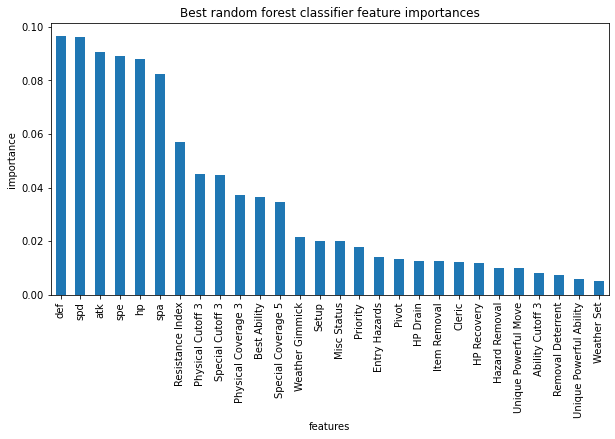

In [34]:
plt.subplots(figsize=(10, 5))
imps = rf_grid.best_estimator_.feature_importances_
rf_feat_imps = pd.Series(imps, index=X.columns).sort_values(ascending=False)
rf_feat_imps.plot(kind='bar')
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Best random forest classifier feature importances');

This is actually pretty interesting, because the move cutoff features, which were so unhelpful before, now are doing pretty well.  The top features are totally unsurprising.

I might want to try this with training and test data, to get a more realistic account of the results, though

In [8]:
from sklearn.model_selection import train_test_split

In [42]:
X_train, X_test, y_train, y_test = train_test_split(X, y_df['formats'],
                        test_size=0.25, random_state=42,
                        stratify=y_df['formats'].values)

In [43]:
random_forest_classifier = RandomForestClassifier(random_state=42)
rf_grid = GridSearchCV(random_forest_classifier, param_grid=grid_params, cv=2, n_jobs=-1)
rf_grid.fit(X_train, y_train)

GridSearchCV(cv=2, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'n_estimators': [10, 25, 63, 158, 398, 1000]})

In [44]:
rf_grid.best_params_

{'n_estimators': 1000}

In [45]:
rf_grid.best_score_

0.5876693873279966

In [46]:
y_predrf_train = rf_grid.predict(X_train)
y_predrf_test = rf_grid.predict(X_test)
precision_recall_fscore_support(y_train, y_predrf_train, labels=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber']), precision_recall_fscore_support(y_test, y_predrf_test, labels=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber'])

((array([0.99601594, 1.        , 0.93939394, 1.        , 1.        ,
         1.        , 1.        ]),
  array([0.99601594, 0.98319328, 1.        , 1.        , 1.        ,
         1.        , 1.        ]),
  array([0.99601594, 0.99152542, 0.96875   , 1.        , 1.        ,
         1.        , 1.        ]),
  array([251, 119,  31,  34,  35,  43,  40], dtype=int64)),
 (array([0.8       , 0.41666667, 0.        , 0.25      , 0.4       ,
         0.5       , 0.58333333]),
  array([0.85714286, 0.625     , 0.        , 0.08333333, 0.18181818,
         0.4       , 0.53846154]),
  array([0.82758621, 0.5       , 0.        , 0.125     , 0.25      ,
         0.44444444, 0.56      ]),
  array([84, 40, 10, 12, 11, 15, 13], dtype=int64)))

Okay, this is much more realistic, it's doing really well on the training data (overfitting a lot, which we will want to pay attention to when modeling), but on the test data not quite so well, so the results are more similar to logistic regression (though since I didn't use testing data for logistic regression, logistic regression might well have done even worse on it).  In any case, let's look at feature importances this time

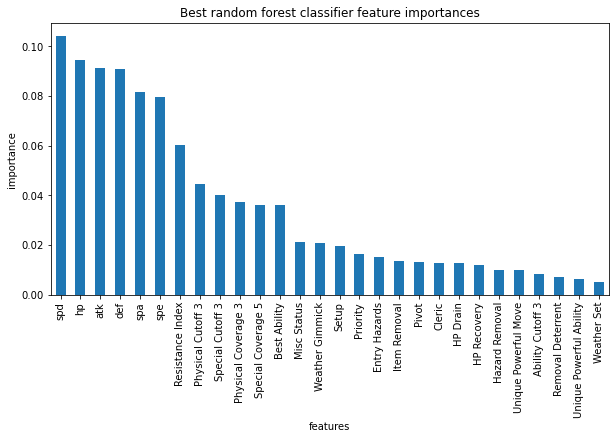

In [47]:
plt.subplots(figsize=(10, 5))
imps = rf_grid.best_estimator_.feature_importances_
rf_feat_imps = pd.Series(imps, index=X.columns).sort_values(ascending=False)
rf_feat_imps.plot(kind='bar')
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Best random forest classifier feature importances');

Looks like using training and testing data didn't really change much other than giving us a more realistic idea of performance, though, the results are pretty much identical.  Stats, move cutoffs, typing and best ability are important, most of the rest is relatively unimportant

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y_df['formats4'],
                        test_size=0.25, random_state=42,
                        stratify=y_df['formats4'].values)

In [50]:
random_forest_classifier = RandomForestClassifier(random_state=42)
rf_grid = GridSearchCV(random_forest_classifier, param_grid=grid_params, cv=2, n_jobs=-1)
rf_grid.fit(X_train, y_train)

GridSearchCV(cv=2, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'n_estimators': [10, 25, 63, 158, 398, 1000]})

In [51]:
rf_grid.best_params_, rf_grid.best_score_

({'n_estimators': 1000}, 0.6239143514885157)

In [52]:
y_predrf4_train = rf_grid.predict(X_train)
y_predrf4_test = rf_grid.predict(X_test)
precision_recall_fscore_support(y_train, y_predrf4_train, labels=['Not c', 'Low c', 'Mid c', 'High c']), precision_recall_fscore_support(y_test, y_predrf4_test, labels=['Not c', 'Low c', 'Mid c', 'High c'])

((array([0.98818898, 1.        , 1.        , 1.        ]),
  array([1.        , 0.98319328, 0.99      , 1.        ]),
  array([0.99405941, 0.99152542, 0.99497487, 1.        ]),
  array([251, 119, 100,  83], dtype=int64)),
 (array([0.80645161, 0.51282051, 0.41176471, 0.63157895]),
  array([0.89285714, 0.5       , 0.42424242, 0.42857143]),
  array([0.84745763, 0.50632911, 0.41791045, 0.5106383 ]),
  array([84, 40, 33, 28], dtype=int64)))

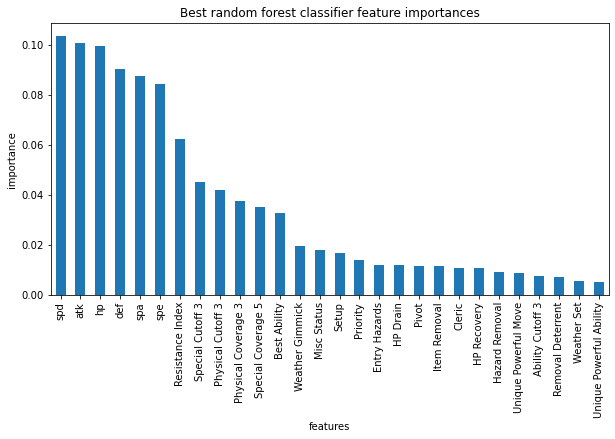

In [53]:
plt.subplots(figsize=(10, 5))
imps = rf_grid.best_estimator_.feature_importances_
rf_feat_imps = pd.Series(imps, index=X.columns).sort_values(ascending=False)
rf_feat_imps.plot(kind='bar')
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Best random forest classifier feature importances');

This remains nearly identical to last time

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y_df['formats2'],
                        test_size=0.25, random_state=42,
                        stratify=y_df['formats2'].values)

In [55]:
random_forest_classifier = RandomForestClassifier(random_state=42)
rf_grid = GridSearchCV(random_forest_classifier, param_grid=grid_params, cv=2, n_jobs=-1)
rf_grid.fit(X_train, y_train)

GridSearchCV(cv=2, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'n_estimators': [10, 25, 63, 158, 398, 1000]})

In [56]:
rf_grid.best_params_, rf_grid.best_score_

({'n_estimators': 25}, 0.8860723068068854)

Interesting, so for this one we only need 25 estimators, far less than 1000!  The binary task is a lot easier and hopefully it will help in a two-stage model with my later task

In [57]:
y_predrf2_train = rf_grid.predict(X_train)
y_predrf2_test = rf_grid.predict(X_test)
precision_recall_fscore_support(y_train, y_predrf2_train, labels=['No', 'Yes']), precision_recall_fscore_support(y_test, y_predrf2_test, labels=['No', 'Yes'])

((array([0.99206349, 0.99667774]),
  array([0.99601594, 0.99337748]),
  array([0.99403579, 0.99502488]),
  array([251, 302], dtype=int64)),
 (array([0.86842105, 0.83486239]),
  array([0.78571429, 0.9009901 ]),
  array([0.825     , 0.86666667]),
  array([ 84, 101], dtype=int64)))

It did pretty well, not quite as well as logistic regression (but again we didn't split into training and test sets), but still very well, so it's promosing

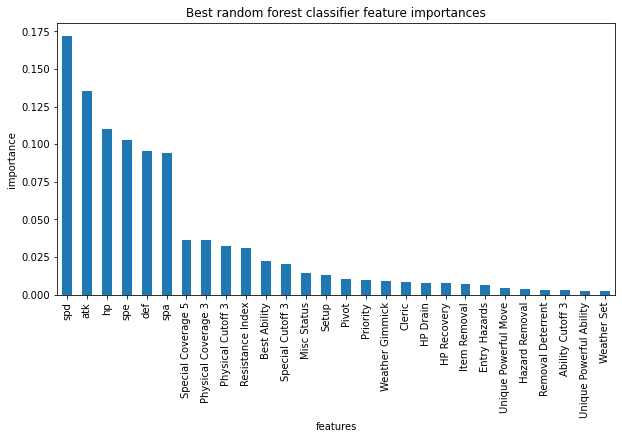

In [58]:
plt.subplots(figsize=(10, 5))
imps = rf_grid.best_estimator_.feature_importances_
rf_feat_imps = pd.Series(imps, index=X.columns).sort_values(ascending=False)
rf_feat_imps.plot(kind='bar')
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Best random forest classifier feature importances');

Very similar to before but even more weighted towards stats (which makes sense, you need certain stats to be in the higher tiers otherwise you will just get mowed down or be too passive to do anything)

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y_df['oldformats'],
                        test_size=0.25, random_state=42,
                        stratify=y_df['oldformats'].values)
random_forest_classifier = RandomForestClassifier(random_state=42)
rf_grid = GridSearchCV(random_forest_classifier, param_grid=grid_params, cv=2, n_jobs=-1)
rf_grid.fit(X_train, y_train)
rf_grid.best_params_, rf_grid.best_score_

({'n_estimators': 158}, 0.670891539789672)

Yet again we have oldformats performing significantly better than the tampered formats for the 7 classes iteration, and with fewer estimators

In [60]:
y_predrfold_train = rf_grid.predict(X_train)
y_predrfold_test = rf_grid.predict(X_test)
precision_recall_fscore_support(y_train, y_predrfold_train, labels=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber']), precision_recall_fscore_support(y_test, y_predrfold_test, labels=['ZU', 'PU', 'NU', 'RU', 'UU', 'OU', 'Uber'])

((array([1., 1., 1., 1., 1., 1., 1.]),
  array([1., 1., 1., 1., 1., 1., 1.]),
  array([1., 1., 1., 1., 1., 1., 1.]),
  array([355,  25,  36,  41,  31,  37,  28], dtype=int64)),
 (array([0.72839506, 0.        , 0.        , 0.        , 0.4       ,
         0.2       , 0.625     ]),
  array([0.99159664, 0.        , 0.        , 0.        , 0.2       ,
         0.08333333, 0.55555556]),
  array([0.83985765, 0.        , 0.        , 0.        , 0.26666667,
         0.11764706, 0.58823529]),
  array([119,   9,  12,  14,  10,  12,   9], dtype=int64)))

Yet, in spite of the "better score", the model actually did notably worse on the precision recall matrix, having many outrightt 0 f scores.  It may only be better on the training set, and thus I may want to question whether Grid Search CV might not always give the best model, it might be giving me overfitted garbage, and I may have to assess things based on a more manual search to try prevent overfitting, or perhaps other metrics and hyperparameters will help with that.  But overall, I'd have to say this did not perform better.

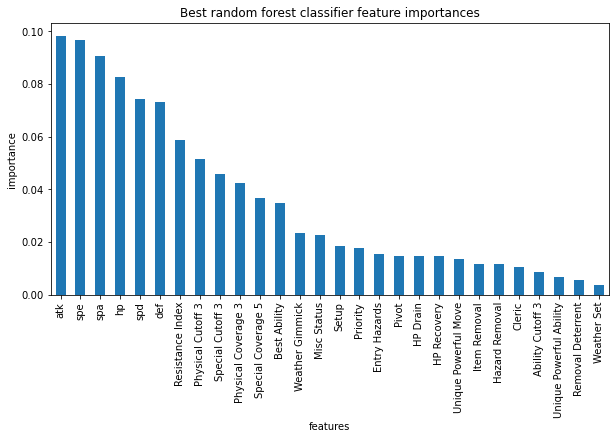

In [61]:
plt.subplots(figsize=(10, 5))
imps = rf_grid.best_estimator_.feature_importances_
rf_feat_imps = pd.Series(imps, index=X.columns).sort_values(ascending=False)
rf_feat_imps.plot(kind='bar')
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Best random forest classifier feature importances');

No significant difference in feature importances

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X, y_df['oldformats4'],
                        test_size=0.25, random_state=42,
                        stratify=y_df['oldformats4'].values)
random_forest_classifier = RandomForestClassifier(random_state=42)
rf_grid = GridSearchCV(random_forest_classifier, param_grid=grid_params, cv=2, n_jobs=-1)
rf_grid.fit(X_train, y_train)
rf_grid.best_params_, rf_grid.best_score_

({'n_estimators': 398}, 0.6890205619212054)

Hilariously, this one has more estimators than the one for 7 classes.  This may be a slight fluke though, because in cases where I looked at the cv results in more detail, many of the estimators were quite close in score so it may just be that a higher one won by a very small amount

In [63]:
y_predrfold4_train = rf_grid.predict(X_train)
y_predrfold4_test = rf_grid.predict(X_test)
precision_recall_fscore_support(y_train, y_predrfold4_train, labels=['Not c', 'Low c', 'Mid c', 'High c']), precision_recall_fscore_support(y_test, y_predrfold4_test, labels=['Not c', 'Low c', 'Mid c', 'High c'])

((array([1., 1., 1., 1.]),
  array([1., 1., 1., 1.]),
  array([1., 1., 1., 1.]),
  array([355, 103,  67,  28], dtype=int64)),
 (array([0.77333333, 0.375     , 0.8       , 0.77777778]),
  array([0.97478992, 0.17647059, 0.34782609, 0.77777778]),
  array([0.86245353, 0.24      , 0.48484848, 0.77777778]),
  array([119,  34,  23,   9], dtype=int64)))

Not terrible performance like oldformats had, but low c is still quite low which could be problematic, and mid c isn't doing great either

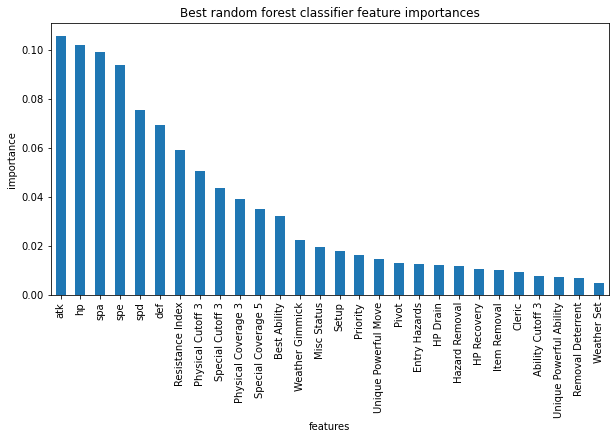

In [64]:
plt.subplots(figsize=(10, 5))
imps = rf_grid.best_estimator_.feature_importances_
rf_feat_imps = pd.Series(imps, index=X.columns).sort_values(ascending=False)
rf_feat_imps.plot(kind='bar')
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Best random forest classifier feature importances');

Utterly typical

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y_df['oldformats2'],
                        test_size=0.25, random_state=42,
                        stratify=y_df['oldformats2'].values)
random_forest_classifier = RandomForestClassifier(random_state=42)
rf_grid = GridSearchCV(random_forest_classifier, param_grid=grid_params, cv=2, n_jobs=-1)
rf_grid.fit(X_train, y_train)
rf_grid.best_params_, rf_grid.best_score_

({'n_estimators': 63}, 0.8444972008580547)

Seems sensible, fewer estimators and a pretty good score

In [66]:
y_predrfold2_train = rf_grid.predict(X_train)
y_predrfold2_test = rf_grid.predict(X_test)
precision_recall_fscore_support(y_train, y_predrfold2_train, labels=['No', 'Yes']), precision_recall_fscore_support(y_test, y_predrfold2_test, labels=['No', 'Yes'])

((array([1., 1.]),
  array([1., 1.]),
  array([1., 1.]),
  array([355, 198], dtype=int64)),
 (array([0.87179487, 0.75      ]),
  array([0.85714286, 0.77272727]),
  array([0.86440678, 0.76119403]),
  array([119,  66], dtype=int64)))

Again it does noticeably worse than formats, so it's interesting that old formats MIGHT work better for some things, but seemingly doesn't work better for others.  We can analyze that more during pre-processing

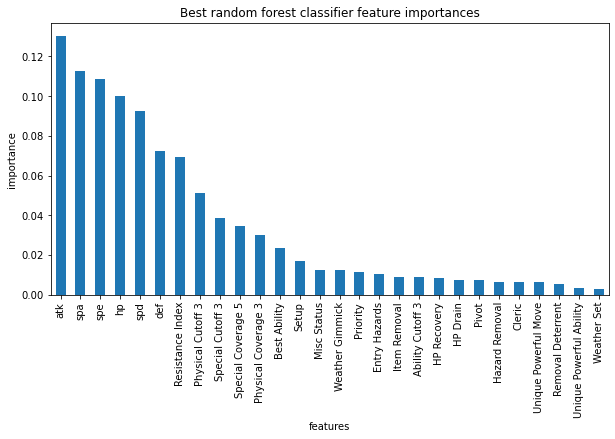

In [67]:
plt.subplots(figsize=(10, 5))
imps = rf_grid.best_estimator_.feature_importances_
rf_feat_imps = pd.Series(imps, index=X.columns).sort_values(ascending=False)
rf_feat_imps.plot(kind='bar')
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Best random forest classifier feature importances');

Quite typical, though setup is a bit higher than normal.

**Now, we are moving onto clustering.**  We want to try three kinds of clustering:
- Hierarchical
- Density based
- KMeans

Could also try mean-shift (which might actually be good for seeing strange cases like PU/NU tier, etc.) and NMF (which I also learned about on datacamp).  We could also try them with or without PCA.

In [9]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

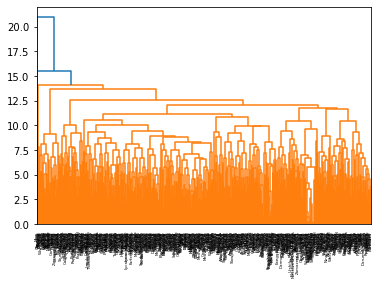

In [9]:
X_scaled = StandardScaler().fit_transform(X)
mergings = linkage(X_scaled, method='complete')
dendrogram(mergings,
           labels=X.index,
           leaf_rotation=90,
           leaf_font_size=4)
plt.show()

Obviously, this chart is unreadable in terms of labels, but we can see the cluster distance which may be useful to deciding the number of clusters we want to try for.

In [10]:
labels = fcluster(mergings, 10, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

7     201
9     118
6      82
10     49
14     46
2      45
13     43
11     41
4      35
12     29
8      22
3      16
1       5
5       4
15      1
16      1
Name: labels, dtype: int64

In [11]:
labels = fcluster(mergings, 7, criterion='maxclust')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

4    427
5    208
3     51
2     45
1      5
6      1
7      1
Name: labels, dtype: int64

In [12]:
pairs[pairs['labels'] == 6]

,labels,pokemon
151,6,Shuckle


In [13]:
pairs[pairs['labels'] == 7]

,labels,pokemon
116,7,Mew


In [14]:
pairs[pairs['labels'] == 1]

,labels,pokemon
22,1,Clefairy
23,1,Clefable
78,1,Chansey
166,1,Blissey
371,1,Audino


That last cluster is pretty interesting as it gives the "fairy clerics", but the fact that we still have clusters of one is a bit strange and makes me think hierarchical clustering might not be the best way to go, at least without PCA.

In [15]:
pairs.head(20)

,labels,pokemon
0,4,Bulbasaur
1,4,Ivysaur
2,4,Venusaur
3,4,Charmander
4,4,Charmeleon
5,5,Charizard
6,5,Squirtle
7,5,Wartortle
8,5,Blastoise
9,2,Caterpie


Also, pokemon seem to frequently have the same cluster as their evolutionary line, which is not necessarily very informative since the power level differences within the line can be quite large.  Tempted to try with PCA (haven't done it yet below, need to throw that into the clustering algorithm):

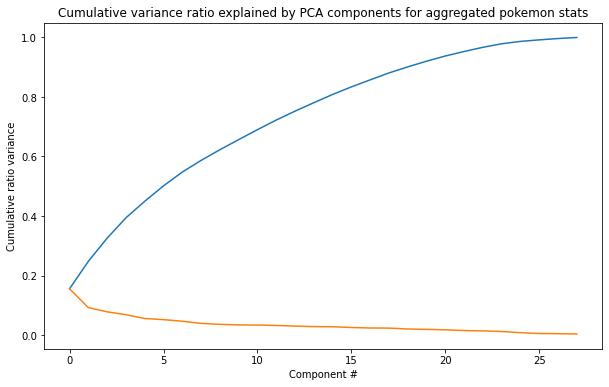

In [10]:
pokemon_data_pca = pokemon_data.drop(columns=['weight', 'height', 'Weaknesses', 'Strong Weaknesses', 'Resists',
                                'Strong Resists', 'Immune', 'STAB', 'Physical Cutoff 1', 'Physical Cutoff 2',
                                'Physical Cutoff 4', 'Physical Cutoff 5', 'Physical Cutoff 6',
                                'Physical Coverage 1', 'Physical Coverage 2', 'Physical Coverage 4',
                                'Special Cutoff 1', 'Special Cutoff 2', 'Special Cutoff 4',
                                'Special Cutoff 5', 'Special Cutoff 6', 'Special Cutoff 7',
                                'Special Coverage 1', 'Special Coverage 2', 'Special Coverage 3',
                                'Special Coverage 4', 'Special Coverage 6', 'Special Coverage 7',
                                'Special Coverage 8', 'Special Coverage 9', 'Special Coverage 10',
                                'Ability Cutoff 1', 'Ability Cutoff 2', 'Ability Cutoff 4', 'Ability Cutoff 5',
                                'Ability Cutoff 6', 'Best Ability <100', 'formats', 'generation',
                                'format codes', 'oldformats', 'oldformat codes'])

pokemon_data_nonnumeric = pokemon_data_pca.select_dtypes(include='object', exclude='number')
pokemon_data_numeric = pokemon_data_pca.select_dtypes(include='number')
data_scaled = scale(pokemon_data_numeric)
pokemon_data_scaled = pd.DataFrame(data_scaled, index=pokemon_data.index, columns=pokemon_data_numeric.columns)
pokemon_data_fit = PCA().fit(pokemon_data_scaled)

plt.subplots(figsize=(10, 6))
plt.plot(pokemon_data_fit.explained_variance_ratio_.cumsum())
plt.plot(pokemon_data_fit.explained_variance_ratio_)
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for aggregated pokemon stats');

In [11]:
pokemon_data_comp = pokemon_data_fit.transform(pokemon_data_scaled)
pokemon_data_compdf = pd.DataFrame(pokemon_data_comp, index=pokemon_data.index)
pokemon_data_compdf

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
name,,,,,,,,,,,,,,,,,,,,,
Bulbasaur,-1.647428,-1.802959,0.405341,0.672114,2.130793,-0.941111,0.767530,-0.380129,0.389119,-1.864558,...,-0.082102,0.303243,-0.780527,0.608939,0.559103,0.081921,-0.302959,-0.608706,0.307459,0.244873
Ivysaur,-0.834277,-1.670569,0.574821,0.660693,1.843315,-1.137282,1.138755,0.014787,0.292686,-2.029226,...,-0.149437,0.352160,-0.820262,0.707785,0.579669,-0.041302,-0.232014,-0.613619,0.272710,0.291251
Venusaur,0.894003,-1.345456,0.788892,0.798135,1.661929,-1.322237,1.219368,0.347408,0.365266,-2.136313,...,-0.231197,0.295115,-0.828030,0.756620,0.489161,-0.281118,-0.136591,-0.654748,0.172928,-0.072168
Charmander,-1.373949,0.858250,0.320061,-0.200858,0.531723,-0.278172,-1.519214,-0.317976,0.378113,-0.598864,...,-0.430899,0.250621,-0.939056,-0.046542,0.901774,0.846805,0.222342,-0.342585,-0.119121,0.472228
Charmeleon,-0.467709,0.963818,0.506116,-0.190181,0.209833,-0.505307,-1.138932,0.110501,0.248333,-0.787167,...,-0.519082,0.311207,-0.916772,0.141719,0.930619,0.790887,0.388059,-0.347503,-0.176942,0.524843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Glastrier,0.905553,2.504076,-1.456210,1.106821,-0.900327,-0.990594,1.242464,0.398409,-1.776124,-0.136410,...,1.296410,-0.239139,-0.442578,0.240513,-0.738235,0.079449,-0.752921,0.390415,0.395102,-0.053754
Spectrier,0.028295,0.246548,4.383688,-0.166078,-0.881519,1.008462,0.141962,1.803510,-1.195766,-0.104511,...,-1.767541,0.142279,-0.907983,0.481583,0.575676,0.535182,1.143487,0.126262,-0.052706,-0.213223
Calyrex,-0.158902,-0.925457,1.624289,1.595753,0.243958,-1.789560,-0.702809,1.133232,-0.599673,-0.081906,...,-0.282617,0.297522,-0.558899,1.371832,-0.588107,-0.948882,-0.003987,0.692800,0.341730,0.523352


In [18]:
X_scaled = StandardScaler().fit_transform(pokemon_data_compdf)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 10, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

18    145
19    125
3      84
16     66
8      56
21     42
15     30
13     29
4      28
6      25
17     22
10     19
9      17
20     12
2      10
12      7
11      7
7       4
14      3
5       3
1       2
22      1
23      1
Name: labels, dtype: int64

In [27]:
pairs[pairs['labels'] == 23].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
116,23,Mew,Uber


In [28]:
pairs[pairs['labels'] == 22].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
151,22,Shuckle,PU


In [29]:
pairs[pairs['labels'] == 1].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
78,1,Chansey,UU
166,1,Blissey,Uber


In [30]:
pairs[pairs['labels'] == 5].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
557,5,Fomantis,ZU
558,5,Lurantis,PU
699,5,Cursola,PU


In [31]:
pairs[pairs['labels'] == 14].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
491,14,Clauncher,ZU
492,14,Clawitzer,NU
676,14,Flapple,ZU


In [32]:
pairs[pairs['labels'] == 7].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
512,7,Xerneas,Uber
513,7,Yveltal,Uber
734,7,Spectrier,Uber
737,7,Calyrex-Shadow,Uber


In [33]:
pairs[pairs['labels'] == 11].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
101,11,Flareon,PU
359,11,Victini,OU
384,11,Darumaka,ZU
385,11,Darmanitan,RU
641,11,Darumaka-Galar,ZU
642,11,Darmanitan-Galar,Uber
736,11,Calyrex-Ice,Uber


In [34]:
pairs[pairs['labels'] == 12].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
171,12,Ho-Oh,Uber
270,12,Leafeon,PU
514,12,Diancie,UU
551,12,Mareanie,ZU
552,12,Toxapex,Uber
612,12,Kartana,OU
725,12,Zamazenta-Crowned,Uber


In [35]:
pairs[pairs['labels'] == 2].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
147,2,Wobbuffet,ZU
240,2,Wynaut,ZU
283,2,Drifloon,ZU
284,2,Drifblim,PU
287,2,Stunky,ZU
288,2,Skuntank,PU
325,2,Giratina,Uber
326,2,Giratina-Origin,Uber
613,2,Guzzlord,NU
732,2,Regidrago,RU


In [36]:
pairs[pairs['labels'] == 20].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
60,20,Cloyster,RU
64,20,Onix,ZU
76,20,Rhyhorn,ZU
77,20,Rhydon,PU
149,20,Steelix,RU
192,20,Regirock,PU
219,20,Aggron,PU
311,20,Rhyperior,UU
466,20,Bergmite,ZU
467,20,Avalugg,PU


In [37]:
pairs[pairs['labels'] == 9].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
58,9,Farfetch'd,ZU
173,9,Milotic,UU
338,9,Gothita,ZU
339,9,Gothorita,ZU
340,9,Gothitelle,PU
434,9,Braviary,NU
445,9,Tornadus,UU
447,9,Thundurus,UU
478,9,Meowstic-F,PU
485,9,Inkay,ZU


In [38]:
pairs[pairs['labels'] == 10].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
50,10,Tentacool,ZU
51,10,Tentacruel,UU
97,10,Ditto,ZU
200,10,Trapinch,ZU
342,10,Klink,ZU
416,10,Klang,ZU
417,10,Klinklang,PU
537,10,Decidueye,RU
550,10,Wishiwashi,PU
555,10,Dewpider,ZU


I'm getting the picture at this point.  Honestly though, all of this gives me another idea.  The smaller clusters seem a lot more similar than the larger one's.  If I can keep the clusters delibarately small, I can potentially use the clusters labels as a feature (if understood as a categorical, rather than as a number).

Complete linkage also makes the most sense as I want the tighest clusters, which is what it produces

In [43]:
X_scaled = StandardScaler().fit_transform(pokemon_data_compdf)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 9, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

31    84
32    81
4     64
25    42
30    34
37    34
12    30
19    29
33    28
11    26
8     25
6     24
22    23
23    21
3     20
13    17
26    16
34    16
29    14
28    13
35    12
15    12
2     10
36     8
21     7
16     7
14     7
27     6
18     5
5      4
24     3
7      3
20     3
1      2
17     2
10     2
9      2
38     1
39     1
Name: labels, dtype: int64

In [44]:
pairs[pairs['labels'] == 31].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
6,31,Squirtle,ZU
7,31,Wartortle,ZU
8,31,Blastoise,NU
10,31,Metapod,ZU
14,31,Sandshrew,ZU
...,...,...,...
704,31,Alcremie,PU
716,31,Dracozolt,OU
717,31,Arctozolt,RU
718,31,Dracovish,Uber


In [45]:
pairs[pairs['labels'] == 32].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
11,32,Butterfree,ZU
16,32,Nidoran-F,ZU
17,32,Nidorina,ZU
19,32,Nidoran-M,ZU
20,32,Nidorino,ZU
...,...,...,...
690,32,Polteageist,UU
694,32,Impidimp,ZU
695,32,Morgrem,ZU
701,32,Mr. Rime,PU


In [47]:
pairs[pairs['labels'] == 4].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
9,4,Caterpie,ZU
12,4,Pikachu,PU
13,4,Raichu,PU
108,4,Snorlax,RU
130,4,Raikou,UU
...,...,...,...
656,4,Rookidee,ZU
657,4,Corvisquire,ZU
670,4,Yamper,ZU
675,4,Applin,ZU


The problem with these bigger columns is that very different pokemon seem too similar.  Snorlax does not seem like it has much in common with Raikou and Caterpie.  So I need to lower the max distance, which is going to give me more unique columns, though perhaps if pokemon have a unique column then I will just note that in a one-hot-encode, similar to aggregating the unique powerful moves or abilities

In [48]:
X_scaled = StandardScaler().fit_transform(pokemon_data_compdf)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 8, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

57    57
56    38
8     28
6     27
44    26
      ..
13     2
30     1
14     1
69     1
70     1
Name: labels, Length: 70, dtype: int64

In [49]:
pairs['labels'].value_counts().head(35)

57    57
56    38
8     28
6     27
44    26
23    25
53    24
34    23
41    21
24    17
5     16
43    16
21    16
45    16
61    15
67    15
66    14
49    14
60    13
52    13
48    13
39    12
64    12
55    12
58    12
50    12
59    12
40    11
16    11
15    10
54    10
12    10
20    10
51     9
62     9
Name: labels, dtype: int64

In [50]:
pairs[pairs['labels'] == 57].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
11,57,Butterfree,ZU
16,57,Nidoran-F,ZU
17,57,Nidorina,ZU
19,57,Nidoran-M,ZU
20,57,Nidorino,ZU
28,57,Zubat,ZU
29,57,Golbat,ZU
82,57,Seadra,ZU
126,57,Noctowl,ZU
133,57,Hoothoot,ZU


In [51]:
pairs[pairs['labels'] == 56].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
6,56,Squirtle,ZU
7,56,Wartortle,ZU
8,56,Blastoise,NU
10,56,Metapod,ZU
59,56,Shellder,ZU
102,56,Porygon,ZU
122,56,Marill,ZU
123,56,Azumarill,OU
124,56,Tyrogue,ZU
161,56,Porygon2,RU


For A LOT of these I can see significant similarity, like the Squirtle and Spheal and Marill family.  But a lot of them are not that similar, so this measure may still be too close (and that's okay, I can probably handle more uniques, though I should look at the one's I have now

In [52]:
pairs['labels'].value_counts().tail(10)

32    2
31    2
28    2
19    2
18    2
13    2
30    1
14    1
69    1
70    1
Name: labels, dtype: int64

In [53]:
pairs[pairs['labels'] == 70].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
116,70,Mew,Uber


In [54]:
pairs[pairs['labels'] == 69].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
151,69,Shuckle,PU


In [55]:
pairs[pairs['labels'] == 14].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
699,14,Cursola,PU


In [56]:
pairs[pairs['labels'] == 30].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
101,30,Flareon,PU


In [12]:
X_scaled = StandardScaler().fit_transform(pokemon_data_compdf)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 7, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

95     29
9      24
74     22
56     21
100    19
       ..
22      1
59      1
122     1
123     1
124     1
Name: labels, Length: 124, dtype: int64

How many uniques with a 7 distance value?

In [13]:
pairs['labels'].value_counts().tail(20)

34     2
64     2
48     2
46     2
52     2
53     2
55     2
58     2
61     2
2      2
50     1
45     1
43     1
114    1
54     1
22     1
59     1
122    1
123    1
124    1
Name: labels, dtype: int64

Only 10 uniques isn't terrible, they can all be aggregated into the "unique" label which is 0, or perhaps just stay with their own category

In [14]:
pairs[pairs['labels'] == 95].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
10,95,Metapod,ZU
102,95,Porygon,ZU
161,95,Porygon2,RU
181,95,Marshtomp,ZU
186,95,Exploud,NU
198,95,Lunatone,ZU
199,95,Solrock,PU
215,95,Loudred,ZU
243,95,Spheal,ZU
244,95,Sealeo,ZU


In [15]:
pairs[pairs['labels'] == 9].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
12,9,Pikachu,PU
13,9,Raichu,PU
137,9,Pichu,ZU
183,9,Ralts,ZU
184,9,Kirlia,ZU
220,9,Electrike,ZU
221,9,Manectric,PU
223,9,Carvanha,ZU
224,9,Sharpedo,RU
274,9,Shinx,ZU


I can see a lot of similarity here, fast electric types on the earth, but with some other things mixed in, like "bite" moves

In [16]:
pairs[pairs['labels'] == 74].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
257,74,Rayquaza,Uber
450,74,Zekrom,Uber
515,74,Volcanion,UU
577,74,Silvally,ZU
578,74,Silvally-Bug,PU
579,74,Silvally-Dark,ZU
580,74,Silvally-Dragon,PU
581,74,Silvally-Electric,ZU
582,74,Silvally-Fairy,PU
583,74,Silvally-Fighting,ZU


Interesting, a legendary cluster but with some weak and strong legendaries

In [17]:
pairs[pairs['labels'] == 56].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
24,56,Vulpix,ZU
25,56,Ninetales,PU
141,56,Politoed,ZU
169,56,Tyranitar,Uber
255,56,Kyogre,Uber
256,56,Groudon,Uber
300,56,Hippopotas,ZU
301,56,Hippowdon,OU
307,56,Snover,ZU
308,56,Abomasnow,ZU


This looks like a very "weather" setting oriented group, makes a lot of sense!

In [18]:
pairs[pairs['labels'] == 100].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
140,100,Sudowoodo,ZU
154,100,Swinub,ZU
155,100,Piloswine,ZU
291,100,Bonsly,ZU
349,100,Roggenrola,ZU
350,100,Boldore,ZU
353,100,Vanillite,ZU
354,100,Vanillish,ZU
433,100,Bouffalant,PU
495,100,Tyrunt,ZU


This one I don't really understand, partly because so many of the pokemon are unfamiliar to me

In [20]:
pairs['labels'].value_counts().head(50)

95     29
9      24
74     22
56     21
100    19
91     19
98     16
120    15
69     14
99     14
94     12
8      12
81     11
109    11
25     11
36     11
31     10
13     10
40     10
96      9
87      9
11      9
89      9
110     9
97      8
105     8
77      8
71      8
118     8
72      8
18      8
15      8
85      8
37      8
68      7
111     7
93      7
63      7
12      7
30      7
104     6
119     6
20      6
24      6
113     6
101     6
102     6
35      6
103     6
67      6
Name: labels, dtype: int64

In [21]:
pairs[pairs['labels'] == 91].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
37,91,Psyduck,ZU
38,91,Golduck,PU
41,91,Poliwag,ZU
42,91,Poliwhirl,ZU
43,91,Poliwrath,PU
81,91,Horsea,ZU
83,91,Goldeen,ZU
84,91,Seaking,PU
160,91,Kingdra,UU
205,91,Lotad,ZU


This a rain sweeper swift swim cluster, which is super cool

In [22]:
pairs[pairs['labels'] == 98].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
16,98,Nidoran-F,ZU
17,98,Nidorina,ZU
19,98,Nidoran-M,ZU
20,98,Nidorino,ZU
126,98,Noctowl,ZU
133,98,Hoothoot,ZU
142,98,Wooper,ZU
143,98,Quagsire,OU
148,98,Dunsparce,ZU
203,98,Zigzagoon,ZU


This is another somewhat mystifying cluster, it has a combination of water ground types, weak normal types, nidoran early evos and some grass.  Mostly the pokemon are quite weak so that may be partly what it is

In [23]:
pairs[pairs['labels'] == 120].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
39,120,Growlithe,ZU
40,120,Arcanine,NU
52,120,Ponyta,ZU
53,120,Rapidash,PU
174,120,Treecko,ZU
175,120,Grovyle,ZU
176,120,Sceptile,NU
298,120,Riolu,ZU
420,120,Axew,ZU
421,120,Fraxure,PU


Another weird one, though a lot of the pokemon in it are fast

In [24]:
pairs[pairs['labels'] == 69].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
74,69,Koffing,ZU
75,69,Weezing,NU
91,69,Magmar,ZU
164,69,Magby,ZU
314,69,Magmortar,PU
343,69,Litwick,ZU
344,69,Lampent,ZU
345,69,Chandelure,UU
437,69,Heatmor,PU
622,69,Blacephalon,OU


A lot of poison fire types with smoke oriented moves, like the sort of pokemon you'd see in Burnt Tower

In [25]:
pairs[pairs['labels'] == 99].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
82,99,Seadra,ZU
156,99,Remoraid,ZU
157,99,Octillery,ZU
180,99,Mudkip,ZU
214,99,Whismur,ZU
247,99,Bagon,ZU
248,99,Shelgon,ZU
360,99,Lillipup,ZU
439,99,Deino,ZU
440,99,Zweilous,ZU


This is another strange one, but it has these recognize subclusters which is part of what's bothering me.  Like Seadra, Remoraid and Octillery are all "beam" pokemon that are pretty weak

In [26]:
pairs[pairs['labels'] == 94].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
14,94,Sandshrew,ZU
15,94,Sandslash,PU
103,94,Omanyte,ZU
104,94,Omastar,NU
105,94,Kabuto,ZU
106,94,Kabutops,ZU
237,94,Anorith,ZU
238,94,Armaldo,PU
393,94,Tirtouga,ZU
394,94,Carracosta,PU


This is "sandstormish" pokemon, and pokemon with weather speed that have more like ground types

In [27]:
pairs[pairs['labels'] == 8].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
47,8,Machop,ZU
48,8,Machoke,ZU
49,8,Machamp,NU
179,8,Blaziken,OU
372,8,Timburr,ZU
373,8,Gurdurr,ZU
374,8,Conkeldurr,OU
377,8,Throh,PU
378,8,Sawk,PU
532,8,Exeggutor-Alola,PU


Mostly physically attacking fighting types, except Exeggutor-Alola which is a strange inclusion

In [28]:
pairs[pairs['labels'] == 81].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
235,81,Lileep,ZU
236,81,Cradily,PU
319,81,Uxie,PU
320,81,Mesprit,PU
321,81,Azelf,UU
397,81,Trubbish,ZU
398,81,Garbodor,NU
414,81,Galvantula,PU
423,81,Shelmet,ZU
660,81,Dottler,ZU


This is one that is totally mystifying to me, no idea what's in common here

In [29]:
pairs[pairs['labels'] == 109].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
167,109,Larvitar,ZU
168,109,Pupitar,ZU
332,109,Venipede,ZU
333,109,Whirlipede,ZU
334,109,Scolipede,UU
352,109,Crustle,PU
387,109,Dwebble,ZU
487,109,Binacle,ZU
488,109,Barbaracle,RU
546,109,Cutiefly,ZU


A combination of bulky rock types and lightweight bug types, strange combo and again the subclusters here dominante my attention over the whole cluster

In [30]:
pairs[pairs['labels'] == 25].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
109,25,Articuno,ZU
138,25,Natu,ZU
139,25,Xatu,NU
201,25,Vibrava,ZU
202,25,Flygon,RU
279,25,Vespiquen,PU
329,25,Unfezant,PU
366,25,Pidove,ZU
367,25,Tranquill,ZU
664,25,Gossifleur,ZU


Some bird pokemon, maybe hazard removers in a lot of cases, which is something (Eldegoss also has rapid spin, for example)

In [31]:
pairs[pairs['labels'] == 36].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
411,36,Frillish,ZU
412,36,Jellicent,PU
461,36,Pumpkaboo-Small,ZU
462,36,Pumpkaboo-Large,ZU
463,36,Gourgeist-Small,PU
464,36,Gourgeist-Large,ZU
508,36,Pumpkaboo,ZU
509,36,Pumpkaboo-Super,ZU
510,36,Gourgeist,PU
511,36,Gourgeist-Super,PU


This is a bunch of ghost pokemon, which I suppose is pretty meaningful

Since I think 6 might be too small and we already have a bit too many clusters, let's try something like 6.5 for distance

In [32]:
X_scaled = StandardScaler().fit_transform(pokemon_data_compdf)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 6.5, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

12     24
128    23
101    22
122    15
134    14
       ..
66      1
65      1
62      1
54      1
169     1
Name: labels, Length: 169, dtype: int64

In [35]:
pairs['labels'].value_counts().tail(32)

88     2
8      1
167    1
153    1
168    1
37     1
156    1
3      1
30     1
28     1
4      1
39     1
116    1
60     1
40     1
149    1
96     1
91     1
86     1
82     1
76     1
75     1
74     1
71     1
70     1
69     1
67     1
66     1
65     1
62     1
54     1
169    1
Name: labels, dtype: int64

31 uniques is starting to become kind of a lot, but it's still not much bigger than the biggest category so it isn't terrible

In [36]:
pairs[pairs['labels'] == 12].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
12,12,Pikachu,PU
13,12,Raichu,PU
137,12,Pichu,ZU
183,12,Ralts,ZU
184,12,Kirlia,ZU
220,12,Electrike,ZU
221,12,Manectric,PU
223,12,Carvanha,ZU
224,12,Sharpedo,RU
274,12,Shinx,ZU


This is again the "fast electric type biters", with a few exceptions still but it's not that bad, fast seems consistent, and also the fact that they aren't that strong

In [37]:
pairs[pairs['labels'] == 128].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
102,128,Porygon,ZU
161,128,Porygon2,RU
181,128,Marshtomp,ZU
186,128,Exploud,NU
198,128,Lunatone,ZU
199,128,Solrock,PU
215,128,Loudred,ZU
243,128,Spheal,ZU
244,128,Sealeo,ZU
245,128,Walrein,PU


At least this one is smaller since it's hard to see what exactly they have in common

In [38]:
pairs[pairs['labels'] == 101].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
257,101,Rayquaza,Uber
450,101,Zekrom,Uber
515,101,Volcanion,UU
577,101,Silvally,ZU
578,101,Silvally-Bug,PU
579,101,Silvally-Dark,ZU
580,101,Silvally-Dragon,PU
581,101,Silvally-Electric,ZU
582,101,Silvally-Fairy,PU
583,101,Silvally-Fighting,ZU


In [39]:
pairs[pairs['labels'] == 122].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
37,122,Psyduck,ZU
38,122,Golduck,PU
41,122,Poliwag,ZU
42,122,Poliwhirl,ZU
43,122,Poliwrath,PU
81,122,Horsea,ZU
83,122,Goldeen,ZU
84,122,Seaking,PU
160,122,Kingdra,UU
205,122,Lotad,ZU


Swift swimmers again, and even better, they got rid of the dragon fish who have sand rush instead

In [40]:
pairs[pairs['labels'] == 134].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
82,134,Seadra,ZU
156,134,Remoraid,ZU
157,134,Octillery,ZU
180,134,Mudkip,ZU
214,134,Whismur,ZU
247,134,Bagon,ZU
248,134,Shelgon,ZU
360,134,Lillipup,ZU
439,134,Deino,ZU
440,134,Zweilous,ZU


This is again the subcateogry of beam pokemon which unfortunately still did not split off that much

As interesting as all this clustering is though, it still seems like there's a possible subcategory problem, and most of all, there's too many categories at this distance for me to really consider putting in my final model, so I think this probably isn't the best idea.  I could also try single linkage for less tight clusters, but then the clusters may well be even weirder with more disparate pokemon and I don't love that idea since it gives the model less information than tighter clusters would give it

While I originally didn't like the fact that pokemon in the same evolutionary line were clustered similarly, I'm not sure how much PCA helped us in our clustering.  I may want to try the original clustering algorithm again without PCA (though maybe with scaling).  This seemed to give much bigger clusters for the same distance

In [42]:
X_scaled = StandardScaler().fit_transform(X)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 10, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

7     201
9     118
6      82
10     49
14     46
2      45
13     43
11     41
4      35
12     29
8      22
3      16
1       5
5       4
15      1
16      1
Name: labels, dtype: int64

I know the uniques are Mew and Shuckle so we can skip that

In [43]:
pairs[pairs['labels'] == 5].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
147,5,Wobbuffet,ZU
225,5,Wailmer,ZU
226,5,Wailord,ZU
613,5,Guzzlord,NU


That's high HP but low defense pokemon, which is very interesting and informative

In [44]:
pairs[pairs['labels'] == 1].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
22,1,Clefairy,PU
23,1,Clefable,Uber
78,1,Chansey,UU
166,1,Blissey,Uber
371,1,Audino,PU


The fairy cleric, also a very sensible cluster

In [45]:
pairs[pairs['labels'] == 3].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
213,3,Shedinja,ZU
391,3,Yamask,ZU
392,3,Cofagrigus,PU
459,3,Zygarde,Uber
460,3,Aegislash,OU
534,3,Zygarde-10%,UU
573,3,Sandygast,ZU
574,3,Palossand,PU
597,3,Mimikyu,RU
643,3,Yamask-Galar,ZU


Mostly low HP ghost pokemon, which is interesting.  But, some of these definitely seem further than the others, like Zygarde, Stunfisk-Galar and Spectrier/Calyrex

In [46]:
pairs[pairs['labels'] == 8].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
26,8,Jigglypuff,ZU
27,8,Wigglytuff,PU
58,8,Farfetch'd,ZU
117,8,Igglybuff,ZU
173,8,Milotic,UU
338,8,Gothita,ZU
339,8,Gothorita,ZU
340,8,Gothitelle,PU
434,8,Braviary,NU
445,8,Tornadus,UU


These seem really quite unsimilar.  Hard to see the thread here

In [47]:
pairs[pairs['labels'] == 12].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
24,12,Vulpix,ZU
25,12,Ninetales,PU
141,12,Politoed,ZU
169,12,Tyranitar,Uber
196,12,Pelipper,OU
197,12,Torkoal,ZU
255,12,Kyogre,Uber
256,12,Groudon,Uber
300,12,Hippopotas,ZU
301,12,Hippowdon,OU


Here's the weather feature again, which IS actually quite good

In [48]:
pairs[pairs['labels'] == 4].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
50,4,Tentacool,ZU
51,4,Tentacruel,UU
351,4,Woobat,ZU
368,4,Swoobat,PU
395,4,Archen,ZU
396,4,Archeops,PU
399,4,Zorua,ZU
400,4,Zoroark,NU
472,4,Fletchling,ZU
473,4,Fletchinder,ZU


Really hard to see the common thread in this one

**Let's try a distance of 9 as well**

In [49]:
X_scaled = StandardScaler().fit_transform(X)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 9, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

11    147
9      65
10     54
23     43
20     36
25     34
16     34
15     30
17     29
22     29
5      27
18     25
14     25
19     24
3      23
2      22
13     19
8      17
4      16
24     12
6       8
1       5
21      5
7       4
12      3
26      1
27      1
Name: labels, dtype: int64

In [51]:
pairs[pairs['labels'] == 12].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
26,12,Jigglypuff,ZU
27,12,Wigglytuff,PU
117,12,Igglybuff,ZU


Makes sense that these guys would be alone, they aren't good and didn't fit in that other cluster

In [52]:
pairs[pairs['labels'] == 7].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
147,7,Wobbuffet,ZU
225,7,Wailmer,ZU
226,7,Wailord,ZU
613,7,Guzzlord,NU


Same as last time

In [53]:
pairs[pairs['labels'] == 21].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
359,21,Victini,OU
512,21,Xerneas,Uber
513,21,Yveltal,Uber
617,21,Magearna,Uber
736,21,Calyrex-Ice,Uber


A lot of really strong legendaries

In [54]:
pairs[pairs['labels'] == 1].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
22,1,Clefairy,PU
23,1,Clefable,Uber
78,1,Chansey,UU
166,1,Blissey,Uber
371,1,Audino,PU


The fairy clerics again

In [55]:
pairs[pairs['labels'] == 6].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
472,6,Fletchling,ZU
473,6,Fletchinder,ZU
474,6,Talonflame,RU
553,6,Mudbray,ZU
554,6,Mudsdale,NU
709,6,Stonjourner,PU
731,6,Regieleki,Uber
732,6,Regidrago,RU


This is another one with subclusters that I'd like to see broken down some, mudsdale and stonjourner seem similar and the talonflame family has similarity with regieleki, other than that not sure why they are together

In [56]:
pairs[pairs['labels'] == 24].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
65,24,Krabby,ZU
66,24,Kingler,NU
69,24,Cubone,ZU
70,24,Marowak,PU
231,24,Corphish,ZU
232,24,Crawdaunt,OU
342,24,Klink,ZU
416,24,Klang,ZU
417,24,Klinklang,PU
491,24,Clauncher,ZU


A very reasonable clustering for the most part, the crab families being together is great, and in general these are sort of slow physical attackers, often a little bulky

In [57]:
pairs[pairs['labels'] == 4].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
213,4,Shedinja,ZU
391,4,Yamask,ZU
392,4,Cofagrigus,PU
459,4,Zygarde,Uber
460,4,Aegislash,OU
534,4,Zygarde-10%,UU
573,4,Sandygast,ZU
574,4,Palossand,PU
597,4,Mimikyu,RU
643,4,Yamask-Galar,ZU


This the same as last time, it's partly sensible as low hp ghost types, but other than that hard to see why some are here

In [58]:
pairs[pairs['labels'] == 8].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
88,8,Scyther,PU
107,8,Aerodactyl,RU
110,8,Zapdos,OU
111,8,Moltres,OU
150,8,Scizor,OU
159,8,Skarmory,Uber
283,8,Drifloon,ZU
284,8,Drifblim,PU
370,8,Excadrill,Uber
435,8,Vullaby,ZU


A lot of strong flying types, this cluster seems good overall, excadrill seems slightly odd though

In [59]:
pairs[pairs['labels'] == 13].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
58,13,Farfetch'd,ZU
173,13,Milotic,UU
338,13,Gothita,ZU
339,13,Gothorita,ZU
340,13,Gothitelle,PU
434,13,Braviary,NU
445,13,Tornadus,UU
447,13,Thundurus,UU
478,13,Meowstic-F,PU
485,13,Inkay,ZU


Now I understand the link here, I missed it before: these are removal deterrant types who are not ghost

In [61]:
pairs[pairs['labels'] == 2].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
9,2,Caterpie,ZU
10,2,Metapod,ZU
94,2,Magikarp,ZU
97,2,Ditto,ZU
189,2,Feebas,ZU
211,2,Nincada,ZU
240,2,Wynaut,ZU
250,2,Beldum,ZU
278,2,Combee,ZU
375,2,Tympole,ZU


Weak early evolutions, makes total sense to have them together

In [62]:
pairs[pairs['labels'] == 3].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
28,3,Zubat,ZU
29,3,Golbat,ZU
90,3,Electabuzz,ZU
163,3,Elekid,ZU
195,3,Wingull,ZU
200,3,Trapinch,ZU
201,3,Vibrava,ZU
205,3,Lotad,ZU
208,3,Seedot,ZU
209,3,Nuzleaf,ZU


Mostly weak low evolutions again, very basic pokemon

In [63]:
pairs[pairs['labels'] == 19].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
115,19,Mewtwo,Uber
131,19,Entei,UU
273,19,Heatran,Uber
322,19,Dialga,Uber
456,19,Keldeo,OU
533,19,Marowak-Alola,RU
602,19,Kommo-o,OU
605,19,Solgaleo,Uber
615,19,Necrozma-Dusk Mane,Uber
616,19,Necrozma-Dawn Wings,Uber


Mostly quite powerful legendaries, or those in similar families to them

In [64]:
pairs[pairs['labels'] == 14].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
54,14,Slowpoke,ZU
55,14,Slowbro,OU
128,14,Corsola,ZU
146,14,Slowking,OU
403,14,Solosis,ZU
404,14,Duosion,ZU
405,14,Reuniclus,UU
409,14,Foongus,ZU
410,14,Amoonguss,Uber
411,14,Frillish,ZU


Mostly quite slow pokemon, generally with water, psychic, ghost or poison types, another quite good cluster

In [65]:
pairs[pairs['labels'] == 18].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
18,18,Nidoqueen,UU
21,18,Nidoking,OU
77,18,Rhydon,PU
80,18,Kangaskhan,PU
93,18,Tauros,RU
108,18,Snorlax,RU
165,18,Miltank,PU
182,18,Swampert,OU
239,18,Absol,PU
272,18,Gallade,PU


Mostly tough physical attackers, another quite good cluster

In [66]:
pairs[pairs['labels'] == 5].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
50,5,Tentacool,ZU
51,5,Tentacruel,UU
351,5,Woobat,ZU
368,5,Swoobat,PU
395,5,Archen,ZU
396,5,Archeops,PU
399,5,Zorua,ZU
400,5,Zoroark,NU
523,5,Raichu-Alola,NU
531,5,Persian-Alola,PU


This one honestly seems more all over the place to me, unfortunately, maybe they have some common moves, not sure.  Mostly these are weaker pokemon except Cinderace and he's a bit of a fluke perhaps since he isn't used a ton in Ubers anyways

In [67]:
pairs[pairs['labels'] == 22].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
24,22,Vulpix,ZU
25,22,Ninetales,PU
141,22,Politoed,ZU
169,22,Tyranitar,Uber
196,22,Pelipper,OU
197,22,Torkoal,ZU
255,22,Kyogre,Uber
256,22,Groudon,Uber
300,22,Hippopotas,ZU
301,22,Hippowdon,OU


These are the weather setters, a great cluster if there ever was one

In [68]:
pairs[pairs['labels'] == 17].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
73,17,Lickitung,ZU
96,17,Lapras,PU
134,17,Crobat,RU
145,17,Umbreon,UU
193,17,Regice,PU
194,17,Registeel,RU
210,17,Shiftry,ZU
258,17,Jirachi,OU
271,17,Glaceon,PU
285,17,Buneary,ZU


Not a whole similar I can see here, but most of these mons are pretty bulky, though I can see some offensive strains, like Genesect, Zarude, Rime, etc.

In [69]:
pairs[pairs['labels'] == 15].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
67,15,Exeggcute,ZU
98,15,Eevee,ZU
118,15,Togepi,ZU
120,15,Cleffa,ZU
162,15,Smoochum,ZU
222,15,Roselia,PU
235,15,Lileep,ZU
236,15,Cradily,PU
268,15,Cherrim,ZU
277,15,Budew,ZU


Weak low evolution pokemon, makes sense that they are together

In [70]:
pairs[pairs['labels'] == 16].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
11,16,Butterfree,ZU
85,16,Staryu,ZU
86,16,Starmie,UU
87,16,Mr. Mime,PU
89,16,Jynx,PU
99,16,Vaporeon,NU
100,16,Jolteon,PU
101,16,Flareon,PU
109,16,Articuno,ZU
119,16,Togetic,PU


This is a little harder to pin down, we have good fast special attackers like Starmie, slower one's like Hatterene, pivots like Rotom, flyers, eevolutions, psychics and magic bounce users... perhaps these have in common hazard removal, then it starts to make sense.  These are like strong hazard removers

In [71]:
pairs[pairs['labels'] == 25].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
64,25,Onix,ZU
82,25,Seadra,ZU
217,25,Aron,ZU
218,25,Lairon,ZU
229,25,Barboach,ZU
241,25,Snorunt,ZU
242,25,Glalie,ZU
247,25,Bagon,ZU
248,25,Shelgon,ZU
291,25,Bonsly,ZU


Another set of largely junk pokemon

In [72]:
pairs[pairs['labels'] == 20].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
114,20,Dragonite,OU
170,20,Lugia,Uber
171,20,Ho-Oh,Uber
249,20,Salamence,UU
254,20,Latios,OU
257,20,Rayquaza,Uber
323,20,Palkia,Uber
325,20,Giratina,Uber
326,20,Giratina-Origin,Uber
441,20,Hydreigon,OU


Mostly another group of insanely powerful legendaries or psuedo-legendaries, with some weak one's in there mostly differentiated based on stats I would think, but in general the common thread is easy to see here

In [73]:
pairs[pairs['labels'] == 23].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
5,23,Charizard,PU
6,23,Squirtle,ZU
7,23,Wartortle,ZU
8,23,Blastoise,NU
40,23,Arcanine,NU
60,23,Cloyster,RU
91,23,Magmar,ZU
95,23,Gyarados,UU
132,23,Suicune,UU
140,23,Sudowoodo,ZU


In [74]:
pairs[pairs['labels'] == 10].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
14,10,Sandshrew,ZU
15,10,Sandslash,PU
43,10,Poliwrath,PU
47,10,Machop,ZU
48,10,Machoke,ZU
49,10,Machamp,NU
59,10,Shellder,ZU
71,10,Hitmonlee,PU
72,10,Hitmonchan,PU
83,10,Goldeen,ZU


These last two are much harder to see the common thread in, which makes sense since these are some of the big one's near the end.  If we can trim these down a bit, which I think we can, I suspect it would be broken up more which would be nice to see.

The first one looks like generally pretty balanced and often quite strong pokemon, the 2nd one has more physical types and attackers like rock, ground, fighting, etc., but they may still be useful due to the variance within the category which can help quite the model as to where pokemon should be tiered

In [75]:
pairs[pairs['labels'] == 9].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
0,9,Bulbasaur,ZU
1,9,Ivysaur,ZU
2,9,Venusaur,OU
30,9,Oddish,ZU
31,9,Gloom,ZU
...,...,...,...
620,9,Naganadel,Uber
653,9,Inteleon,NU
704,9,Alcremie,PU
722,9,Drakloak,ZU


In [76]:
pairs[pairs['labels'] == 11].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
3,11,Charmander,ZU
4,11,Charmeleon,ZU
12,11,Pikachu,PU
13,11,Raichu,PU
16,11,Nidoran-F,ZU
...,...,...,...
687,11,Clobbopus,ZU
689,11,Sinistea,ZU
694,11,Impidimp,ZU
695,11,Morgrem,ZU


These last two are so big, it's hard to see the commonalities, though the last big one looks like a bunch of junk pokemon, which is good to know since it's probably not concealing too much information

We're going to try distance 8 and see if that splits anything up more, and if it's too much we can try 8.5

In [9]:
X_scaled = StandardScaler().fit_transform(X)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 8, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': X.index})
pairs['labels'].value_counts()

23    64
40    36
18    34
19    29
50    28
8     27
16    27
33    26
22    26
36    25
43    24
45    23
35    21
17    20
31    17
12    17
47    17
21    16
3     16
4     16
29    15
15    13
30    13
13    13
39    12
14    12
48    12
27    10
28    10
6     10
26     9
34     8
24     8
32     8
5      7
37     7
7      6
49     6
2      6
44     5
1      5
38     5
20     4
11     4
10     4
9      4
42     3
25     3
46     3
41     2
51     1
52     1
Name: labels, dtype: int64

52 clusters is a bit much

In [10]:
pairs[pairs['labels'] == 41].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
512,41,Xerneas,Uber
513,41,Yveltal,Uber


Makes sense, a legendary pair

In [11]:
pairs[pairs['labels'] == 46].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
60,46,Cloyster,RU
467,46,Avalugg,PU
621,46,Stakataka,RU


Tough high defense pokemon, makes sense

In [12]:
pairs[pairs['labels'] == 25].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
26,25,Jigglypuff,ZU
27,25,Wigglytuff,PU
117,25,Igglybuff,ZU


Same as before

In [13]:
pairs[pairs['labels'] == 42].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
359,42,Victini,OU
617,42,Magearna,Uber
736,42,Calyrex-Ice,Uber


Some mutual similarities among these legendaries, Victini and Calyrex Ice being physical legendaries, Magearna and Calyrex having stats raised after kills, etc.

In [14]:
pairs[pairs['labels'] == 9].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
553,9,Mudbray,ZU
554,9,Mudsdale,NU
709,9,Stonjourner,PU
732,9,Regidrago,RU


Physical slow rock/ground single types and Regidrago which makes less sense (maybe single typed and slow)

In [15]:
pairs[pairs['labels'] == 10].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
472,10,Fletchling,ZU
473,10,Fletchinder,ZU
474,10,Talonflame,RU
731,10,Regieleki,Uber


Super fast mons

In [16]:
pairs[pairs['labels'] == 11].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
147,11,Wobbuffet,ZU
225,11,Wailmer,ZU
226,11,Wailord,ZU
613,11,Guzzlord,NU


Same as before, very good

In [17]:
pairs[pairs['labels'] == 20].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
431,20,Pawniard,PU
432,20,Bisharp,OU
479,20,Honedge,ZU
480,20,Doublade,RU


In [18]:
pairs[pairs['labels'] == 38].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
273,38,Heatran,Uber
322,38,Dialga,Uber
533,38,Marowak-Alola,RU
615,38,Necrozma-Dusk Mane,Uber
616,38,Necrozma-Dawn Wings,Uber


In [19]:
pairs[pairs['labels'] == 1].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
22,1,Clefairy,PU
23,1,Clefable,Uber
78,1,Chansey,UU
166,1,Blissey,Uber
371,1,Audino,PU


In [20]:
pairs[pairs['labels'] == 44].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
169,44,Tyranitar,Uber
255,44,Kyogre,Uber
256,44,Groudon,Uber
522,44,Tapu Fini,OU
632,44,Weezing-Galar,RU


This is where I'm starting to suspect I may have split it too much.  I have the fairy clerics together still, but the steel legendaries have partly split apart (maybe not that bad), and the weather setters are starting to split apart

In [21]:
pairs[pairs['labels'] == 2].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
97,2,Ditto,ZU
550,2,Wishiwashi,PU
571,2,Wimpod,ZU
662,2,Nickit,ZU
672,2,Rolycoly,ZU
707,2,Snom,ZU


In [22]:
pairs[pairs['labels'] == 49].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
241,49,Snorunt,ZU
242,49,Glalie,ZU
544,49,Grubbin,ZU
545,49,Charjabug,ZU
555,49,Dewpider,ZU
556,49,Araquanid,NU


In [23]:
pairs[pairs['labels'] == 7].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
459,7,Zygarde,Uber
534,7,Zygarde-10%,UU
684,7,Toxtricity,UU
713,7,Morpeko,PU
734,7,Spectrier,Uber
737,7,Calyrex-Shadow,Uber


That's a harder to figure out cluster, but the first two in this batch of 3 are just junk mons.  Some legendaries and then others that are similar for not obvious reasons

In [24]:
pairs[pairs['labels'] == 37].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
605,37,Solgaleo,Uber
618,37,Marshadow,Uber
623,37,Zeraora,OU
625,37,Melmetal,OU
696,37,Grimmsnarl,Uber
728,37,Urshifu,Uber
729,37,Urshifu-Rapid-Strike,OU


In [25]:
pairs[pairs['labels'] == 5].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
200,5,Trapinch,ZU
201,5,Vibrava,ZU
205,5,Lotad,ZU
208,5,Seedot,ZU
209,5,Nuzleaf,ZU
565,5,Bounsweet,ZU
566,5,Steenee,ZU


Physical legendaries and junk mons

In [26]:
pairs[pairs['labels'] == 32].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
87,32,Mr. Mime,PU
89,32,Jynx,PU
101,32,Flareon,PU
135,32,Chinchou,ZU
136,32,Lanturn,PU
185,32,Gardevoir,UU
265,32,Mime Jr.,ZU
458,32,Meowstic-M,PU


In [27]:
pairs[pairs['labels'] == 24].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
216,24,Sableye,PU
335,24,Cottonee,ZU
336,24,Whimsicott,PU
506,24,Phantump,ZU
507,24,Trevenant,PU
689,24,Sinistea,ZU
694,24,Impidimp,ZU
695,24,Morgrem,ZU


In [28]:
pairs[pairs['labels'] == 34].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
145,34,Umbreon,UU
193,34,Regice,PU
194,34,Registeel,RU
271,34,Glaceon,PU
499,34,Sylveon,UU
501,34,Carbink,PU
504,34,Goodra,NU
514,34,Diancie,UU


1st maybe decent misc status mons, then junk mons, and then decent good well rounded defense mons

In [29]:
pairs[pairs['labels'] == 26].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
338,26,Gothita,ZU
339,26,Gothorita,ZU
340,26,Gothitelle,PU
478,26,Meowstic-F,PU
485,26,Inkay,ZU
486,26,Malamar,ZU
557,26,Fomantis,ZU
558,26,Lurantis,PU
705,26,Falinks,PU


Looks like removal deterrent is splitting as well, which I don't love

In [30]:
pairs[pairs['labels'] == 6].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
213,6,Shedinja,ZU
391,6,Yamask,ZU
392,6,Cofagrigus,PU
460,6,Aegislash,OU
573,6,Sandygast,ZU
574,6,Palossand,PU
597,6,Mimikyu,RU
643,6,Yamask-Galar,ZU
644,6,Stunfisk-Galar,PU
702,6,Runerigus,PU


Low HP ghost types seem to have split more, which may not be bad

In [31]:
pairs[pairs['labels'] == 28].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
55,28,Slowbro,OU
146,28,Slowking,OU
405,28,Reuniclus,UU
411,28,Frillish,ZU
412,28,Jellicent,PU
630,28,Slowbro-Galar,OU
637,28,Slowking-Galar,OU
638,28,Corsola-Galar,PU
690,28,Polteageist,UU
699,28,Cursola,PU


Slow water/ghost/psychic split a little, it's okay but not great

In [32]:
pairs[pairs['labels'] == 27].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
58,27,Farfetch'd,ZU
173,27,Milotic,UU
434,27,Braviary,NU
445,27,Tornadus,UU
447,27,Thundurus,UU
570,27,Passimian,NU
634,27,Articuno-Galar,NU
635,27,Zapdos-Galar,OU
671,27,Boltund,PU
697,27,Obstagoon,UU


Removal deterrent, this time with flying so it sort of makes sense why it's splitting, or maybe these are just the "stronger" one's

In [33]:
pairs[pairs['labels'] == 48].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
65,48,Krabby,ZU
66,48,Kingler,NU
69,48,Cubone,ZU
70,48,Marowak,PU
231,48,Corphish,ZU
232,48,Crawdaunt,OU
342,48,Klink,ZU
416,48,Klang,ZU
417,48,Klinklang,PU
491,48,Clauncher,ZU


Crab somewhat bulky slow physical attackers, same as before

In [34]:
pairs[pairs['labels'] == 14].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
102,14,Porygon,ZU
126,14,Noctowl,ZU
129,14,Mantine,UU
133,14,Hoothoot,ZU
161,14,Porygon2,RU
227,14,Swablu,ZU
228,14,Altaria,PU
282,14,Gastrodon,UU
306,14,Mantyke,ZU
327,14,Cresselia,RU


largely clericish junk, sensible

In [35]:
pairs[pairs['labels'] == 39].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
115,39,Mewtwo,Uber
131,39,Entei,UU
456,39,Keldeo,OU
602,39,Kommo-o,OU
636,39,Moltres-Galar,OU
677,39,Appletun,PU
716,39,Dracozolt,OU
717,39,Arctozolt,RU
718,39,Dracovish,Uber
719,39,Arctovish,PU


Mostly quite powerful legendaries are splitting which makes sense as they are only partly similar

In [36]:
pairs[pairs['labels'] == 13].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
0,13,Bulbasaur,ZU
1,13,Ivysaur,ZU
2,13,Venusaur,OU
30,13,Oddish,ZU
31,13,Gloom,ZU
32,13,Vileplume,RU
68,13,Exeggutor,ZU
79,13,Tangela,PU
121,13,Bellossom,PU
270,13,Leafeon,PU


Slow grass types, makes sense

In [37]:
pairs[pairs['labels'] == 30].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
222,30,Roselia,PU
235,30,Lileep,ZU
236,30,Cradily,PU
277,30,Budew,ZU
397,30,Trubbish,ZU
398,30,Garbodor,NU
423,30,Shelmet,ZU
483,30,Swirlix,ZU
484,30,Slurpuff,RU
546,30,Cutiefly,ZU


junk

In [38]:
pairs[pairs['labels'] == 15].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
44,15,Abra,ZU
45,15,Kadabra,PU
46,15,Alakazam,OU
174,15,Treecko,ZU
175,15,Grovyle,ZU
176,15,Sceptile,NU
202,15,Flygon,RU
212,15,Ninjask,RU
426,15,Mienfoo,ZU
427,15,Mienshao,UU


Mostly very fast mons, though Flygon is a bit of a mystery

In [39]:
pairs[pairs['labels'] == 29].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
54,29,Slowpoke,ZU
128,29,Corsola,ZU
403,29,Solosis,ZU
404,29,Duosion,ZU
409,29,Foongus,ZU
410,29,Amoonguss,Uber
418,29,Elgyem,ZU
419,29,Beheeyem,PU
551,29,Mareanie,ZU
552,29,Toxapex,Uber


Here are the slow water/psychic/ghost/poison mons again, but split from the others, the split seems a bit unnatural though, since these one's are partly weak but also partly very strong

In [40]:
pairs[pairs['labels'] == 4].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
28,4,Zubat,ZU
29,4,Golbat,ZU
90,4,Electabuzz,ZU
163,4,Elekid,ZU
195,4,Wingull,ZU
346,4,Rufflet,ZU
347,4,Larvesta,ZU
366,4,Pidove,ZU
367,4,Tranquill,ZU
406,4,Emolga,ZU


junk

In [41]:
pairs[pairs['labels'] == 3].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
9,3,Caterpie,ZU
10,3,Metapod,ZU
94,3,Magikarp,ZU
189,3,Feebas,ZU
211,3,Nincada,ZU
240,3,Wynaut,ZU
250,3,Beldum,ZU
278,3,Combee,ZU
375,3,Tympole,ZU
603,3,Cosmog,ZU


junk

In [42]:
pairs[pairs['labels'] == 21].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
56,21,Magnemite,ZU
57,21,Magneton,PU
61,21,Gastly,ZU
62,21,Haunter,PU
63,21,Gengar,OU
190,21,Duskull,ZU
191,21,Dusclops,ZU
267,21,Dusknoir,PU
269,21,Magnezone,OU
293,21,Spiritomb,PU


Bulky ghost steel types (except Gengar family), high resistances, sort of makes sense but not ideal due to some significant differences

In [43]:
pairs[pairs['labels'] == 47].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
140,47,Sudowoodo,ZU
149,47,Steelix,RU
192,47,Regirock,PU
219,47,Aggron,PU
251,47,Metang,PU
252,47,Metagross,RU
302,47,Skorupi,ZU
303,47,Drapion,NU
433,47,Bouffalant,PU
438,47,Durant,RU


High defense and powerful physical types

In [44]:
pairs[pairs['labels'] == 12].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
88,12,Scyther,PU
107,12,Aerodactyl,RU
110,12,Zapdos,OU
111,12,Moltres,OU
150,12,Scizor,OU
159,12,Skarmory,Uber
283,12,Drifloon,ZU
284,12,Drifblim,PU
370,12,Excadrill,Uber
435,12,Vullaby,ZU


powerful flyers and some of their families

In [45]:
pairs[pairs['labels'] == 31].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
67,31,Exeggcute,ZU
98,31,Eevee,ZU
118,31,Togepi,ZU
120,31,Cleffa,ZU
162,31,Smoochum,ZU
268,31,Cherrim,ZU
280,31,Cherubi,ZU
281,31,Shellos,ZU
292,31,Happiny,ZU
364,31,Munna,ZU


junk

I think we've looked at enough clusters to understand what is going on at this point, especially because looking at the clusters can't give us anything more than a range of distances to consider, we can't make a sound final decision on the best clustering distance without treating it as a bit of a hyperparameter (though I suppose we can also tune it to how many clusters we want, more or less than we have at any level, and then see what the distance is, but I'm not sure that's a good strategy since we still don't know how it will perform)

Overall, I'm pleased with how the clusters at 9 and 8 distances look (without PCA), the model is really picking up on key similarities

In [41]:
pokemon_df

,hp,atk,def,spa,spd,spe,weight,height,formats,generation,format codes
name,,,,,,,,,,,
Bulbasaur,45,49,49,65,65,45,6.9,0.7,ZU,RB,0
Ivysaur,60,62,63,80,80,60,13.0,1.0,ZU,RB,0
Venusaur,80,82,83,100,100,80,100.0,2.0,OU,RB,5
Charmander,39,52,43,60,50,65,8.5,0.6,ZU,RB,0
Charmeleon,58,64,58,80,65,80,19.0,1.1,ZU,RB,0
...,...,...,...,...,...,...,...,...,...,...,...
Glastrier,100,145,130,65,110,30,800.0,2.2,NU,SS,2
Spectrier,100,65,60,145,80,130,44.5,2.0,Uber,SS,6
Calyrex,100,80,80,80,80,80,7.7,1.1,PU,SS,1


I think it would be interesting to just cluster separately based on stats, learnsets and abilities, so let's do that (I also thankfully got rid of duplicates in learnsets and abilities, so that will hopefully be easier)

In [11]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 10, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

2    726
1     11
3      1
Name: labels, dtype: int64

A distance of 10 doesn't seem very useful here, but let's see what it found in terms of outliers

In [12]:
pairs[pairs['labels'] == 3].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
151,3,Shuckle,PU


In [14]:
pairs[pairs['labels'] == 1].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
27,1,Wigglytuff,PU
78,1,Chansey,UU
108,1,Snorlax,RU
147,1,Wobbuffet,ZU
166,1,Blissey,Uber
225,1,Wailmer,ZU
226,1,Wailord,ZU
284,1,Drifblim,PU
297,1,Munchlax,ZU
613,1,Guzzlord,NU


So it's detecting Shuckle as a unique defensive pokemon, and lots of very high hp pokemon (hp stat probably has the largest range so it makes sense that it would be the most disjointed).  This does reinforce the valuing of inspecting the clusters some though, because we need to find a reasonable range for our hyperparameter

In [18]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 5, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

14    188
5     118
12     90
7      84
13     68
8      40
15     39
9      27
3      20
11     19
4      16
10     16
2       9
1       2
6       1
16      1
Name: labels, dtype: int64

This looks a lot better, at least

In [19]:
pairs[pairs['labels'] == 16].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
151,16,Shuckle,PU


In [20]:
pairs[pairs['labels'] == 6].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
612,6,Kartana,OU


Kartana has very lop-sided stats in favor of a super high physical attack and very high physical defense, while extremely poor special stats

In [21]:
pairs[pairs['labels'] == 1].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
78,1,Chansey,UU
166,1,Blissey,Uber


The super hp pokemon that put the other high hp to shame, lol

In [22]:
pairs[pairs['labels'] == 2].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
27,2,Wigglytuff,PU
108,2,Snorlax,RU
147,2,Wobbuffet,ZU
225,2,Wailmer,ZU
226,2,Wailord,ZU
284,2,Drifblim,PU
297,2,Munchlax,ZU
613,2,Guzzlord,NU
732,2,Regidrago,RU


The other not quite as high hp

In [23]:
pairs[pairs['labels'] == 10].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
109,10,Articuno,ZU
129,10,Mantine,UU
132,10,Suicune,UU
145,10,Umbreon,UU
170,10,Lugia,Uber
173,10,Milotic,UU
193,10,Regice,PU
253,10,Latias,OU
319,10,Uxie,PU
327,10,Cresselia,RU


This is a set of pokemon with generally high base stats which are overall more defensively oriented, which is a very clever cluster.  Like for each of the trios (except the regis which are all defensive, but this one looks more oriented towards special defense), one of them is more defensive: Articuno, Suicune, Latias, Uxie, Virizion, Moltres-Galar (I know, not all trios but they make the general point), and it detected all of those

In [24]:
pairs[pairs['labels'] == 4].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
77,4,Rhydon,PU
246,4,Relicanth,PU
301,4,Hippowdon,OU
311,4,Rhyperior,UU
330,4,Gigalith,NU
374,4,Conkeldurr,OU
377,4,Throh,PU
408,4,Escavalier,NU
554,4,Mudsdale,NU
572,4,Golisopod,RU


Offensive and slow physically oriented pokemon, another quite good cluster

In [25]:
pairs[pairs['labels'] == 11].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
121,11,Bellossom,PU
191,11,Dusclops,ZU
194,11,Registeel,RU
236,11,Cradily,PU
267,11,Dusknoir,PU
279,11,Vespiquen,PU
290,11,Bronzong,RU
293,11,Spiritomb,PU
341,11,Ferrothorn,Uber
389,11,Scrafty,NU


This is a set of quite defensive oriented pokemon, often slow and with more balanced defense

In [26]:
pairs[pairs['labels'] == 3].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
15,3,Sandslash,PU
60,3,Cloyster,RU
64,3,Onix,ZU
140,3,Sudowoodo,ZU
149,3,Steelix,RU
159,3,Skarmory,Uber
192,3,Regirock,PU
218,3,Lairon,ZU
219,3,Aggron,PU
350,3,Boldore,ZU


It's funny how each of the regi trio got their own cluster, which in part reveals the nature of each cluster.  This is the slow physical bulk oriented cluster

In [27]:
pairs[pairs['labels'] == 9].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
114,9,Dragonite,OU
169,9,Tyranitar,Uber
171,9,Ho-Oh,Uber
252,9,Metagross,RU
255,9,Kyogre,Uber
256,9,Groudon,Uber
257,9,Rayquaza,Uber
322,9,Dialga,Uber
323,9,Palkia,Uber
324,9,Regigigas,ZU


This is basically a cluster of super powerful ubers, usually with some very high attack/special attack at least but usually very good stats all around

In [28]:
pairs[pairs['labels'] == 15].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
12,15,Pikachu,PU
26,15,Jigglypuff,ZU
33,15,Diglett,ZU
35,15,Meowth,ZU
41,15,Poliwag,ZU
50,15,Tentacool,ZU
94,15,Magikarp,ZU
117,15,Igglybuff,ZU
122,15,Marill,ZU
137,15,Pichu,ZU


Just a bunch of junk

In [29]:
pairs[pairs['labels'] == 8].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)

,labels,pokemon,formats
5,8,Charizard,PU
21,8,Nidoking,OU
40,8,Arcanine,NU
110,8,Zapdos,OU
111,8,Moltres,OU
115,8,Mewtwo,Uber
130,8,Raikou,UU
160,8,Kingdra,UU
179,8,Blaziken,OU
202,8,Flygon,RU


A lot of generally powerful offensive oriented pokemon

In [31]:
pairs[pairs['labels'] == 13].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True).head(34)

,labels,pokemon,formats
1,13,Ivysaur,ZU
2,13,Venusaur,OU
8,13,Blastoise,NU
11,13,Butterfree,ZU
23,13,Clefable,Uber
25,13,Ninetales,PU
31,13,Gloom,ZU
32,13,Vileplume,RU
34,13,Dugtrio,PU
44,13,Abra,ZU


In [32]:
pairs[pairs['labels'] == 13].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True).tail(34)

,labels,pokemon,formats
222,13,Roselia,PU
228,13,Altaria,PU
234,13,Claydol,PU
259,13,Rotom-Heat,OU
260,13,Rotom-Wash,OU
261,13,Rotom-Frost,ZU
262,13,Rotom-Fan,PU
263,13,Rotom-Mow,NU
272,13,Gallade,PU
286,13,Lopunny,ZU


Part of me would like to see this broken up more (so maybe something like 4.5 would be better), but it's a lot of pretty well-rounded pokemon and often lower evolutions of strong mons, though there are some very offensive in there like Kadabra and Haunter so not sure

In [33]:
pairs[pairs['labels'] == 7].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True).head(42)

,labels,pokemon,formats
4,7,Charmeleon,ZU
13,7,Raichu,PU
36,7,Persian,PU
42,7,Poliwhirl,ZU
46,7,Alakazam,OU
52,7,Ponyta,ZU
53,7,Rapidash,PU
63,7,Gengar,OU
86,7,Starmie,UU
88,7,Scyther,PU


In [34]:
pairs[pairs['labels'] == 7].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True).tail(42)

,labels,pokemon,formats
414,7,Galvantula,PU
424,7,Accelgor,PU
458,7,Meowstic-M,PU
465,7,Hawlucha,OU
469,7,Noivern,UU
473,7,Fletchinder,ZU
474,7,Talonflame,RU
478,7,Meowstic-F,PU
494,7,Heliolisk,NU
500,7,Dedenne,ZU


These are fast and hard hitting pokemon, usually with lower defenses, and I'm actually pretty pleased with this cluster, in spite of its size

In [35]:
pairs[pairs['labels'] == 12].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True).head(45)

,labels,pokemon,formats
55,12,Slowbro,OU
68,12,Exeggutor,ZU
70,12,Marowak,PU
73,12,Lickitung,ZU
75,12,Weezing,NU
96,12,Lapras,PU
99,12,Vaporeon,NU
104,12,Omastar,NU
119,12,Togetic,PU
123,12,Azumarill,OU


In [36]:
pairs[pairs['labels'] == 12].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True).tail(45)

,labels,pokemon,formats
428,12,Druddigon,PU
435,12,Vullaby,ZU
437,12,Heatmor,PU
471,12,Diggersby,UU
482,12,Aromatisse,PU
498,12,Aurorus,ZU
515,12,Volcanion,UU
516,12,Vikavolt,NU
532,12,Exeggutor-Alola,PU
533,12,Marowak-Alola,RU


Slower but somewhat bulky pokemon that are often somewhat powerful offensively, especially in terms of special attack though not strictly

In [37]:
pairs[pairs['labels'] == 5].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True).head(59)

,labels,pokemon,formats
7,5,Wartortle,ZU
18,5,Nidoqueen,UU
29,5,Golbat,ZU
38,5,Golduck,PU
43,5,Poliwrath,PU
48,5,Machoke,ZU
49,5,Machamp,NU
66,5,Kingler,NU
80,5,Kangaskhan,PU
84,5,Seaking,PU


In [38]:
pairs[pairs['labels'] == 5].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True).tail(59)

,labels,pokemon,formats
433,5,Bouffalant,PU
434,5,Braviary,NU
436,5,Mandibuzz,OU
438,5,Durant,RU
440,5,Zweilous,ZU
442,5,Cobalion,UU
443,5,Terrakion,OU
459,5,Zygarde,Uber
463,5,Gourgeist-Small,PU
476,5,Pangoro,RU


I'm seeing generally higher physical attack here, but perhaps more balanced and less lopsided stats, especially given inclusion of mons such as Mew, Celebi, Jirachi, etc.

In [39]:
pairs[pairs['labels'] == 14].merge(pokemon_data['formats'], how='inner', left_on='pokemon', right_index=True)['formats'].value_counts()

ZU    184
PU      4
Name: formats, dtype: int64

We can't really look at the last cluster in depth as it's too big, but as I suspect it's almost entirely junk, so we don't need to look at it.

Overall, this clustering went very well.  I suspect a distance of slightly lower, but not much lower, than 5 might be useful to break up some of those last one's a bit more especially, and we can briefly try it to see if that works as planned, but otherwise it's probably best that we move on to ability clusters.

In [40]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 4, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

22    188
7     118
11     50
19     47
20     44
12     40
10     32
18     30
21     24
24     20
16     19
14     17
6      16
15     16
5      15
25     14
17     13
13     10
3       7
23      5
4       5
1       2
2       2
9       2
8       1
26      1
Name: labels, dtype: int64

What's weird is, that didn't even affect the two largest clusters!!! This may be too many now though, not sure, it may not be so bad though, and it did make a lot of the larger one's smaller and there definitely a few that could have used that

In [41]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 4.5, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

17    188
6     118
14     90
9      82
15     44
10     40
19     34
11     27
16     24
13     19
5      16
12     16
4      15
2       9
3       5
18      5
1       2
8       2
7       1
20      1
Name: labels, dtype: int64

I actually don't think 4.5 is very good since nearly all of the larger one's are left untouched, we may even need to try 3.5

In [42]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 3.5, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

35    136
10     79
12     34
31     33
15     32
37     32
28     30
30     27
16     27
18     24
17     23
39     20
29     20
36     20
26     19
34     19
19     16
40     14
7      13
27     13
32     11
9      11
20     10
24     10
22      9
21      8
23      5
38      5
11      5
8       5
5       5
4       5
33      5
1       2
2       2
14      2
6       2
3       2
25      1
13      1
41      1
Name: labels, dtype: int64

The only problem with doing 3.5 is that you start to really get a lot of clusters, which I don't love.  It is effectively breaking a lot down though

In [43]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 3.75, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

29    136
9      79
30     52
14     50
24     47
10     39
25     33
13     32
23     30
15     24
32     20
28     19
21     19
18     17
16     16
19     15
33     14
6      13
22     13
8      11
26     11
17     10
3       7
31      5
7       5
4       5
27      5
1       2
2       2
12      2
5       2
20      1
11      1
34      1
Name: labels, dtype: int64

3.75 is better, as it is breaking down the larger clusters, we might even be able to go 3.8 or 3.9

In [44]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 3.8, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

27    136
8     118
28     52
12     50
22     47
23     33
11     32
21     30
13     24
30     20
26     19
19     19
16     17
14     16
5      15
17     15
31     14
20     13
7      11
24     11
15     10
3       7
29      5
6       5
4       5
25      5
1       2
2       2
10      2
18      1
9       1
32      1
Name: labels, dtype: int64

That's still leaving the 118 cluster while still having nearly the same amount of clusters at 34 to 32, so maybe 3.75 is the best we can do, but I think I've explored that enough for now

I will say, because pokemon have so few abilities each, clusters of them are probably the least meaningful so we may not end up using these, but it's at least worth a try (learnset clusters, on the other hand, since pokemon have 100s of moves, could be very interesting)

In [47]:
pd.read_csv('./data/pokemon_abilities_df.csv', index_col="name").shape

(738, 242)

In [46]:
pokemon_abilities_df.shape

(738, 224)

So we got rid of a few abilities via duplicates at least, but I wonder if this will take a long time

In [48]:
X_scaled = StandardScaler().fit_transform(pokemon_abilities_df)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 10, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

250    48
247    12
248    11
225    10
199     9
       ..
140     1
141     1
147     1
149     1
330     1
Name: labels, Length: 330, dtype: int64

Lol, at a distance of 10 we have 330 columns out of 738 pokemon!  I think we may need to increase the distance (which makes sense since pokemon have so few abilities and there are so many, that they usually don't have any in common)

In [49]:
X_scaled = StandardScaler().fit_transform(pokemon_abilities_df)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 20, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

76     359
69      13
78      12
63       9
68       8
      ... 
105      1
106      1
107      1
108      1
135      1
Name: labels, Length: 135, dtype: int64

Better, but still way too many columns

In [50]:
X_scaled = StandardScaler().fit_transform(pokemon_abilities_df)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 30, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

22    656
21      5
15      5
18      4
14      3
1       2
13      2
2       2
20      2
17      2
16      2
19      2
12      2
10      2
3       2
11      2
48      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
50      1
49      1
51      1
52      1
58      1
57      1
56      1
38      1
55      1
54      1
53      1
39      1
30      1
37      1
25      1
4       1
5       1
6       1
7       1
8       1
9       1
23      1
24      1
26      1
36      1
27      1
28      1
29      1
31      1
32      1
33      1
34      1
35      1
59      1
Name: labels, dtype: int64

Yeah, I have a hard time believing that ability clusters will be useful, there's basically just one massive cluster and then a bunch of uniques.  The ability features we already manually created, like ability cutoff, best ability, unique powerful ability, etc. capture this much better than these clusters (something I can't say for the stats clusters and pokemon_data clusters which were actually very impressive).  Basically, abilities are too sparse to be treated as clusters.  The same MAY be true of moves, but moves are more often held by a larger amount of pokemon so it's much less obvious how useful it will be to cluster learnsets

So, I guess we're moving onto learnsets

In [53]:
pd.read_csv('./data/pokemon_learnsets_df.csv', index_col="name").shape

(738, 644)

In [52]:
pokemon_learnsets_df.shape

(738, 629)

Likewise we got rid of a few moves via dupes, but not too many

In [54]:
X_scaled = StandardScaler().fit_transform(pokemon_learnsets_df)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 10, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

407    18
425     8
147     6
409     3
329     3
       ..
204     1
202     1
201     1
200     1
571     1
Name: labels, Length: 571, dtype: int64

Again, we're gonna need to increase the distance, lol, 571 clusters is almost as many clusters as pokemon

In [57]:
X_scaled = StandardScaler().fit_transform(pokemon_learnsets_df)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 30, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

143    30
141    28
146    25
57     23
82     18
       ..
40      1
41      1
42      1
43      1
221     1
Name: labels, Length: 221, dtype: int64

Still 221 at 30, which is scary, but the difference is we don't have one big cluster like we did for abilities and that is kind of promising, though I'm also concerned about the number of uniques we'll have

In [58]:
X_scaled = StandardScaler().fit_transform(pokemon_learnsets_df)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 50, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

16    522
13     75
6      50
15     13
23     12
20      6
27      5
22      4
21      4
1       4
26      3
17      3
18      3
12      3
7       3
5       3
11      2
10      2
9       2
2       2
32      1
36      1
31      1
34      1
35      1
29      1
33      1
30      1
19      1
28      1
25      1
24      1
14      1
8       1
4       1
3       1
37      1
Name: labels, dtype: int64

At 50 we have only 37 clusters, but a really large one has developed to blot out most of the insight, and lots of uniques which something special would probably have to be done with

In [59]:
X_scaled = StandardScaler().fit_transform(pokemon_learnsets_df)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 45, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

39    469
23     57
37     33
8      31
42     13
     ... 
44      1
46      1
18      1
48      1
76      1
Name: labels, Length: 76, dtype: int64

Still far too large of a cluster at 45 to be of much use, plus the amount of clusters is probably too large to be useful, so this probably isn't going to work (which doesn't mean another clustering technique won't work better)

In [60]:
X_scaled = StandardScaler().fit_transform(pokemon_learnsets_df)
mergings = linkage(X_scaled, method='complete')
labels = fcluster(mergings, 40, criterion='distance')
pairs = pd.DataFrame({'labels': labels, 'pokemon': pokemon_df.index})
pairs['labels'].value_counts()

63     230
61     152
62      43
34      41
54      29
      ... 
42       1
41       1
40       1
39       1
110      1
Name: labels, Length: 110, dtype: int64

40 might be more reasonable but what can a model really do with 110 clusters?  You might as well just tell it the pokemon name or evolutionary line at that point.  I also don't like the idea of trying PCA on the one-hot-encoded features and abilities, it doesn't seem sensible, so I think I'm just going to move on and say my engineered features for abilities and moves are better for now, but stat clusters and general clusters might be much more useful

Something to consider: when we did hierarchical clustering with pokemon_data (i.e. "X"), we had 16-52 clusters at a distance of 10-8, so we might want to look for something in that ballpark with kmeans

In [12]:
from sklearn.cluster import KMeans

In [13]:
kmeans = KMeans(n_clusters=20, random_state=42)
clusts = kmeans.fit_predict(X)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

8     68
17    60
1     56
0     55
4     50
3     44
6     44
5     41
12    40
16    37
2     36
11    36
10    34
14    32
7     29
9     26
18    20
19    17
13    11
15     2
Name: labels, dtype: int64

In [16]:
pairs[pairs['labels'] == 15]

,labels,pokemon,formats
name,,,
Chansey,15,Chansey,UU
Blissey,15,Blissey,Uber


A very sensible clusters right from the start, very promising

In [17]:
pairs[pairs['labels'] == 13]

,labels,pokemon,formats
name,,,
Jigglypuff,13,Jigglypuff,ZU
Wigglytuff,13,Wigglytuff,PU
Snorlax,13,Snorlax,RU
Lanturn,13,Lanturn,PU
Wobbuffet,13,Wobbuffet,ZU
Wailmer,13,Wailmer,ZU
Wailord,13,Wailord,ZU
Drifblim,13,Drifblim,PU
Munchlax,13,Munchlax,ZU


It's getting the other high hp pokemon right here, again a very good cluster.  Maybe I was wrong to doubt KMeans

In [18]:
pairs[pairs['labels'] == 19]

,labels,pokemon,formats
name,,,
Shuckle,19,Shuckle,PU
Dusclops,19,Dusclops,ZU
Regice,19,Regice,PU
Registeel,19,Registeel,RU
Dusknoir,19,Dusknoir,PU
Bronzong,19,Bronzong,RU
Spiritomb,19,Spiritomb,PU
Ferrothorn,19,Ferrothorn,Uber
Scrafty,19,Scrafty,NU


Slow, powerful defensive pokemon, and what's interesting is that it includes Shuckle this time instead of it being unique (we have no uniques!), which I like

In [20]:
pairs[pairs['labels'] == 18]

,labels,pokemon,formats
name,,,
Cherrim,18,Cherrim,ZU
Lopunny,18,Lopunny,ZU
Electivire,18,Electivire,ZU
Victini,18,Victini,OU
Archeops,18,Archeops,PU
Zoroark,18,Zoroark,NU
Dedenne,18,Dedenne,ZU
Raichu-Alola,18,Raichu-Alola,NU
Zygarde-10%,18,Zygarde-10%,UU


I guess it's going for somewhat fast pokemon with a more attacking orientation, not entirely sure though

In [21]:
pairs[pairs['labels'] == 9]

,labels,pokemon,formats
name,,,
Mewtwo,9,Mewtwo,Uber
Mew,9,Mew,Uber
Salamence,9,Salamence,UU
Rayquaza,9,Rayquaza,Uber
Dialga,9,Dialga,Uber
Palkia,9,Palkia,Uber
Regigigas,9,Regigigas,ZU
Giratina,9,Giratina,Uber
Reshiram,9,Reshiram,Uber


So it actually did cluster super Ubers together for the most part, though it would have been nice had it done that with some of the other one's (as in, included some Ubers included in other clusters instead) so I might tweak cluster number

In [22]:
pairs[pairs['labels'] == 7]

,labels,pokemon,formats
name,,,
Caterpie,7,Caterpie,ZU
Nidoran-F,7,Nidoran-F,ZU
Nidoran-M,7,Nidoran-M,ZU
Zubat,7,Zubat,ZU
Magikarp,7,Magikarp,ZU
Hoothoot,7,Hoothoot,ZU
Wooper,7,Wooper,ZU
Wingull,7,Wingull,ZU
Zigzagoon,7,Zigzagoon,ZU


junk, lol

In [23]:
pairs[pairs['labels'] == 14]

,labels,pokemon,formats
name,,,
Nidorina,14,Nidorina,ZU
Nidorino,14,Nidorino,ZU
Lickitung,14,Lickitung,ZU
Ditto,14,Ditto,ZU
Shedinja,14,Shedinja,ZU
Snorunt,14,Snorunt,ZU
Buneary,14,Buneary,ZU
Rufflet,14,Rufflet,ZU
Vanillite,14,Vanillite,ZU


Slightly stronger junk

In [24]:
pairs[pairs['labels'] == 10]

,labels,pokemon,formats
name,,,
Sandslash,10,Sandslash,PU
Cloyster,10,Cloyster,RU
Kingler,10,Kingler,NU
Rhydon,10,Rhydon,PU
Sudowoodo,10,Sudowoodo,ZU
Steelix,10,Steelix,RU
Skarmory,10,Skarmory,Uber
Regirock,10,Regirock,PU
Torkoal,10,Torkoal,ZU


Quite physically oriented pokemon, with Kartana not alone which is cool

In [25]:
pairs[pairs['labels'] == 11]

,labels,pokemon,formats
name,,,
Nidoqueen,11,Nidoqueen,UU
Lapras,11,Lapras,PU
Noctowl,11,Noctowl,ZU
Quagsire,11,Quagsire,OU
Umbreon,11,Umbreon,UU
Octillery,11,Octillery,ZU
Whiscash,11,Whiscash,ZU
Glalie,11,Glalie,ZU
Glaceon,11,Glaceon,PU


Fairly balanced, middlingly competitive and not super fast mons I guess?

In [26]:
pairs[pairs['labels'] == 2]

,labels,pokemon,formats
name,,,
Sandshrew,2,Sandshrew,ZU
Shellder,2,Shellder,ZU
Onix,2,Onix,ZU
Krabby,2,Krabby,ZU
Exeggcute,2,Exeggcute,ZU
Cubone,2,Cubone,ZU
Koffing,2,Koffing,ZU
Rhyhorn,2,Rhyhorn,ZU
Kabuto,2,Kabuto,ZU


junk, lol, but more defensive junk so actually a pretty good cluster

In [14]:
pairs[pairs['labels'] == 16]

,labels,pokemon,formats
name,,,
Clefable,16,Clefable,Uber
Vileplume,16,Vileplume,RU
Slowbro,16,Slowbro,OU
Exeggutor,16,Exeggutor,ZU
Vaporeon,16,Vaporeon,NU
Omastar,16,Omastar,NU
Bellossom,16,Bellossom,PU
Politoed,16,Politoed,ZU
Slowking,16,Slowking,OU


Here we have a cluster of quite powerful slow pokemon again, usually with some strong defensive stats

In [15]:
pairs[pairs['labels'] == 12]

,labels,pokemon,formats
name,,,
Charmander,12,Charmander,ZU
Charmeleon,12,Charmeleon,ZU
Pikachu,12,Pikachu,PU
Diglett,12,Diglett,ZU
Meowth,12,Meowth,ZU
Psyduck,12,Psyduck,ZU
Poliwag,12,Poliwag,ZU
Abra,12,Abra,ZU
Tentacool,12,Tentacool,ZU


junk

In [16]:
pairs[pairs['labels'] == 5]

,labels,pokemon,formats
name,,,
Nidoking,5,Nidoking,OU
Golbat,5,Golbat,ZU
Dugtrio,5,Dugtrio,PU
Persian,5,Persian,PU
Poliwhirl,5,Poliwhirl,ZU
Ponyta,5,Ponyta,ZU
Rapidash,5,Rapidash,PU
Hitmonlee,5,Hitmonlee,PU
Hitmonchan,5,Hitmonchan,PU


Somewhat fast, middlingly powerful and usuaslly physically oriented pokemon with a few exceptions like froslass but it's not particularly special oriented either

In [17]:
pairs[pairs['labels'] == 6]

,labels,pokemon,formats
name,,,
Venusaur,6,Venusaur,OU
Blastoise,6,Blastoise,NU
Ninetales,6,Ninetales,PU
Tentacruel,6,Tentacruel,UU
Mr. Mime,6,Mr. Mime,PU
Articuno,6,Articuno,ZU
Mantine,6,Mantine,UU
Suicune,6,Suicune,UU
Milotic,6,Milotic,UU


Powerful and usually pretty bulky mons, especially having special bulk

In [18]:
pairs[pairs['labels'] == 3]

,labels,pokemon,formats
name,,,
Ivysaur,3,Ivysaur,ZU
Wartortle,3,Wartortle,ZU
Butterfree,3,Butterfree,ZU
Gloom,3,Gloom,ZU
Magneton,3,Magneton,PU
Marowak,3,Marowak,PU
Weezing,3,Weezing,NU
Tangela,3,Tangela,PU
Seadra,3,Seadra,ZU


Mostly junk but occasionally very strong mons on the basis of their ability (Pelliper weather set, Azumarill Huge Power), which may also have to be distingushed from pre-evolutions via stats, not sure though

In [19]:
pairs[pairs['labels'] == 4]

,labels,pokemon,formats
name,,,
Arcanine,4,Arcanine,NU
Flareon,4,Flareon,PU
Moltres,4,Moltres,OU
Dragonite,4,Dragonite,OU
Entei,4,Entei,UU
Kingdra,4,Kingdra,UU
Tyranitar,4,Tyranitar,Uber
Lugia,4,Lugia,Uber
Ho-Oh,4,Ho-Oh,Uber


This one is a little more head-scratching, which makes sense as we get to bigger clusters, it's a lot of quite strong and uber mons, often with and yet some quite a bit weaker, so not sure

In [20]:
pairs[pairs['labels'] == 0]

,labels,pokemon,formats
name,,,
Bulbasaur,0,Bulbasaur,ZU
Squirtle,0,Squirtle,ZU
Metapod,0,Metapod,ZU
Clefairy,0,Clefairy,PU
Vulpix,0,Vulpix,ZU
Oddish,0,Oddish,ZU
Magnemite,0,Magnemite,ZU
Igglybuff,0,Igglybuff,ZU
Togepi,0,Togepi,ZU


junk

In [21]:
pairs[pairs['labels'] == 1]

,labels,pokemon,formats
name,,,
Charizard,1,Charizard,PU
Raichu,1,Raichu,PU
Golduck,1,Golduck,PU
Kadabra,1,Kadabra,PU
Alakazam,1,Alakazam,OU
Haunter,1,Haunter,PU
Gengar,1,Gengar,OU
Starmie,1,Starmie,UU
Jynx,1,Jynx,PU


Fast usually special sweepers with some physical in there too like Koko, Zeraora, etc. (but who also don't have bad special)

In [22]:
pairs[pairs['labels'] == 17]

,labels,pokemon,formats
name,,,
Growlithe,17,Growlithe,ZU
Machop,17,Machop,ZU
Slowpoke,17,Slowpoke,ZU
Farfetch'd,17,Farfetch'd,ZU
Goldeen,17,Goldeen,ZU
Eevee,17,Eevee,ZU
Dratini,17,Dratini,ZU
Swinub,17,Swinub,ZU
Larvitar,17,Larvitar,ZU


junk

In [25]:
pairs[pairs['labels'] == 8].head(34)

,labels,pokemon,formats
name,,,
Poliwrath,8,Poliwrath,PU
Machoke,8,Machoke,ZU
Machamp,8,Machamp,NU
Kangaskhan,8,Kangaskhan,PU
Seaking,8,Seaking,PU
Pinsir,8,Pinsir,PU
Gyarados,8,Gyarados,UU
Kabutops,8,Kabutops,ZU
Scizor,8,Scizor,OU


In [26]:
pairs[pairs['labels'] == 8].tail(34)

,labels,pokemon,formats
name,,,
Darmanitan,8,Darmanitan,RU
Garbodor,8,Garbodor,NU
Fraxure,8,Fraxure,PU
Haxorus,8,Haxorus,UU
Druddigon,8,Druddigon,PU
Golurk,8,Golurk,RU
Bisharp,8,Bisharp,OU
Bouffalant,8,Bouffalant,PU
Braviary,8,Braviary,NU


Quite powerful physically attacking pokemon, which is surprising as the largest cluster, that means it isn't just putting junk mons together and even the largest clusters have meaning partly because they aren't too large

In general kmeans worked very well and much better than I expected!  I'd say the clusters it produced in size and even purpose may be superior to hierarchical clustering, but we'll have to see with further testing and cluster sizes what gives better results

In [29]:
kmeans = KMeans(n_clusters=25, random_state=42)
clusts = kmeans.fit_predict(X)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

2     57
13    50
6     46
16    44
5     40
22    39
4     39
9     39
15    33
21    31
1     30
17    29
12    29
20    29
8     29
19    29
23    26
3     25
11    22
14    22
24    15
18    12
7     11
0     10
10     2
Name: labels, dtype: int64

In [30]:
kmeans = KMeans(n_clusters=30, random_state=42)
clusts = kmeans.fit_predict(X)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

20    57
0     39
9     39
4     39
19    38
7     38
17    35
25    34
29    34
2     29
6     29
14    28
8     27
23    27
18    25
28    25
24    23
3     23
5     22
22    20
15    19
13    18
1     16
12    16
10    14
16    10
11     8
27     3
21     2
26     1
Name: labels, dtype: int64

In [31]:
kmeans = KMeans(n_clusters=15, random_state=42)
clusts = kmeans.fit_predict(X)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

14    92
5     80
10    73
9     60
13    60
2     56
0     51
8     47
11    46
4     43
1     42
12    37
6     26
3     13
7     12
Name: labels, dtype: int64

All the different cluster numbers are producing reasonably sized clusters so it remains to see which one's are really the best via performance which we won't test now

Now we want to try kmeans with just the stats, abilities and learnsets, like we tried with hierarchical (and only stats worked well with hierarchical)

In [32]:
kmeans = KMeans(n_clusters=20, random_state=42)
clusts = kmeans.fit_predict(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

2     81
4     56
5     56
0     50
17    48
13    48
12    47
1     45
15    44
6     43
7     40
19    39
16    34
3     28
10    27
14    20
8     20
9      9
11     2
18     1
Name: labels, dtype: int64

In [33]:
kmeans = KMeans(n_clusters=15, random_state=42)
clusts = kmeans.fit_predict(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

8     102
9      69
0      68
10     64
1      61
12     55
4      53
5      51
14     50
3      48
2      41
13     28
6      20
11     17
7      11
Name: labels, dtype: int64

In [34]:
kmeans = KMeans(n_clusters=25, random_state=42)
clusts = kmeans.fit_predict(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

10    51
4     47
14    45
17    42
8     42
5     40
19    38
9     35
0     34
22    34
1     33
24    33
7     33
16    30
2     27
15    26
18    24
21    23
13    22
3     21
20    20
11    17
6     11
23     7
12     3
Name: labels, dtype: int64

To speed things up, we'll just try the 3 smallest, 2 largest and 2 middle clusters to get a sense of how it's going

In [35]:
pairs[pairs['labels'] == 12]

,labels,pokemon,formats
name,,,
Chansey,12,Chansey,UU
Wobbuffet,12,Wobbuffet,ZU
Blissey,12,Blissey,Uber


In [36]:
pairs[pairs['labels'] == 23]

,labels,pokemon,formats
name,,,
Cloyster,23,Cloyster,RU
Steelix,23,Steelix,RU
Regirock,23,Regirock,PU
Aggron,23,Aggron,PU
Avalugg,23,Avalugg,PU
Doublade,23,Doublade,RU
Stakataka,23,Stakataka,RU


In [37]:
pairs[pairs['labels'] == 6]

,labels,pokemon,formats
name,,,
Shuckle,6,Shuckle,PU
Dusclops,6,Dusclops,ZU
Regice,6,Regice,PU
Registeel,6,Registeel,RU
Dusknoir,6,Dusknoir,PU
Aegislash,6,Aegislash,OU
Carbink,6,Carbink,PU
Diancie,6,Diancie,UU
Toxapex,6,Toxapex,Uber


These 3 small clusters make total sense, as usual the super high hp, the hyper physically defense and slow tanks, and the generally super strong physical and special defense mons

In [38]:
pairs[pairs['labels'] == 7]

,labels,pokemon,formats
name,,,
Sandshrew,7,Sandshrew,ZU
Slowpoke,7,Slowpoke,ZU
Shellder,7,Shellder,ZU
Krabby,7,Krabby,ZU
Cubone,7,Cubone,ZU
Koffing,7,Koffing,ZU
Rhyhorn,7,Rhyhorn,ZU
Kabuto,7,Kabuto,ZU
Mawile,7,Mawile,ZU


In [39]:
pairs[pairs['labels'] == 24]

,labels,pokemon,formats
name,,,
Venusaur,24,Venusaur,OU
Ninetales,24,Ninetales,PU
Tentacruel,24,Tentacruel,UU
Mr. Mime,24,Mr. Mime,PU
Mantine,24,Mantine,UU
Politoed,24,Politoed,ZU
Milotic,24,Milotic,UU
Gardevoir,24,Gardevoir,UU
Ludicolo,24,Ludicolo,PU


7 is junk, 24 is pokemon that are quite bulky, usually not very fast but also having defense offensively power

In [40]:
pairs[pairs['labels'] == 4]

,labels,pokemon,formats
name,,,
Bulbasaur,4,Bulbasaur,ZU
Squirtle,4,Squirtle,ZU
Clefairy,4,Clefairy,PU
Oddish,4,Oddish,ZU
Tentacool,4,Tentacool,ZU
Magnemite,4,Magnemite,ZU
Exeggcute,4,Exeggcute,ZU
Ditto,4,Ditto,ZU
Eevee,4,Eevee,ZU


In [41]:
pairs[pairs['labels'] == 10]

,labels,pokemon,formats
name,,,
Nidoran-M,10,Nidoran-M,ZU
Machop,10,Machop,ZU
Goldeen,10,Goldeen,ZU
Dratini,10,Dratini,ZU
Larvitar,10,Larvitar,ZU
Mudkip,10,Mudkip,ZU
Trapinch,10,Trapinch,ZU
Shedinja,10,Shedinja,ZU
Corphish,10,Corphish,ZU


The two largest are just junk, which may make sense as there are a lot of weak pokemon with poor stats

In general, Kmeans with stats looks promising, let's try abilities which did not work well at all with hierarchical clustering

In [42]:
kmeans = KMeans(n_clusters=20, random_state=42)
clusts = kmeans.fit_predict(pokemon_abilities_df)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

1     396
10     30
19     30
0      26
8      26
16     25
5      22
9      22
13     21
4      21
18     18
2      18
15     16
3      15
7      15
14     12
6       9
12      8
17      4
11      4
Name: labels, dtype: int64

This is actually much better than with hierarchical clustering, there is still one huge cluster but some smaller one's that might be meaningful and we should investigate those this time

In [43]:
pairs[pairs['labels'] == 11]

,labels,pokemon,formats
name,,,
Wigglytuff,11,Wigglytuff,PU
Gothita,11,Gothita,ZU
Gothorita,11,Gothorita,ZU
Gothitelle,11,Gothitelle,PU


Those guys have two of the same abilities, competitive and frisk

In [44]:
pairs[pairs['labels'] == 17]

,labels,pokemon,formats
name,,,
Machop,17,Machop,ZU
Machoke,17,Machoke,ZU
Machamp,17,Machamp,NU
Tyrogue,17,Tyrogue,ZU


These have Guts and Steadfast in common

In [45]:
pairs[pairs['labels'] == 12]

,labels,pokemon,formats
name,,,
Slowpoke,12,Slowpoke,ZU
Slowbro,12,Slowbro,OU
Lickitung,12,Lickitung,ZU
Slowking,12,Slowking,OU
Lickilicky,12,Lickilicky,PU
Slowpoke-Galar,12,Slowpoke-Galar,ZU
Slowbro-Galar,12,Slowbro-Galar,OU
Slowking-Galar,12,Slowking-Galar,OU


Own Tempo, Regenerator, Oblivious, etc. are common here

In [46]:
pairs[pairs['labels'] == 13]

,labels,pokemon,formats
name,,,
Goldeen,13,Goldeen,ZU
Seaking,13,Seaking,PU
Magikarp,13,Magikarp,ZU
Omanyte,13,Omanyte,ZU
Omastar,13,Omastar,NU
Kabuto,13,Kabuto,ZU
Kabutops,13,Kabutops,ZU
Qwilfish,13,Qwilfish,PU
Feebas,13,Feebas,ZU


Swift swim especially is in common here, with various kinds of armor often as well

In [47]:
pairs[pairs['labels'] == 4]

,labels,pokemon,formats
name,,,
Bulbasaur,4,Bulbasaur,ZU
Ivysaur,4,Ivysaur,ZU
Venusaur,4,Venusaur,OU
Oddish,4,Oddish,ZU
Gloom,4,Gloom,ZU
Vileplume,4,Vileplume,RU
Exeggcute,4,Exeggcute,ZU
Exeggutor,4,Exeggutor,ZU
Tangela,4,Tangela,PU


Chlorophyll is in common here.  Perhaps more common abilities like swift swim and chlorophyll more often form clusters more so by themselves

In [48]:
pairs[pairs['labels'] == 10]

,labels,pokemon,formats
name,,,
Gastly,10,Gastly,ZU
Haunter,10,Haunter,PU
Koffing,10,Koffing,ZU
Weezing,10,Weezing,NU
Duskull,10,Duskull,ZU
Lunatone,10,Lunatone,ZU
Solrock,10,Solrock,PU
Vibrava,10,Vibrava,ZU
Flygon,10,Flygon,RU


Levitate

In [49]:
pairs[pairs['labels'] == 19]

,labels,pokemon,formats
name,,,
Zubat,19,Zubat,ZU
Golbat,19,Golbat,ZU
Abra,19,Abra,ZU
Kadabra,19,Kadabra,PU
Alakazam,19,Alakazam,OU
Farfetch'd,19,Farfetch'd,ZU
Hitmonchan,19,Hitmonchan,PU
Kangaskhan,19,Kangaskhan,PU
Dragonite,19,Dragonite,OU


Inner focus

So what this seems to be doing is selecting out fairly commonly occuring abilities, which could be useful potentially.  The big clusters probably consists of those with less common abilities, which the model will naturally have to sort otherwise

In general, I can say with some surprise that having ability clusters via kmeans could be useful for noticing commonly occuring abilities together, and it's something we should evaluate performance on.  Now let's try learnsets:

In [50]:
kmeans = KMeans(n_clusters=20, random_state=42)
clusts = kmeans.fit_predict(pokemon_learnsets_df)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

5     101
13     83
15     63
3      54
12     51
8      48
14     42
2      40
17     37
10     28
6      27
1      26
16     25
18     24
11     19
0      17
9      16
19     15
4      14
7       8
Name: labels, dtype: int64

It looks again like a reasonable amount of clusters

In [52]:
pairs[pairs['labels'] == 7]

,labels,pokemon,formats
name,,,
Slowpoke,7,Slowpoke,ZU
Slowbro,7,Slowbro,OU
Mewtwo,7,Mewtwo,Uber
Mew,7,Mew,Uber
Slowking,7,Slowking,OU
Slowpoke-Galar,7,Slowpoke-Galar,ZU
Slowbro-Galar,7,Slowbro-Galar,OU
Slowking-Galar,7,Slowking-Galar,OU


The slow pokemon and the Mews for some reason have quite similar movesets, interesting since are both are psychic and both must be pretty wide ranging as well

In [53]:
pairs[pairs['labels'] == 4]

,labels,pokemon,formats
name,,,
Caterpie,4,Caterpie,ZU
Metapod,4,Metapod,ZU
Magikarp,4,Magikarp,ZU
Ditto,4,Ditto,ZU
Wobbuffet,4,Wobbuffet,ZU
Wynaut,4,Wynaut,ZU
Beldum,4,Beldum,ZU
Combee,4,Combee,ZU
Cosmog,4,Cosmog,ZU


These are pokemon with negligible, super small movesets (thus much closer to the origin of the space than most of the others), which is very good to notice since they are almost never good

In [54]:
pairs[pairs['labels'] == 19]

,labels,pokemon,formats
name,,,
Lugia,19,Lugia,Uber
Ho-Oh,19,Ho-Oh,Uber
Latias,19,Latias,OU
Latios,19,Latios,OU
Rayquaza,19,Rayquaza,Uber
Dialga,19,Dialga,Uber
Palkia,19,Palkia,Uber
Giratina,19,Giratina,Uber
Giratina-Origin,19,Giratina-Origin,Uber


Powerful legendaries often have access to similar movesets, makes sense, especially with dragon/flying aesthetic

In [55]:
pairs[pairs['labels'] == 8]

,labels,pokemon,formats
name,,,
Bulbasaur,8,Bulbasaur,ZU
Ivysaur,8,Ivysaur,ZU
Venusaur,8,Venusaur,OU
Oddish,8,Oddish,ZU
Gloom,8,Gloom,ZU
Vileplume,8,Vileplume,RU
Exeggcute,8,Exeggcute,ZU
Exeggutor,8,Exeggutor,ZU
Tangela,8,Tangela,PU


Grass cluster, makes total sense

In [56]:
pairs[pairs['labels'] == 10]

,labels,pokemon,formats
name,,,
Gastly,10,Gastly,ZU
Haunter,10,Haunter,PU
Gengar,10,Gengar,OU
Duskull,10,Duskull,ZU
Dusclops,10,Dusclops,ZU
Dusknoir,10,Dusknoir,PU
Drifloon,10,Drifloon,ZU
Drifblim,10,Drifblim,PU
Spiritomb,10,Spiritomb,PU


A ghost cluster

In [57]:
pairs[pairs['labels'] == 16]

,labels,pokemon,formats
name,,,
Charmander,16,Charmander,ZU
Charmeleon,16,Charmeleon,ZU
Charizard,16,Charizard,PU
Nidoqueen,16,Nidoqueen,UU
Nidoking,16,Nidoking,OU
Cubone,16,Cubone,ZU
Marowak,16,Marowak,PU
Lickitung,16,Lickitung,ZU
Rhydon,16,Rhydon,PU


A less obvious cluster, seems to have a lot of strong physical attackers with fire, dragon, normal and ground/rock types

In [58]:
pairs[pairs['labels'] == 5].head(51)

,labels,pokemon,formats
name,,,
Koffing,5,Koffing,ZU
Weezing,5,Weezing,NU
Snorunt,5,Snorunt,ZU
Glalie,5,Glalie,ZU
Froslass,5,Froslass,PU
Venipede,5,Venipede,ZU
Whirlipede,5,Whirlipede,ZU
Larvesta,5,Larvesta,ZU
Vanillite,5,Vanillite,ZU


In [59]:
pairs[pairs['labels'] == 5].tail(50)

,labels,pokemon,formats
name,,,
Weezing-Galar,5,Weezing-Galar,RU
Zapdos-Galar,5,Zapdos-Galar,OU
Moltres-Galar,5,Moltres-Galar,OU
Scorbunny,5,Scorbunny,ZU
Raboot,5,Raboot,PU
Cinderace,5,Cinderace,Uber
Sobble,5,Sobble,ZU
Drizzile,5,Drizzile,ZU
Skwovet,5,Skwovet,ZU


This one does seem notably indistinct, again it's okay to have a relatively indistinct cluster since the model will just have to infer more by other features in such cases.  I can't see much of a pattern here, but a lot of the other clusters have quite good patterns

A possible concern with this feature: it seems to have high correlation with type, so we may have to consider that correlation when deciding which variables to use in our models.  In general, it may work well though to represent the sort of moveset a pokemon has in a way quite different from my aggregate features

I realized a small mistake I made on kmeans, though I may not have time to correct it.  Namely, I did not scale it, and this may be why it sees the hp stat as unusually important, for example, because it has higher than average variance.  I also didn't scale learnsets and abilities but that may not be as important (though it may).  I wonder if NOT scaling some of those is better though, since it may find more common moves and abilities more easily that way.  Thus, it may or may not really be a mistake, it could be valuable experiment instead, of considering whether I really want to scale things.

In [60]:
X_scaled = StandardScaler().fit_transform(X)
kmeans = KMeans(n_clusters=20, random_state=42)
clusts = kmeans.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

18    80
9     54
11    51
8     47
4     45
1     43
0     42
17    41
6     35
5     33
16    33
13    32
10    29
12    29
3     29
7     27
2     26
19    22
14    20
15    20
Name: labels, dtype: int64

We have one larger cluster than we had without scaling , but the other clusters are in general larger and more normalized (at least, towards the bottom, so there aren't any "small" clusters or anything like that with just 3 or 5 samples

In [61]:
pairs[pairs['labels'] == 15]

,labels,pokemon,formats
name,,,
Shedinja,15,Shedinja,ZU
Yamask,15,Yamask,ZU
Cofagrigus,15,Cofagrigus,PU
Zygarde,15,Zygarde,Uber
Aegislash,15,Aegislash,OU
Sylveon,15,Sylveon,UU
Xerneas,15,Xerneas,Uber
Yveltal,15,Yveltal,Uber
Decidueye,15,Decidueye,RU


It's hard to see a lot in common here except highly resistant types like ghost, fairy and steel.  Not sure I like this cluster

In [62]:
pairs[pairs['labels'] == 14]

,labels,pokemon,formats
name,,,
Clefairy,14,Clefairy,PU
Clefable,14,Clefable,Uber
Jigglypuff,14,Jigglypuff,ZU
Chansey,14,Chansey,UU
Igglybuff,14,Igglybuff,ZU
Togepi,14,Togepi,ZU
Togetic,14,Togetic,PU
Cleffa,14,Cleffa,ZU
Blissey,14,Blissey,Uber


These are very cleric oriented pokemon, which is pretty sensible

In [63]:
pairs[pairs['labels'] == 16]

,labels,pokemon,formats
name,,,
Tentacool,16,Tentacool,ZU
Tentacruel,16,Tentacruel,UU
Woobat,16,Woobat,ZU
Swoobat,16,Swoobat,PU
Archen,16,Archen,ZU
Archeops,16,Archeops,PU
Zorua,16,Zorua,ZU
Zoroark,16,Zoroark,NU
Fletchling,16,Fletchling,ZU


This is a pretty mystifying cluster, not sure what to make of this one, we have fast pokemon like Talonflame and Regileiki, bulky waters like Tentacool, fast fire types like Salazzle and Talon and more physical fire types like Cinder and Darmanitan, high hp like Regidrago... it just makes me shrug

In [64]:
pairs[pairs['labels'] == 5]

,labels,pokemon,formats
name,,,
Gastly,5,Gastly,ZU
Haunter,5,Haunter,PU
Gengar,5,Gengar,OU
Mawile,5,Mawile,ZU
Duskull,5,Duskull,ZU
Dusclops,5,Dusclops,ZU
Sableye,5,Sableye,PU
Dusknoir,5,Dusknoir,PU
Drifloon,5,Drifloon,ZU


This ghost cluster is very reasonable though

In [65]:
pairs[pairs['labels'] == 9]

,labels,pokemon,formats
name,,,
Charizard,9,Charizard,PU
Nidoqueen,9,Nidoqueen,UU
Nidoking,9,Nidoking,OU
Arcanine,9,Arcanine,NU
Poliwrath,9,Poliwrath,PU
Rapidash,9,Rapidash,PU
Rhyhorn,9,Rhyhorn,ZU
Rhydon,9,Rhydon,PU
Kangaskhan,9,Kangaskhan,PU


Powerful balanced stats physical attackers?  Seems not so bad

In [66]:
pairs[pairs['labels'] == 18].head(40)

,labels,pokemon,formats
name,,,
Squirtle,18,Squirtle,ZU
Pikachu,18,Pikachu,PU
Diglett,18,Diglett,ZU
Dugtrio,18,Dugtrio,PU
Psyduck,18,Psyduck,ZU
Growlithe,18,Growlithe,ZU
Poliwag,18,Poliwag,ZU
Poliwhirl,18,Poliwhirl,ZU
Abra,18,Abra,ZU


In [68]:
pairs[pairs['labels'] == 18].tail(40)

,labels,pokemon,formats
name,,,
Sealeo,18,Sealeo,ZU
Shinx,18,Shinx,ZU
Luxio,18,Luxio,ZU
Shellos,18,Shellos,ZU
Stunky,18,Stunky,ZU
Gible,18,Gible,ZU
Gabite,18,Gabite,ZU
Mantyke,18,Mantyke,ZU
Cottonee,18,Cottonee,ZU


And a junk large column.

Overall, I'm not very impressed with the effects of scaling, and it seems to me that they may make things worse.  But we can try both (when we probably would have just mindlessly scaled before) and see which has better performance, both for general x clusters, but also stats, abilities, learnsets, etc.

In [69]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
kmeans = KMeans(n_clusters=20, random_state=42)
clusts = kmeans.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

5     84
1     56
4     54
2     53
7     52
3     48
11    48
19    46
13    44
12    44
10    40
14    37
0     34
15    26
17    17
16    16
8     15
9     14
6      8
18     2
Name: labels, dtype: int64

In [70]:
X_scaled = StandardScaler().fit_transform(pokemon_abilities_df)
kmeans = KMeans(n_clusters=20, random_state=42)
clusts = kmeans.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

10    481
1      53
2      47
16     33
9      23
12     21
13     19
11      9
5       9
8       8
6       7
0       6
4       6
17      5
14      4
18      3
7       1
15      1
3       1
19      1
Name: labels, dtype: int64

In [71]:
X_scaled = StandardScaler().fit_transform(pokemon_learnsets_df)
kmeans = KMeans(n_clusters=20, random_state=42)
clusts = kmeans.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

9     137
2     124
17     86
3      58
6      54
11     51
7      47
12     40
10     39
16     32
1      18
5      17
4      13
8       9
18      6
0       2
19      2
15      1
14      1
13      1
Name: labels, dtype: int64

The stats version of this seems less lopsided, but the abilities and learnset look a lot more lopsided with this kind of scaling and the clusters are 1 are pretty useless in any case (unless we aggregate, but even then we lose a lot of info as they may not be close at all).  Stats being scaled may make a lot more sense, since we're looking for where pokemon are in a distribution of such stats, though I'm not sure scaling is valuable for the general "X" or stats (we'll test it).  For abilities and learnsets, I'm sure scaling is not valuable so perhaps it's good we forgot it, lol

That means we're pretty much done with Kmeans.  We just want to look at a few more kinds of clustering: density, mean shift and nmf.  Then we will go to the final stages

Starting with density clustering (this looks as if it could be most useful for discovering outliers, which may be useful, it pokemon are labeled as outliers on some metric that could have a lot of effect on how they are treated by the model):

In [72]:
from sklearn.cluster import DBSCAN

For something like this looking for outliers, scaling X and stats probably makes sense, otherwise many features in X will be blotted out (I'd expect that to be the case for Kmeans as well, and maybe the whole reason it worked for kmeans before without scaling is because it's mainly doing an inferior job detecting stats and other high value features and ignoring the others, which may also mean the general "X" is less useful than breaking it down into specifics like stats, abilities and learnsets, which makes sense) and for the stats it is more debateable for DBSCAN and Kmeans whether to cluster since stats with more variance might actually BE more significant and all have reasonably high variance anyways so scale differences aren't that large

In [73]:
X_scaled = StandardScaler().fit_transform(X)
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusts = dbscan.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

-1    722
 0     16
Name: labels, dtype: int64

So at that eps it's nearly all noise, lol.  I'm curious to see who isn't:

In [74]:
pairs[pairs['labels'] == 0]

,labels,pokemon,formats
name,,,
Silvally,0,Silvally,ZU
Silvally-Bug,0,Silvally-Bug,PU
Silvally-Dark,0,Silvally-Dark,ZU
Silvally-Dragon,0,Silvally-Dragon,PU
Silvally-Electric,0,Silvally-Electric,ZU
Silvally-Fairy,0,Silvally-Fairy,PU
Silvally-Fighting,0,Silvally-Fighting,ZU
Silvally-Fire,0,Silvally-Fire,ZU
Silvally-Flying,0,Silvally-Flying,ZU


Makes sense, Silvally is just similar to his other versions, lol

In [75]:
X_scaled = StandardScaler().fit_transform(X)
dbscan = DBSCAN(eps=2.5, min_samples=5)
clusts = dbscan.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

-1    705
 3     18
 1      5
 2      5
 0      5
Name: labels, dtype: int64

Still mostly noise at 2.5 eps

In [76]:
X_scaled = StandardScaler().fit_transform(X)
dbscan = DBSCAN(eps=4.5, min_samples=5)
clusts = dbscan.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

 0    590
-1    115
 1     23
 2      6
 3      4
Name: labels, dtype: int64

Now, although not very many are noise, most are in a single cluster

In [77]:
X_scaled = StandardScaler().fit_transform(X)
dbscan = DBSCAN(eps=7.5, min_samples=5)
clusts = dbscan.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

 0    736
-1      2
Name: labels, dtype: int64

Now, only 2 are noise at 7.5:

In [78]:
pairs[pairs['labels'] == -1]

,labels,pokemon,formats
name,,,
Mew,-1,Mew,Uber
Shuckle,-1,Shuckle,PU


It did always consider Mew and Shuckle to be their clusters before so it makes sense

In [84]:
X_scaled = StandardScaler().fit_transform(X)
dbscan = DBSCAN(eps=5.5, min_samples=5)
clusts = dbscan.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

 0    699
 1     29
-1     10
Name: labels, dtype: int64

In [85]:
pairs[pairs['labels'] == -1]

,labels,pokemon,formats
name,,,
Chansey,-1,Chansey,UU
Mew,-1,Mew,Uber
Shuckle,-1,Shuckle,PU
Blissey,-1,Blissey,Uber
Xerneas,-1,Xerneas,Uber
Yveltal,-1,Yveltal,Uber
Tsareena,-1,Tsareena,PU
Magearna,-1,Magearna,Uber
Regidrago,-1,Regidrago,RU


I doubt this is useful.  The model can already interpret these pokemon pretty well based on other features or clusters, noting that they are outliers doesn't change much.  It also fits the PCA plots we did earlier: there really weren't any natural clusters in the plots for the most part, unless we force a number of them via kmeans (which is probably why kmeans works better, but it may work even better where there are more natural clusters, which we may want to investigate with something like t-sne on just part of our data)

Now let's try stats:

In [86]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusts = dbscan.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

-1    667
 1     22
 2     19
 0     10
 3      6
 4      5
 5      5
 6      4
Name: labels, dtype: int64

Mostly noise still probably isn't useful, lol

In [87]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
dbscan = DBSCAN(eps=2.5, min_samples=5)
clusts = dbscan.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

 0    733
-1      5
Name: labels, dtype: int64

In [88]:
pairs[pairs['labels'] == -1]

,labels,pokemon,formats
name,,,
Chansey,-1,Chansey,UU
Wobbuffet,-1,Wobbuffet,ZU
Shuckle,-1,Shuckle,PU
Blissey,-1,Blissey,Uber
Regice,-1,Regice,PU


Regice is sort of an odd one, though it does have extraordinary special defense of course which may be relatively rare, but the others are unsurprising

In [89]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
dbscan = DBSCAN(eps=1.5, min_samples=5)
clusts = dbscan.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

 0    704
-1     30
 1      4
Name: labels, dtype: int64

In [90]:
pairs[pairs['labels'] == -1]

,labels,pokemon,formats
name,,,
Jigglypuff,-1,Jigglypuff,ZU
Onix,-1,Onix,ZU
Chansey,-1,Chansey,UU
Snorlax,-1,Snorlax,RU
Mewtwo,-1,Mewtwo,Uber
Wobbuffet,-1,Wobbuffet,ZU
Shuckle,-1,Shuckle,PU
Blissey,-1,Blissey,Uber
Lugia,-1,Lugia,Uber


In [91]:
pairs[pairs['labels'] == 1]

,labels,pokemon,formats
name,,,
Cloyster,1,Cloyster,RU
Steelix,1,Steelix,RU
Aggron,1,Aggron,PU
Avalugg,1,Avalugg,PU


Of course that last cluster is physical defense, but the noisy one's seem very arbitrary other than a few unsurprising one's (e.g. Shedinja, ubers, etc.), overall I don't see the use of this but maybe it will be interesting without scaling:

In [92]:
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusts = dbscan.fit_predict(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

-1    715
 1     18
 0      5
Name: labels, dtype: int64

In [94]:
dbscan = DBSCAN(eps=20, min_samples=5)
clusts = dbscan.fit_predict(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

-1     492
 0     142
 2      22
 1      12
 3       8
 7       8
 10      6
 14      5
 13      5
 12      5
 8       5
 9       5
 6       5
 5       5
 11      5
 4       4
 15      4
Name: labels, dtype: int64

This may prove more fruitful given a larger range of values to work with, but this is still too much noise at this point

In [95]:
dbscan = DBSCAN(eps=50, min_samples=5)
clusts = dbscan.fit_predict(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

 0    721
-1     17
Name: labels, dtype: int64

In [96]:
pairs[pairs['labels'] == -1]

,labels,pokemon,formats
name,,,
Jigglypuff,-1,Jigglypuff,ZU
Onix,-1,Onix,ZU
Chansey,-1,Chansey,UU
Snorlax,-1,Snorlax,RU
Wobbuffet,-1,Wobbuffet,ZU
Shuckle,-1,Shuckle,PU
Blissey,-1,Blissey,Uber
Regice,-1,Regice,PU
Happiny,-1,Happiny,ZU


This is very similar to the outliers before and I don't think it's useful.

In [97]:
dbscan = DBSCAN(eps=35, min_samples=5)
clusts = dbscan.fit_predict(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

 0    627
-1     99
 2      7
 1      5
Name: labels, dtype: int64

In general, I don't think density clustering is going to do a lot for us.  It's hard to even imagine what an outlier for abilities is since most pokemon are very different from each other there, and for learnsets the main outliers would probably be pokemon like Mew that have every move and one's like Magikarp that have almost no moves.  So I think DBSCAN is just not very useful.

One thing that's interesting is that KMeans is inductive and has done the best so far, whereas hierarchical clustering and dbscan are transductive and haven't done as well.  I don't know if that's the reason but it would be interesting if it was.  We can continue to test it by using another inductive method, Mean Shift clustering.  Mean shift being good at figuring out outliers could be useful for understanding smaller classes (so it might not be useful for competitive vs non-competitive, but it might be useful for a 2nd stage of a model where we figure out its competitive tier once we've determined that it is competitive.  We'll see though since it's not that similar to unusual traffic trajectories on a road, tiers like PU and NU are multi-polar entities rather than mere local trajectories, plus they are much more arbitrary and less natural categories, but that doesn't mean mean shift will be useless, the fact that it assumes a lot less about the shapes of the clusters could be useful):

In [12]:
from sklearn.cluster import MeanShift

In [13]:
X_scaled = StandardScaler().fit_transform(X)
meanshift = MeanShift()
clusts = meanshift.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

0    734
1      2
2      1
3      1
Name: labels, dtype: int64

That's interesting and doesn't seem very useful

In [14]:
pairs[pairs['labels'] == 1]

,labels,pokemon,formats
name,,,
Chansey,1,Chansey,UU
Blissey,1,Blissey,Uber


In [15]:
pairs[pairs['labels'] == 2]

,labels,pokemon,formats
name,,,
Mew,2,Mew,Uber


In [16]:
pairs[pairs['labels'] == 3]

,labels,pokemon,formats
name,,,
Shuckle,3,Shuckle,PU


The usual suspects are the unusual clusters

In [17]:
meanshift = MeanShift()
clusts = meanshift.fit_predict(X)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

0    720
2      9
3      6
1      2
4      1
Name: labels, dtype: int64

In [19]:
pairs[pairs['labels'] == 2].index, pairs[pairs['labels'] == 3].index, pairs[pairs['labels'] == 1].index, pairs[pairs['labels'] == 4].index

(Index(['Jigglypuff', 'Snorlax', 'Wobbuffet', 'Wailord', 'Wynaut', 'Happiny',
        'Munchlax', 'Guzzlord', 'Regidrago'],
       dtype='object', name='name'),
 Index(['Archeops', 'Zoroark', 'Pheromosa', 'Regieleki', 'Spectrier',
        'Calyrex-Shadow'],
       dtype='object', name='name'),
 Index(['Chansey', 'Blissey'], dtype='object', name='name'),
 Index(['Shuckle'], dtype='object', name='name'))

Wow, strangely Mew got clustered in with everything else (probably because its stats stand out more than learnset and unscaled X is mainly an inferior version of stats), and these clusters partly make sense but aren't that great, especially the Archeops one, seems a bit random

In [21]:
X_scaled = StandardScaler().fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
meanshift = MeanShift()
clusts = meanshift.fit_predict(X_scaled)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

0    715
3     11
2      9
1      2
4      1
Name: labels, dtype: int64

I'm starting to see why this algorithm would be useful to detect outliers, because that's mostly what it's giving me, though it's probably not very useful for this project

In [22]:
pairs[pairs['labels'] == 3].index, pairs[pairs['labels'] == 2].index, pairs[pairs['labels'] == 1].index, pairs[pairs['labels'] == 4].index

(Index(['Mantine', 'Lugia', 'Ho-Oh', 'Regice', 'Registeel', 'Kyogre',
        'Aegislash', 'Carbink', 'Goodra', 'Diancie', 'Toxapex'],
       dtype='object', name='name'),
 Index(['Jigglypuff', 'Wigglytuff', 'Snorlax', 'Wobbuffet', 'Wailord',
        'Happiny', 'Munchlax', 'Guzzlord', 'Regidrago'],
       dtype='object', name='name'),
 Index(['Chansey', 'Blissey'], dtype='object', name='name'),
 Index(['Shuckle'], dtype='object', name='name'))

The Mantine cluster is a high special defense outlier cluster, which is mildly interesting (and we noticed before that special defense outliers seemed more unusual to the models than defense outliers since Regice more often stood out compared to other Regis), and the usual high hp cluster and chancey/blissey and shuckle are unsurprising

In [23]:
meanshift = MeanShift()
clusts = meanshift.fit_predict(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']])
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

0    726
2      9
1      2
3      1
Name: labels, dtype: int64

In [24]:
pairs[pairs['labels'] == 2].index, pairs[pairs['labels'] == 1].index, pairs[pairs['labels'] == 3].index

(Index(['Jigglypuff', 'Wigglytuff', 'Snorlax', 'Wobbuffet', 'Wailord',
        'Happiny', 'Munchlax', 'Guzzlord', 'Regidrago'],
       dtype='object', name='name'),
 Index(['Chansey', 'Blissey'], dtype='object', name='name'),
 Index(['Shuckle'], dtype='object', name='name'))

Not scaling didn't change much, except removing the high special defense cluster (which makes sense since it's a less dramatically varying stat compared to hp)

Now let's try abilities:

In [25]:
meanshift = MeanShift()
clusts = meanshift.fit_predict(pokemon_abilities_df)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

0    738
Name: labels, dtype: int64

Quite understandably, we get no meaningful clusters since most pokemon are different in abilities

Will learnsets make any difference?:

In [26]:
meanshift = MeanShift()
clusts = meanshift.fit_predict(pokemon_learnsets_df)
pairs = pd.DataFrame({'labels': clusts, 'pokemon': pokemon_df.index, 'formats': pokemon_data['formats']})
pairs['labels'].value_counts()

0    737
1      1
Name: labels, dtype: int64

In [27]:
pairs[pairs['labels'] == 1].index

Index(['Mew'], dtype='object', name='name')

Mew of course is the only outliers as it can learn almost every move

I think we can say mean shift was not very helpful to us.  Although I didn't explore the bandwidth parameter, we used an estimation package to do that for us and it's likely more accurate than my explorations without something very thorough on my part, plus we already knew mean shift was often used to detect outliers which didn't prove very useful for DBSCAN anyways, so the result isn't very surprising

The last unsupervised learning I want to try is NMF (Non-negative matrix factorization).  I learned about it on DataCamp and the fact that it's so interpretable is really interacting and may make it better than PCA, but we'll see, it may just not be that useful. But our data is all non-negative so there's no reason not to give it a try, it may give a decent summary of pokemon features:

In [28]:
from sklearn.decomposition import NMF

We can't scale it, otherwise we will have negatives

In [32]:
X[X < 0].sum()

hp                           0.0
atk                          0.0
def                          0.0
spa                          0.0
spd                          0.0
spe                          0.0
Resistance Index          -206.0
Entry Hazards                0.0
Hazard Removal               0.0
Removal Deterrent            0.0
Cleric                       0.0
Pivot                        0.0
Item Removal                 0.0
Setup                        0.0
Priority                     0.0
HP Drain                     0.0
HP Recovery                  0.0
Weather Set                  0.0
Weather Gimmick              0.0
Physical Cutoff 3            0.0
Physical Coverage 3          0.0
Special Cutoff 3             0.0
Special Coverage 5           0.0
Misc Status                  0.0
Unique Powerful Move         0.0
Ability Cutoff 3             0.0
Best Ability                 0.0
Unique Powerful Ability      0.0
dtype: float64

We also have to remove the resistance index unfortunately as it can be negative

In [33]:
nmf_model = NMF(n_components=10, random_state=42)
nmf_model.fit(X.drop(columns='Resistance Index'))

C:\Users\Owner\anaconda3\envs\SecondCapstone\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "
C:\Users\Owner\anaconda3\envs\SecondCapstone\lib\site-packages\sklearn\decomposition\_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


NMF(n_components=10, random_state=42)

In [36]:
nmf_model = NMF(n_components=10, random_state=42, max_iter=20000)
nmf_model.fit(X.drop(columns='Resistance Index'))

C:\Users\Owner\anaconda3\envs\SecondCapstone\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


NMF(max_iter=20000, n_components=10, random_state=42)

In [38]:
nmf_df = pd.DataFrame(nmf_model.components_, columns=X.drop(columns='Resistance Index').columns)
nmf_df

,hp,atk,def,spa,spd,spe,Entry Hazards,Hazard Removal,Removal Deterrent,Cleric,...,Weather Gimmick,Physical Cutoff 3,Physical Coverage 3,Special Cutoff 3,Special Coverage 5,Misc Status,Unique Powerful Move,Ability Cutoff 3,Best Ability,Unique Powerful Ability
0,16.363027,15.511849,16.149452,16.227699,16.397281,15.151494,0.042977,0.074484,0.000000,0.000000,...,0.000000,0.277287,0.000000,0.000000,0.148462,0.170354,0.042207,0.152417,16.000366,0.000000
1,0.014540,0.640612,27.674202,0.000000,1.381249,0.000000,0.195162,0.000175,0.023656,0.000000,...,0.152608,0.167795,0.000000,0.000000,0.135461,0.103306,0.000000,0.000000,0.000000,0.004774
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.036708,0.004610,0.008965,0.015460,...,0.442850,0.000000,0.575192,0.003910,0.000000,0.365451,0.000000,0.345658,34.779370,0.000000
3,0.169326,0.000000,0.328687,0.000000,35.937514,0.000000,0.000000,0.000000,0.021171,0.091673,...,0.000000,0.000000,0.168292,0.000000,0.000000,0.099458,0.000000,0.000000,0.000000,0.026113
4,30.879029,0.009472,0.071940,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.051157,...,0.073271,0.000000,0.065811,0.000000,0.090130,0.013321,0.000000,0.000000,0.000000,0.008382
5,0.000000,3.998043,0.000000,46.580528,0.000000,0.000000,0.000000,0.000000,0.008753,0.016735,...,0.508297,0.000000,0.000000,0.025958,0.000000,0.418140,0.000000,0.000000,0.000000,0.003863
6,0.000000,49.174404,0.003084,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.379191,0.000000,0.012925,0.000000,0.008057,0.000000,0.000000,0.006529
7,17.236996,0.000000,5.140389,1.353557,3.920639,0.570592,1.020149,0.000000,0.000000,0.000000,...,0.000000,38.081998,20.613596,0.667273,0.804703,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,8.107123,0.000000,4.721771,0.000000,0.000000,0.251628,0.458066,0.376075,...,0.000000,0.000000,2.455635,53.178234,27.865568,4.563092,0.381727,0.000000,0.000000,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000,45.787836,0.000000,0.102969,0.000190,0.000000,...,0.308987,0.000000,0.632546,0.000000,0.052662,0.230501,0.000000,0.000000,0.000000,0.050116


What we get is something that looks very similar to our PCA components dataframe, and perhaps it can be used to produce alternative features.  Much in the same way, we should examine the components:

**First component:**

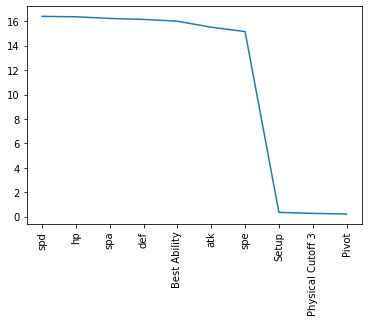

In [39]:
plt.plot(nmf_df.loc[0, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

Really interesting, so our first component is stats and best ability, these generally determine how strong a pokemon is which makes a ton of sense

**Second component:**

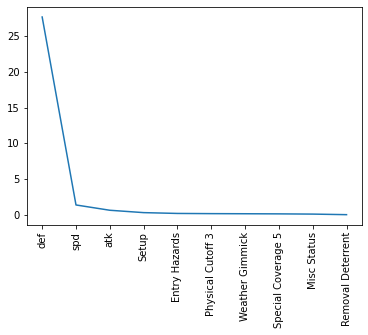

In [40]:
plt.plot(nmf_df.loc[1, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

Second component is just defense, which is more strange.  I wonder if we'll get a lot of other stat components like that (and if it would be wiser to just include a total base stats)

**Third component:**

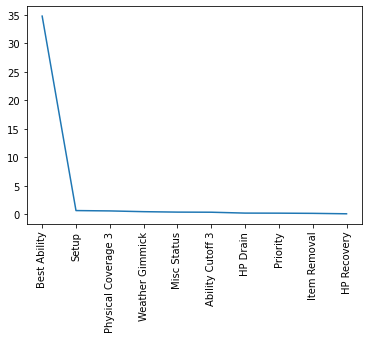

In [41]:
plt.plot(nmf_df.loc[2, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

Oh my, looks like we may just have many mini first components, lol

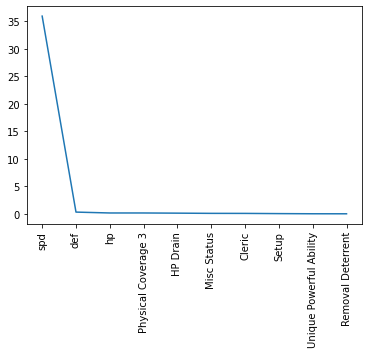

In [42]:
plt.plot(nmf_df.loc[3, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

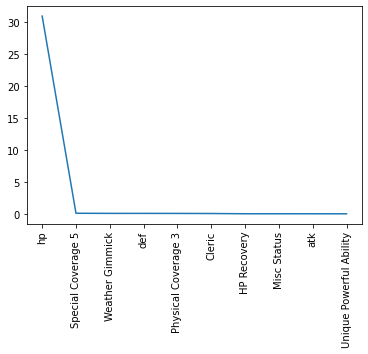

In [43]:
plt.plot(nmf_df.loc[4, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

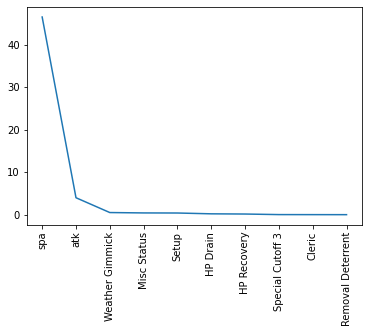

In [44]:
plt.plot(nmf_df.loc[5, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

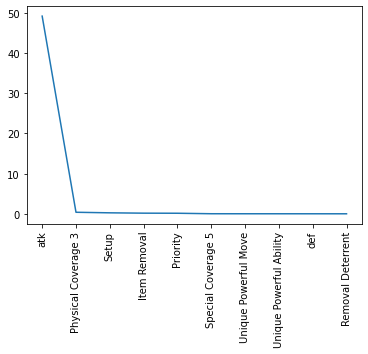

In [45]:
plt.plot(nmf_df.loc[6, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

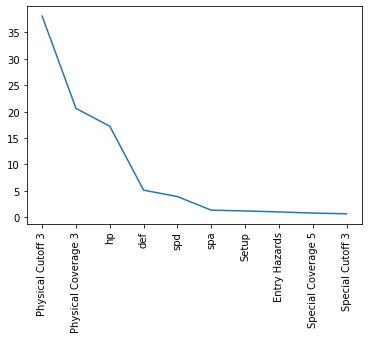

In [46]:
plt.plot(nmf_df.loc[7, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

Finally, an informative feature!  Mainly it's physical cutoff and coverage with significant hp as well, which is odd as you'd think it'd combine with attack, but maybe there's too much overlap there

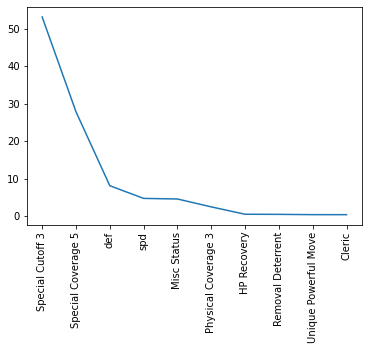

In [47]:
plt.plot(nmf_df.loc[8, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

Special cutoff and coverage, not surprising

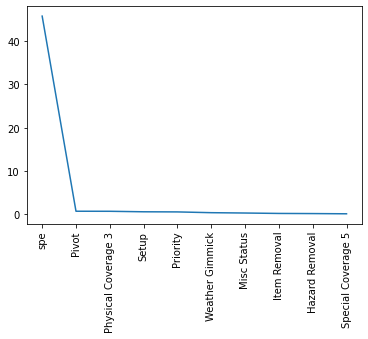

In [48]:
plt.plot(nmf_df.loc[9, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

Ugh, the second speed component.

So yeah, honestly this wasn't very useful, lol.  It mostly just burped stats and obviously useful features back at us.  We can try one more time with total base stats, but I suspect it won't help much

In [50]:
X['Stat Total'] = pokemon_data['hp'] + pokemon_data['atk'] + pokemon_data['def'] + pokemon_data['spa'] + pokemon_data['spd'] + pokemon_data['spe']
nmf_model = NMF(n_components=10, random_state=42, max_iter=20000)
nmf_model.fit(X.drop(columns='Resistance Index'))
nmf_df = pd.DataFrame(nmf_model.components_, columns=X.drop(columns='Resistance Index').columns)
nmf_df

C:\Users\Owner\anaconda3\envs\SecondCapstone\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


,hp,atk,def,spa,spd,spe,Entry Hazards,Hazard Removal,Removal Deterrent,Cleric,...,Physical Cutoff 3,Physical Coverage 3,Special Cutoff 3,Special Coverage 5,Misc Status,Unique Powerful Move,Ability Cutoff 3,Best Ability,Unique Powerful Ability,Stat Total
0,0.824335,0.711379,1.528334,2.338171,4.927571,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,111.180435
1,6.607296,0.000000,0.000000,0.609645,4.524829,0.000000,0.000000,0.042851,0.000000,0.000000,...,0.000000,0.635104,0.000000,0.000000,0.569097,0.000000,0.77347,78.870916,0.000000,4.200654
2,0.702597,2.737379,83.043713,0.000000,0.024398,1.628933,0.601540,0.020373,0.064084,0.000000,...,0.632606,0.000000,0.000000,0.423997,0.289240,0.014775,0.00000,0.134073,0.000000,15.052105
3,0.000000,0.000000,0.000000,0.000000,80.125409,0.000000,0.000000,0.000000,0.042405,0.110424,...,0.000000,0.227551,0.000000,0.000000,0.214995,0.000000,0.00000,0.000000,0.049821,15.434588
4,66.498030,0.006362,0.000000,7.473139,0.000000,0.000000,0.000000,0.000000,0.000000,0.090868,...,0.000000,0.097672,0.000000,0.203240,0.162801,0.000000,0.00000,0.000000,0.032560,11.799866
5,0.000000,20.240717,3.908312,109.727873,0.130540,15.125032,0.000000,0.039189,0.000000,0.000000,...,0.372635,0.000000,0.000000,0.000000,0.787431,0.053059,0.00000,0.000000,0.000000,0.000000
6,0.000000,107.065140,6.135636,0.169704,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.551229,0.000000,0.085683,0.000000,0.055246,0.00000,0.000000,0.002962,0.000000
7,147.294968,0.000000,0.000000,8.193777,11.659611,27.771772,2.560924,0.000000,0.000000,0.000000,...,107.020298,59.707910,4.249541,3.651325,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,5.699481,0.000000,0.000000,0.393500,0.716019,1.173768,...,0.000000,4.555710,73.221574,38.451511,6.674383,0.577008,0.00000,0.000000,0.000000,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000,57.397586,0.000000,0.148919,0.000000,0.000000,...,0.000000,0.590243,0.000000,0.078890,0.237529,0.000000,0.00000,0.000000,0.035259,0.000000


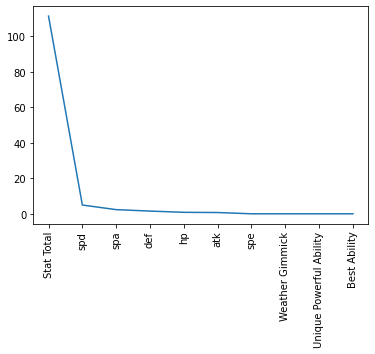

In [51]:
plt.plot(nmf_df.loc[0, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

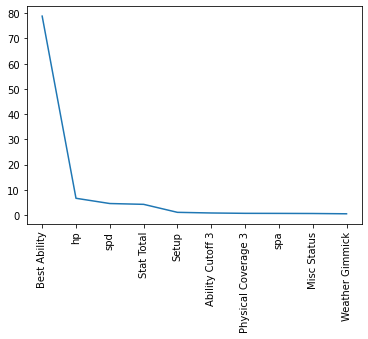

In [52]:
plt.plot(nmf_df.loc[1, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

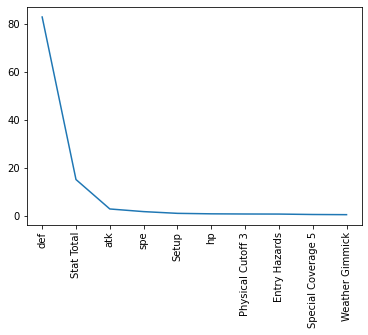

In [53]:
plt.plot(nmf_df.loc[2, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

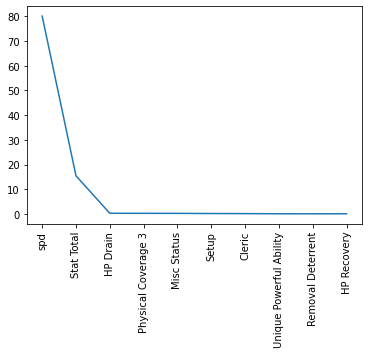

In [54]:
plt.plot(nmf_df.loc[3, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

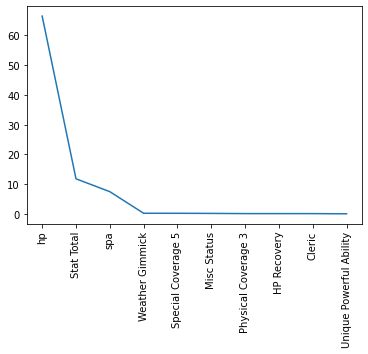

In [55]:
plt.plot(nmf_df.loc[4, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

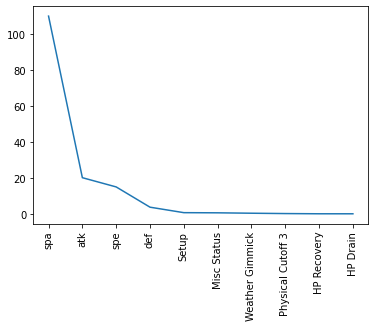

In [56]:
plt.plot(nmf_df.loc[5, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

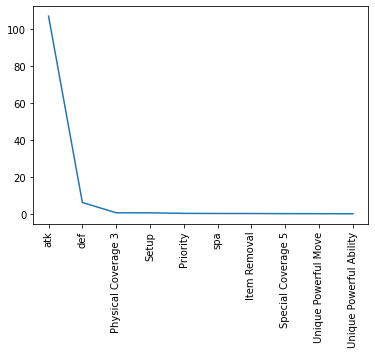

In [57]:
plt.plot(nmf_df.loc[6, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

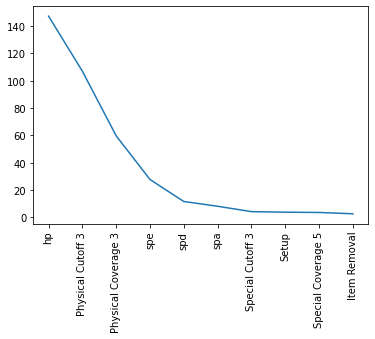

In [58]:
plt.plot(nmf_df.loc[7, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

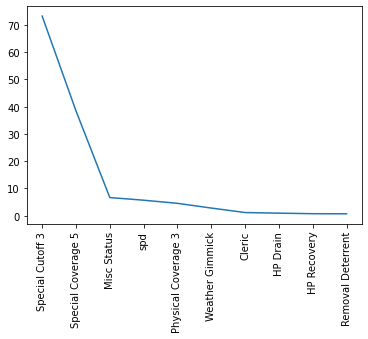

In [59]:
plt.plot(nmf_df.loc[8, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

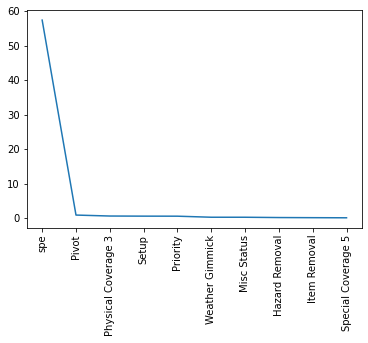

In [60]:
plt.plot(nmf_df.loc[9, :].sort_values(ascending=False).head(10))
plt.xticks(rotation = 90)
plt.show()

It's basically the same thing with total stats.  It's basically just telling us another version of which features of ours are most useful, which I think we already knew but it's interesting to get confirmation from another side

I suppose our FINAL confirmation can be select k best, which is an easy algorithm to run which will tell us more about which features are our best (and which of course we can use in our final pipelines as well)

In [61]:
from sklearn.feature_selection import SelectKBest

In [71]:
selectbest = SelectKBest(k='all')
selectbest.fit(X, y_df['formats'])
bestscores = pd.Series(selectbest.scores_, index=X.columns)
bestscores.sort_values(ascending=False)

Stat Total                 208.404580
atk                         62.354828
spa                         55.661142
spd                         55.328604
hp                          45.615977
def                         39.028021
spe                         33.270012
Physical Cutoff 3           18.769267
Special Cutoff 3            18.419969
Special Coverage 5          18.370227
Physical Coverage 3         15.650758
Unique Powerful Move        13.573435
Resistance Index             7.014395
Misc Status                  4.055003
Setup                        3.760392
Weather Set                  3.261121
Cleric                       2.866726
Ability Cutoff 3             2.854570
Item Removal                 2.492644
Best Ability                 2.228103
Pivot                        2.079269
Unique Powerful Ability      2.008451
HP Recovery                  1.845497
Entry Hazards                1.601962
Priority                     1.496192
Hazard Removal               1.231473
Removal Dete

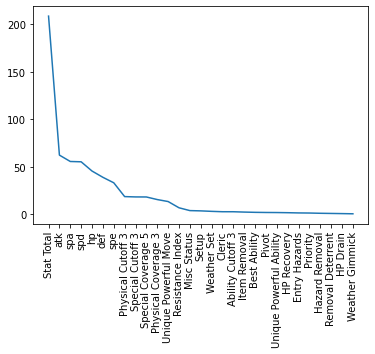

In [73]:
plt.plot(bestscores.sort_values(ascending=False))
plt.xticks(rotation = 90)
plt.show()

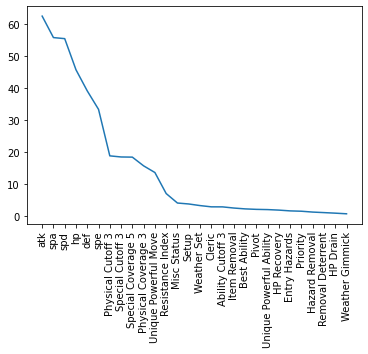

In [74]:
plt.plot(bestscores.sort_values(ascending=False)[1:])
plt.xticks(rotation = 90)
plt.show()

Pretty unsurprising overall.  Our best features are Stat Total, the individual stats, the cutoffs and coverages for moves, unique powerful move (which is a little more surprising actually), and resistance index, and after that it really falls off into largely insignificance.

Let's see if old formats make any difference

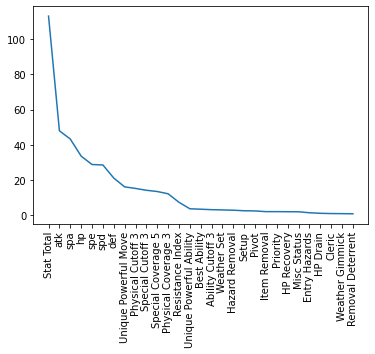

In [76]:
selectbest = SelectKBest(k='all')
selectbest.fit(X, y_df['oldformats'])
bestscores = pd.Series(selectbest.scores_, index=X.columns)
plt.plot(bestscores.sort_values(ascending=False))
plt.xticks(rotation = 90)
plt.show()

Mostly the same

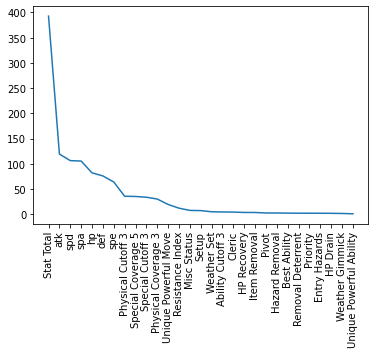

In [77]:
selectbest = SelectKBest(k='all')
selectbest.fit(X, y_df['formats4'])
bestscores = pd.Series(selectbest.scores_, index=X.columns)
plt.plot(bestscores.sort_values(ascending=False))
plt.xticks(rotation = 90)
plt.show()

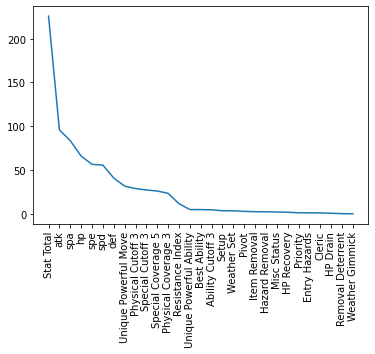

In [78]:
selectbest = SelectKBest(k='all')
selectbest.fit(X, y_df['oldformats4'])
bestscores = pd.Series(selectbest.scores_, index=X.columns)
plt.plot(bestscores.sort_values(ascending=False))
plt.xticks(rotation = 90)
plt.show()

It's mostly the same for the 4's as well

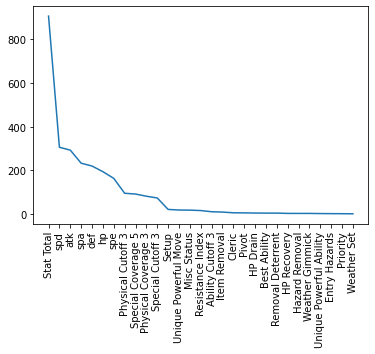

In [79]:
selectbest = SelectKBest(k='all')
selectbest.fit(X, y_df['formats2'])
bestscores = pd.Series(selectbest.scores_, index=X.columns)
plt.plot(bestscores.sort_values(ascending=False))
plt.xticks(rotation = 90)
plt.show()

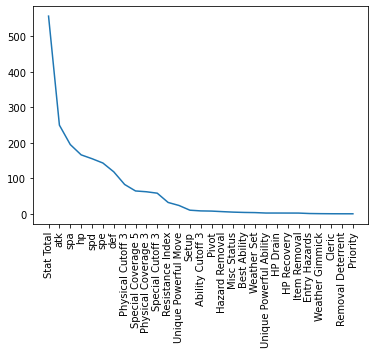

In [80]:
selectbest = SelectKBest(k='all')
selectbest.fit(X, y_df['oldformats2'])
bestscores = pd.Series(selectbest.scores_, index=X.columns)
plt.plot(bestscores.sort_values(ascending=False))
plt.xticks(rotation = 90)
plt.show()

Interesting, for the binary classification, resistance index and unique powerful move fall down a bit (at least for the new formats I modified).  But still it's mostly the same, and mostly not surprising

So, let's do T-SNE next.  It's a great way to visualize high dimensional data.  We can try it with the general X, but I suspect it won't find too much there.  I'm more hopeful of it finding something in stats though, and maybe that could give us a clue as to a useful number of clusters

In [81]:
from sklearn.manifold import TSNE

Perplexity is an important hyperparamter of this algorithm.  I think we'll try 2, 5, 30, 50 and 100 like they do in this distill article: https://distill.pub/2016/misread-tsne/, using a for loop (I may have to go a bit higher for the amount of points I have, so I might throw 250 and 500 in there)

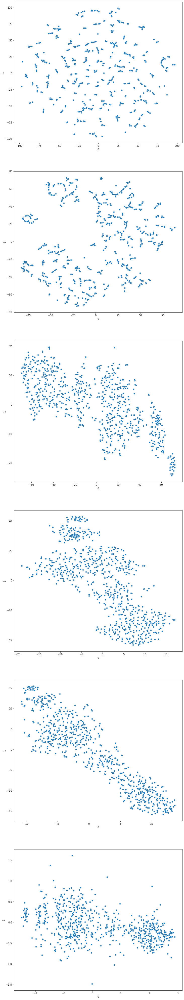

In [86]:
perplexity = [2, 5, 30, 50, 100, 500]

fig, axes = plt.subplots(6, figsize=(12, 12*6))

for p, axis in zip(perplexity, axes):
    tsne = TSNE(n_components=2, perplexity=p, n_iter=1000, random_state=42, method='exact')
    embedded = pd.DataFrame(tsne.fit_transform(X), index=pokemon_data.index)
    sns.scatterplot(ax=axis, x=0, y=1, data=embedded)

plt.show()

- First plot is probably mostly noise, so not much worth worrying about.
- The 2nd one also looks quite noisy.
- The 3rd with 30 perplexity has something like 5 clusters, the middle one being especially large and the right two being relatively small
- The 4th with 40 complexity has perhaps about 4 clusters arranged vertically.  In these last two, with techniques like k means it's definitely possible section one of the larger clusters into smaller mini clusters, but it probably makes the boundaries slightly more arbitrary
- The 100 perplexity 5th chart still vaguely resembles a 4 cluster structure that is somewhat continuous, definitely more smoothed out than the last two, you could arguably say 5 clusters based on the dense cluster at the top left
- Even the 500 perplexity chart is pretty similar, though it looks a bit more like two blobs but it could certainly be cut down

This has actually been an interesting exploration.  It gives me the idea that we should try a lower number of clusters than what we were doing before, since that may be the most natural (something like 4 or 5 with kmeans), but then we can also make it a hyperparameter, as we were going to before, and try some other values like 10, 15, 20, 25, 30, and see how it goes.  Having fewer clusters may have advantages for the models we use (like trees), making the categories easier to work with, while also giving it enough information that has more natural boundaries, but I'm open to more clusters working well of course

Let's try it with stats

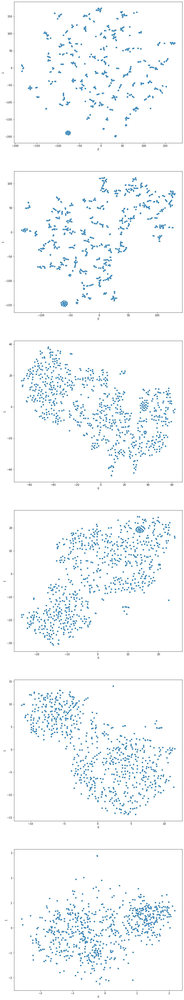

In [87]:
perplexity = [2, 5, 30, 50, 100, 500]

fig, axes = plt.subplots(6, figsize=(12, 12*6))

for p, axis in zip(perplexity, axes):
    tsne = TSNE(n_components=2, perplexity=p, n_iter=5000, random_state=42, method='exact')
    embedded = pd.DataFrame(tsne.fit_transform(pokemon_df.loc[:, ['hp', 'atk', 'def', 'spa', 'spd', 'spe']]), index=pokemon_data.index)
    sns.scatterplot(ax=axis, x=0, y=1, data=embedded)

plt.show()

Something that stands out, especially at lower perplexities, is that you get these tight ball like structures more in this one than with X, it could be meaningful

- 2 perplexity is mostly noise, but we do have that tight ball structure.  It also exists in perplexity 5
- My general impression is that the clusters are more spread out for the most part than with X, but there are a few tighter structures within that (this may support a larger number of natural clusters for kmeans to partition)

I don't think T-SNE will be useful for abilities and learnsets, abilities are too sparse to have meaningful structure, though I guess I could try it for learnsets but I am a little worried about the convergence time

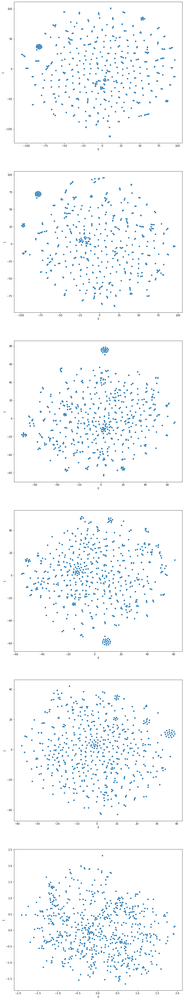

In [88]:
perplexity = [2, 5, 30, 50, 100, 500]

fig, axes = plt.subplots(6, figsize=(12, 12*6))

for p, axis in zip(perplexity, axes):
    tsne = TSNE(n_components=2, perplexity=p, n_iter=1000, random_state=42, method='exact')
    embedded = pd.DataFrame(tsne.fit_transform(pokemon_learnsets_df), index=pokemon_data.index)
    sns.scatterplot(ax=axis, x=0, y=1, data=embedded)

plt.show()

It is actually a pretty interesting structure.  It's mostly a sparse ball, as predicted, but it has these tight miniclusters, and those are interesting since those are probably what the kmeans is finding for the most part, and what it's thereby doing is extracting key commonalities and movesets and abilities is probably more or less the same thing but it's so sparse that I don't see a point in trying it, I think we understand what are clustering is doing there

Now we want to look at a heatmap of our features, to see what mutual correlations they have and whether some therefore might be redundant for the models

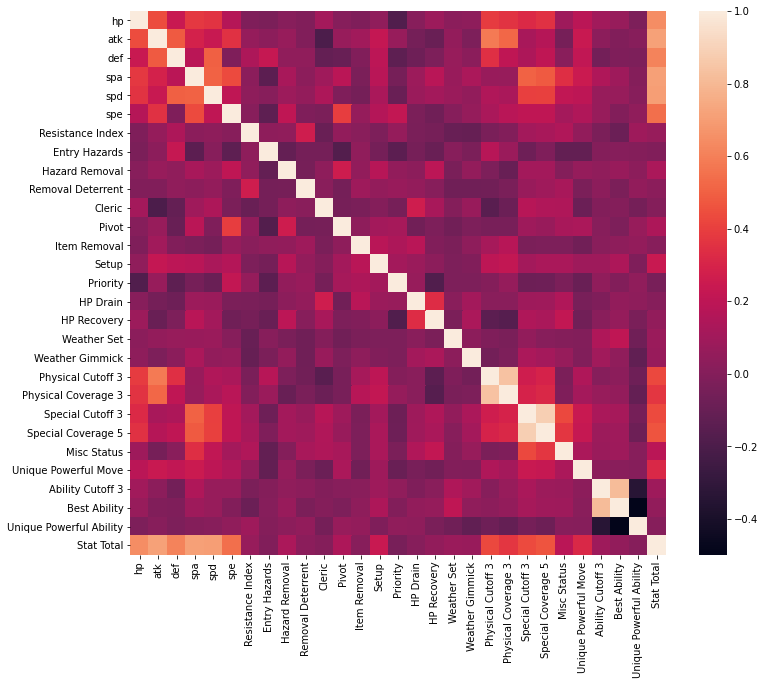

In [89]:
plt.subplots(figsize=(12,10))
sns.heatmap(X.corr());

There really isn't that much of interest here.

- Stats naturally have decently high mutual correlation and all of them have decent correlation with stat total, which could be a reason not to use it (we may try with and without it).  But we certainly need all the stats, since they have tremendous effect on how pokemon can play specific roles
- Speed has a decent correlation with being a pivot (having pivot moves), but those two things don't seem similar enough that I could get rid of one or the other over it
- Naturally attack has decent corr with physical cutoff and coverage, and special stats have decent corr with special cutoff and coverage, but I can't get rid of one or the other since those are our best features (stats and move cutoffs)
- HP Drain and HP recovery have sort of decent correlation, not sure it's enough to remove one but it may be worth considering
- Probably the most important insight: physical cutoff has very high correlation with physical coverage, just as special cutoff has with special coverage, just as ability cutoff has with best ability.  Those are probably the strongest candidate for features to remove, I may not need both cutoff and coverage

A pandas profile report may also give us some interesting information, and I think it's a manageable number of columns this time

In [91]:
profile_report = X.profile_report(html={'style': {'full_width': True}})
profile_report.to_file("pokemon_data_minireport.html")

Summarize dataset:   0%|          | 0/44 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Mostly all it warned us about is the fact that a few of the columns had some zero values, which is totally fine for our purposes in the columns it warned us about (i.e. there should be a few zeroes).  Otherwise, there is nothing noteworthy and even the heatmap was arguably more informative

Now we can try doing scatterplots of each feature against the target feature to see if anything noteworthy pops out:

In [97]:
X_withformats = X.copy()
X_withformats['format codes'] = y_df['format codes']

In [101]:
def scatterplots(columns, ncol=None, figsize=(15, 8)):
    if ncol is None:
        ncol = len(columns)
    nrow = int(np.ceil(len(columns) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, squeeze=False)
    fig.subplots_adjust(wspace=0.5, hspace=0.6)
    for i, col in enumerate(columns):
        ax = axes.flatten()[i]
        ax.scatter(x = col, y = 'format codes', data=X_withformats, alpha=0.5)
        ax.set(xlabel=col, ylabel='competitiveness')
    nsubplots = nrow * ncol    
    for empty in range(i+1, nsubplots):
        axes.flatten()[empty].set_visible(False)

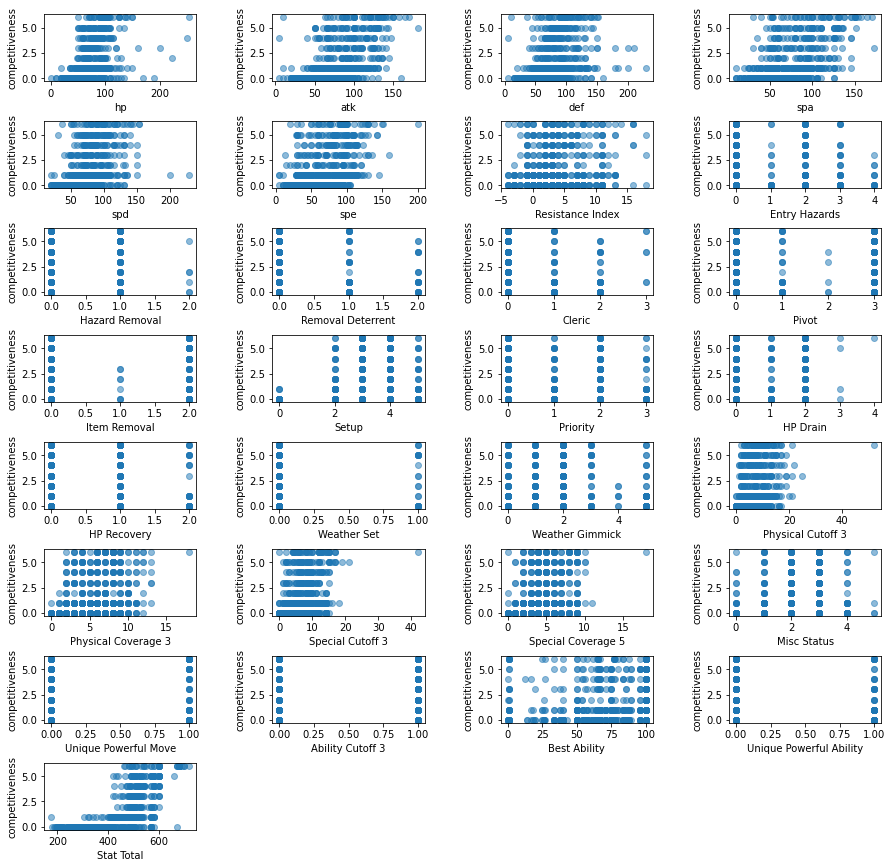

In [102]:
scatterplots(X.columns, ncol=4, figsize=(15, 15))

It's probably good that we looked at this, since some of these features don't seem to be doing that well.  For our best features, you can see their average increasing with their competitiveness.
- But then you have things like Entry Hazards and Hazard Removal.  These may be important aspects of the game, but increases in their values don't seem to correlate that well with competitiveness, with the highest value having the lowest value in some cases! Even removal deterrent isn't doing great at its best value
- Cleric is doing okay, it's just really sparse at its best value
- Pivot actually is one of the best so far outside of the features we already considered good, but it does have that correlation with speed and the 2 value isn't very good, so maybe it's best to throw into the better move cutoffs like physical, special and misc status in some cases
- Item removal just seems really niche and has a strange parabolic shape
- Setup actually seems like a possibly legitimate stand alone feature, you can see higher values correlating to competitiveness whereas low values of this are never competitive
- Priority is not doing so well, with very little differentiation between tiers and the highest value of it seeming the lightest when it comes to high competitive values
- HP Drain and Recovery really don't seem very good either, and I was already considering folding them into more aggregate features so I may do exactly that
- Weather Set is really unique, but maybe I should just consider it a good ability?  As a standalone it doesn't seem super predictive.  Weather Gimmick seems even worse in this regard, with higher values being rather uncompetitive in some cases
- Misc status isn't even great, but it's not terrible and if we fold more into it, maybe that highest value will populated more, plus we need to aggregate information about status moves somewhere so I don't think I can justify getting rid of it

So what I'll probably do is make two versions of my data.  The version I have without getting rid of anything is worth keeping because even though some of these features don't look very useful discretely, they may work better than they appear in combination with other features (or even clusters I haven't put in yet), and that is not well represented by these plots or other things I looked at.  But they really might not be useful and I may imagine my model will detect much subtler things than it really well, or I may just be focusing on them too much even if it will detect them and they ultimately won't be very impactful.  At the end of the day, having two versions of the data is ideal because them it will just be up to performance to decide.

One other thing I might want to try, though it is tedious, it looking at some of my "less useful" features, and encoding them into something like abilities_df for clustering, instead of just having them as separate features. For moves I think this is less necessary, but I'll look at my features and make a judgment about it

Steps left on project (I may do this later during pre-processing, I should wrap up the EDA): possible remaking abilities df for clustering (as well as remaking X even, folding into other features to increase their significance, multiple versions of each, I can set it up during EDA to test for performance later)

not sure whether to include base stat total or not, it's arguably redundant but also arguably useful, since it gives overall pokemon power but doesn't connect to any role directly

interesting insight: low cindex on a feature is especially meaningful because what it shows is that feature is NOT REPRESENTATIVE, meaning most of the pokemon which have that move or ability don't use it thus it doesn't really tell us about those that do use it, making the feature inherently misleading, so that's a good rationale for not using such features that I can actually use later in my report

Also: I thought of a whole different approach for this project lol.  I could even use more columns again (like some of the One Hot Encoded ones), and for my final model, try to cluster the pokemon sensibly (to get the general "sort" that they are) and then add just the most important stats like stats, base stat total, and a few of the features that were most helpful, that may produce the best results.  I can try clustering according to my shrunken columns as well as the full one-hot-encoded one's and see which produces better results, keeping several versions of the data is useful, those are great things to test during pre-preprocessing.  Clusters in combination with stats and typing and cutoffs and things like that could give a very good idea of how good pokemon are within each role.  I was origianally worried that scaling pokemon based on the original 800 column data would neglect the stats too much in the clusters, but I actually kind of LIKE that because it aggregates similar roles without considering stats very much, and then it will rank pokemon within those roles based on their stats, which I think is more like how pokemon are really ranked (like they can each play certain roles, but some do it better because they have better moves or stats or whatever, and then this leads to rankings within roles) and we can include the most important stats in our final model which makes since that has proven the most predictive anyways.

What's great about this, is that clustering already finds tremendous similarities, but then other stats can be used to do fine adjustments within clusters of similar pokemon, which leads to remarkably fine control of the outcome (at least in theory).  Basically, these clusters shrink the space in which the model has to make an assessment, making it a lot easier

ANOTHER IDEA: could make unique clusters for stats, moves, abilities, etc. instead of taking the whole data at once.  Not only does this solve the problem of prioritizing one of those too much relative to the others due to standardized distance within the clustering algorithm, it also gives a lot of really interesting combinations.  It reminds me of NFM which sort of decomposes the data, but in this case I think it might be even better (or I could use something like NMF with this as an alternative to clustering, since all my features are non-negative).  I wonder if algorithms like random forest handle a variety of features that have so many categories like that well though.  According to: https://stackoverflow.com/questions/24715230/can-sklearn-random-forest-directly-handle-categorical-features, random forest won't directly handle categorical features, so I probably don't want to have too many clusters if I go that route (but that doesn't mean it definitely wouldn't work), and there could also be alternatives to explore

So what I'll probably is create several versions of my final data, and then during pre-processing or modeling, test all the different version, optimizing them in every way I can, and really see which one performs the best.  What's nice about that is I don't have to come away from this EDA with a final decision, just several goods ideas and a lot of insight into my data, and let performance decide what wins.  I can even try a few different versions for clustering distancing metrics if I'm not sure how many clusterings would be best

Currently at 1620 cells, pretty crazy